<a href="https://colab.research.google.com/github/EnzoValle-data-science/Riesgo-crediticio/blob/main/IFRS09.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Análisis Comparativo de Modelos de Aprendizaje Supervisados para la Predicción de Riesgo Crediticio (Código orientado a dataset normativa IFRS 09)


#Definicion de variables

* id: Identificación única para cada cuenta o cliente en la base de datos.
* vintage_year: El año en que se originó el préstamo.
* monthly_installment: La cantidad mensual a pagar como parte del préstamo.
* loan_balance: El saldo pendiente del préstamo en el momento de la evaluación.
* bureau_score: Puntaje crediticio del prestatario según los datos del buró de crédito.
* num_bankrupt_iva: Número de bancarrotas e IVA (Impuesto al Valor Agregado) asociados con el prestatario.
* time_since_bankrupt: Tiempo transcurrido desde la última bancarrota del prestatario.
* num_ccj: Número de fallos del tribunal de justicia del condado (County Court Judgements, CCJ) asociados con el prestatario.
* time_since_ccj: Tiempo transcurrido desde el último fallo del tribunal de justicia del condado asociado con el prestatario.
* ccj_amount:Monto total de fallos del tribunal de justicia del condado asociados con el prestatario.
* num_bankrupt:Número total de bancarrotas asociadas con el prestatario.
* num_iva: Número total de acuerdos de voluntarios de la empresa individual (IVA).
* min_months_since_bankrupt: Mínimo de meses transcurridos desde la última bancarrota o acuerdo de voluntarios de la empresa individual (IVA).
* pl_flag: Indicador de préstamo personal (si/no).
* region: Región geográfica del cliente.
* ltv: Relación préstamo-valor (Loan-to-Value).
* arrears_months: Meses de atraso en los pagos.
* origination_date: Fecha de origen del préstamo.
* maturity_date: Fecha de vencimiento del préstamo.
* repayment_type: Tipo de pago del préstamo.
* arrears_status: Estado de los atrasos en los pagos.
* arrears_segment: Segmento de los atrasos en los pagos.
* mob: Meses en la cartera (Months on Book).
* remaining_mat: Tiempo restante hasta el vencimiento del préstamo.
* loan_term: Plazo del préstamo.
* live_status: Estado actual de la cuenta (activo/inactivo).
* repaid_status: Estado de reembolso del préstamo.
* month: Mes en que se registra la información.
* arrears_event: Evento de atraso en los pagos
* bankrupt_event: Evento de bancarrota.
* term_expiry_event: Evento de vencimiento del término.
* worst_arrears_status: Peor estado de los atrasos en los pagos.
* max_arrears_12m: Máximo de atrasos en los pagos en los últimos 12 meses.
* recent_arrears_date: Fecha de los atrasos en los pagos más recientes.
* months_since_2mia: Meses desde los últimos 2 meses de atrasos en los pagos.
* avg_mia_6m: Promedio de meses de atrasos en los pagos en los últimos 6 meses.
* max_arrears_bal_6m: Máximo saldo de atrasos en los pagos en los últimos 6 meses.
* max_mia_6m: Máximo de meses de atrasos en los pagos en los últimos 6 meses.
* avg_bal_6m: Promedio de saldo en los últimos 6 meses.
* avg_bureau_score_6m: Promedio de la puntuación crediticia en los últimos 6 meses.
* cc_util: Utilización actual de la cuenta de crédito.
* annual_income: Ingreso anual del cliente.
* emp_length: Antigüedad laboral del cliente.
* months_since_recent_cc_delinq: número de meses desde el estado de morosidad más reciente
* report date: Fecha en la cual se hizo la predicción de la base de datos original.
* year: Año en la cual se hizo la predicción de la base de datos original.
* quarter: Dia en la cual se hizo la predicción de la base de datos original.
* default_flag: Variable constituida por las columnas arrears_event , bankrupt_event, term_expiry_event
* default_event: Variable constituida por las columnas arrears_event , bankrupt_event, term_expiry_event
* default_indicator: Predicción realizada por Tiziano Bellini


In [ ]:
# Montar Google Drive
from google.colab import drive
drive.mount('/content/drive')



Mounted at /content/drive


In [ ]:
# Importar librerías necesarias
import pandas as pd

# Ruta al archivo en tu Google Drive
file_path = '/content/drive/MyDrive/Colab Notebooks/EDA - ETL TT2/chap2datatree.csv'

# Leer la primera fila para obtener los nombres de las columnas y eliminar las comillas adicionales
with open(file_path, 'r') as file:
    column_names = [name.strip('"') for name in file.readline().strip().split(',')[1:]]

# Leer el resto de las filas para obtener los valores de los datos
data = []
with open(file_path, 'r') as file:
    next(file)  # Saltar la primera fila (nombres de columna)
    for line in file:
        values = line.strip().split(',')
        data.append(values[1:])  # Excluir el primer elemento (número de fila)

# Crear DataFrame
df = pd.DataFrame(data, columns=column_names)

# Mostrar las primeras filas del DataFrame
print(df.head())



        id vintage_year report_date monthly_installment loan_balance  \
0  6670001         2005  2015-09-30               746.7    131304.44   
1  9131199         2006  2015-09-30               887.4    115486.51   
2  4963167         2004  2015-09-30              1008.5    128381.73   
3  3918582         2005  2015-09-30              458.23     35482.96   
4  5949777         2006  2015-09-30               431.2     77086.31   

  bureau_score num_bankrupt_iva time_since_bankrupt num_ccj time_since_ccj  \
0          541                0                   0       0              0   
1          441                0                   0       0              0   
2          282                0                   0       1             36   
3          461                0                   0       0              0   
4          466                0                   0       0              0   

   ... max_mia_6m avg_bal_6m avg_bureau_score_6m cc_util annual_income  \
0  ...          0     13

#Tipos de variables
Se puede observar que todas los campos del archivo CSV son de tipo object, estos tendran que ser transformados para hacer una EDA mas a profundidad.

In [ ]:
print(df.dtypes)


id                               object
vintage_year                     object
report_date                      object
monthly_installment              object
loan_balance                     object
bureau_score                     object
num_bankrupt_iva                 object
time_since_bankrupt              object
num_ccj                          object
time_since_ccj                   object
ccj_amount                       object
num_bankrupt                     object
num_iva                          object
min_months_since_bankrupt        object
pl_flag                          object
region                           object
ltv                              object
arrears_months                   object
origination_date                 object
maturity_date                    object
repayment_type                   object
arrears_status                   object
arrears_segment                  object
mob                              object
remaining_mat                    object


#Campos de tipo fecha y de caracter String

Se puede analizar que report_date el cual es la fecha en la cual el autor de la base de datos realizo la predicción se compone en tres campos "year","quarter","month". Estos campos no aportan información importante para hacer las predicciones mas adelante, por lo cual se optara por eliminar dichas columnas.

In [ ]:
print(df['report_date'].unique())
print(df['year'].unique())
print(df['quarter'].unique())
print(df['month'].unique())
print(df['recent_arrears_date'].unique())
print(df['live_status'].unique())
print(df['repaid_status'].unique())
print(df['region'].unique())
print(df['maturity_date'].unique())
print(df['repayment_type'].unique())
print(df['default_indicator'].unique())
print(df['maturity_date'].unique())
print(df['origination_date'].unique())
print(df['default_event'].unique())
print(df['default_flag'].unique())


['2015-09-30']
['2015']
['3']
['9']
['NA' '2015-09-30' '2015-01-31' '2015-07-31' '2015-06-30' '2015-04-30'
 '2015-08-31' '2015-03-31' '2014-10-31' '2015-05-31' '2014-11-30'
 '2015-02-28' '2014-12-31']
['1']
['0']
['""r_a""' '""r_b""' '""r_c""' '""r_d""' '""r_e""' '""r_f""' '""r_g""'
 '""r_h""' '""r_i""' '""r_l""' '""r_m""' 'NA']
['2040-09-30' '2031-01-31' '2029-12-31' '2023-06-30' '2041-07-31'
 '2015-09-30' '2029-07-31' '2030-09-30' '2042-01-31' '2030-10-31'
 '2037-04-30' '2026-06-30' '2035-12-31' '2027-10-31' '2032-03-31'
 '2030-04-30' '2018-11-30' '2028-04-30' '2035-05-31' '2031-05-31'
 '2036-12-31' '2037-05-31' '2031-11-30' '2036-03-31' '2016-11-30'
 '2036-05-31' '2034-04-30' '2027-08-31' '2027-04-30' '2035-02-28'
 '2032-05-31' '2030-03-31' '2040-06-30' '2027-12-31' '2040-08-31'
 '2033-12-31' '2027-06-30' '2030-07-31' '2036-09-30' '2028-07-31'
 '2042-05-31' '2041-02-28' '2028-09-30' '2032-04-30' '2032-10-31'
 '2029-02-28' '2019-04-30' '2027-05-31' '2022-09-30' '2041-08-31'
 '2028-01

In [ ]:
# Lista de columnas a eliminar
columns_to_drop = ['report_date', 'year', 'quarter', 'month']

# Eliminar las columnas
df = df.drop(columns=columns_to_drop)

# Verificar que las columnas se hayan eliminado
print(df.columns)


Index(['id', 'vintage_year', 'monthly_installment', 'loan_balance',
       'bureau_score', 'num_bankrupt_iva', 'time_since_bankrupt', 'num_ccj',
       'time_since_ccj', 'ccj_amount', 'num_bankrupt', 'num_iva',
       'min_months_since_bankrupt', 'pl_flag', 'region', 'ltv',
       'arrears_months', 'origination_date', 'maturity_date', 'repayment_type',
       'arrears_status', 'arrears_segment', 'mob', 'remaining_mat',
       'loan_term', 'live_status', 'repaid_status', 'arrears_event',
       'bankrupt_event', 'term_expiry_event', 'worst_arrears_status',
       'max_arrears_12m', 'recent_arrears_date', 'months_since_2mia',
       'avg_mia_6m', 'max_arrears_bal_6m', 'max_mia_6m', 'avg_bal_6m',
       'avg_bureau_score_6m', 'cc_util', 'annual_income', 'emp_length',
       'months_since_recent_cc_delinq', 'default_event', 'default_flag',
       'default_indicator'],
      dtype='object')


#Cambiar NA por NaN
se necesita cambiar los NA por NaN, debido a que Pandas reconoce estas siglas.

In [ ]:
import pandas as pd
import numpy as np

# Reemplazar "NA" con NaN en todo el DataFrame
df.replace("NA", np.nan, inplace=True)

# Contar los valores nulos en cada columna
missing_values = df.isna().sum()

# Mostrar los resultados
print(missing_values)


id                                   0
vintage_year                         0
monthly_installment                  0
loan_balance                         0
bureau_score                       433
num_bankrupt_iva                   433
time_since_bankrupt                433
num_ccj                            433
time_since_ccj                     433
ccj_amount                         433
num_bankrupt                       433
num_iva                            433
min_months_since_bankrupt          433
pl_flag                              0
region                               1
ltv                                  0
arrears_months                       0
origination_date                     0
maturity_date                        0
repayment_type                       0
arrears_status                       0
arrears_segment                      0
mob                                  0
remaining_mat                        0
loan_term                            0
live_status              

#Normalización de algunos campos
Se debe normalizar algunos campos debido a que algunos resultados contienen doble comillas en los resultados, ensuciando los datos.
Tambien se debera transformar algunas columnas a tipo Fecha.

In [ ]:
# Eliminar comillas adicionales en ciertas columnas
columns_to_clean = ['region','repayment_type','default_indicator']

for column in columns_to_clean:
    df[column] = df[column].str.replace('"', '')

# Convertir columnas de fecha a objetos de fecha
date_columns = ['origination_date', 'maturity_date','recent_arrears_date']
for column in date_columns:
    df[column] = pd.to_datetime(df[column])

# Eliminar comilla adicional en la columna 'months_since_recent_cc_delinq'
df['months_since_recent_cc_delinq'] = df['months_since_recent_cc_delinq'].str.replace('"', '')

# Mostrar los primeros valores para verificar
print(df.head())


        id vintage_year monthly_installment loan_balance bureau_score  \
0  6670001         2005               746.7    131304.44          541   
1  9131199         2006               887.4    115486.51          441   
2  4963167         2004              1008.5    128381.73          282   
3  3918582         2005              458.23     35482.96          461   
4  5949777         2006               431.2     77086.31          466   

  num_bankrupt_iva time_since_bankrupt num_ccj time_since_ccj ccj_amount  ...  \
0                0                   0       0              0          0  ...   
1                0                   0       0              0          0  ...   
2                0                   0       1             36        459  ...   
3                0                   0       0              0          0  ...   
4                0                   0       0              0          0  ...   

  max_mia_6m avg_bal_6m avg_bureau_score_6m cc_util annual_income emp_leng

In [ ]:
print(df['recent_arrears_date'].unique())
print(df['live_status'].unique())
print(df['repaid_status'].unique())
print(df['region'].unique())
print(df['maturity_date'].unique())
print(df['repayment_type'].unique())
print(df['default_indicator'].unique())
print(df['maturity_date'].unique())
print(df['origination_date'].unique())

<DatetimeArray>
[                'NaT', '2015-09-30 00:00:00', '2015-01-31 00:00:00',
 '2015-07-31 00:00:00', '2015-06-30 00:00:00', '2015-04-30 00:00:00',
 '2015-08-31 00:00:00', '2015-03-31 00:00:00', '2014-10-31 00:00:00',
 '2015-05-31 00:00:00', '2014-11-30 00:00:00', '2015-02-28 00:00:00',
 '2014-12-31 00:00:00']
Length: 13, dtype: datetime64[ns]
['1']
['0']
['r_a' 'r_b' 'r_c' 'r_d' 'r_e' 'r_f' 'r_g' 'r_h' 'r_i' 'r_l' 'r_m' nan]
<DatetimeArray>
['2040-09-30 00:00:00', '2031-01-31 00:00:00', '2029-12-31 00:00:00',
 '2023-06-30 00:00:00', '2041-07-31 00:00:00', '2015-09-30 00:00:00',
 '2029-07-31 00:00:00', '2030-09-30 00:00:00', '2042-01-31 00:00:00',
 '2030-10-31 00:00:00',
 ...
 '2042-06-30 00:00:00', '2022-12-16 00:00:00', '2042-08-31 00:00:00',
 '2027-01-15 00:00:00', '2026-10-14 00:00:00', '2028-04-22 00:00:00',
 '2025-12-06 00:00:00', '2022-02-26 00:00:00', '2031-01-03 00:00:00',
 '2027-09-08 00:00:00']
Length: 336, dtype: datetime64[ns]
['Non-IO' 'IO']
['NO' 'YES']
<Datetime

In [ ]:
df.sample(5)

,id,vintage_year,monthly_installment,loan_balance,bureau_score,num_bankrupt_iva,time_since_bankrupt,num_ccj,time_since_ccj,ccj_amount,...,max_mia_6m,avg_bal_6m,avg_bureau_score_6m,cc_util,annual_income,emp_length,months_since_recent_cc_delinq,default_event,default_flag,default_indicator
23692,7127064,2006,728.83,192576.17,452,0,0,0,0,0,...,0,192578,486,0.5353,56229,4,5,1,0,YES
16778,4882284,2004,169.5,42988.87,255,0,0,3,19,12266,...,0,42980,230,0.4941,73538,5,10,0,1,NO
20744,6704103,2005,493.1,60292.91,417,0,0,0,0,0,...,0,61172,358,0.7612,79021,6,10,0,1,NO
6562,6319877,2004,316.7,38342.18,253,0,0,0,0,0,...,0,38940,252,0.5014,71439,7,9,0,1,NO
7598,6319391,2006,802.29,217384.17,241,0,0,0,0,0,...,0,217382,246,0.5623,81860,8,10,0,1,NO


#Aplicar ONE HOT ENCODING

Se aplicara One Hot Encoding para pasar variables tipo string a numericas, esto con la intencion de poder visualizar su comportamiento en la matriz de correlación, ademas que para los algoritmos de aprendizaje automatica la mayoria trabaja con numeros.

In [ ]:
# Aplicar codificación one-hot a la columna 'region'
df = pd.get_dummies(df, columns=['region'], prefix='region')
# Aplicar codificación one-hot a la columna 'repayment_type'
df = pd.get_dummies(df, columns=['repayment_type'], prefix='repayment')


In [ ]:
# Imprimir las primeras filas del DataFrame
print(df.head())


        id vintage_year monthly_installment loan_balance bureau_score  \
0  6670001         2005               746.7    131304.44          541   
1  9131199         2006               887.4    115486.51          441   
2  4963167         2004              1008.5    128381.73          282   
3  3918582         2005              458.23     35482.96          461   
4  5949777         2006               431.2     77086.31          466   

  num_bankrupt_iva time_since_bankrupt num_ccj time_since_ccj ccj_amount  ...  \
0                0                   0       0              0          0  ...   
1                0                   0       0              0          0  ...   
2                0                   0       1             36        459  ...   
3                0                   0       0              0          0  ...   
4                0                   0       0              0          0  ...   

  region_r_d region_r_e region_r_f region_r_g region_r_h region_r_i  \
0  

#Convertir campos tipo object a Numerica

Se convertira las columnas a tipo numéricas para poder hacer el EDA mas a fondo, esto ayudara a ver la matriz de correlación.

In [ ]:
# Convertir columnas a tipos numéricos
numeric_columns = ['vintage_year', 'monthly_installment', 'loan_balance', 'bureau_score', 'num_bankrupt_iva', 'time_since_bankrupt', 'num_ccj', 'time_since_ccj', 'ccj_amount', 'num_bankrupt', 'num_iva', 'min_months_since_bankrupt','ltv', 'arrears_months', 'mob', 'remaining_mat', 'loan_term','max_arrears_12m', 'months_since_2mia', 'avg_mia_6m', 'max_arrears_bal_6m', 'max_mia_6m', 'avg_bal_6m', 'avg_bureau_score_6m', 'cc_util', 'annual_income', 'emp_length', 'months_since_recent_cc_delinq','id','pl_flag','arrears_status','arrears_segment','arrears_event','bankrupt_event','term_expiry_event','worst_arrears_status']

df[numeric_columns] = df[numeric_columns].apply(pd.to_numeric, errors='coerce')


#Normalizar variable objetivo a numerica
Se debe convertir la columna default_indicator a numerica para poder visualizar en la matriz de correlacion su comportamiento ademas de que los algoritmos aprenden con variables numericas.

* YES = 1 (DEFAULT)
* NO = 0

In [ ]:
# Reemplaza "YES" por 1 y "NO" por 0 en la columna "default_indicator"
df["default_indicator"] = df["default_indicator"].map({"YES": 1, "NO": 0})

In [ ]:
print(df.dtypes)

id                                        int64
vintage_year                              int64
monthly_installment                     float64
loan_balance                            float64
bureau_score                            float64
num_bankrupt_iva                        float64
time_since_bankrupt                     float64
num_ccj                                 float64
time_since_ccj                          float64
ccj_amount                              float64
num_bankrupt                            float64
num_iva                                 float64
min_months_since_bankrupt               float64
pl_flag                                   int64
ltv                                     float64
arrears_months                          float64
origination_date                 datetime64[ns]
maturity_date                    datetime64[ns]
arrears_status                            int64
arrears_segment                           int64
mob                                     

#Matriz de correlación

“live_status” solo contiene el valor 1 y “repaid_status” solo contiene el valor 0 en el conjunto de datos, entonces estas columnas son constantes y no varían. Las variables que son constantes (es decir, tienen el mismo valor para todas las observaciones) no proporcionan ninguna información útil para un análisis de correlación, ya que no hay variación que correlacionar con otras variables. Por lo tanto, a menudo se excluyen de las matrices de correlación.


Se puede visualizar las columnas con mayor correlación, lo cual nos ayudaria a seleccionar estas columnas para ver su comportamiento y hacer el respectivo analisis.


Las columnas arrears_event, bankrup_event, term_expiry_event, months_since_2mia, max_arrears_12m, cc_util son las que mas correlacionan con la variable objetivo la cual seria la columna default_indicator, esto indicaria que cuando se hagan las predicciones estan variables influirian mas que las otras columnas. Se tendra que hacer experimentos para ver que tanto influyen estas.

Las columnas las cuales se le aplico ONE-HOT Encoding no seran necesarias para la prediccion del default, debido a que no se correlacionan con gran importancia con default_indicator y no aporta informacion importante.

Segun Tiziano Bellini las columnas default_event y default_flag se componen de otras 3 columnas provenientes de la base de datos las cuales serian arrears_event, bankrup_event y term_expiry_event, al momento de que alguno de estos valores contenga un 1, automaticamente estas 2 columnas de default que serian como advertencias de un posible default_indicator se le asigna un 1. En la matriz de correlacion se puede observar que se comportan de igual manera que la default_indicator cuando se correlacionan con otras variables, por lo cual se optara solo por dejar la columna llamada default_indicator la cual es el target.


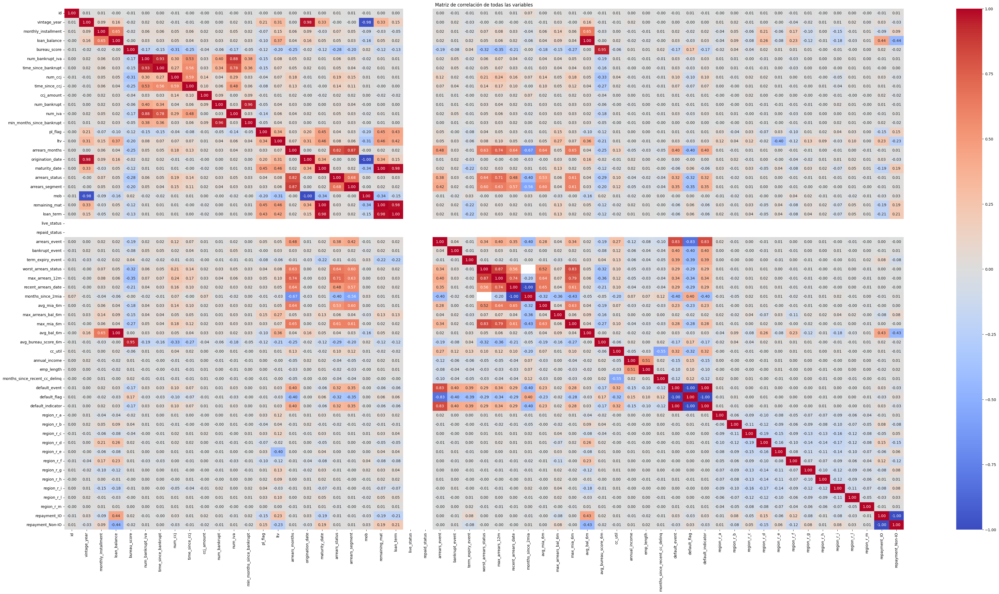

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calcular la matriz de correlación para todas las variables
correlation_matrix = df.corr()

# Visualizar la matriz de correlación utilizando un mapa de calor
plt.figure(figsize=(50, 25))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matriz de correlación de todas las variables')
plt.show()


#Eliminación de columnas

In [ ]:
# Lista de columnas a eliminar
columns_to_drop = ['default_flag','default_event','region_r_a','region_r_b','region_r_c','region_r_d','region_r_e','region_r_f','region_r_g','region_r_h','region_r_i','region_r_l','region_r_m','repayment_IO','repayment_Non-IO']

# Eliminar las columnas
df = df.drop(columns=columns_to_drop)

# Verificar que las columnas se hayan eliminado
print(df.columns)


Index(['id', 'vintage_year', 'monthly_installment', 'loan_balance',
       'bureau_score', 'num_bankrupt_iva', 'time_since_bankrupt', 'num_ccj',
       'time_since_ccj', 'ccj_amount', 'num_bankrupt', 'num_iva',
       'min_months_since_bankrupt', 'pl_flag', 'ltv', 'arrears_months',
       'origination_date', 'maturity_date', 'arrears_status',
       'arrears_segment', 'mob', 'remaining_mat', 'loan_term', 'live_status',
       'repaid_status', 'arrears_event', 'bankrupt_event', 'term_expiry_event',
       'worst_arrears_status', 'max_arrears_12m', 'recent_arrears_date',
       'months_since_2mia', 'avg_mia_6m', 'max_arrears_bal_6m', 'max_mia_6m',
       'avg_bal_6m', 'avg_bureau_score_6m', 'cc_util', 'annual_income',
       'emp_length', 'months_since_recent_cc_delinq', 'default_indicator'],
      dtype='object')


In [ ]:
# Estadísticas descriptivas
print(df.describe())


                 id  vintage_year  monthly_installment   loan_balance  \
count  2.590600e+04  25906.000000         25906.000000   25906.000000   
mean   5.533868e+06   2005.451401           558.759584   99355.147751   
min    1.000104e+06   2001.000000             0.010000       0.180000   
25%    3.258474e+06   2005.000000           373.200000   59141.695000   
50%    5.565006e+06   2006.000000           503.200000   85676.755000   
75%    7.801641e+06   2006.000000           679.052500  124149.960000   
max    9.999931e+06   2015.000000          5181.400000  983843.660000   
std    2.603951e+06      1.320182           312.430452   67746.919113   

       bureau_score  num_bankrupt_iva  time_since_bankrupt       num_ccj  \
count  25473.000000      25473.000000         25473.000000  25473.000000   
mean     391.556550          0.047187             2.350018      0.146901   
min     -125.000000          0.000000             0.000000      0.000000   
25%      307.000000          0.000000 

#Informacion de histogramas
* Distribución de bankrupt_event: El histograma de la columna “bankrupt_event” que significa “Evento de bancarrota” muestra una distribución binaria con dos valores posibles: 0 y 1. La gran mayoría de las observaciones tienen un valor de 0, lo que indica que no ocurrió un evento de bancarrota, mientras que un número muy pequeño de observaciones tiene un valor de 1, lo que indica que sí ocurrió un evento de bancarrota.

* Distribución de term_expiry_event: El histograma titulado “Distribución de term_expiry_event”, que se traduce como “Evento de vencimiento del término”, muestra una vez más una distribución binaria con dos valores posibles: 0 y 1. Al igual que con las variables anteriores, la gran mayoría de las observaciones tienen un valor de 0, lo que indica que no hubo un evento de vencimiento del término, mientras que un número mucho menor de observaciones tiene un valor de 1, indicando que sí ocurrió tal evento.

* Distribución de arrears_event: El histograma de la columna “arrears_event”, que significa “Evento de atraso en los pagos”, muestra también una distribución binaria con dos valores posibles: 0 y 1. La mayoría de las observaciones tienen un valor de 0, lo que indica que no hubo un atraso en los pagos, mientras que un número menor de observaciones tiene un valor de 1, indicando que sí hubo un atraso.

* Distribución de monthly_installment: La mayoría de los valores de “monthly_installment” parecen estar concentrados en el rango de 0 a 2000. Esto podría indicar que la mayoría de los clientes tienen cuotas mensuales relativamente bajas. Sin embargo, también hay algunos clientes con cuotas mensuales más altas, como se puede ver en la cola larga del histograma.

* Distribución de loan_balance: Al igual que con “monthly_installment”, la mayoría de los valores de “loan_balance” también están concentrados en el extremo inferior del rango. Esto podría indicar que la mayoría de los clientes tienen saldos de préstamos relativamente bajos. Sin embargo, también hay algunos clientes con saldos de préstamos más altos, como se puede ver en la cola larga del histograma.

* Distribución de bureau_score: Este histograma muestra la distribución de los puntajes crediticios del buró. La mayoría de los puntajes parecen estar concentrados en el rango de 0 a 600. Esto podría indicar que la mayoría de los clientes tienen puntajes crediticios relativamente bajos. Sin embargo, también hay algunos clientes con puntajes crediticios más altos, como se puede ver en la cola larga del histograma.

* Distribución de ltv (Loan-to-Value): Este histograma muestra la distribución de la relación préstamo-valor. La mayoría de los valores de ltv parecen estar concentrados en el rango de 0.0 a 1.0. Esto podría indicar que la mayoría de los préstamos tienen una relación préstamo-valor relativamente baja, lo que significa que el valor del préstamo es bajo en comparación con el valor de la propiedad. Sin embargo, también hay algunos préstamos con una relación préstamo-valor más alta, como se puede ver en la cola larga del histograma.

* Distribución de arrears_months: Este histograma muestra que la mayoría de los valores de “arrears_months” son cero. Esto indica que la mayoría de los clientes no tienen atrasos en sus pagos. Sin embargo, hay algunos clientes que tienen uno o más meses de atraso en sus pagos, como se puede ver en las barras más pequeñas del histograma.

* Distribución de avg_bureau_score_6m: Este histograma muestra una distribución más uniforme de los puntajes crediticios promedio en los últimos 6 meses. La mayoría de los puntajes parecen estar concentrados en el rango de 0 a 700. Esto podría indicar que los puntajes crediticios de los clientes varían ampliamente, con algunos clientes teniendo puntajes crediticios bajos y otros teniendo puntajes crediticios altos.

* Distribución de cc_util: Este histograma muestra la distribución de la utilización de la cuenta de crédito. La mayoría de los valores de “cc_util” parecen estar concentrados en el rango de 0.2 a 0.8. Esto podría indicar que la mayoría de los clientes utilizan una cantidad moderada de su crédito disponible. Sin embargo, también hay algunos clientes que utilizan una cantidad mayor o menor de su crédito disponible, como se puede ver en las colas del histograma.

* Distribución de annual_income: Este histograma muestra la distribución de los ingresos anuales. La mayoría de los ingresos anuales parecen estar concentrados en el rango de 20000 a 80000. Esto podría indicar que la mayoría de los clientes tienen ingresos anuales en este rango. Sin embargo, también hay algunos clientes con ingresos anuales más altos o más bajos, como se puede ver en las colas del histograma.

* Distribución de num_ccj: Este histograma muestra la distribución del número de fallos del tribunal de justicia del condado (CCJ) asociados con el prestatario. La mayoría de los valores de “num_ccj” son cero, lo que indica que la mayoría de los clientes no tienen fallos del tribunal de justicia del condado. Sin embargo, hay algunos clientes que tienen uno o más CCJs, como se puede ver en las barras más pequeñas del histograma.

* Distribución de loan_term: Este histograma muestra la distribución del plazo del préstamo. Los valores de “loan_term” parecen estar distribuidos de manera más uniforme en comparación con “num_ccj”. Esto podría indicar que los plazos de los préstamos varían ampliamente entre los clientes.

* Distribución de max_arrears_12m: Este histograma muestra la distribución del número máximo de atrasos en los pagos en los últimos 12 meses. La mayoría de los valores de “max_arrears_12m” son cero, lo que indica que la mayoría de los clientes no tienen atrasos en sus pagos en los últimos 12 meses. Sin embargo, hay algunos clientes que tienen uno o más meses de atraso en sus pagos, como se puede ver en las barras más pequeñas del histograma.

* Distribución de max_arrears_bal_6m: Este histograma muestra la distribución del saldo máximo de atrasos en los pagos en los últimos 6 meses. La mayoría de los valores de “max_arrears_bal_6m” están cerca de cero, lo que indica que la mayoría de los clientes no tienen un saldo de atrasos significativo en los últimos 6 meses. Sin embargo, hay algunos clientes que tienen un saldo de atrasos más alto, como se puede ver en las barras más pequeñas del histograma.

* Distribución de months_since_2mia: El histograma titulado “Distribución de months_since_2mia” muestra la frecuencia de los meses transcurridos desde los últimos dos meses consecutivos de retrasos en los pagos. La barra más alta está en el valor 0, lo que indica que la mayoría de los casos no han tenido retrasos recientes en los pagos. A medida que aumenta el número de meses, la frecuencia disminuye, lo que sugiere que hay menos casos con retrasos más antiguos en los pagos.

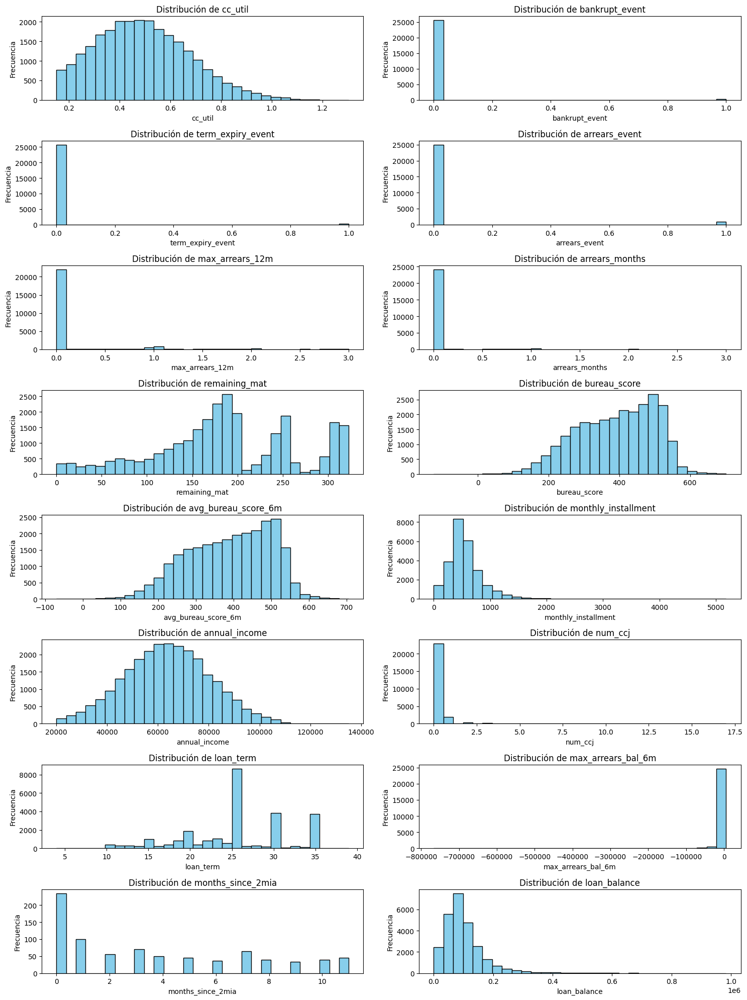

In [ ]:
import matplotlib.pyplot as plt

# Características a visualizar en histogramas
features = [
    'cc_util', 'bankrupt_event', 'term_expiry_event', 'arrears_event',
    'max_arrears_12m', 'arrears_months', 'remaining_mat', 'bureau_score',
    'avg_bureau_score_6m', 'monthly_installment', 'annual_income', 'num_ccj',
    'loan_term', 'max_arrears_bal_6m', 'months_since_2mia', 'loan_balance', 'ltv'
]

# Crear subplots para los histogramas
fig, axes = plt.subplots(nrows=8, ncols=2, figsize=(15, 20))

# Iterar sobre las características y trazar histogramas
for feature, ax in zip(features, axes.flatten()):
    ax.hist(df[feature], bins=30, color='skyblue', edgecolor='black')
    ax.set_title(f'Distribución de {feature}')
    ax.set_xlabel(feature)
    ax.set_ylabel('Frecuencia')

# Ajustar el espaciado entre subplots
plt.tight_layout()
plt.show()


#Valores Atipicos

Los valores atípicos en el conjunto de datos representan observaciones que, aunque inusuales, son cruciales para una evaluación precisa del riesgo crediticio. Variables como la cuota mensual (monthly_installment), el saldo del préstamo (loan_balance), el puntaje crediticio (bureau_score), y el número de fallos del tribunal (num_ccj),Utilización actual de la cuenta de crédito (cc_util). son indicadores directos del comportamiento financiero y la capacidad de pago de los clientes. Eliminar estos valores podría llevar a una subrepresentación de casos de alto riesgo, distorsionando así la realidad del perfil de riesgo de la cartera de clientes. Además, estos valores atípicos proporcionan información valiosa sobre extremos de comportamiento que son esenciales para la calibración y la robustez de nuestros modelos de predicción. Por lo tanto, se decidió mantener estos valores para asegurar un análisis y modelado más preciso y representativo.

In [ ]:
from collections import Counter

def detect_outliers(df, n, features):
    outlier_indices = []
    # Iterar sobre las características (columnas)
    for col in features:
        # Primer cuartil (25%)
        Q1 = np.percentile(df[col], 25)
        # Tercer cuartil (75%)
        Q3 = np.percentile(df[col], 75)
        # Rango intercuartílico (IQR)
        IQR = Q3 - Q1
        # Paso para valores atípicos
        outlier_step = 1.5 * IQR
        # Determinar una lista de índices de valores atípicos para la característica col
        outlier_list_col = df[(df[col] < Q1 - outlier_step) | (df[col] > Q3 + outlier_step)].index
        # Agregar los índices de valores atípicos encontrados para col a la lista de índices de valores atípicos
        outlier_indices.extend(outlier_list_col)

    # Seleccionar observaciones que contienen más de 'n' valores atípicos
    outlier_indices = Counter(outlier_indices)
    multiple_outliers = [k for k, v in outlier_indices.items() if v > n]
    return multiple_outliers

# Detectar valores atípicos en las características especificadas
features_to_check = ['monthly_installment', 'loan_balance', 'bureau_score', 'ltv', 'arrears_months', 'avg_bureau_score_6m', 'cc_util', 'annual_income','num_ccj','loan_term','max_arrears_12m','max_arrears_bal_6m','months_since_2mia']
outliers_indices = detect_outliers(df, 2, features_to_check)

# Mostrar las filas con valores atípicos
print(df.loc[outliers_indices])



            id  vintage_year  monthly_installment  loan_balance  bureau_score  \
61     4221098          2006              1537.11     209038.72         208.0   
147    8748632          2006              1529.60     385926.31         298.0   
283    9849729          2007              2208.60     561304.44         247.0   
466    3995512          2005              1184.10     210099.65         419.0   
698    4114756          2004              1209.30     147834.20         450.0   
...        ...           ...                  ...           ...           ...   
22366  4951187          2007               620.70     158469.79         316.0   
22685  9306959          2006               382.80      98182.00         366.0   
23834  2970446          2004               464.60     117791.04         340.0   
25079  7104087          2005               645.80      83702.83         259.0   
25800  9053636          2005               554.80      88187.26         385.0   

       num_bankrupt_iva  ti

#Boxplots columnas con mayor relevancia

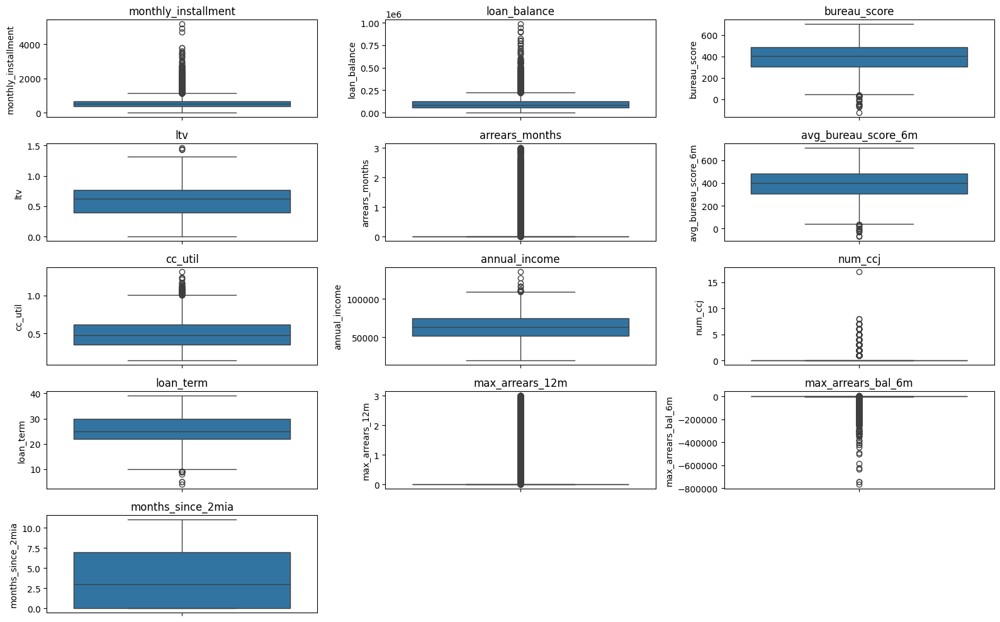

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Definir el número de subgráficos basado en la cantidad de características a visualizar
num_features = len(features_to_check)
num_rows = (num_features // 3) + (num_features % 3 > 0)  # Redondear hacia arriba
num_cols = min(num_features, 3)

# Boxplots de las características con valores atípicos
plt.figure(figsize=(16, 10))
for i, feature in enumerate(features_to_check):
    plt.subplot(num_rows, num_cols, i + 1)
    sns.boxplot(y=df[feature], orient="v")
    plt.title(feature)
plt.tight_layout()
plt.show()


#Histogramas con 2 variables
* Histogramas en la diagonal principal: Los gráficos en la diagonal principal son histogramas que muestran la distribución de una sola variable. Por ejemplo, el histograma para “bureau_score” muestra cómo se distribuyen los puntajes crediticios del buró entre los clientes.

* Gráficos de dispersión fuera de la diagonal principal: Los gráficos fuera de la diagonal principal son gráficos de dispersión que muestran la relación entre dos variables. Por ejemplo, el gráfico de dispersión en la primera fila y la segunda columna muestra la relación entre “bureau_score” (puntaje crediticio del buró) y “loan_balance” (saldo del préstamo).

* Relación entre bureau_score y monthly_installment: Los puntos parecen estar dispersos sin un patrón claro, lo que sugiere que no hay una correlación fuerte entre el puntaje crediticio del buró (bureau_score) y la cantidad mensual a pagar como parte del préstamo (monthly_installment). Esto podría indicar que el puntaje crediticio del buró no tiene un impacto directo en la cantidad que los clientes deben pagar cada mes.


* Relación entre loan_balance y monthly_installment: Los puntos muestran una tendencia ascendente, lo que sugiere una correlación positiva entre el saldo pendiente del préstamo (loan_balance) y la cantidad mensual a pagar como parte del préstamo (monthly_installment). Esto tiene sentido, ya que los clientes con saldos de préstamos más altos probablemente tendrán pagos mensuales más altos.

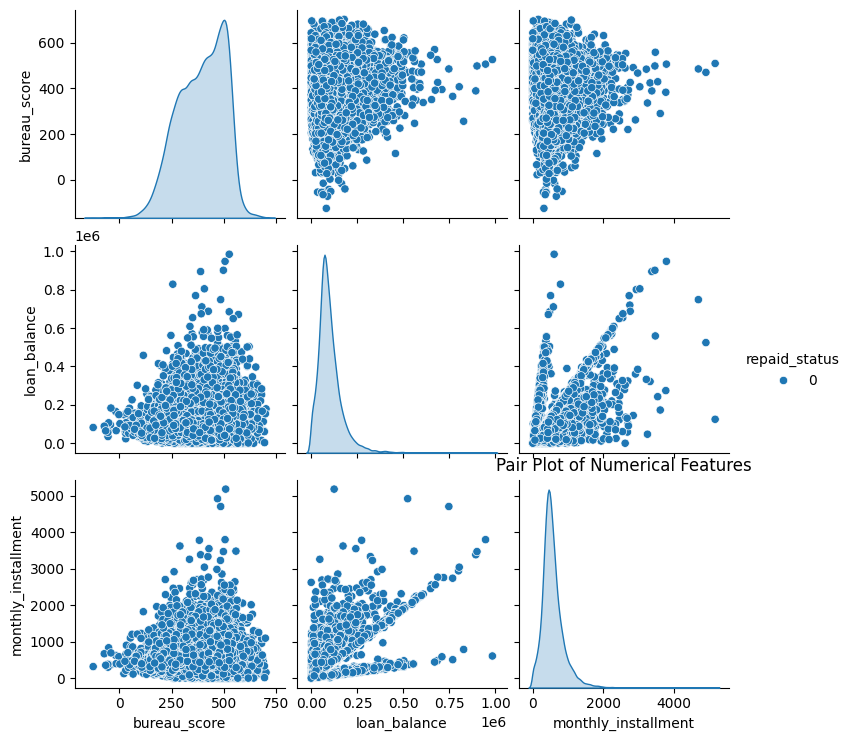

In [ ]:
sns.pairplot(df[['bureau_score', 'loan_balance', 'monthly_installment', 'repaid_status']], hue='repaid_status', diag_kind='kde')
plt.title('Pair Plot of Numerical Features')
plt.show()


#PROCESO ETL

Como primer paso sera la eliminacion de nulls, Se aplicara una estrategia de que si hay un valor de proporcion de nulos en el conjunto del 5% o menos se eliminaran debido a que no afectara al conjunto de datos. Se puede observar que la columna months_since_2mia contiene un 96% de valores nulls.


In [ ]:
# Proporción de valores nulos en las variables relacionadas
variables_with_nans = ['bureau_score', 'num_bankrupt_iva', 'time_since_bankrupt', 'num_ccj', 'time_since_ccj',
                       'ccj_amount', 'num_bankrupt', 'num_iva', 'min_months_since_bankrupt','months_since_2mia']

# Calcular la proporción de nulos para cada variable
null_percentages = df[variables_with_nans].isnull().mean() * 100
print(null_percentages)

# Filtrar las variables que tienen menos del 5% de nulos
variables_to_drop_nans = null_percentages[null_percentages < 5].index.tolist()

# Eliminar filas con nulos en las variables seleccionadas
df_cleaned = df.dropna(subset=variables_to_drop_nans)

# Verificar que se eliminaron los valores nulos en las variables especificadas
print(df_cleaned[variables_to_drop_nans].isnull().sum())


bureau_score                  1.671427
num_bankrupt_iva              1.671427
time_since_bankrupt           1.671427
num_ccj                       1.671427
time_since_ccj                1.671427
ccj_amount                    1.671427
num_bankrupt                  1.671427
num_iva                       1.671427
min_months_since_bankrupt     1.671427
months_since_2mia            96.857871
dtype: float64
bureau_score                 0
num_bankrupt_iva             0
time_since_bankrupt          0
num_ccj                      0
time_since_ccj               0
ccj_amount                   0
num_bankrupt                 0
num_iva                      0
min_months_since_bankrupt    0
dtype: int64


months_since_2mia tiene un 96% de valores nulls, ademas la documentación original no explica el valor de este mismo como por ejemplo : "NO DISPONIBLE", "NUNCA OCURRIO", "PERDIDA DE INFORMACION", etc, es dificil saber el sentido de esta información, tampoco se puede decir que no hay retrasos en los pagos (valor 0) debido a que este resultado si existe.

Por ende a pesar de que es una columna que influye en default_indicator, todavia existen otras columnas que tienen la misma esencia solo con diferencia de tiempo.

Se optara por eliminar dicha columna para seguir con el proceso ETL y el modelado de los modelos.

In [ ]:
print(df['months_since_2mia'].unique())

[nan  0.  8.  2.  3.  5.  1.  6. 11.  4. 10.  7.  9.]


Se puede observar que el tamaño del conjunto de datos sigue siendo considerable.

In [ ]:
# Tamaño del conjunto de datos original
original_size = df.shape[0]

# Tamaño del conjunto de datos después de la limpieza
cleaned_size = df_cleaned.shape[0]

print(f"Tamaño original del conjunto de datos: {original_size}")
print(f"Tamaño del conjunto de datos después de la limpieza: {cleaned_size}")
print(f"Porcentaje de datos eliminados: {(original_size - cleaned_size) / original_size * 100:.2f}%")


Tamaño original del conjunto de datos: 25906
Tamaño del conjunto de datos después de la limpieza: 25473
Porcentaje de datos eliminados: 1.67%


Verificacion de duplicados e eliminacion.

In [ ]:
# Verificar duplicados
duplicates = df_cleaned[df_cleaned.duplicated()]

# Mostrar los duplicados
print("Duplicados antes de eliminarlos:")
print(duplicates)

# Eliminar duplicados
df_cleaned = df_cleaned.drop_duplicates()

# Verificar nuevamente que no hay duplicados
duplicates_after = df_cleaned[df_cleaned.duplicated()]
print("Duplicados después de eliminarlos:")
print(duplicates_after)

# Mostrar tamaño del dataframe después de eliminar duplicados
print("Tamaño del dataframe después de eliminar duplicados:", df_cleaned.shape)


Duplicados antes de eliminarlos:
Empty DataFrame
Columns: [id, vintage_year, monthly_installment, loan_balance, bureau_score, num_bankrupt_iva, time_since_bankrupt, num_ccj, time_since_ccj, ccj_amount, num_bankrupt, num_iva, min_months_since_bankrupt, pl_flag, ltv, arrears_months, origination_date, maturity_date, arrears_status, arrears_segment, mob, remaining_mat, loan_term, live_status, repaid_status, arrears_event, bankrupt_event, term_expiry_event, worst_arrears_status, max_arrears_12m, recent_arrears_date, months_since_2mia, avg_mia_6m, max_arrears_bal_6m, max_mia_6m, avg_bal_6m, avg_bureau_score_6m, cc_util, annual_income, emp_length, months_since_recent_cc_delinq, default_indicator]
Index: []

[0 rows x 42 columns]
Duplicados después de eliminarlos:
Empty DataFrame
Columns: [id, vintage_year, monthly_installment, loan_balance, bureau_score, num_bankrupt_iva, time_since_bankrupt, num_ccj, time_since_ccj, ccj_amount, num_bankrupt, num_iva, min_months_since_bankrupt, pl_flag, ltv, 

#Eliminacion de columnas de Fecha y algunos nulls faltantes
Se decidio eliminar las columnas que son de tipo Fecha tomando como referencia la matriz de correlacion, estas no afectan de manera importante en la predicción.

Ademas se eliminan algunos nulls faltantes, es importante no tener nulls para que los modelos puedan trabajar correctamente.

In [ ]:
date_columns = df_cleaned.select_dtypes(include=['datetime64']).columns
df_cleaned = df_cleaned.drop(columns=date_columns)
df_cleaned.drop(columns=["months_since_2mia"], inplace=True)

In [ ]:
df_cleaned.replace(-9999, float("NaN"), inplace=True)


In [ ]:
df_cleaned.dropna(subset=["avg_mia_6m", "max_arrears_bal_6m", "max_mia_6m", "avg_bal_6m", "avg_bureau_score_6m"], inplace=True)


In [ ]:
valores_nulos = df_cleaned.isna().sum()
# Mostrar los resultados
print(valores_nulos)

id                               0
vintage_year                     0
monthly_installment              0
loan_balance                     0
bureau_score                     0
num_bankrupt_iva                 0
time_since_bankrupt              0
num_ccj                          0
time_since_ccj                   0
ccj_amount                       0
num_bankrupt                     0
num_iva                          0
min_months_since_bankrupt        0
pl_flag                          0
ltv                              0
arrears_months                   0
arrears_status                   0
arrears_segment                  0
mob                              0
remaining_mat                    0
loan_term                        0
live_status                      0
repaid_status                    0
arrears_event                    0
bankrupt_event                   0
term_expiry_event                0
worst_arrears_status             0
max_arrears_12m                  0
avg_mia_6m          

#Desequilibrio de datos en variable TARGET

Se puede observar mediante este grafico que hay un problema en la distribucion de los datos, la clase mayoritaria es la que obtiene casi todos los datos del conjunto de datos, en el caso de la clase minoritaria (default) se observa que contiene mucho menos datos que la clase mayoritaria. Para obordar este problema se utilizara la tecnica SMOTE.

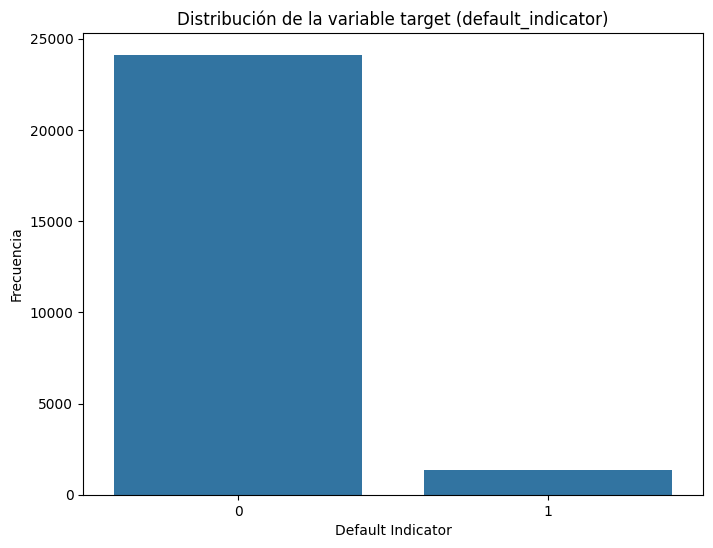

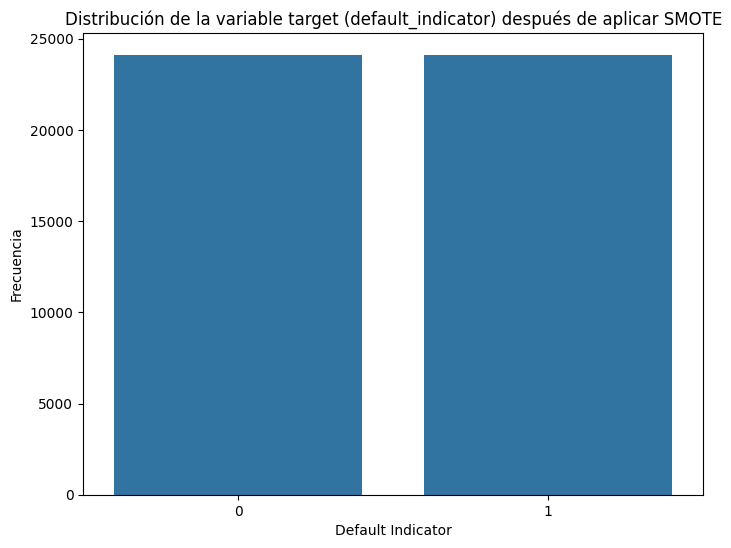

In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Visualiza la distribución de la variable target
plt.figure(figsize=(8, 6))
sns.countplot(x='default_indicator', data=df_cleaned)
plt.title('Distribución de la variable target (default_indicator)')
plt.xlabel('Default Indicator')
plt.ylabel('Frecuencia')
plt.show()

# Separa las características y la variable target
X = df_cleaned.drop(columns=['default_indicator'])
y = df_cleaned['default_indicator']

# Aplica SMOTE
smote = SMOTE(random_state=123)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Crea un DataFrame con los datos resampleados
df_resampled = pd.DataFrame(X_resampled, columns=X.columns)
df_resampled['default_indicator'] = y_resampled

# Copia los datos resampleados a otro DataFrame para pruebas adicionales
df_resampled_test = df_resampled.copy()

# Visualiza la distribución de la variable target después de aplicar SMOTE
plt.figure(figsize=(8, 6))
sns.countplot(x='default_indicator', data=df_resampled)
plt.title('Distribución de la variable target (default_indicator) después de aplicar SMOTE')
plt.xlabel('Default Indicator')
plt.ylabel('Frecuencia')
plt.show()


In [ ]:
conteo_valores_unicos1 = df_cleaned['default_indicator'].value_counts()
conteo_valores_unicos2 = df_resampled['default_indicator'].value_counts()

print(conteo_valores_unicos1)

print(conteo_valores_unicos2)

default_indicator
0    24130
1     1336
Name: count, dtype: int64
default_indicator
0    24130
1    24130
Name: count, dtype: int64


#Matriz de correlación en DF con SMOTE y sin Smote

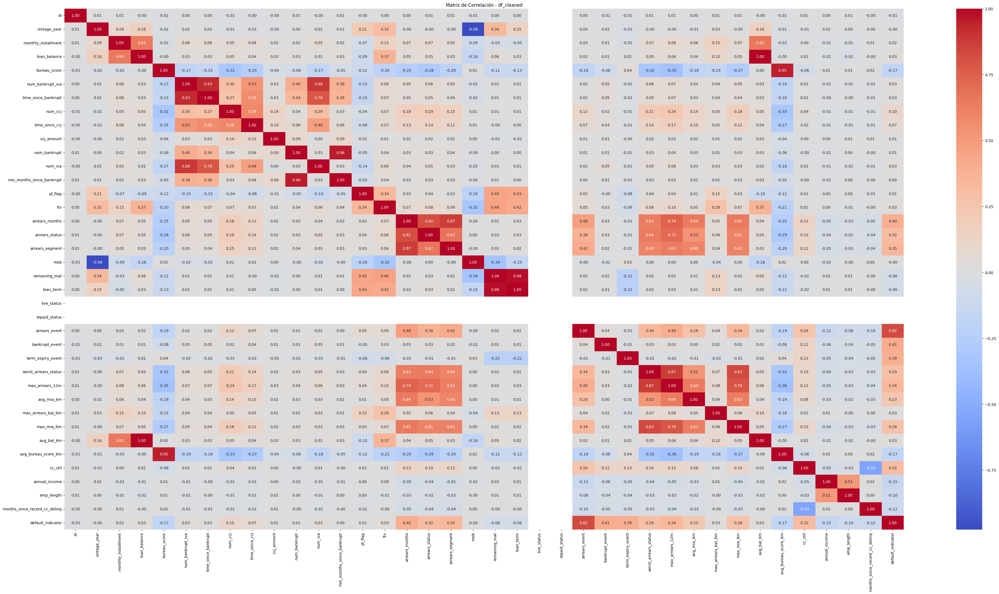

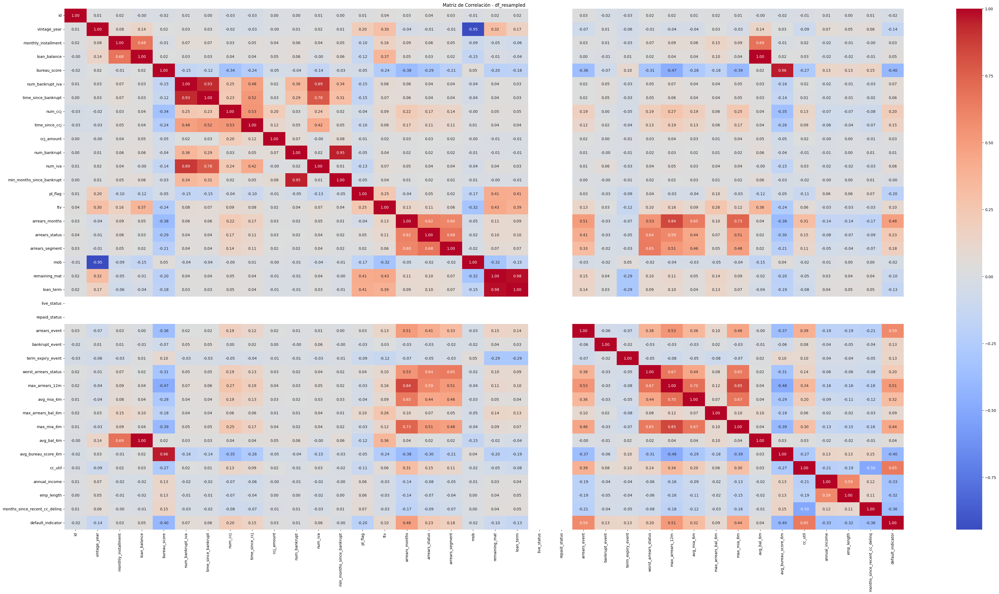

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Asumiendo que df_cleaned y df_resampled ya están definidos

# Calcula la matriz de correlación para df_cleaned
correlation_matrix_cleaned = df_cleaned.corr()

# Configura el tamaño de la figura para df_cleaned
plt.figure(figsize=(50, 25))

# Crea el mapa de calor para df_cleaned utilizando seaborn
sns.heatmap(correlation_matrix_cleaned, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matriz de Correlación - df_cleaned')
plt.show()

# Calcula la matriz de correlación para df_resampled
correlation_matrix_resampled = df_resampled.corr()

# Configura el tamaño de la figura para df_resampled
plt.figure(figsize=(50, 25))

# Crea el mapa de calor para df_resampled utilizando seaborn
sns.heatmap(correlation_matrix_resampled, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matriz de Correlación - df_resampled')
plt.show()


In [ ]:
#Extrae la correlación de todas las variables con 'loan_status'
correlacion_loan_status = correlation_matrix_cleaned['default_indicator']

#Ordena las correlaciones en orden descendente de valor absoluto
correlaciones_ordenadas = correlacion_loan_status.abs().sort_values(ascending=False)

correlacion_loan_status2 = correlation_matrix_resampled['default_indicator']
#Ordena las correlaciones en orden descendente de valor absoluto
correlaciones_ordenadas2 = correlacion_loan_status2.abs().sort_values(ascending=False)

#Imprime las correlaciones ordenadas
print(correlaciones_ordenadas)
#Imprime las correlaciones ordenadas
print(correlaciones_ordenadas2)

default_indicator                1.000000
arrears_event                    0.823698
bankrupt_event                   0.406612
arrears_months                   0.395446
term_expiry_event                0.390309
arrears_segment                  0.346158
max_arrears_12m                  0.336426
arrears_status                   0.318381
cc_util                          0.315827
worst_arrears_status             0.285172
max_mia_6m                       0.281829
avg_mia_6m                       0.228238
bureau_score                     0.171432
avg_bureau_score_6m              0.168946
annual_income                    0.147593
months_since_recent_cc_delinq    0.116821
num_ccj                          0.104915
emp_length                       0.097846
time_since_ccj                   0.069852
loan_term                        0.064283
remaining_mat                    0.060929
ltv                              0.031854
num_bankrupt_iva                 0.029981
loan_balance                     0

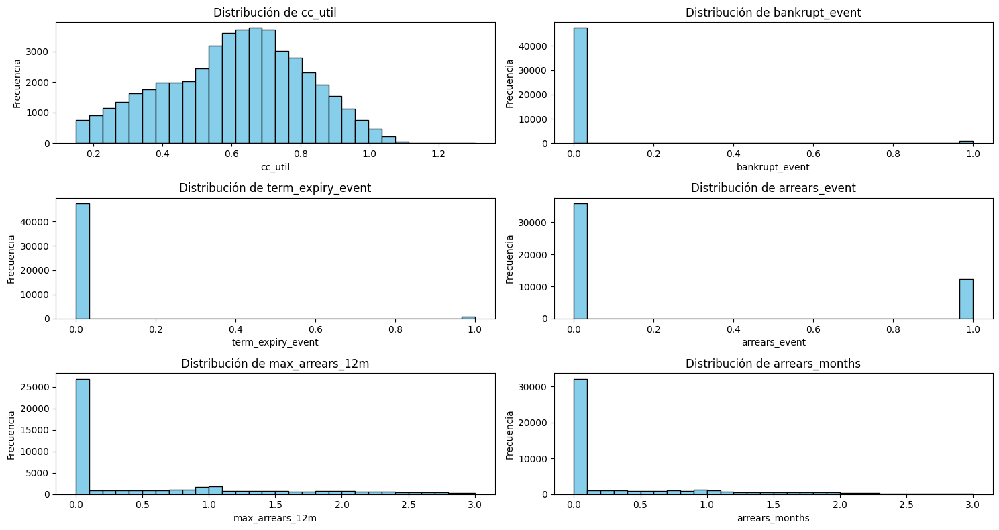

In [ ]:
import matplotlib.pyplot as plt

# Características a visualizar en histogramas
features = ['cc_util', 'bankrupt_event', 'term_expiry_event', 'arrears_event','max_arrears_12m','arrears_months','remaining_mat']

# Crear subplots para los histogramas
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 8))

# Iterar sobre las características y trazar histogramas
for feature, ax in zip(features, axes.flatten()):
    ax.hist(df_resampled[feature], bins=30, color='skyblue', edgecolor='black')
    ax.set_title(f'Distribución de {feature}')
    ax.set_xlabel(feature)
    ax.set_ylabel('Frecuencia')

# Ajustar el espaciado entre subplots
plt.tight_layout()
plt.show()


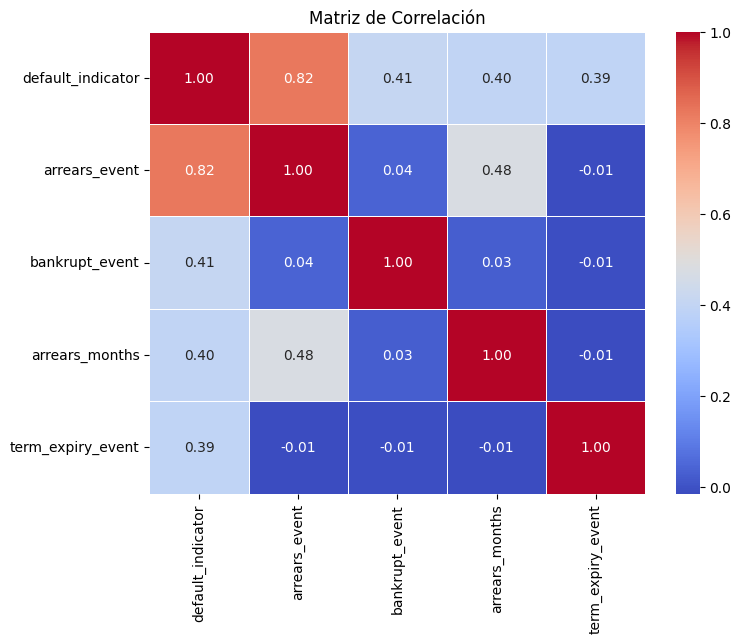

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Selecciona las columnas específicas
columns_of_interest = ['default_indicator', 'arrears_event', 'bankrupt_event', 'arrears_months','term_expiry_event']
df_selected = df_cleaned[columns_of_interest]

# Calcula la matriz de correlación
correlation_matrix = df_selected.corr()

# Muestra la matriz de correlación como un mapa de calor
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Matriz de Correlación')
plt.show()


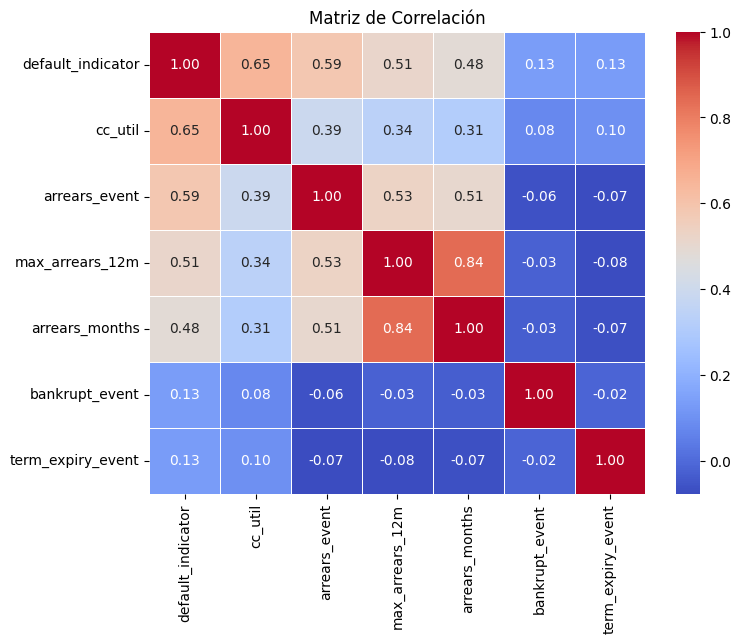

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Selecciona las columnas específicas
columns_of_interest = ['default_indicator','cc_util', 'arrears_event', 'max_arrears_12m', 'arrears_months','bankrupt_event','term_expiry_event']
df_selected = df_resampled[columns_of_interest]

# Calcula la matriz de correlación
correlation_matrix = df_selected.corr()

# Muestra la matriz de correlación como un mapa de calor
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Matriz de Correlación')
plt.show()


#Entrenamientos modelos de aprendizaje automatico con todas las columnas


# Random forest con smote y sin smote


Random Forest con SMOTE

Exactitud del entrenamiento: 100.00%
Exactitud de la prueba: 98.70%
Precision del entrenamiento: 100.00%
Precision de la prueba: 98.78%
Recall del entrenamiento: 100.00%
Recall de la prueba: 98.62%
F1 score del entrenamiento: 100.00%
F1 score de la prueba: 98.70%
CV scores: [0.98523699 0.98795649 0.98601399 0.98614169 0.98562362]
Mean CV score: 0.9861945549162229
Train AUC: 1.0
Test AUC: 0.9992163062046687
[0.01229643 0.01007026 0.01042116 0.01073477 0.02689166 0.00604255
 0.00266254 0.02639287 0.0156783  0.01170516 0.00039898 0.00610391
 0.0003281  0.01353136 0.01184623 0.09685329 0.00933617 0.00147897
 0.01208306 0.02257451 0.02746339 0.         0.         0.09475293
 0.01228978 0.01197111 0.00830235 0.1156323  0.01971942 0.05741289
 0.04985987 0.01064852 0.03166862 0.16866608 0.03006044 0.01614964
 0.03797236]


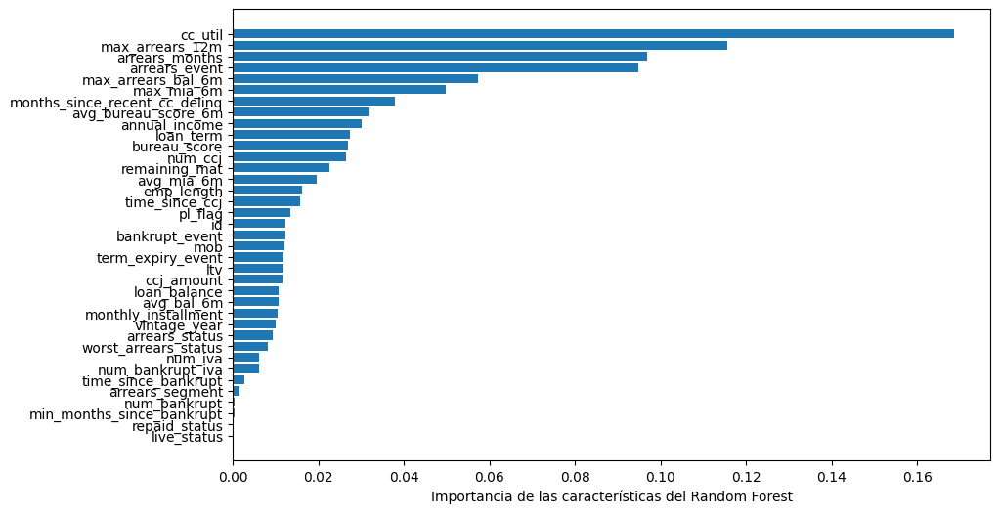

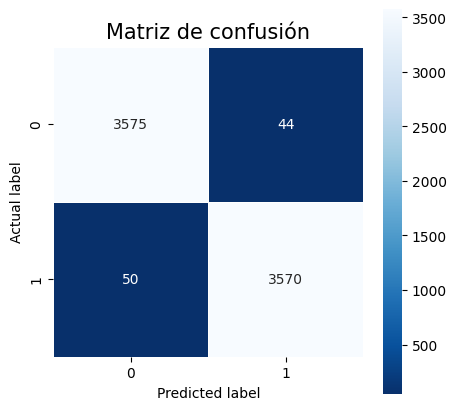

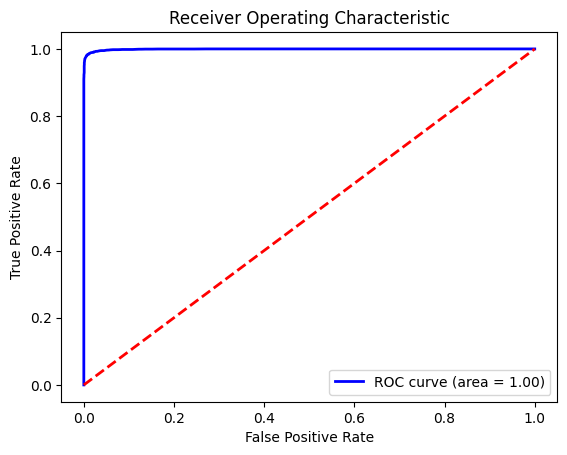

La predicción para la persona con ID 6670001 es: 0


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Divide los datos resampleados en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_resampled, test_size=0.2, random_state=123, stratify=df_resampled['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Entrena el modelo de Random Forest
rf_model = RandomForestClassifier(n_estimators=100, max_features=4, random_state=123)
rf_model.fit(train.drop(columns=['default_indicator']), train['default_indicator'])

# Realiza las predicciones
train_preds = rf_model.predict(train.drop(columns=['default_indicator']))
test_preds = rf_model.predict(test.drop(columns=['default_indicator']))

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores = cross_val_score(rf_model, train.drop(columns=['default_indicator']), train['default_indicator'], cv=5)
print(f'CV scores: {cv_scores}')
print(f'Mean CV score: {cv_scores.mean()}')

# Calcula AUC-ROC
train_probs = rf_model.predict_proba(train.drop(columns=['default_indicator']))[:, 1]
test_probs = rf_model.predict_proba(test.drop(columns=['default_indicator']))[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_probs)
test_auc = roc_auc_score(test['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Analiza la importancia de las características
importances = rf_model.feature_importances_
print(importances)

# Visualiza la importancia de las características
plt.figure(figsize=(10, 6))
sorted_idx = rf_model.feature_importances_.argsort()
plt.barh(train.drop(columns=['default_indicator']).columns[sorted_idx], rf_model.feature_importances_[sorted_idx])
plt.xlabel("Importancia de las características del Random Forest")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size = 15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 6670001

# Localiza la fila de datos para esa persona
person_data = df_resampled[df_resampled['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Haz la predicción utilizando tu modelo de Random Forest
prediction = rf_model.predict(person_data)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')



Random Forest sin SMOTE

Exactitud del entrenamiento: 100.00%
Exactitud de la prueba: 100.00%
Precision del entrenamiento: 100.00%
Precision de la prueba: 100.00%
Recall del entrenamiento: 100.00%
Recall de la prueba: 100.00%
F1 score del entrenamiento: 100.00%
F1 score de la prueba: 100.00%
CV scores: [0.9997546  1.         1.         0.99975454 1.        ]
Mean CV score: 0.9999018284437297
Train AUC: 1.0
Test AUC: 1.0
[9.59757269e-03 3.69340148e-03 1.00013894e-02 1.03485124e-02
 1.17667885e-02 5.42578707e-04 2.22868026e-03 2.10660924e-03
 3.59215819e-03 2.92291613e-03 1.74062206e-04 5.26666245e-04
 1.52251262e-04 1.71871966e-03 1.05041965e-02 4.11579301e-02
 1.71387232e-02 1.69684838e-02 8.86620327e-03 3.99254579e-02
 1.70146063e-02 0.00000000e+00 0.00000000e+00 4.04382533e-01
 1.13861182e-01 8.04448264e-02 1.00136561e-02 2.09984320e-02
 4.38135120e-03 1.46372805e-02 6.69235386e-03 1.04899458e-02
 1.24672564e-02 6.44655129e-02 2.64622249e-02 9.01302943e-03
 1.07425076e-02]


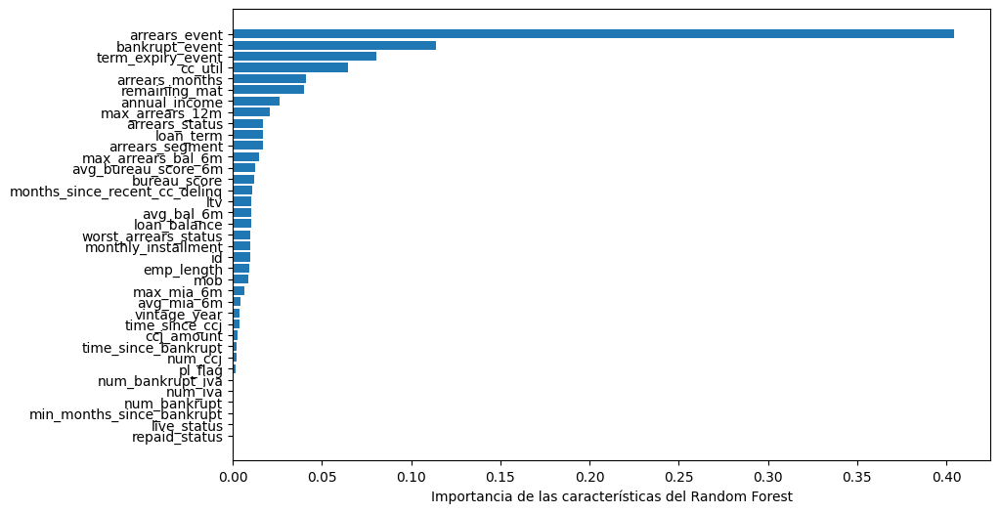

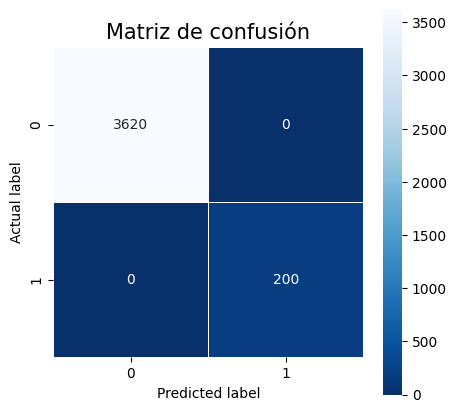

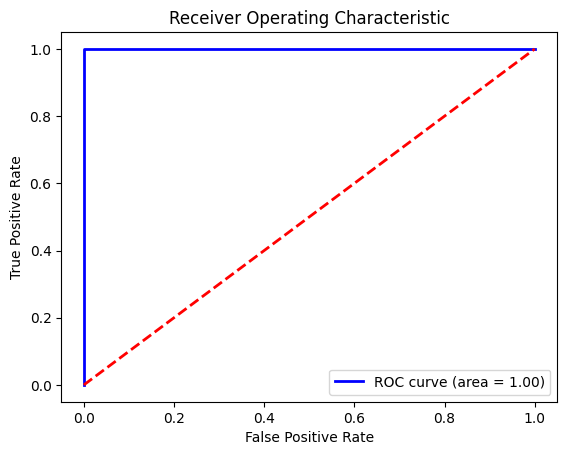

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_cleaned, test_size=0.2, random_state=123, stratify=df_cleaned['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Entrena el modelo de Random Forest
rf_model = RandomForestClassifier(n_estimators=100, max_features=4, random_state=123)
rf_model.fit(train.drop(columns=['default_indicator']), train['default_indicator'])

# Realiza las predicciones
train_preds = rf_model.predict(train.drop(columns=['default_indicator']))
test_preds = rf_model.predict(test.drop(columns=['default_indicator']))

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores = cross_val_score(rf_model, train.drop(columns=['default_indicator']), train['default_indicator'], cv=5)
print(f'CV scores: {cv_scores}')
print(f'Mean CV score: {cv_scores.mean()}')

# Calcula AUC-ROC
train_probs = rf_model.predict_proba(train.drop(columns=['default_indicator']))[:, 1]
test_probs = rf_model.predict_proba(test.drop(columns=['default_indicator']))[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_probs)
test_auc = roc_auc_score(test['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Analiza la importancia de las características
importances = rf_model.feature_importances_
print(importances)

# Visualiza la importancia de las características
plt.figure(figsize=(10, 6))
sorted_idx = rf_model.feature_importances_.argsort()
plt.barh(train.drop(columns=['default_indicator']).columns[sorted_idx], rf_model.feature_importances_[sorted_idx])
plt.xlabel("Importancia de las características del Random Forest")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size = 15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_cleaned[df_cleaned['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Haz la predicción utilizando tu modelo de Random Forest
prediction = rf_model.predict(person_data)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')




#Modelo Decision trees con smote y sin smote


Decision trees con smote

Exactitud del entrenamiento: 100.00%
Exactitud de la prueba: 96.71%
Precision del entrenamiento: 100.00%
Precision de la prueba: 95.98%
Recall del entrenamiento: 100.00%
Recall de la prueba: 97.51%
F1 score del entrenamiento: 100.00%
F1 score de la prueba: 96.74%
CV scores: [0.96464646 0.96477596 0.96762497 0.96464189 0.9632172 ]
Mean CV score: 0.9649812965316137
Train AUC: 1.0
Test AUC: 0.9671214233045665
[1.13735631e-02 3.49137193e-03 6.57075408e-03 3.95006213e-03
 1.53654452e-02 3.22893041e-03 6.87860978e-04 8.11879278e-03
 2.12341849e-03 2.17991714e-03 9.44895345e-05 4.66501178e-04
 0.00000000e+00 1.64415847e-02 9.97702746e-03 1.27835044e-02
 1.30184004e-02 0.00000000e+00 1.01680815e-02 7.15081261e-03
 3.66215417e-02 0.00000000e+00 0.00000000e+00 4.89741034e-02
 2.27554411e-02 1.05066783e-02 2.21247701e-02 4.48808164e-01
 3.36155604e-03 7.37724855e-03 4.61400648e-03 3.57979901e-03
 5.47724372e-03 2.26478815e-01 2.04860699e-02 6.25166968e-03
 5.39237447e-03]


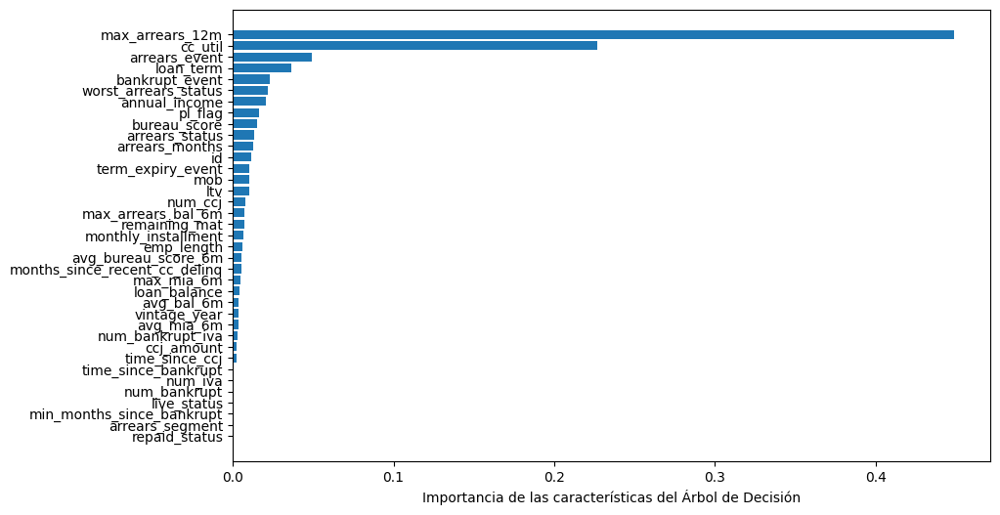

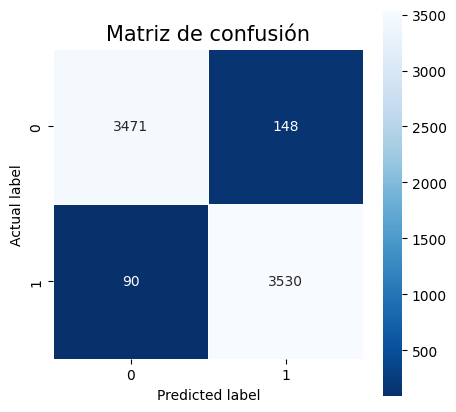

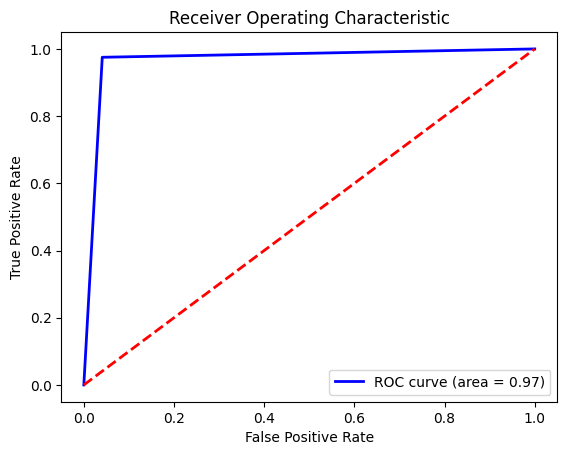

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_resampled, test_size=0.2, random_state=123, stratify=df_resampled['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Entrena el modelo de Árbol de Decisión
dt_model = DecisionTreeClassifier(random_state=123)
dt_model.fit(train.drop(columns=['default_indicator']), train['default_indicator'])

# Realiza las predicciones
train_preds = dt_model.predict(train.drop(columns=['default_indicator']))
test_preds = dt_model.predict(test.drop(columns=['default_indicator']))

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores = cross_val_score(dt_model, train.drop(columns=['default_indicator']), train['default_indicator'], cv=5)
print(f'CV scores: {cv_scores}')
print(f'Mean CV score: {cv_scores.mean()}')

# Calcula AUC-ROC
train_probs = dt_model.predict_proba(train.drop(columns=['default_indicator']))[:, 1]
test_probs = dt_model.predict_proba(test.drop(columns=['default_indicator']))[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_probs)
test_auc = roc_auc_score(test['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Visualiza la importancia de las características
importances = dt_model.feature_importances_
print(importances)

plt.figure(figsize=(10, 6))
sorted_idx = dt_model.feature_importances_.argsort()
plt.barh(train.drop(columns=['default_indicator']).columns[sorted_idx], dt_model.feature_importances_[sorted_idx])
plt.xlabel("Importancia de las características del Árbol de Decisión")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_resampled[df_resampled['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Haz la predicción utilizando tu modelo de Árbol de Decisión
prediction = dt_model.predict(person_data)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')



Decision trees con smote

Exactitud del entrenamiento: 100.00%
Exactitud de la prueba: 100.00%
Precision del entrenamiento: 100.00%
Precision de la prueba: 100.00%
Recall del entrenamiento: 100.00%
Recall de la prueba: 100.00%
F1 score del entrenamiento: 100.00%
F1 score de la prueba: 100.00%
CV scores: [1. 1. 1. 1. 1.]
Mean CV score: 1.0
Train AUC: 1.0
Test AUC: 1.0
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.68540845
 0.15374917 0.16084238 0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.        ]


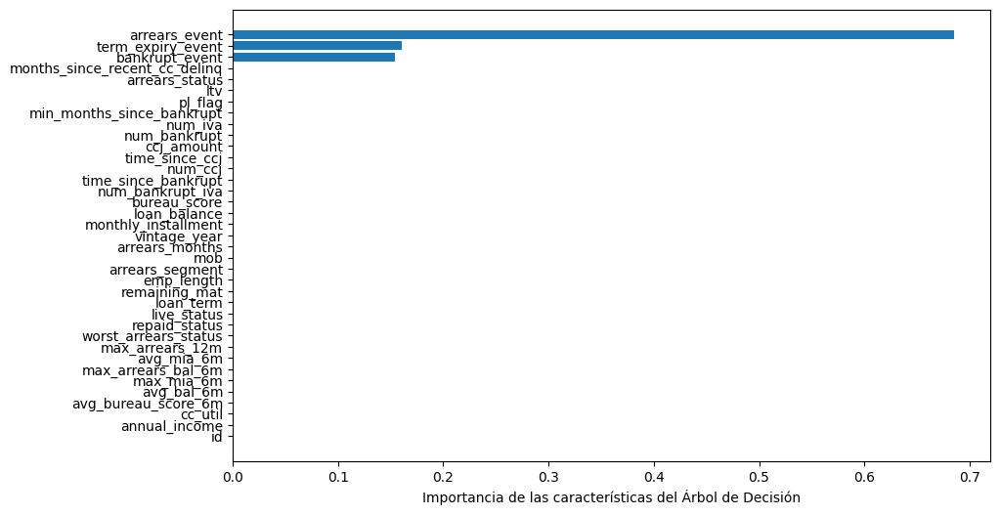

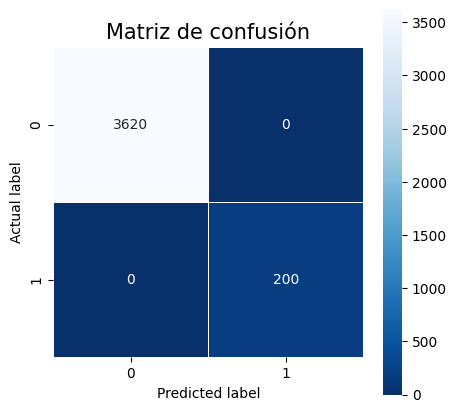

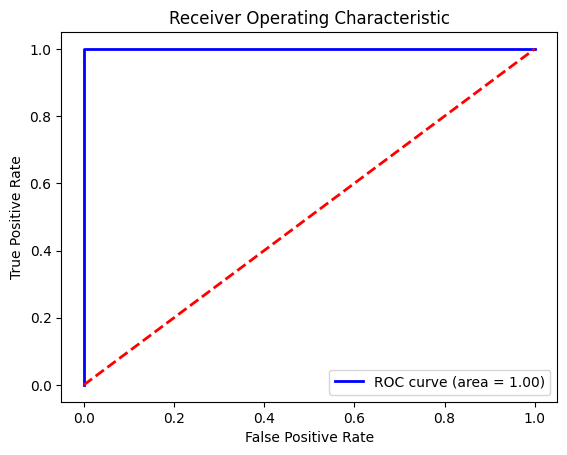

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_cleaned, test_size=0.2, random_state=123, stratify=df_cleaned['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Entrena el modelo de Árbol de Decisión
dt_model = DecisionTreeClassifier(random_state=123)
dt_model.fit(train.drop(columns=['default_indicator']), train['default_indicator'])

# Realiza las predicciones
train_preds = dt_model.predict(train.drop(columns=['default_indicator']))
test_preds = dt_model.predict(test.drop(columns=['default_indicator']))

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores = cross_val_score(dt_model, train.drop(columns=['default_indicator']), train['default_indicator'], cv=5)
print(f'CV scores: {cv_scores}')
print(f'Mean CV score: {cv_scores.mean()}')

# Calcula AUC-ROC
train_probs = dt_model.predict_proba(train.drop(columns=['default_indicator']))[:, 1]
test_probs = dt_model.predict_proba(test.drop(columns=['default_indicator']))[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_probs)
test_auc = roc_auc_score(test['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Visualiza la importancia de las características
importances = dt_model.feature_importances_
print(importances)

plt.figure(figsize=(10, 6))
sorted_idx = dt_model.feature_importances_.argsort()
plt.barh(train.drop(columns=['default_indicator']).columns[sorted_idx], dt_model.feature_importances_[sorted_idx])
plt.xlabel("Importancia de las características del Árbol de Decisión")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_cleaned[df_cleaned['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Haz la predicción utilizando tu modelo de Árbol de Decisión
prediction = dt_model.predict(person_data)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')

#Gradient Boosting con smote y sin smote



Gradient Boosting con smote

Exactitud del entrenamiento: 99.89%
Exactitud de la prueba: 98.37%
Precision del entrenamiento: 99.93%
Precision de la prueba: 98.37%
Recall del entrenamiento: 99.85%
Recall de la prueba: 98.37%
F1 score del entrenamiento: 99.89%
F1 score de la prueba: 98.37%
CV scores: [0.98497798 0.98704999 0.98640249 0.98640073 0.98562362]
Mean CV score: 0.9860909615216051
Train AUC: 0.9997310519205526
Test AUC: 0.9976076233628838
[4.77429432e-03 2.08027780e-03 1.66732711e-03 8.67028448e-04
 1.46088344e-02 2.45473029e-03 2.91337212e-04 5.04012292e-03
 5.99542178e-04 4.92657611e-04 2.97238481e-07 1.09269659e-04
 2.63287208e-05 9.32029143e-03 2.01186708e-03 1.36436670e-02
 2.31245162e-03 0.00000000e+00 3.35561321e-03 2.74840016e-03
 3.62722600e-02 0.00000000e+00 0.00000000e+00 6.73208786e-02
 1.14563015e-02 1.09791737e-02 2.40471550e-02 4.87945329e-01
 1.72936699e-04 5.46583429e-03 1.34073898e-03 9.77681775e-04
 1.91535131e-03 2.71239948e-01 1.13501731e-02 1.78173927e-03
 1.33015982e-03]


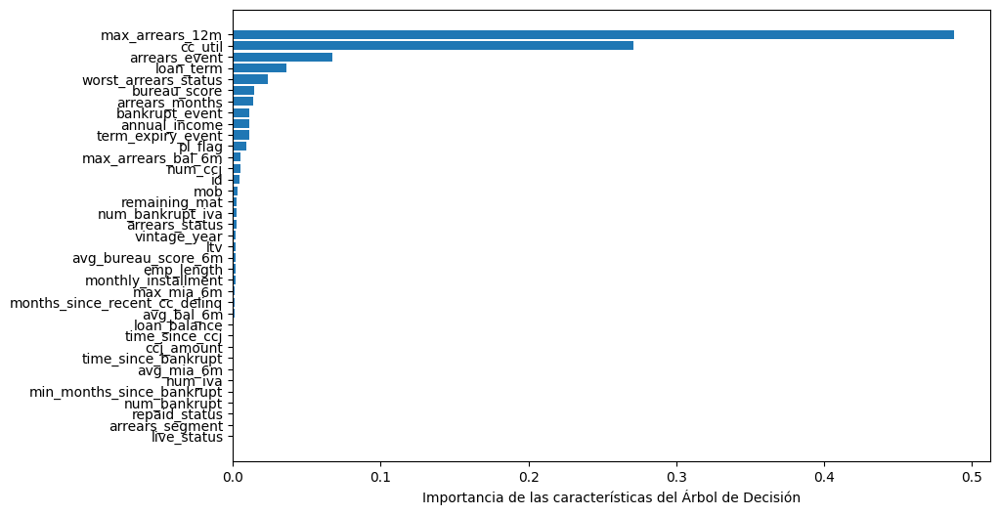

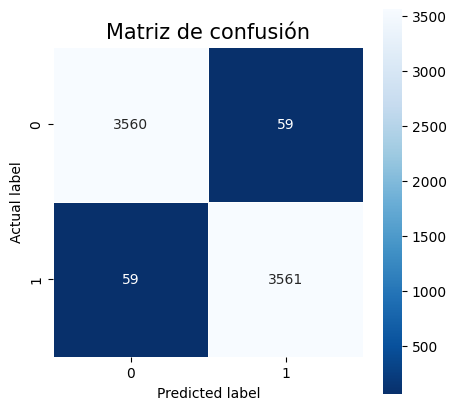

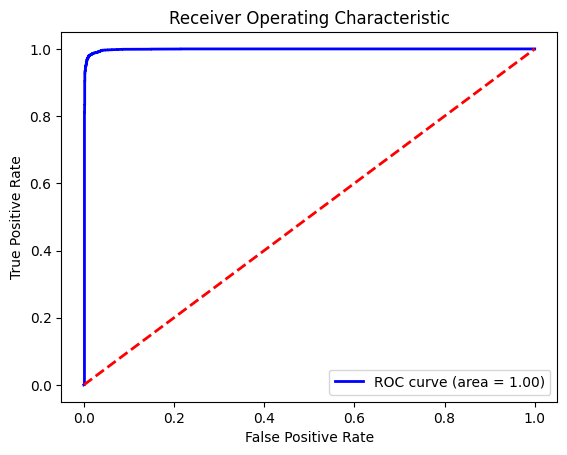

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_resampled, test_size=0.2, random_state=123, stratify=df_resampled['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Entrena el modelo de Gradient Boosting
gb_model = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=4, random_state=123)
gb_model.fit(train.drop(columns=['default_indicator']), train['default_indicator'])

# Realiza las predicciones
train_preds = gb_model.predict(train.drop(columns=['default_indicator']))
test_preds = gb_model.predict(test.drop(columns=['default_indicator']))

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores = cross_val_score(gb_model, train.drop(columns=['default_indicator']), train['default_indicator'], cv=5)
print(f'CV scores: {cv_scores}')
print(f'Mean CV score: {cv_scores.mean()}')

# Calcula AUC-ROC
train_probs = gb_model.predict_proba(train.drop(columns=['default_indicator']))[:, 1]
test_probs = gb_model.predict_proba(test.drop(columns=['default_indicator']))[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_probs)
test_auc = roc_auc_score(test['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Visualiza la importancia de las características
importances = gb_model.feature_importances_
print(importances)

plt.figure(figsize=(10, 6))
sorted_idx = gb_model.feature_importances_.argsort()
plt.barh(train.drop(columns=['default_indicator']).columns[sorted_idx], gb_model.feature_importances_[sorted_idx])
plt.xlabel("Importancia de las características del Árbol de Decisión")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_resampled[df_resampled['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Haz la predicción utilizando tu modelo de Gradient Boosting
prediction = gb_model.predict(person_data)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')


Gradient Boosting sin smote

Exactitud del entrenamiento: 100.00%
Exactitud de la prueba: 100.00%
Precision del entrenamiento: 100.00%
Precision de la prueba: 100.00%
Recall del entrenamiento: 100.00%
Recall de la prueba: 100.00%
F1 score del entrenamiento: 100.00%
F1 score de la prueba: 100.00%
CV scores: [1. 1. 1. 1. 1.]
Mean CV score: 1.0
Train AUC: 1.0
Test AUC: 1.0
[ 1.35018319e-14  0.00000000e+00 -3.71417062e-17  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.71417062e-17  1.84106288e-13
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  6.85408452e-01
  1.53749170e-01  1.60842378e-01  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  2.60886631e-13
  0.00000000e+00  2.69701377e-14  0.00000000e+00  0.00000000e+00
  0.00000000e+00]


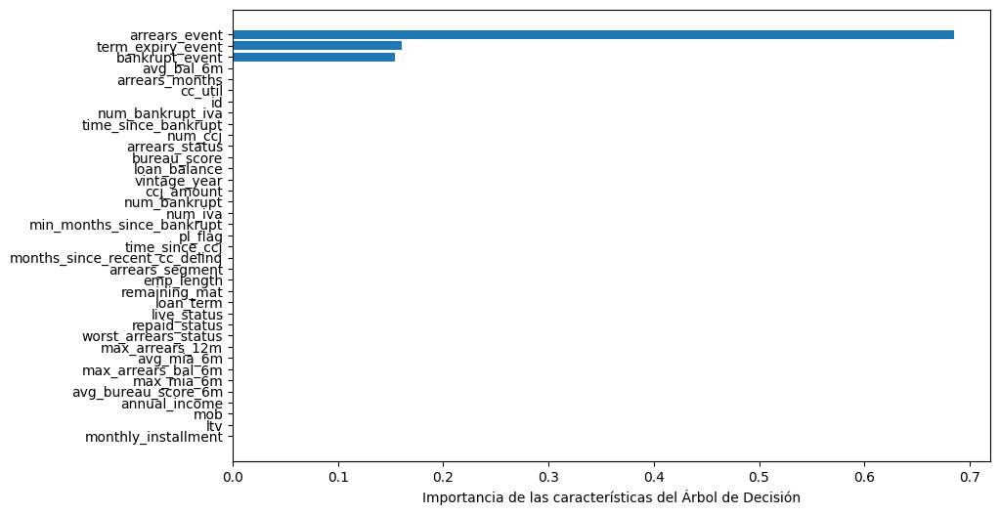

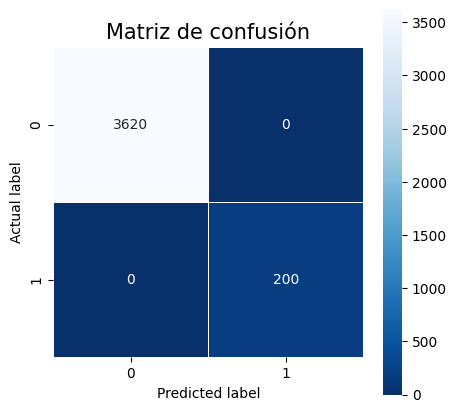

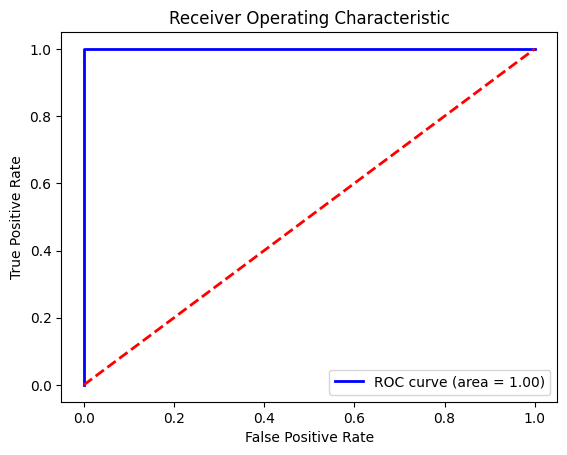

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_cleaned, test_size=0.2, random_state=123, stratify=df_cleaned['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Entrena el modelo de Gradient Boosting
gb_model = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=4, random_state=123)
gb_model.fit(train.drop(columns=['default_indicator']), train['default_indicator'])

# Realiza las predicciones
train_preds = gb_model.predict(train.drop(columns=['default_indicator']))
test_preds = gb_model.predict(test.drop(columns=['default_indicator']))

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores = cross_val_score(gb_model, train.drop(columns=['default_indicator']), train['default_indicator'], cv=5)
print(f'CV scores: {cv_scores}')
print(f'Mean CV score: {cv_scores.mean()}')

# Calcula AUC-ROC
train_probs = gb_model.predict_proba(train.drop(columns=['default_indicator']))[:, 1]
test_probs = gb_model.predict_proba(test.drop(columns=['default_indicator']))[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_probs)
test_auc = roc_auc_score(test['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Visualiza la importancia de las características
importances = gb_model.feature_importances_
print(importances)

plt.figure(figsize=(10, 6))
sorted_idx = gb_model.feature_importances_.argsort()
plt.barh(train.drop(columns=['default_indicator']).columns[sorted_idx], gb_model.feature_importances_[sorted_idx])
plt.xlabel("Importancia de las características del Árbol de Decisión")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_cleaned[df_cleaned['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Haz la predicción utilizando tu modelo de Gradient Boosting
prediction = gb_model.predict(person_data)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')


#Modelo DNN con smote y sin smote


Modelo DNN con smote

Epoch 1/10
1207/1207 [==============================] - 6s 3ms/step - loss: 0.1488 - accuracy: 0.9399
Epoch 2/10
1207/1207 [==============================] - 5s 4ms/step - loss: 0.0923 - accuracy: 0.9632
Epoch 3/10
1207/1207 [==============================] - 5s 4ms/step - loss: 0.0803 - accuracy: 0.9677
Epoch 4/10
1207/1207 [==============================] - 5s 4ms/step - loss: 0.0747 - accuracy: 0.9691
Epoch 5/10
1207/1207 [==============================] - 4s 3ms/step - loss: 0.0697 - accuracy: 0.9714
Epoch 6/10
1207/1207 [==============================] - 6s 5ms/step - loss: 0.0665 - accuracy: 0.9719
Epoch 7/10
1207/1207 [==============================] - 4s 3ms/step - loss: 0.0641 - accuracy: 0.9741
Epoch 8/10
1207/1207 [==============================] - 4s 3ms/step - loss: 0.0614 - accuracy: 0.9749
Epoch 9/10
1207/1207 [==============================] - 5s 4ms/step - loss: 0.0598 - accuracy: 0.9754
Epoch 10/10
227/227 [==============================] - 1s 3ms/step
Exactitud del e

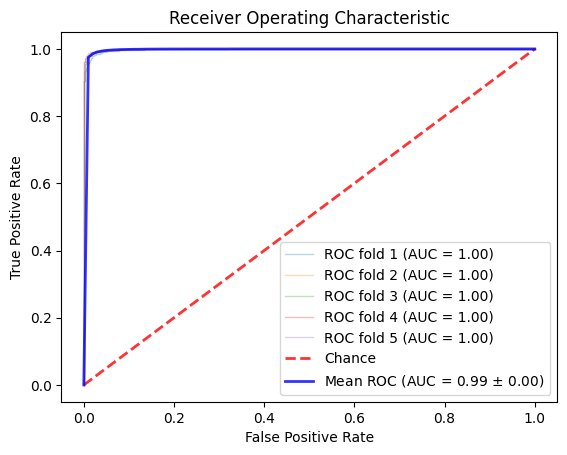

Mean CV accuracy: 98.22%
Train AUC: 0.9994
Test AUC: 0.9989


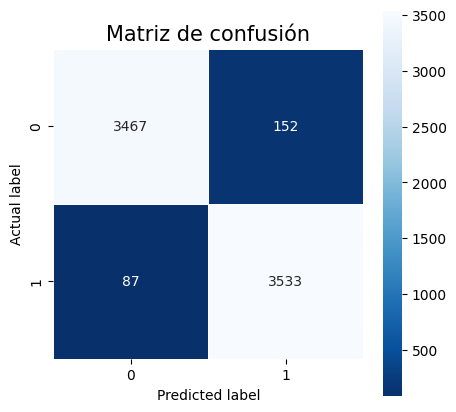

1207/1207 [==============================] - 1s 1ms/step


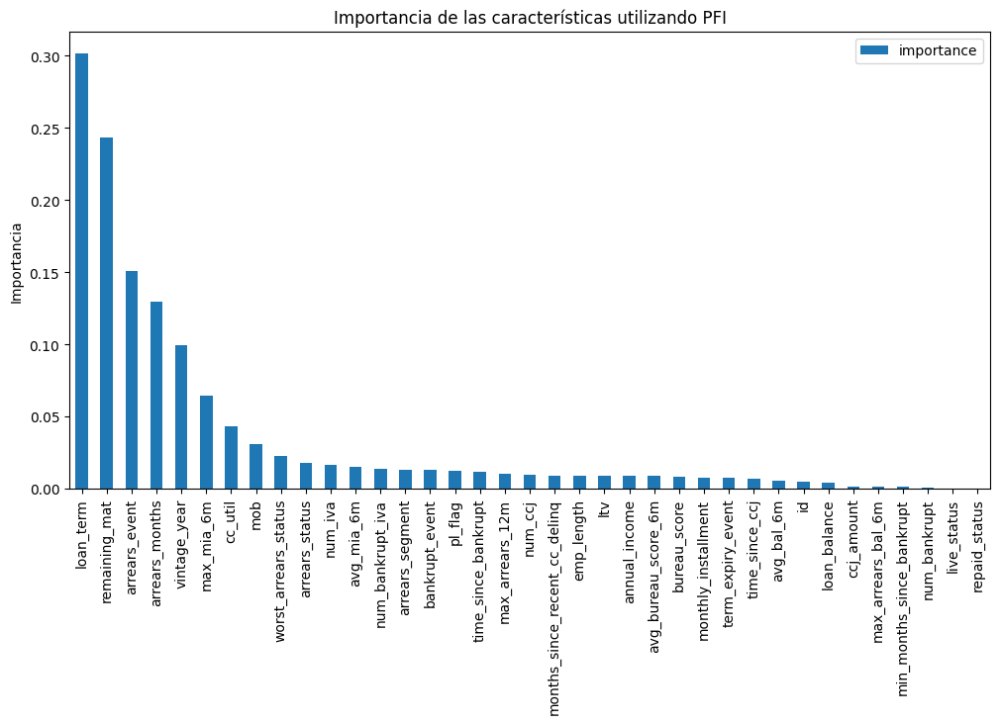

1/1 [==============================] - 0s 18ms/step
La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, auc, confusion_matrix, accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Define una función para calcular la precisión del modelo
def score(X, y):
    y_pred = (model.predict(X) > 0.5).astype(int)
    return accuracy_score(y, y_pred)

class KerasModelWrapper:
    def __init__(self, model):
        self.model = model

    def fit(self, X, y):
        self.model.fit(X, y, epochs=10, batch_size=32, verbose=0)

    def predict(self, X):
        return (self.model.predict(X) > 0.5).astype(int)

    def score(self, X, y):
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train_df, temp = train_test_split(df_resampled, test_size=0.2, random_state=123, stratify=df_resampled['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Normaliza los datos
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train_df.drop(columns=['default_indicator']))
test_scaled = scaler.transform(test.drop(columns=['default_indicator']))

# Crea el modelo de DNN
model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(32, activation='relu', input_shape=(train_scaled.shape[1],)),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compila el modelo
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Entrena el modelo
model.fit(train_scaled, train_df['default_indicator'], epochs=10, batch_size=32)

# Evalúa el rendimiento
train_acc = model.evaluate(train_scaled, train_df['default_indicator'], verbose=0)[1]
test_acc = model.evaluate(test_scaled, test['default_indicator'], verbose=0)[1]

train_preds = (model.predict(train_scaled) > 0.5).astype(int)
test_preds = (model.predict(test_scaled) > 0.5).astype(int)

train_precision = precision_score(train_df['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train_df['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train_df['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precisión del entrenamiento: {train_precision*100:.2f}%')
print(f'Precisión de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada y calcula el AUC-ROC
cv = StratifiedKFold(n_splits=5)
train_auc_scores = []
test_auc_scores = []
cv_scores = []

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

for train_index, test_index in cv.split(train_scaled, train_df['default_indicator']):
    X_train_cv, X_test_cv = train_scaled[train_index], train_scaled[test_index]
    y_train_cv, y_test_cv = train_df['default_indicator'].iloc[train_index], train_df['default_indicator'].iloc[test_index]

    model.fit(X_train_cv, y_train_cv, epochs=10, batch_size=32, verbose=0)

    train_probs_cv = model.predict(X_train_cv)
    test_probs_cv = model.predict(X_test_cv)

    train_auc_cv = roc_auc_score(y_train_cv, train_probs_cv)
    test_auc_cv = roc_auc_score(y_test_cv, test_probs_cv)

    train_auc_scores.append(train_auc_cv)
    test_auc_scores.append(test_auc_cv)

    cv_scores.append(model.evaluate(X_test_cv, y_test_cv, verbose=0)[1])

    fpr, tpr, _ = roc_curve(y_test_cv, test_probs_cv)
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (len(aucs), roc_auc))

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

print(f'Mean CV accuracy: {np.mean(cv_scores)*100:.2f}%')
print(f'Train AUC: {np.mean(train_auc_scores):.4f}')
print(f'Test AUC: {np.mean(test_auc_scores):.4f}')

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Envuelve tu modelo de TensorFlow en el envoltorio
wrapped_model = KerasModelWrapper(model)

# Calcula la importancia de las características
result = permutation_importance(wrapped_model, train_scaled, train_df['default_indicator'], n_repeats=10)

# Crea un DataFrame para visualizar los resultados
importance_df = pd.DataFrame(result.importances_mean, index=train_df.drop(columns=['default_indicator']).columns, columns=['importance'])
importance_df.sort_values(by='importance', ascending=False, inplace=True)

# Visualiza la importancia de las características
importance_df.plot(kind='bar', figsize=(12, 6))
plt.title('Importancia de las características utilizando PFI')
plt.ylabel('Importancia')
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_resampled[df_resampled['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Normaliza los datos de la persona
person_data_scaled = scaler.transform(person_data)

# Haz la predicción utilizando tu modelo de DNN
prediction = model.predict(person_data_scaled)

# Como la salida es una probabilidad, la convertimos a una clase binaria
prediction_class = (prediction > 0.5).astype(int)

print(f'La predicción para la persona con ID {person_id} es: {prediction_class[0][0]}')




Modelo DNN sin smote

Epoch 1/10
637/637 [==============================] - 4s 2ms/step - loss: 0.0539 - accuracy: 0.9867
Epoch 2/10
637/637 [==============================] - 2s 3ms/step - loss: 9.6554e-04 - accuracy: 1.0000
Epoch 3/10
637/637 [==============================] - 2s 3ms/step - loss: 2.6977e-04 - accuracy: 1.0000
Epoch 4/10
637/637 [==============================] - 2s 4ms/step - loss: 1.1654e-04 - accuracy: 1.0000
Epoch 5/10
637/637 [==============================] - 3s 4ms/step - loss: 6.1550e-05 - accuracy: 1.0000
Epoch 6/10
637/637 [==============================] - 3s 5ms/step - loss: 3.6218e-05 - accuracy: 1.0000
Epoch 7/10
637/637 [==============================] - 3s 4ms/step - loss: 2.2341e-05 - accuracy: 1.0000
Epoch 8/10
637/637 [==============================] - 2s 3ms/step - loss: 1.4565e-05 - accuracy: 1.0000
Epoch 9/10
637/637 [==============================] - 2s 3ms/step - loss: 9.4783e-06 - accuracy: 1.0000
Epoch 10/10
120/120 [==============================] - 0s 2ms/step
E

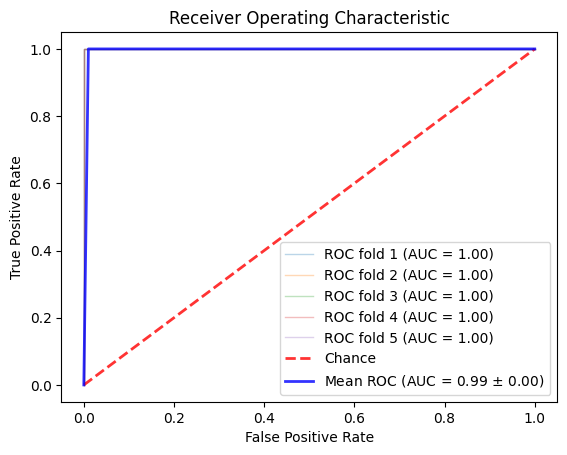

Mean CV accuracy: 100.00%
Train AUC: 1.0000
Test AUC: 1.0000


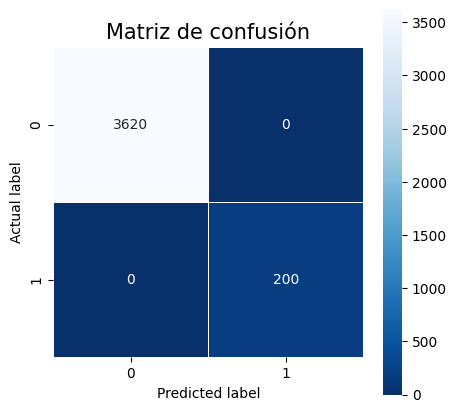

637/637 [==============================] - 1s 2ms/step


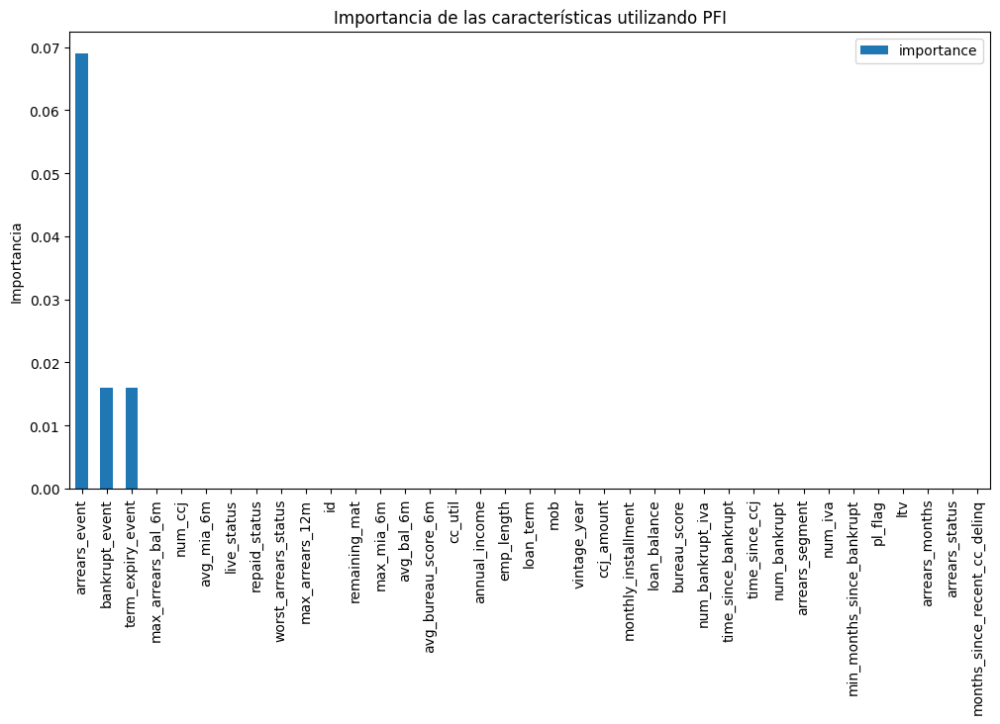

1/1 [==============================] - 0s 27ms/step
La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, auc, confusion_matrix, accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Define una función para calcular la precisión del modelo
def score(X, y):
    y_pred = (model.predict(X) > 0.5).astype(int)
    return accuracy_score(y, y_pred)

class KerasModelWrapper:
    def __init__(self, model):
        self.model = model

    def fit(self, X, y):
        self.model.fit(X, y, epochs=10, batch_size=32, verbose=0)

    def predict(self, X):
        return (self.model.predict(X) > 0.5).astype(int)

    def score(self, X, y):
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train_df, temp = train_test_split(df_cleaned, test_size=0.2, random_state=123, stratify=df_cleaned['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Normaliza los datos
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train_df.drop(columns=['default_indicator']))
test_scaled = scaler.transform(test.drop(columns=['default_indicator']))

# Crea el modelo de DNN
model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(32, activation='relu', input_shape=(train_scaled.shape[1],)),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compila el modelo
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Entrena el modelo
model.fit(train_scaled, train_df['default_indicator'], epochs=10, batch_size=32)

# Evalúa el rendimiento
train_acc = model.evaluate(train_scaled, train_df['default_indicator'], verbose=0)[1]
test_acc = model.evaluate(test_scaled, test['default_indicator'], verbose=0)[1]

train_preds = (model.predict(train_scaled) > 0.5).astype(int)
test_preds = (model.predict(test_scaled) > 0.5).astype(int)

train_precision = precision_score(train_df['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train_df['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train_df['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precisión del entrenamiento: {train_precision*100:.2f}%')
print(f'Precisión de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada y calcula el AUC-ROC
cv = StratifiedKFold(n_splits=5)
train_auc_scores = []
test_auc_scores = []
cv_scores = []

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

for train_index, test_index in cv.split(train_scaled, train_df['default_indicator']):
    X_train_cv, X_test_cv = train_scaled[train_index], train_scaled[test_index]
    y_train_cv, y_test_cv = train_df['default_indicator'].iloc[train_index], train_df['default_indicator'].iloc[test_index]

    model.fit(X_train_cv, y_train_cv, epochs=10, batch_size=32, verbose=0)

    train_probs_cv = model.predict(X_train_cv)
    test_probs_cv = model.predict(X_test_cv)

    train_auc_cv = roc_auc_score(y_train_cv, train_probs_cv)
    test_auc_cv = roc_auc_score(y_test_cv, test_probs_cv)

    train_auc_scores.append(train_auc_cv)
    test_auc_scores.append(test_auc_cv)

    cv_scores.append(model.evaluate(X_test_cv, y_test_cv, verbose=0)[1])

    fpr, tpr, _ = roc_curve(y_test_cv, test_probs_cv)
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (len(aucs), roc_auc))

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

print(f'Mean CV accuracy: {np.mean(cv_scores)*100:.2f}%')
print(f'Train AUC: {np.mean(train_auc_scores):.4f}')
print(f'Test AUC: {np.mean(test_auc_scores):.4f}')

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Envuelve tu modelo de TensorFlow en el envoltorio
wrapped_model = KerasModelWrapper(model)

# Calcula la importancia de las características
result = permutation_importance(wrapped_model, train_scaled, train_df['default_indicator'], n_repeats=10)

# Crea un DataFrame para visualizar los resultados
importance_df = pd.DataFrame(result.importances_mean, index=train_df.drop(columns=['default_indicator']).columns, columns=['importance'])
importance_df.sort_values(by='importance', ascending=False, inplace=True)

# Visualiza la importancia de las características
importance_df.plot(kind='bar', figsize=(12, 6))
plt.title('Importancia de las características utilizando PFI')
plt.ylabel('Importancia')
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_cleaned[df_cleaned['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Normaliza los datos de la persona
person_data_scaled = scaler.transform(person_data)

# Haz la predicción utilizando tu modelo de DNN
prediction = model.predict(person_data_scaled)

# Como la salida es una probabilidad, la convertimos a una clase binaria
prediction_class = (prediction > 0.5).astype(int)

print(f'La predicción para la persona con ID {person_id} es: {prediction_class[0][0]}')



#LogistcRegression con smote y sin smote


LogistcRegression con smote

Exactitud del entrenamiento: 96.85%
Exactitud de la prueba: 96.42%
Precision del entrenamiento: 97.51%
Precision de la prueba: 97.06%
Recall del entrenamiento: 96.15%
Recall de la prueba: 95.75%
F1 score del entrenamiento: 96.83%
F1 score de la prueba: 96.40%
AUC del entrenamiento: 1.00
AUC de la prueba: 0.99
CV Scores: [0.99514138 0.99643336 0.99535718 0.9957948  0.99500485]
Mean CV Score: 1.00


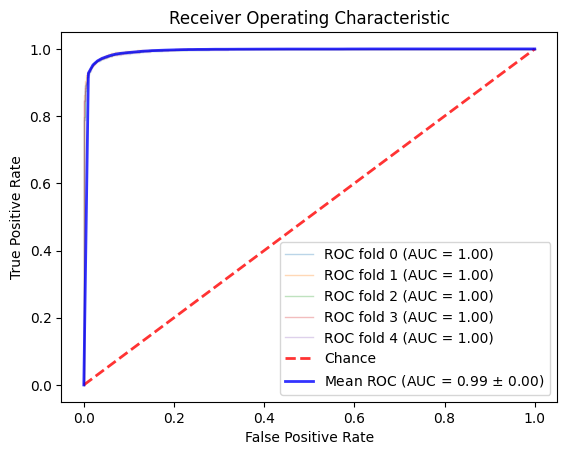

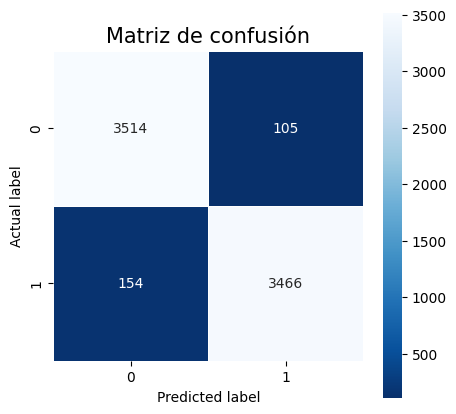

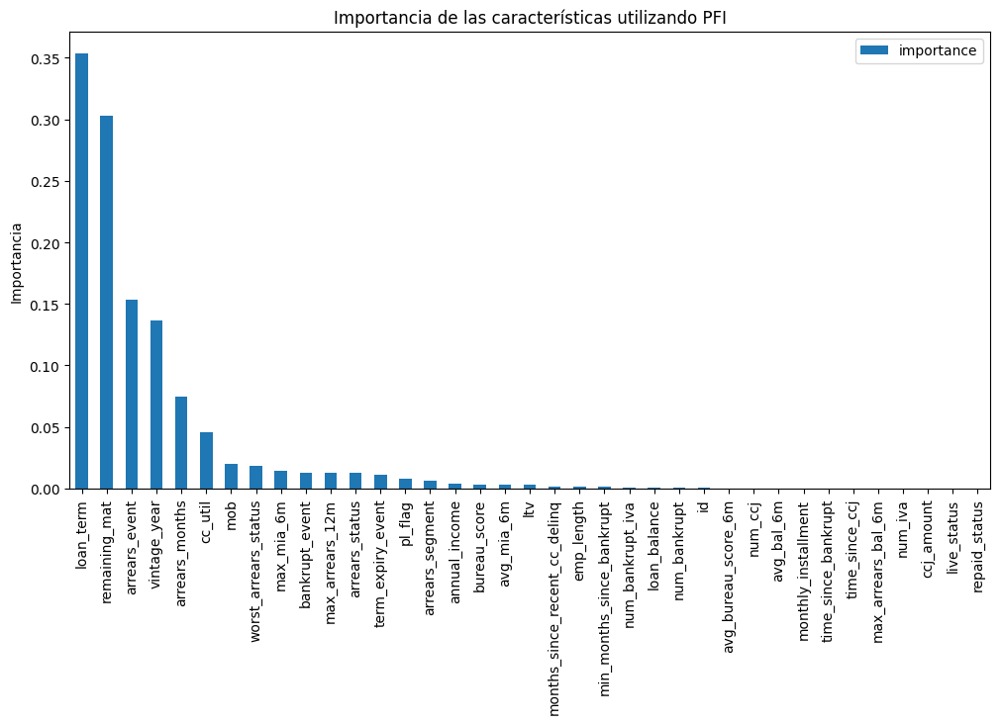

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_resampled, test_size=0.2, random_state=123, stratify=df_resampled['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Normaliza los datos
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train.drop(columns=['default_indicator']))
test_scaled = scaler.transform(test.drop(columns=['default_indicator']))

# Entrena el modelo de Regresión Logística
lr_model = LogisticRegression(max_iter=1000, random_state=123)
lr_model.fit(train_scaled, train['default_indicator'])

# Realiza las predicciones
train_preds = lr_model.predict(train_scaled)
test_preds = lr_model.predict(test_scaled)

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Calcula el AUC-ROC para entrenamiento y prueba
train_proba = lr_model.predict_proba(train_scaled)[:, 1]
test_proba = lr_model.predict_proba(test_scaled)[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_proba)
test_auc = roc_auc_score(test['default_indicator'], test_proba)
print(f'AUC del entrenamiento: {train_auc:.2f}')
print(f'AUC de la prueba: {test_auc:.2f}')

# Realiza la validación cruzada y calcula el AUC-ROC
cv = StratifiedKFold(n_splits=5)
tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)
i = 0

cv_scores = cross_val_score(lr_model, train_scaled, train['default_indicator'], cv=cv, scoring='roc_auc')
mean_cv_score = np.mean(cv_scores)
print(f'CV Scores: {cv_scores}')
print(f'Mean CV Score: {mean_cv_score:.2f}')

for train_idx, test_idx in cv.split(train_scaled, train['default_indicator']):
    probas_ = lr_model.fit(train_scaled[train_idx], train['default_indicator'].iloc[train_idx]).predict_proba(train_scaled[test_idx])
    # Compute ROC curve and area under the curve
    fpr, tpr, thresholds = roc_curve(train['default_indicator'].iloc[test_idx], probas_[:, 1])
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Obtiene los coeficientes del modelo
coefficients = lr_model.coef_[0]

# Crea un DataFrame para visualizar los resultados
coefficients_df = pd.DataFrame(coefficients, index=train.drop(columns=['default_indicator']).columns, columns=['Coefficient'])

# Ordena los coeficientes por su valor absoluto
coefficients_df['abs'] = coefficients_df['Coefficient'].abs()
sorted_df = coefficients_df.sort_values('abs', ascending=False).drop('abs', axis=1)


# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Calcula la importancia de las características
result = permutation_importance(lr_model, train_scaled, train['default_indicator'], n_repeats=10)

# Crea un DataFrame para visualizar los resultados
importance_df = pd.DataFrame(result.importances_mean, index=train.drop(columns=['default_indicator']).columns, columns=['importance'])
importance_df.sort_values(by='importance', ascending=False, inplace=True)

# Visualiza la importancia de las características
importance_df.plot(kind='bar', figsize=(12, 6))
plt.title('Importancia de las características utilizando PFI')
plt.ylabel('Importancia')
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_resampled[df_resampled['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Normaliza los datos de la persona
person_data_scaled = scaler.transform(person_data)

# Haz la predicción utilizando tu modelo de Regresión Logística
prediction = lr_model.predict(person_data_scaled)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')


LogistcRegression sin smote

Exactitud del entrenamiento: 100.00%
Exactitud de la prueba: 100.00%
Precision del entrenamiento: 100.00%
Precision de la prueba: 100.00%
Recall del entrenamiento: 100.00%
Recall de la prueba: 100.00%
F1 score del entrenamiento: 100.00%
F1 score de la prueba: 100.00%
AUC del entrenamiento: 1.00
AUC de la prueba: 1.00
CV Scores: [1. 1. 1. 1. 1.]
Mean CV Score: 1.00


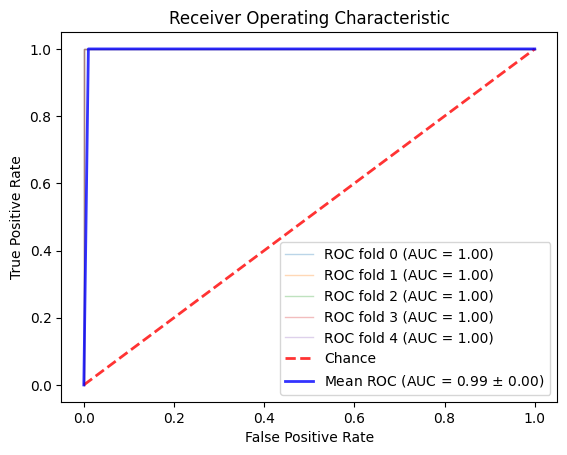

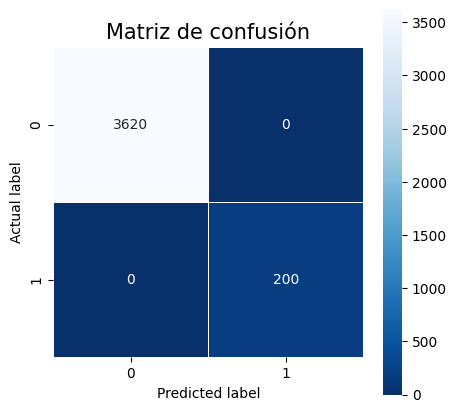

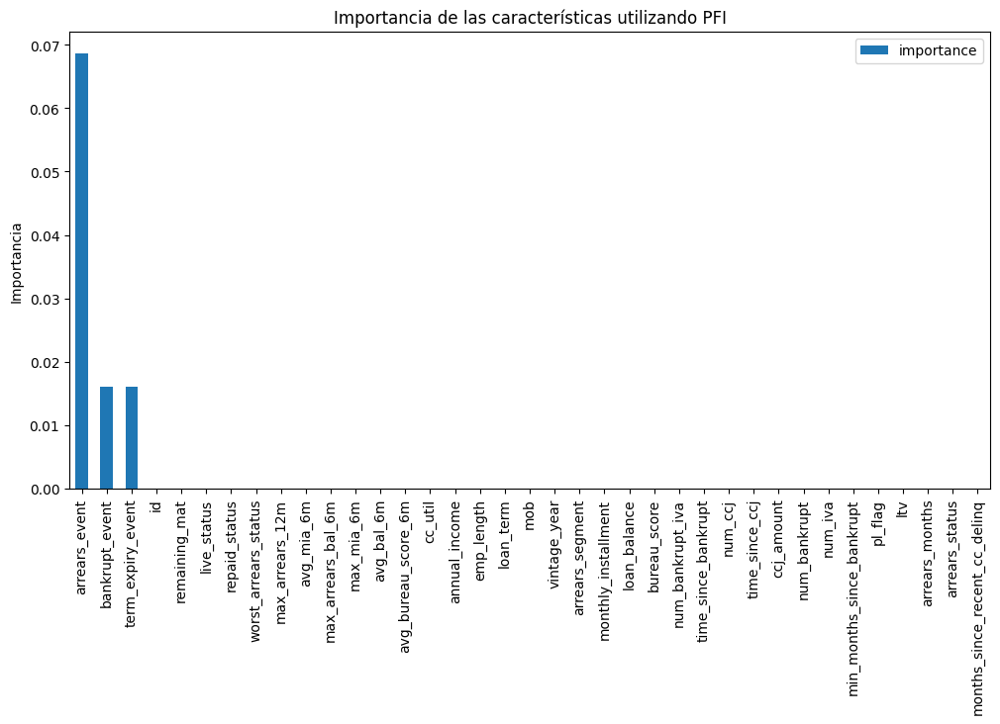

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_cleaned, test_size=0.2, random_state=123, stratify=df_cleaned['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Normaliza los datos
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train.drop(columns=['default_indicator']))
test_scaled = scaler.transform(test.drop(columns=['default_indicator']))

# Entrena el modelo de Regresión Logística
lr_model = LogisticRegression(max_iter=1000, random_state=123)
lr_model.fit(train_scaled, train['default_indicator'])

# Realiza las predicciones
train_preds = lr_model.predict(train_scaled)
test_preds = lr_model.predict(test_scaled)

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')


# Calcula el AUC-ROC para entrenamiento y prueba
train_proba = lr_model.predict_proba(train_scaled)[:, 1]
test_proba = lr_model.predict_proba(test_scaled)[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_proba)
test_auc = roc_auc_score(test['default_indicator'], test_proba)
print(f'AUC del entrenamiento: {train_auc:.2f}')
print(f'AUC de la prueba: {test_auc:.2f}')

# Realiza la validación cruzada y calcula el AUC-ROC
cv = StratifiedKFold(n_splits=5)
tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)
i = 0

cv_scores = cross_val_score(lr_model, train_scaled, train['default_indicator'], cv=cv, scoring='roc_auc')
mean_cv_score = np.mean(cv_scores)
print(f'CV Scores: {cv_scores}')
print(f'Mean CV Score: {mean_cv_score:.2f}')

for train_idx, test_idx in cv.split(train_scaled, train['default_indicator']):
    probas_ = lr_model.fit(train_scaled[train_idx], train['default_indicator'].iloc[train_idx]).predict_proba(train_scaled[test_idx])
    # Compute ROC curve and area under the curve
    fpr, tpr, thresholds = roc_curve(train['default_indicator'].iloc[test_idx], probas_[:, 1])
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Obtiene los coeficientes del modelo
coefficients = lr_model.coef_[0]

# Crea un DataFrame para visualizar los resultados
coefficients_df = pd.DataFrame(coefficients, index=train.drop(columns=['default_indicator']).columns, columns=['Coefficient'])

# Ordena los coeficientes por su valor absoluto
coefficients_df['abs'] = coefficients_df['Coefficient'].abs()
sorted_df = coefficients_df.sort_values('abs', ascending=False).drop('abs', axis=1)


# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Calcula la importancia de las características
result = permutation_importance(lr_model, train_scaled, train['default_indicator'], n_repeats=10)

# Crea un DataFrame para visualizar los resultados
importance_df = pd.DataFrame(result.importances_mean, index=train.drop(columns=['default_indicator']).columns, columns=['importance'])
importance_df.sort_values(by='importance', ascending=False, inplace=True)

# Visualiza la importancia de las características
importance_df.plot(kind='bar', figsize=(12, 6))
plt.title('Importancia de las características utilizando PFI')
plt.ylabel('Importancia')
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_cleaned[df_cleaned['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Normaliza los datos de la persona
person_data_scaled = scaler.transform(person_data)

# Haz la predicción utilizando tu modelo de Regresión Logística
prediction = lr_model.predict(person_data_scaled)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')

#Support vector machine con smote y sin smote


Support vector machine con smote

Exactitud del entrenamiento: 97.35%
Exactitud de la prueba: 97.13%
Precision del entrenamiento: 98.18%
Precision de la prueba: 98.00%
Recall del entrenamiento: 96.49%
Recall de la prueba: 96.22%
F1 score del entrenamiento: 97.33%
F1 score de la prueba: 97.10%
AUC del entrenamiento: 1.00
AUC de la prueba: 1.00
CV Scores: [0.99605865 0.99724243 0.99624071 0.99676283 0.99618471]
Mean CV Score: 1.00


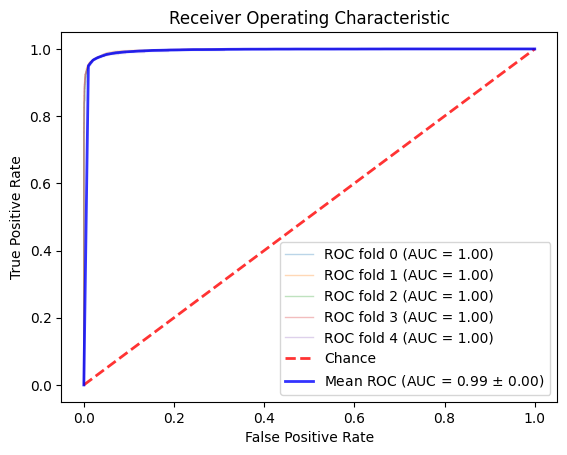

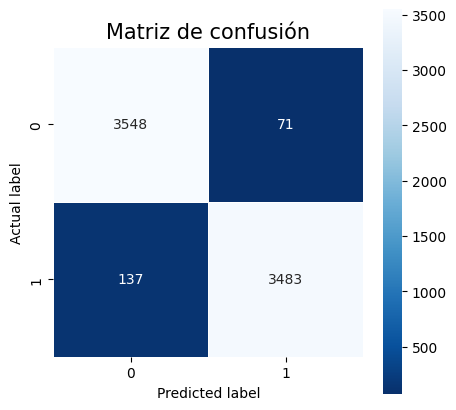

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


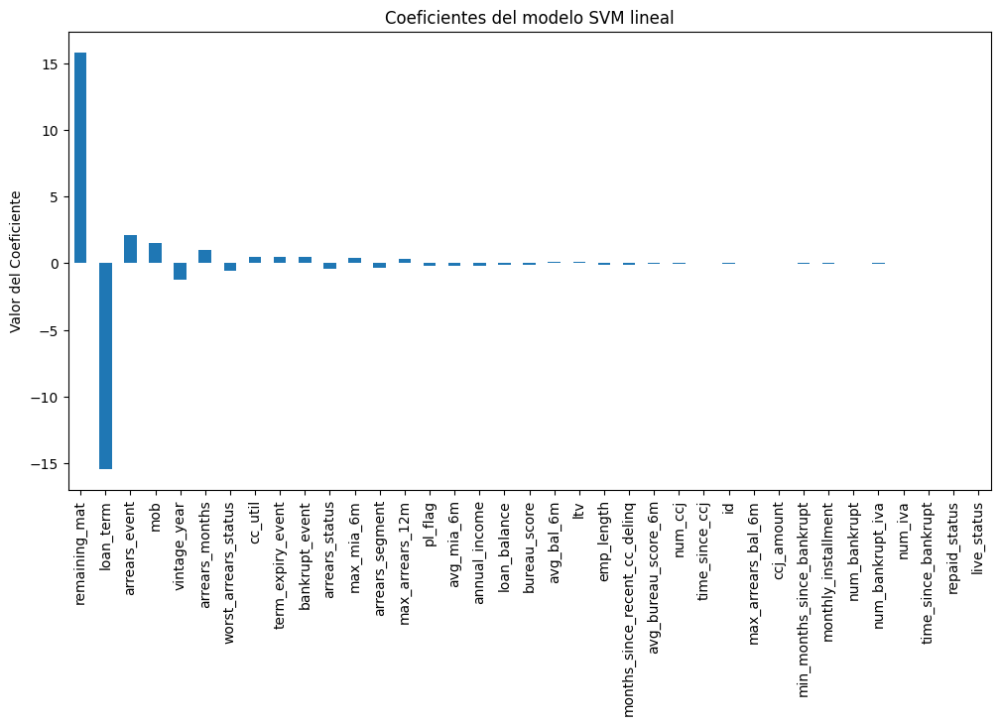

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.svm import SVC, LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_resampled, test_size=0.2, random_state=123, stratify=df_resampled['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Normaliza los datos
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train.drop(columns=['default_indicator']))
test_scaled = scaler.transform(test.drop(columns=['default_indicator']))

# Entrena el modelo de SVM
svm_model = SVC(kernel='linear', probability=True, random_state=123)
svm_model.fit(train_scaled, train['default_indicator'])

# Realiza las predicciones
train_preds = svm_model.predict(train_scaled)
test_preds = svm_model.predict(test_scaled)

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')


# Calcula el AUC-ROC para entrenamiento y prueba
train_proba = svm_model.predict_proba(train_scaled)[:, 1]
test_proba = svm_model.predict_proba(test_scaled)[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_proba)
test_auc = roc_auc_score(test['default_indicator'], test_proba)
print(f'AUC del entrenamiento: {train_auc:.2f}')
print(f'AUC de la prueba: {test_auc:.2f}')

# Realiza la validación cruzada y calcula el AUC-ROC
cv = StratifiedKFold(n_splits=5)
tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)
i = 0

cv_scores = cross_val_score(svm_model, train_scaled, train['default_indicator'], cv=cv, scoring='roc_auc')
mean_cv_score = np.mean(cv_scores)
print(f'CV Scores: {cv_scores}')
print(f'Mean CV Score: {mean_cv_score:.2f}')

for train_idx, test_idx in cv.split(train_scaled, train['default_indicator']):
    probas_ = svm_model.fit(train_scaled[train_idx], train['default_indicator'].iloc[train_idx]).predict_proba(train_scaled[test_idx])
    # Compute ROC curve and area under the curve
    fpr, tpr, thresholds = roc_curve(train['default_indicator'].iloc[test_idx], probas_[:, 1])
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size = 15)
plt.show()

# Entrena el modelo de SVM lineal para obtener los coeficientes
linear_svm_model = LinearSVC(random_state=123)
linear_svm_model.fit(train_scaled, train['default_indicator'])

# Obtiene los coeficientes del modelo
coefficients = linear_svm_model.coef_[0]

# Crea un DataFrame para visualizar los resultados
coefficients_df = pd.DataFrame(coefficients, index=train.drop(columns=['default_indicator']).columns, columns=['Coefficient'])

# Ordena los coeficientes por su valor absoluto
coefficients_df['abs'] = coefficients_df['Coefficient'].abs()
sorted_df = coefficients_df.sort_values('abs', ascending=False).drop('abs', axis=1)

# Visualiza los coeficientes
plt.figure(figsize=(12, 6))
sorted_df['Coefficient'].plot(kind='bar')
plt.title('Coeficientes del modelo SVM lineal')
plt.ylabel('Valor del Coeficiente')
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_resampled[df_resampled['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Normaliza los datos de la persona
person_data_scaled = scaler.transform(person_data)

# Haz la predicción utilizando tu modelo de SVM
prediction = svm_model.predict(person_data_scaled)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')


Support vector machine sin SMOTE

Exactitud del entrenamiento: 100.00%
Exactitud de la prueba: 100.00%
Precision del entrenamiento: 100.00%
Precision de la prueba: 100.00%
Recall del entrenamiento: 100.00%
Recall de la prueba: 100.00%
F1 score del entrenamiento: 100.00%
F1 score de la prueba: 100.00%
AUC del entrenamiento: 1.00
AUC de la prueba: 1.00
CV Scores: [1. 1. 1. 1. 1.]
Mean CV Score: 1.00


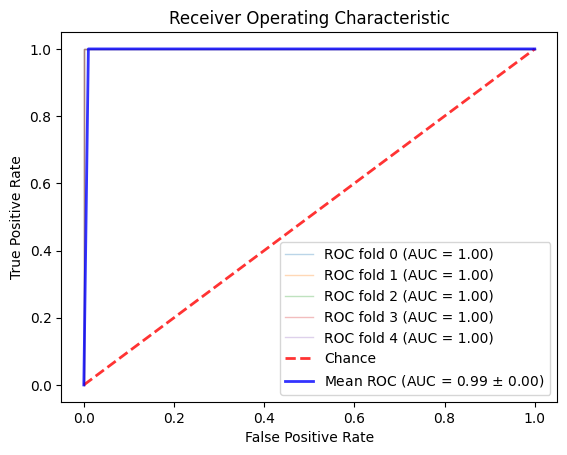

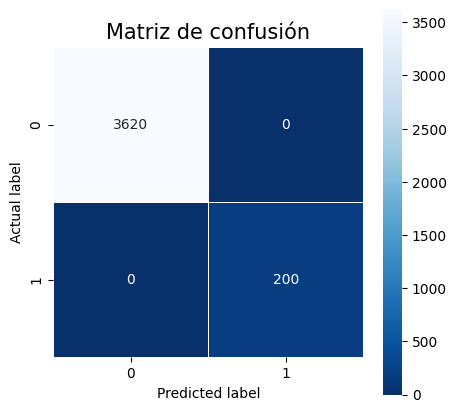

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


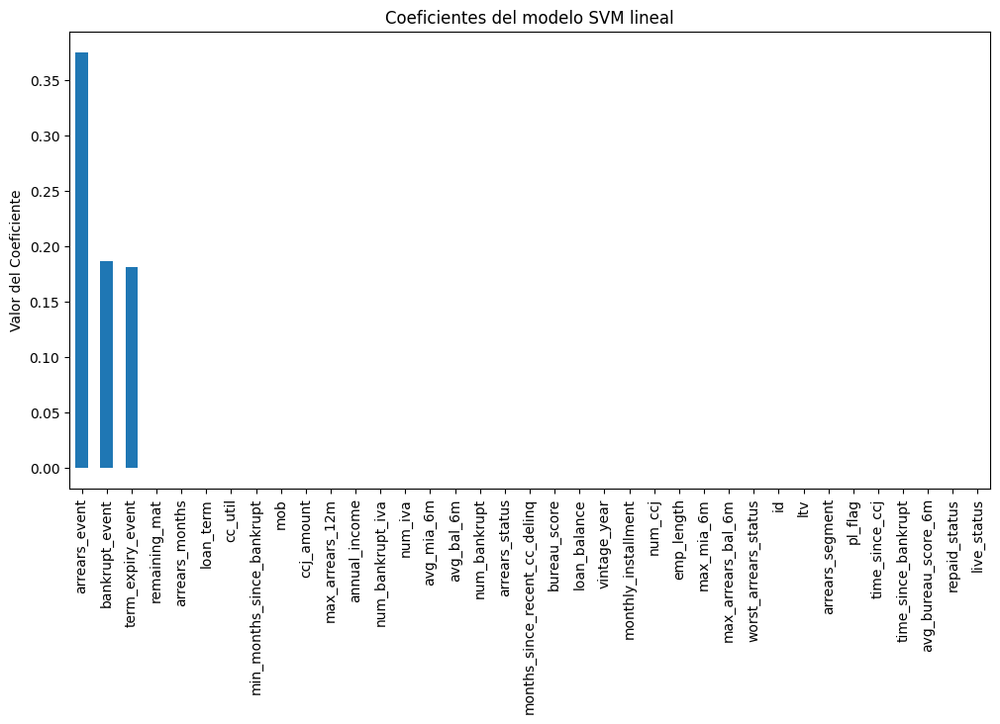

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.svm import SVC, LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_cleaned, test_size=0.2, random_state=123, stratify=df_cleaned['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Normaliza los datos
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train.drop(columns=['default_indicator']))
test_scaled = scaler.transform(test.drop(columns=['default_indicator']))

# Entrena el modelo de SVM
svm_model = SVC(kernel='linear', probability=True, random_state=123)
svm_model.fit(train_scaled, train['default_indicator'])

# Realiza las predicciones
train_preds = svm_model.predict(train_scaled)
test_preds = svm_model.predict(test_scaled)

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Calcula el AUC-ROC para entrenamiento y prueba
train_proba = svm_model.predict_proba(train_scaled)[:, 1]
test_proba = svm_model.predict_proba(test_scaled)[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_proba)
test_auc = roc_auc_score(test['default_indicator'], test_proba)
print(f'AUC del entrenamiento: {train_auc:.2f}')
print(f'AUC de la prueba: {test_auc:.2f}')

# Realiza la validación cruzada y calcula el AUC-ROC
cv = StratifiedKFold(n_splits=5)
tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)
i = 0

cv_scores = cross_val_score(svm_model, train_scaled, train['default_indicator'], cv=cv, scoring='roc_auc')
mean_cv_score = np.mean(cv_scores)
print(f'CV Scores: {cv_scores}')
print(f'Mean CV Score: {mean_cv_score:.2f}')

for train_idx, test_idx in cv.split(train_scaled, train['default_indicator']):
    probas_ = svm_model.fit(train_scaled[train_idx], train['default_indicator'].iloc[train_idx]).predict_proba(train_scaled[test_idx])
    # Compute ROC curve and area under the curve
    fpr, tpr, thresholds = roc_curve(train['default_indicator'].iloc[test_idx], probas_[:, 1])
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size = 15)
plt.show()

# Entrena el modelo de SVM lineal para obtener los coeficientes
linear_svm_model = LinearSVC(random_state=123)
linear_svm_model.fit(train_scaled, train['default_indicator'])

# Obtiene los coeficientes del modelo
coefficients = linear_svm_model.coef_[0]

# Crea un DataFrame para visualizar los resultados
coefficients_df = pd.DataFrame(coefficients, index=train.drop(columns=['default_indicator']).columns, columns=['Coefficient'])

# Ordena los coeficientes por su valor absoluto
coefficients_df['abs'] = coefficients_df['Coefficient'].abs()
sorted_df = coefficients_df.sort_values('abs', ascending=False).drop('abs', axis=1)

# Visualiza los coeficientes
plt.figure(figsize=(12, 6))
sorted_df['Coefficient'].plot(kind='bar')
plt.title('Coeficientes del modelo SVM lineal')
plt.ylabel('Valor del Coeficiente')
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_cleaned[df_cleaned['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Normaliza los datos de la persona
person_data_scaled = scaler.transform(person_data)

# Haz la predicción utilizando tu modelo de SVM
prediction = svm_model.predict(person_data_scaled)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')

#Analisis y Conclusión
Desbalance de Clases y Comportamiento del Modelo:

Sin SMOTE: El conjunto de datos está altamente desbalanceado, con una clase mayoritaria significativa (no default). Los modelos entrenados en datos desbalanceados tienden a predecir más frecuentemente la clase mayoritaria para maximizar la precisión global. Esto resulta en puntajes de precisión altos y matrices de confusión perfectas, pero pueden no generalizar bien a nuevos datos, especialmente para la clase minoritaria.

Con SMOTE: SMOTE genera muestras sintéticas para la clase minoritaria, equilibrando el conjunto de datos. Los modelos entrenados en datos balanceados están menos sesgados hacia la clase mayoritaria y pueden capturar mejor los patrones en la clase minoritaria. Esto típicamente resulta en una evaluación más realista del rendimiento del modelo, como se observa en puntajes de precisión ligeramente más bajos pero más confiables y una matriz de confusión más informativa.

Importancia de Características y Poder Predictivo:

Sin SMOTE: Los modelos pueden depender principalmente de unas pocas características altamente correlacionadas como arrears_event, bankrupt_event y term_expiry_event. Estas características pueden ser indicadores fuertes de incumplimiento, pero pueden no capturar todos los aspectos de los datos, especialmente los relacionados con la clase minoritaria.

Con SMOTE: Características adicionales como loan_term, remaining_mat, max_arrears_12m y cc_util se vuelven más relevantes. Estas características proporcionan una visión más amplia de los datos y su variabilidad, lo que lleva a un modelo de predicción más completo.

Impacto en la Evaluación del Modelo:

Sin SMOTE: Los modelos se evalúan en un entorno que no refleja escenarios del mundo real, donde la clase minoritaria está subrepresentada. Esto puede llevar a métricas de rendimiento excesivamente optimistas, como una alta precisión, pero estos modelos podrían fallar al aplicarse a nuevos datos.

Con SMOTE: Los modelos se evalúan en un escenario más realista donde la clase minoritaria está correctamente representada. Esta evaluación proporciona una evaluación más precisa del rendimiento del modelo y su capacidad para generalizar.

Interpretación y Generalización:

Sin SMOTE: Es más probable que los modelos sobreajusten a la clase mayoritaria y características específicas, lo que limita su interpretabilidad y generalización a nuevos datos.

Con SMOTE: Es más probable que los modelos generalicen bien a nuevos datos porque están entrenados en un conjunto de datos más balanceado y representativo. También pueden hacer uso de una gama más amplia de características, lo que mejora la interpretabilidad y la robustez.

En conclusión, aunque los modelos sin SMOTE pueden parecer inicialmente que tienen un mejor rendimiento (por ejemplo, precisión del 100%), frecuentemente carecen de generalización a nuevos datos y están sesgados hacia la clase mayoritaria. Aplicar SMOTE aborda este problema al proporcionar un conjunto de datos más balanceado, lo que resulta en puntajes de precisión ligeramente más bajos pero más realistas y evaluaciones del modelo más informativas. Este enfoque asegura que los modelos sean más capaces de capturar la complejidad de la predicción del riesgo crediticio en todas las clases, no solo la mayoría.

Como estrategia a implementar, se eliminara la característica bankrupt_event. Esto nos permitirá explorar el impacto y la capacidad predictiva de las demás variables en la predicción del default cuando no se aplica SMOTE. Aunque esta característica mostro una alta correlación con la variable objetivo y proporcionaron una precisión del 100% en los conjuntos de entrenamiento y prueba, es esencial considerar que los modelos tienen la capacidad de utilizar una variedad de características para realizar predicciones precisas.

Al hacer esto, esperamos descubrir qué otros factores contribuyen significativamente a la predicción de riesgo crediticio. Además, reducir la redundancia de información puede mejorar la interpretabilidad del modelo y su capacidad para generalizar a nuevos datos y escenarios.

----------------------------------------------

#Eliminación de columna "bankrupt_event" en df sin SMOTE Y en df con SMOTE

* df sin SMOTE

In [ ]:
# Elimina las columnas 'arrears_event', 'bankrupt_event' y 'term_expiry_event'
df_cleaned = df_cleaned.drop(columns=['bankrupt_event'])


* df con SMOTE

In [ ]:
# Elimina las columnas 'arrears_event', 'bankrupt_event' y 'term_expiry_event'
df_resampled = df_resampled.drop(columns=['bankrupt_event'])

#Modelos sin caracteristicas de bankrupt_event con smote y sin smote

#Modelo Random Forest sin caracteristica de bankrupt_event con SMOTE y sin smote

Modelo Random Forest sin caracteristica de bankrupt_event con SMOTE

Exactitud del entrenamiento: 100.00%
Exactitud de la prueba: 98.41%
Precision del entrenamiento: 100.00%
Precision de la prueba: 98.48%
Recall del entrenamiento: 99.99%
Recall de la prueba: 98.34%
F1 score del entrenamiento: 100.00%
F1 score de la prueba: 98.41%
CV scores: [0.98290598 0.98329448 0.98368298 0.98355135 0.98329232]
Mean CV score: 0.9833454245965578
Train AUC: 1.0
Test AUC: 0.998834153386287
[0.01328127 0.01157529 0.01114577 0.01145313 0.02320148 0.00816203
 0.00373053 0.02518679 0.01868151 0.00947227 0.00036181 0.00381325
 0.00031038 0.01467703 0.01222956 0.06762242 0.00787638 0.0016525
 0.01298418 0.02407612 0.02736798 0.         0.         0.09216887
 0.00930703 0.00860075 0.10735174 0.0145868  0.07619061 0.06781747
 0.01101614 0.02885042 0.17637346 0.03489978 0.01811559 0.04585969]


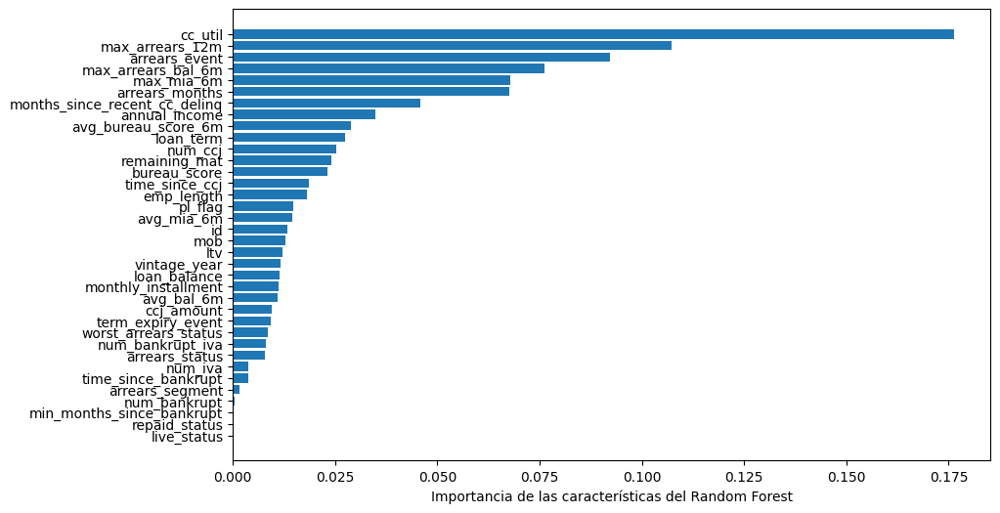

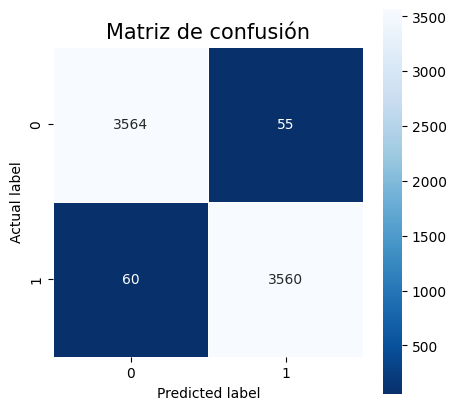

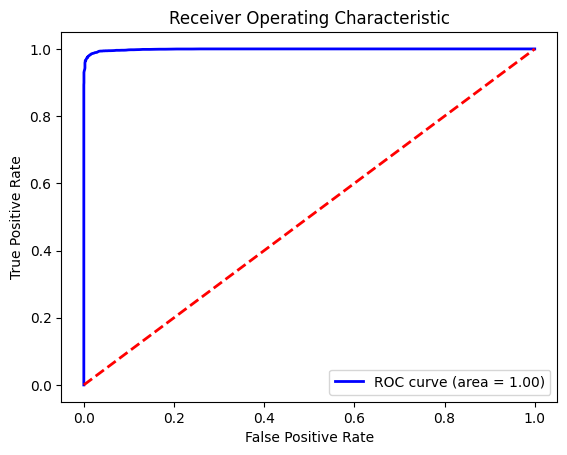

La predicción para la persona con ID 6670001 es: 0


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Divide los datos resampleados en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_resampled, test_size=0.2, random_state=123, stratify=df_resampled['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Entrena el modelo de Random Forest
rf_model = RandomForestClassifier(n_estimators=100, max_features=4, random_state=123)
rf_model.fit(train.drop(columns=['default_indicator']), train['default_indicator'])

# Realiza las predicciones
train_preds = rf_model.predict(train.drop(columns=['default_indicator']))
test_preds = rf_model.predict(test.drop(columns=['default_indicator']))

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores = cross_val_score(rf_model, train.drop(columns=['default_indicator']), train['default_indicator'], cv=5)
print(f'CV scores: {cv_scores}')
print(f'Mean CV score: {cv_scores.mean()}')

# Calcula AUC-ROC
train_probs = rf_model.predict_proba(train.drop(columns=['default_indicator']))[:, 1]
test_probs = rf_model.predict_proba(test.drop(columns=['default_indicator']))[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_probs)
test_auc = roc_auc_score(test['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Analiza la importancia de las características
importances = rf_model.feature_importances_
print(importances)

# Visualiza la importancia de las características
plt.figure(figsize=(10, 6))
sorted_idx = rf_model.feature_importances_.argsort()
plt.barh(train.drop(columns=['default_indicator']).columns[sorted_idx], rf_model.feature_importances_[sorted_idx])
plt.xlabel("Importancia de las características del Random Forest")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size = 15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 6670001

# Localiza la fila de datos para esa persona
person_data = df_resampled[df_resampled['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Haz la predicción utilizando tu modelo de Random Forest
prediction = rf_model.predict(person_data)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')

Modelo Random Forest sin caracteristica de bankrupt_event sin SMOTE

Exactitud del entrenamiento: 100.00%
Exactitud de la prueba: 99.06%
Precision del entrenamiento: 100.00%
Precision de la prueba: 100.00%
Recall del entrenamiento: 100.00%
Recall de la prueba: 82.00%
F1 score del entrenamiento: 100.00%
F1 score de la prueba: 90.11%
CV scores: [0.99312883 0.99067485 0.99214531 0.99337261 0.99239077]
Mean CV score: 0.992342474046098
Train AUC: 1.0
Test AUC: 0.9722969613259668
[1.69279341e-02 6.28463761e-03 1.71688282e-02 1.75845512e-02
 2.08244613e-02 1.39256532e-03 3.43084461e-03 2.80951348e-03
 5.18211862e-03 4.50310390e-03 1.75977592e-04 1.20838836e-03
 5.95996346e-04 2.90700658e-03 1.95557737e-02 2.76297498e-02
 1.51240051e-02 2.06439686e-02 1.40250611e-02 4.54103364e-02
 2.08643009e-02 0.00000000e+00 0.00000000e+00 4.09303072e-01
 8.03573508e-02 1.27919844e-02 2.26752758e-02 2.50222299e-03
 1.94681745e-02 8.94653294e-03 1.70555887e-02 1.95686444e-02
 7.65819745e-02 3.76843651e-02 1.32150382e-02 1.56006526e-02]


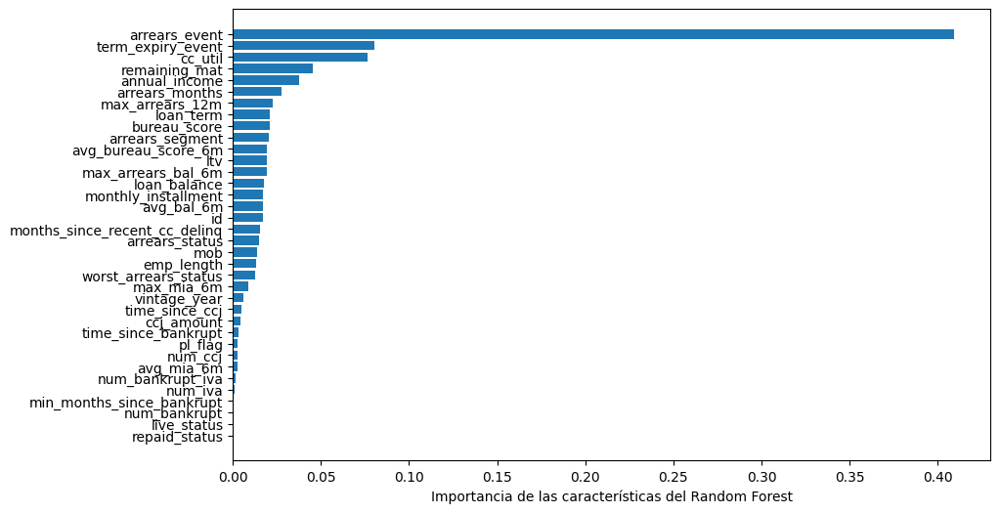

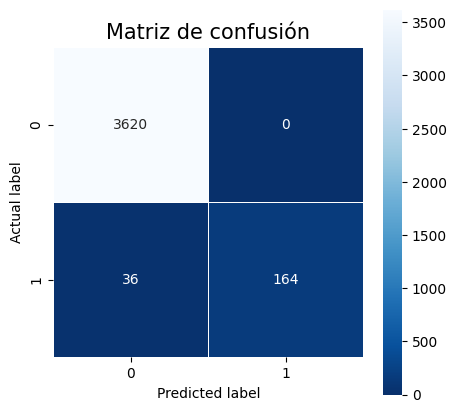

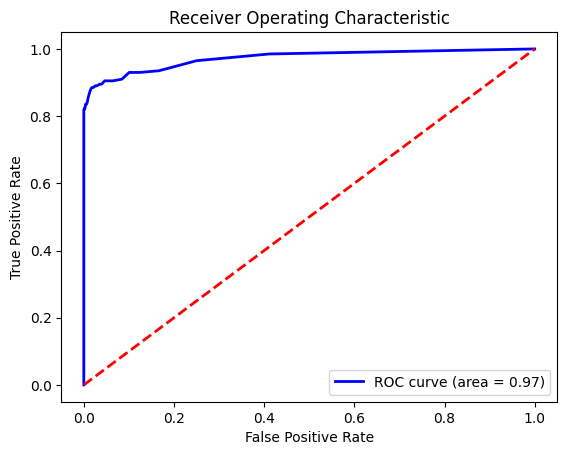

La predicción para la persona con ID 6670001 es: 0


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Divide los datos resampleados en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_cleaned, test_size=0.2, random_state=123, stratify=df_cleaned['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Entrena el modelo de Random Forest
rf_model = RandomForestClassifier(n_estimators=100, max_features=4, random_state=123)
rf_model.fit(train.drop(columns=['default_indicator']), train['default_indicator'])

# Realiza las predicciones
train_preds = rf_model.predict(train.drop(columns=['default_indicator']))
test_preds = rf_model.predict(test.drop(columns=['default_indicator']))

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores = cross_val_score(rf_model, train.drop(columns=['default_indicator']), train['default_indicator'], cv=5)
print(f'CV scores: {cv_scores}')
print(f'Mean CV score: {cv_scores.mean()}')

# Calcula AUC-ROC
train_probs = rf_model.predict_proba(train.drop(columns=['default_indicator']))[:, 1]
test_probs = rf_model.predict_proba(test.drop(columns=['default_indicator']))[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_probs)
test_auc = roc_auc_score(test['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Analiza la importancia de las características
importances = rf_model.feature_importances_
print(importances)

# Visualiza la importancia de las características
plt.figure(figsize=(10, 6))
sorted_idx = rf_model.feature_importances_.argsort()
plt.barh(train.drop(columns=['default_indicator']).columns[sorted_idx], rf_model.feature_importances_[sorted_idx])
plt.xlabel("Importancia de las características del Random Forest")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size = 15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 6670001

# Localiza la fila de datos para esa persona
person_data = df_cleaned[df_cleaned['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Haz la predicción utilizando tu modelo de Random Forest
prediction = rf_model.predict(person_data)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')

# Modelo Arboles binarios sin bankrupt_event con smote y sin smote

Modelo Arboles binarios sin bankrupt_event con SMOTE

Exactitud del entrenamiento: 100.00%
Exactitud de la prueba: 96.33%
Precision del entrenamiento: 100.00%
Precision de la prueba: 95.45%
Recall del entrenamiento: 100.00%
Recall de la prueba: 97.29%
F1 score del entrenamiento: 100.00%
F1 score de la prueba: 96.36%
CV scores: [0.96244496 0.96179746 0.95881896 0.9555757  0.96036783]
Mean CV score: 0.959800982738426
Train AUC: 1.0
Test AUC: 0.9632532566763199
[1.17246340e-02 3.19377553e-03 7.65305183e-03 4.53514285e-03
 2.14966700e-02 2.42439366e-03 5.59034706e-04 7.83543492e-03
 2.76966522e-03 1.25339723e-03 1.88676326e-04 1.64171637e-03
 0.00000000e+00 1.87820539e-02 1.07526975e-02 1.25428763e-02
 1.30184004e-02 0.00000000e+00 9.24208475e-03 8.05639717e-03
 3.57713974e-02 0.00000000e+00 0.00000000e+00 4.89741034e-02
 1.05066783e-02 2.21247701e-02 4.49280075e-01 2.86242539e-03
 1.01449958e-02 4.61400648e-03 4.10135433e-03 6.31071053e-03
 2.28410755e-01 2.37664502e-02 7.57649235e-03 7.88568382e-03]


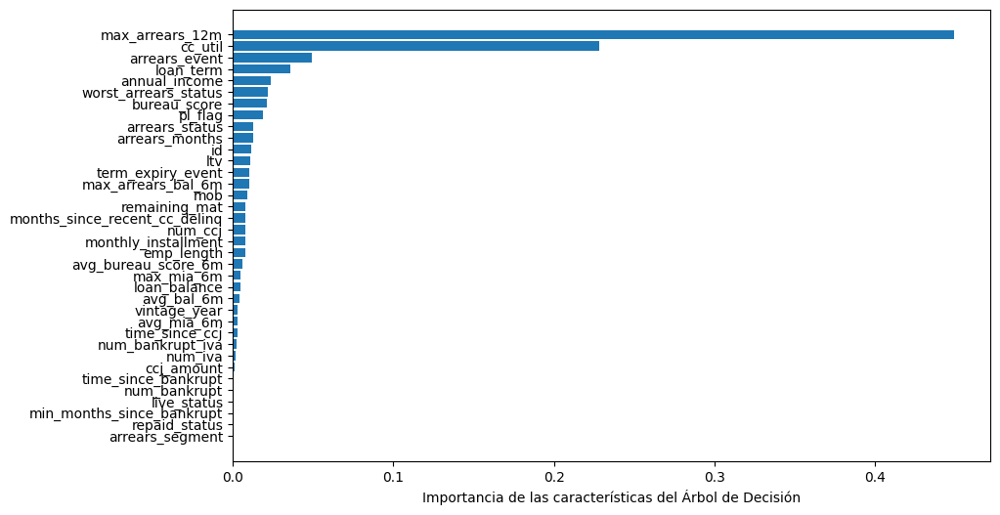

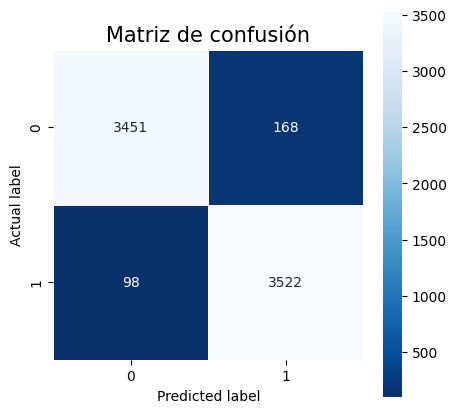

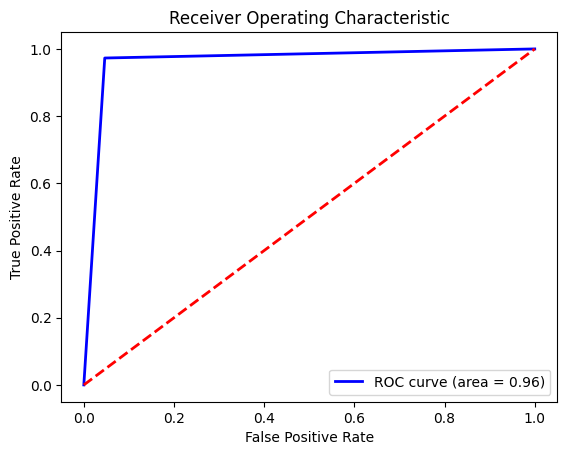

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_resampled, test_size=0.2, random_state=123, stratify=df_resampled['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Entrena el modelo de Árbol de Decisión
dt_model = DecisionTreeClassifier(random_state=123)
dt_model.fit(train.drop(columns=['default_indicator']), train['default_indicator'])

# Realiza las predicciones
train_preds = dt_model.predict(train.drop(columns=['default_indicator']))
test_preds = dt_model.predict(test.drop(columns=['default_indicator']))

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores = cross_val_score(dt_model, train.drop(columns=['default_indicator']), train['default_indicator'], cv=5)
print(f'CV scores: {cv_scores}')
print(f'Mean CV score: {cv_scores.mean()}')

# Calcula AUC-ROC
train_probs = dt_model.predict_proba(train.drop(columns=['default_indicator']))[:, 1]
test_probs = dt_model.predict_proba(test.drop(columns=['default_indicator']))[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_probs)
test_auc = roc_auc_score(test['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Visualiza la importancia de las características
importances = dt_model.feature_importances_
print(importances)

plt.figure(figsize=(10, 6))
sorted_idx = dt_model.feature_importances_.argsort()
plt.barh(train.drop(columns=['default_indicator']).columns[sorted_idx], dt_model.feature_importances_[sorted_idx])
plt.xlabel("Importancia de las características del Árbol de Decisión")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_resampled[df_resampled['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Haz la predicción utilizando tu modelo de Árbol de Decisión
prediction = dt_model.predict(person_data)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')

Modelo Arboles binarios sin bankrupt_event sin smote

Exactitud del entrenamiento: 100.00%
Exactitud de la prueba: 98.06%
Precision del entrenamiento: 100.00%
Precision de la prueba: 80.58%
Recall del entrenamiento: 100.00%
Recall de la prueba: 83.00%
F1 score del entrenamiento: 100.00%
F1 score de la prueba: 81.77%
CV scores: [0.98576687 0.98576687 0.98600884 0.9808542  0.98478154]
Mean CV score: 0.9846356635374409
Train AUC: 1.0
Test AUC: 0.909475138121547
[1.51991105e-02 1.78652663e-03 8.73149032e-03 2.87651405e-03
 1.40145660e-02 0.00000000e+00 3.89335425e-03 1.81725800e-03
 2.86425325e-03 1.94391783e-03 0.00000000e+00 1.45855334e-04
 0.00000000e+00 2.14454619e-03 1.45606344e-02 1.78816899e-03
 0.00000000e+00 0.00000000e+00 6.61005304e-03 6.28833334e-03
 4.49366996e-03 0.00000000e+00 0.00000000e+00 6.85408452e-01
 1.60842378e-01 7.40444335e-04 1.92329419e-03 0.00000000e+00
 4.15708570e-03 0.00000000e+00 5.02691716e-03 1.05615652e-02
 1.70434624e-02 1.67335598e-02 2.10601417e-03 6.29857460e-03]


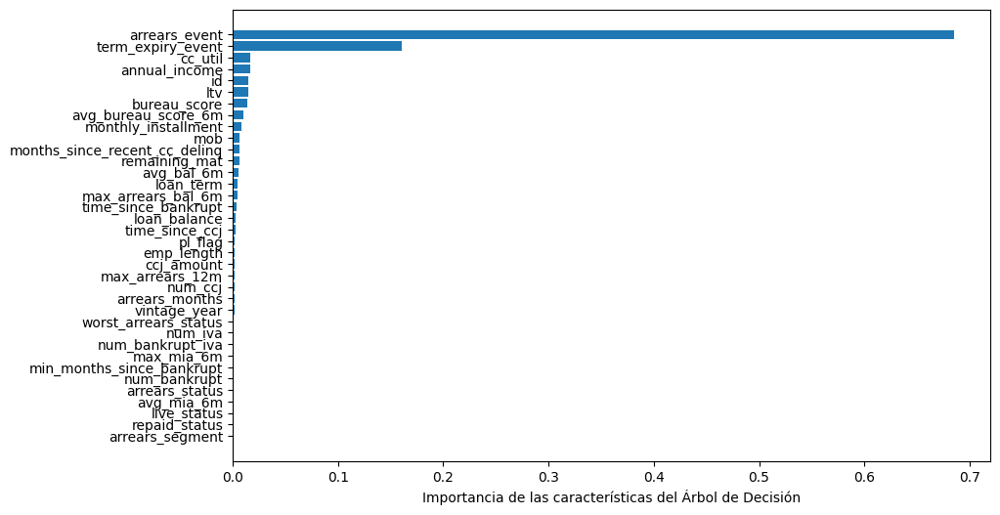

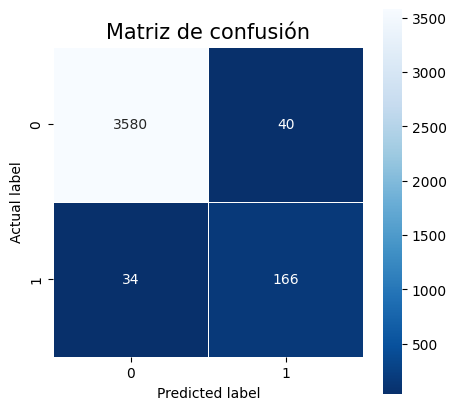

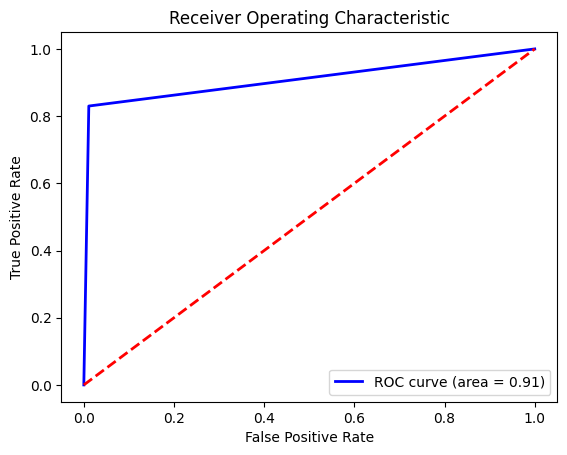

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_cleaned, test_size=0.2, random_state=123, stratify=df_cleaned['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Entrena el modelo de Árbol de Decisión
dt_model = DecisionTreeClassifier(random_state=123)
dt_model.fit(train.drop(columns=['default_indicator']), train['default_indicator'])

# Realiza las predicciones
train_preds = dt_model.predict(train.drop(columns=['default_indicator']))
test_preds = dt_model.predict(test.drop(columns=['default_indicator']))

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores = cross_val_score(dt_model, train.drop(columns=['default_indicator']), train['default_indicator'], cv=5)
print(f'CV scores: {cv_scores}')
print(f'Mean CV score: {cv_scores.mean()}')

# Calcula AUC-ROC
train_probs = dt_model.predict_proba(train.drop(columns=['default_indicator']))[:, 1]
test_probs = dt_model.predict_proba(test.drop(columns=['default_indicator']))[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_probs)
test_auc = roc_auc_score(test['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Visualiza la importancia de las características
importances = dt_model.feature_importances_
print(importances)

plt.figure(figsize=(10, 6))
sorted_idx = dt_model.feature_importances_.argsort()
plt.barh(train.drop(columns=['default_indicator']).columns[sorted_idx], dt_model.feature_importances_[sorted_idx])
plt.xlabel("Importancia de las características del Árbol de Decisión")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_cleaned[df_cleaned['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Haz la predicción utilizando tu modelo de Árbol de Decisión
prediction = dt_model.predict(person_data)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')

#Modelo gradient boosting sin bankrupt_event con smote y sin smote


Modelo gradient boosting sin bankrupt_event con smote

Exactitud del entrenamiento: 99.82%
Exactitud de la prueba: 97.87%
Precision del entrenamiento: 99.86%
Precision de la prueba: 97.87%
Recall del entrenamiento: 99.78%
Recall de la prueba: 97.87%
F1 score del entrenamiento: 99.82%
F1 score de la prueba: 97.87%
CV scores: [0.97733748 0.98407148 0.98070448 0.97694599 0.97992488]
Mean CV score: 0.9797968627524384
Train AUC: 0.9999314708636342
Test AUC: 0.9971255909953454
[3.56304840e-03 2.80988911e-03 2.26569267e-03 7.75855482e-04
 1.52234495e-02 3.97249463e-03 2.88984122e-04 7.94100952e-03
 2.54117050e-04 3.27268205e-04 2.45523201e-06 3.28537805e-04
 5.04494656e-05 8.01765291e-03 2.35936859e-03 1.00824651e-02
 2.69096098e-03 0.00000000e+00 2.77967158e-03 1.56239319e-03
 3.48129262e-02 0.00000000e+00 0.00000000e+00 7.29699950e-02
 1.13361650e-02 2.71820030e-02 4.91622825e-01 2.02509369e-04
 3.33779537e-03 2.10120677e-03 1.69233508e-03 1.16419727e-03
 2.74969795e-01 8.71204982e-03 2.36992600e-03 2.23050776e-03]


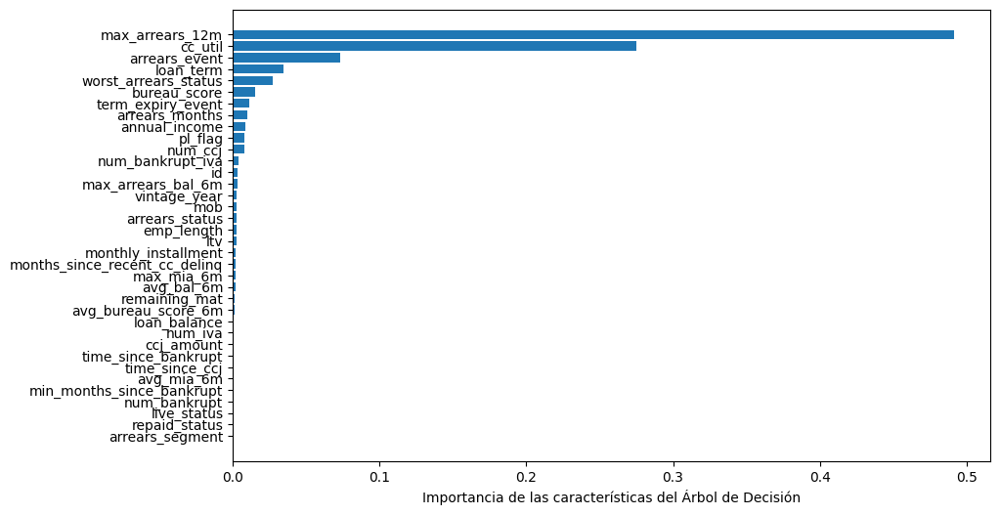

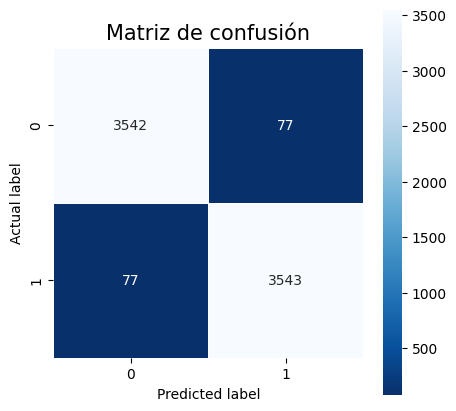

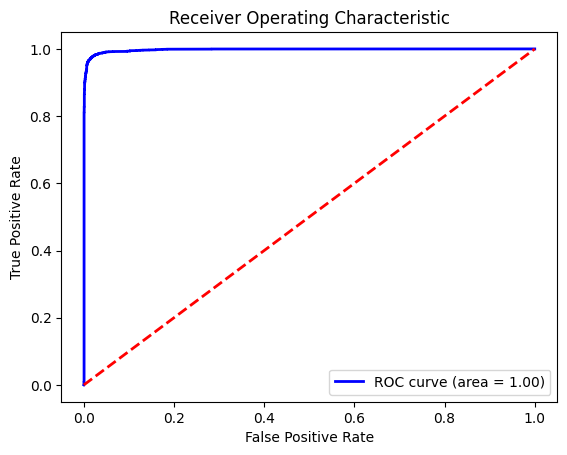

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_resampled, test_size=0.2, random_state=123, stratify=df_resampled['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Entrena el modelo de Gradient Boosting
gb_model = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=4, random_state=123)
gb_model.fit(train.drop(columns=['default_indicator']), train['default_indicator'])

# Realiza las predicciones
train_preds = gb_model.predict(train.drop(columns=['default_indicator']))
test_preds = gb_model.predict(test.drop(columns=['default_indicator']))

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores = cross_val_score(gb_model, train.drop(columns=['default_indicator']), train['default_indicator'], cv=5)
print(f'CV scores: {cv_scores}')
print(f'Mean CV score: {cv_scores.mean()}')

# Calcula AUC-ROC
train_probs = gb_model.predict_proba(train.drop(columns=['default_indicator']))[:, 1]
test_probs = gb_model.predict_proba(test.drop(columns=['default_indicator']))[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_probs)
test_auc = roc_auc_score(test['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Visualiza la importancia de las características
importances = gb_model.feature_importances_
print(importances)

plt.figure(figsize=(10, 6))
sorted_idx = gb_model.feature_importances_.argsort()
plt.barh(train.drop(columns=['default_indicator']).columns[sorted_idx], gb_model.feature_importances_[sorted_idx])
plt.xlabel("Importancia de las características del Árbol de Decisión")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_resampled[df_resampled['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Haz la predicción utilizando tu modelo de Gradient Boosting
prediction = gb_model.predict(person_data)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')

Modelo gradient boosting sin bankrupt_event sin smote

Exactitud del entrenamiento: 99.67%
Exactitud de la prueba: 98.48%
Precision del entrenamiento: 99.02%
Precision de la prueba: 88.59%
Recall del entrenamiento: 94.67%
Recall de la prueba: 81.50%
F1 score del entrenamiento: 96.80%
F1 score de la prueba: 84.90%
CV scores: [0.99018405 0.98527607 0.98355425 0.98453608 0.98551792]
Mean CV score: 0.9858136740244134
Train AUC: 0.9912303215129585
Test AUC: 0.9491740331491713
[2.69911628e-02 4.74630208e-04 3.46600167e-02 3.32382976e-02
 7.28076436e-03 0.00000000e+00 1.56259106e-03 3.18158139e-08
 4.97822831e-04 1.39250837e-03 0.00000000e+00 4.11248257e-04
 1.82634145e-02 2.93696790e-17 5.34040048e-02 1.15433713e-05
 5.68269139e-16 1.63923790e-16 1.49871494e-02 1.97611777e-03
 2.88454731e-05 0.00000000e+00 0.00000000e+00 3.60122018e-01
 8.35236746e-02 7.69007416e-04 1.31194179e-03 3.03145526e-04
 1.32991607e-03 7.69007416e-04 3.91868621e-02 2.15865653e-03
 1.77279538e-02 2.91527080e-01 4.55398975e-03 1.53659736e-03]


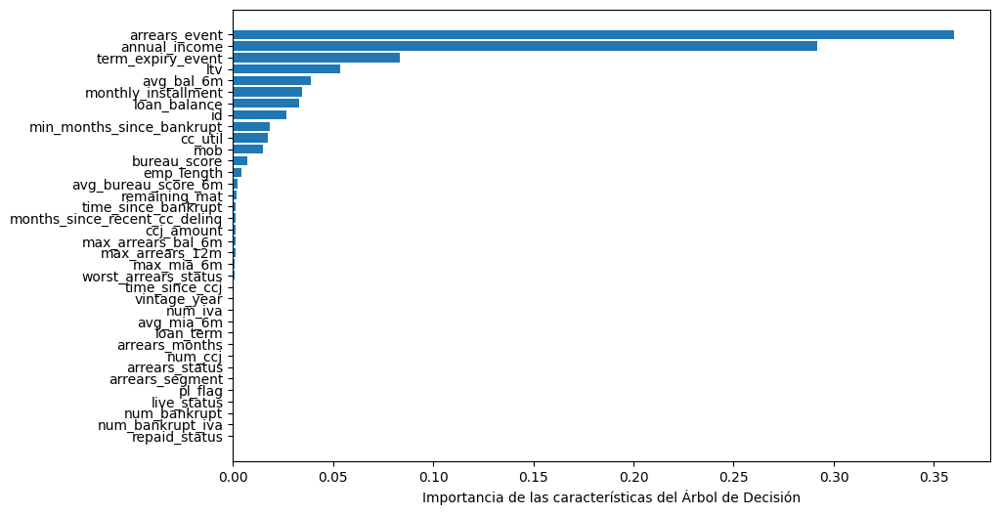

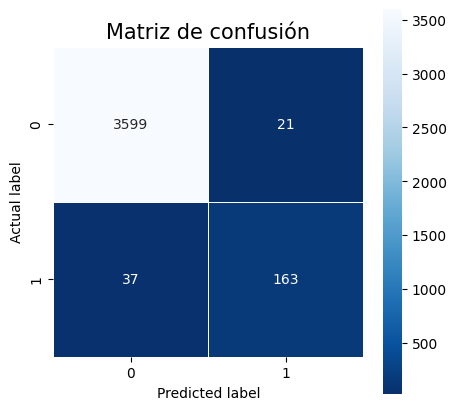

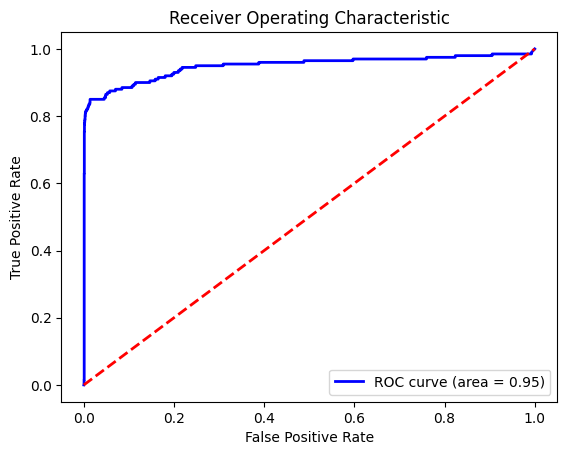

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_cleaned, test_size=0.2, random_state=123, stratify=df_cleaned['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Entrena el modelo de Gradient Boosting
gb_model = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=4, random_state=123)
gb_model.fit(train.drop(columns=['default_indicator']), train['default_indicator'])

# Realiza las predicciones
train_preds = gb_model.predict(train.drop(columns=['default_indicator']))
test_preds = gb_model.predict(test.drop(columns=['default_indicator']))

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores = cross_val_score(gb_model, train.drop(columns=['default_indicator']), train['default_indicator'], cv=5)
print(f'CV scores: {cv_scores}')
print(f'Mean CV score: {cv_scores.mean()}')

# Calcula AUC-ROC
train_probs = gb_model.predict_proba(train.drop(columns=['default_indicator']))[:, 1]
test_probs = gb_model.predict_proba(test.drop(columns=['default_indicator']))[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_probs)
test_auc = roc_auc_score(test['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Visualiza la importancia de las características
importances = gb_model.feature_importances_
print(importances)

plt.figure(figsize=(10, 6))
sorted_idx = gb_model.feature_importances_.argsort()
plt.barh(train.drop(columns=['default_indicator']).columns[sorted_idx], gb_model.feature_importances_[sorted_idx])
plt.xlabel("Importancia de las características del Árbol de Decisión")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_cleaned[df_cleaned['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Haz la predicción utilizando tu modelo de Gradient Boosting
prediction = gb_model.predict(person_data)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')

#Modelo DNN sin bankrupt_event con smote y sin smote



Modelo DNN sin bankrupt_event con smote

Epoch 1/10
1207/1207 [==============================] - 6s 4ms/step - loss: 0.1694 - accuracy: 0.9331
Epoch 2/10
1207/1207 [==============================] - 6s 5ms/step - loss: 0.1039 - accuracy: 0.9569
Epoch 3/10
1207/1207 [==============================] - 4s 4ms/step - loss: 0.0930 - accuracy: 0.9625
Epoch 4/10
1207/1207 [==============================] - 5s 4ms/step - loss: 0.0864 - accuracy: 0.9644
Epoch 5/10
1207/1207 [==============================] - 5s 4ms/step - loss: 0.0816 - accuracy: 0.9660
Epoch 6/10
1207/1207 [==============================] - 5s 4ms/step - loss: 0.0787 - accuracy: 0.9673
Epoch 7/10
1207/1207 [==============================] - 4s 3ms/step - loss: 0.0753 - accuracy: 0.9688
Epoch 8/10
1207/1207 [==============================] - 3s 3ms/step - loss: 0.0730 - accuracy: 0.9699
Epoch 9/10
1207/1207 [==============================] - 4s 3ms/step - loss: 0.0696 - accuracy: 0.9719
Epoch 10/10
227/227 [==============================] - 1s 2ms/step
Exactitud del e

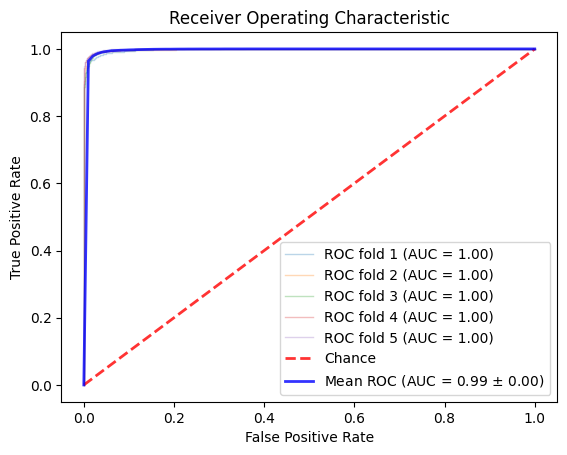

Mean CV accuracy: 97.87%
Train AUC: 0.9991
Test AUC: 0.9983


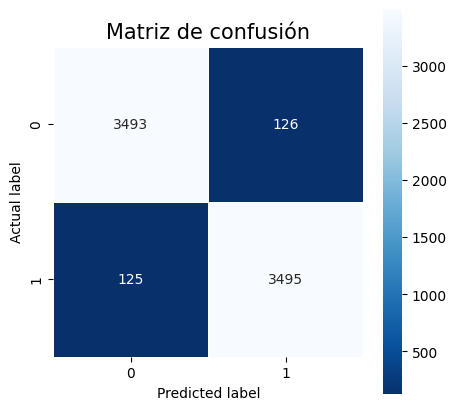

1207/1207 [==============================] - 2s 2ms/step


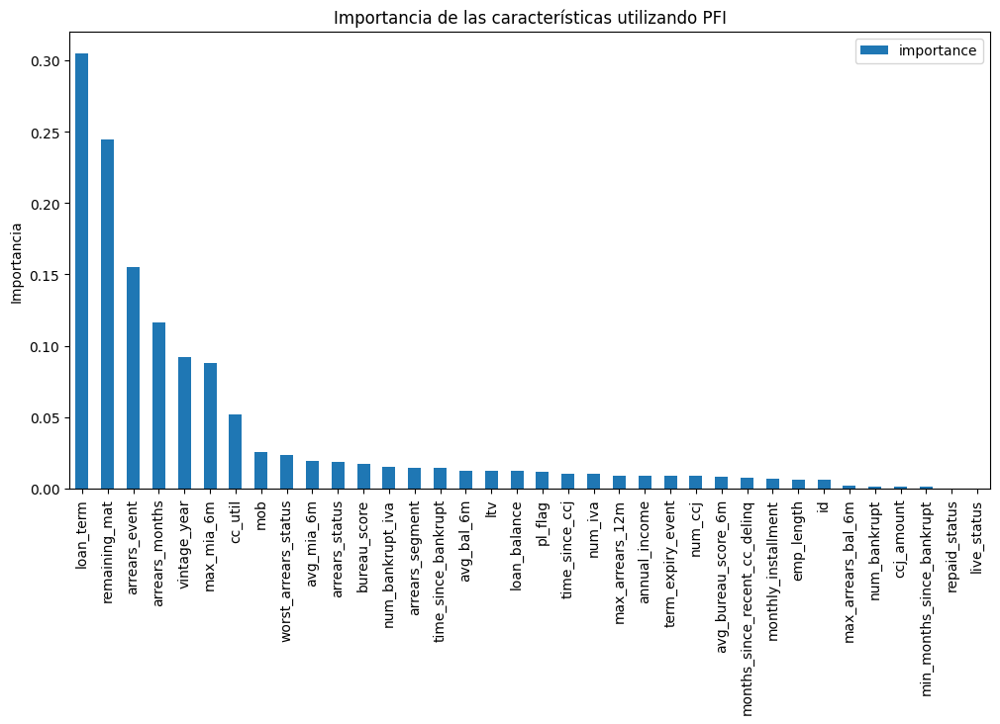

1/1 [==============================] - 0s 32ms/step
La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, auc, confusion_matrix, accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Define una función para calcular la precisión del modelo
def score(X, y):
    y_pred = (model.predict(X) > 0.5).astype(int)
    return accuracy_score(y, y_pred)

class KerasModelWrapper:
    def __init__(self, model):
        self.model = model

    def fit(self, X, y):
        self.model.fit(X, y, epochs=10, batch_size=32, verbose=0)

    def predict(self, X):
        return (self.model.predict(X) > 0.5).astype(int)

    def score(self, X, y):
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train_df, temp = train_test_split(df_resampled, test_size=0.2, random_state=123, stratify=df_resampled['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Normaliza los datos
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train_df.drop(columns=['default_indicator']))
test_scaled = scaler.transform(test.drop(columns=['default_indicator']))

# Crea el modelo de DNN
model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(32, activation='relu', input_shape=(train_scaled.shape[1],)),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compila el modelo
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Entrena el modelo
model.fit(train_scaled, train_df['default_indicator'], epochs=10, batch_size=32)

# Evalúa el rendimiento
train_acc = model.evaluate(train_scaled, train_df['default_indicator'], verbose=0)[1]
test_acc = model.evaluate(test_scaled, test['default_indicator'], verbose=0)[1]

train_preds = (model.predict(train_scaled) > 0.5).astype(int)
test_preds = (model.predict(test_scaled) > 0.5).astype(int)

train_precision = precision_score(train_df['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train_df['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train_df['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precisión del entrenamiento: {train_precision*100:.2f}%')
print(f'Precisión de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada y calcula el AUC-ROC
cv = StratifiedKFold(n_splits=5)
train_auc_scores = []
test_auc_scores = []
cv_scores = []

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

for train_index, test_index in cv.split(train_scaled, train_df['default_indicator']):
    X_train_cv, X_test_cv = train_scaled[train_index], train_scaled[test_index]
    y_train_cv, y_test_cv = train_df['default_indicator'].iloc[train_index], train_df['default_indicator'].iloc[test_index]

    model.fit(X_train_cv, y_train_cv, epochs=10, batch_size=32, verbose=0)

    train_probs_cv = model.predict(X_train_cv)
    test_probs_cv = model.predict(X_test_cv)

    train_auc_cv = roc_auc_score(y_train_cv, train_probs_cv)
    test_auc_cv = roc_auc_score(y_test_cv, test_probs_cv)

    train_auc_scores.append(train_auc_cv)
    test_auc_scores.append(test_auc_cv)

    cv_scores.append(model.evaluate(X_test_cv, y_test_cv, verbose=0)[1])

    fpr, tpr, _ = roc_curve(y_test_cv, test_probs_cv)
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (len(aucs), roc_auc))

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

print(f'Mean CV accuracy: {np.mean(cv_scores)*100:.2f}%')
print(f'Train AUC: {np.mean(train_auc_scores):.4f}')
print(f'Test AUC: {np.mean(test_auc_scores):.4f}')

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Envuelve tu modelo de TensorFlow en el envoltorio
wrapped_model = KerasModelWrapper(model)

# Calcula la importancia de las características
result = permutation_importance(wrapped_model, train_scaled, train_df['default_indicator'], n_repeats=10)

# Crea un DataFrame para visualizar los resultados
importance_df = pd.DataFrame(result.importances_mean, index=train_df.drop(columns=['default_indicator']).columns, columns=['importance'])
importance_df.sort_values(by='importance', ascending=False, inplace=True)

# Visualiza la importancia de las características
importance_df.plot(kind='bar', figsize=(12, 6))
plt.title('Importancia de las características utilizando PFI')
plt.ylabel('Importancia')
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_resampled[df_resampled['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Normaliza los datos de la persona
person_data_scaled = scaler.transform(person_data)

# Haz la predicción utilizando tu modelo de DNN
prediction = model.predict(person_data_scaled)

# Como la salida es una probabilidad, la convertimos a una clase binaria
prediction_class = (prediction > 0.5).astype(int)

print(f'La predicción para la persona con ID {person_id} es: {prediction_class[0][0]}')


Modelo DNN sin bankrupt_event sin smote

Epoch 1/10
637/637 [==============================] - 3s 3ms/step - loss: 0.0849 - accuracy: 0.9817
Epoch 2/10
637/637 [==============================] - 2s 2ms/step - loss: 0.0365 - accuracy: 0.9921
Epoch 3/10
637/637 [==============================] - 2s 3ms/step - loss: 0.0340 - accuracy: 0.9923
Epoch 4/10
637/637 [==============================] - 3s 4ms/step - loss: 0.0325 - accuracy: 0.9921
Epoch 5/10
637/637 [==============================] - 4s 7ms/step - loss: 0.0316 - accuracy: 0.9924
Epoch 6/10
637/637 [==============================] - 4s 6ms/step - loss: 0.0306 - accuracy: 0.9925
Epoch 7/10
637/637 [==============================] - 3s 5ms/step - loss: 0.0300 - accuracy: 0.9928
Epoch 8/10
637/637 [==============================] - 2s 4ms/step - loss: 0.0294 - accuracy: 0.9925
Epoch 9/10
637/637 [==============================] - 3s 4ms/step - loss: 0.0286 - accuracy: 0.9926
Epoch 10/10
120/120 [==============================] - 0s 2ms/step
Exactitud del entrenamiento: 99.2

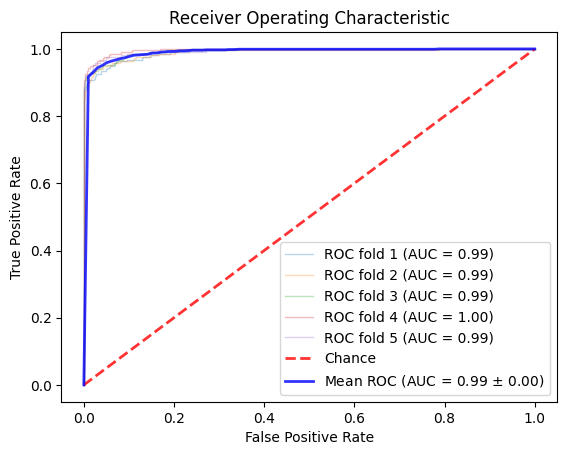

Mean CV accuracy: 99.30%
Train AUC: 0.9985
Test AUC: 0.9927


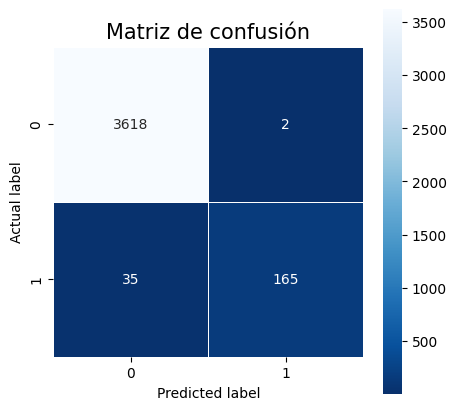

637/637 [==============================] - 1s 1ms/step


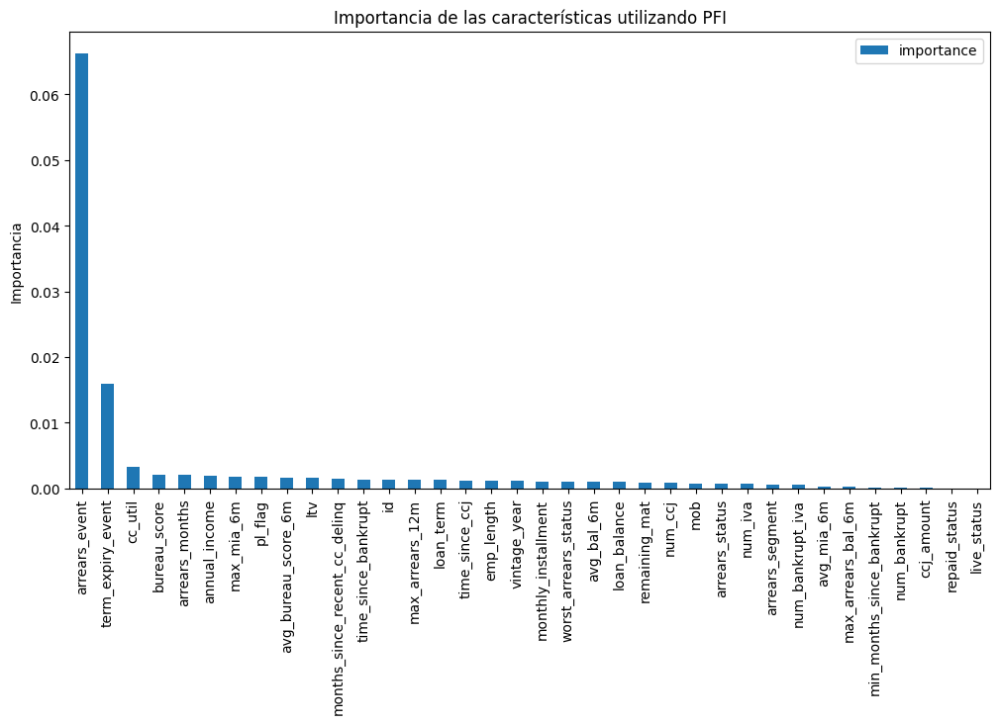

1/1 [==============================] - 0s 18ms/step
La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, auc, confusion_matrix, accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Define una función para calcular la precisión del modelo
def score(X, y):
    y_pred = (model.predict(X) > 0.5).astype(int)
    return accuracy_score(y, y_pred)

class KerasModelWrapper:
    def __init__(self, model):
        self.model = model

    def fit(self, X, y):
        self.model.fit(X, y, epochs=10, batch_size=32, verbose=0)

    def predict(self, X):
        return (self.model.predict(X) > 0.5).astype(int)

    def score(self, X, y):
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train_df, temp = train_test_split(df_cleaned, test_size=0.2, random_state=123, stratify=df_cleaned['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Normaliza los datos
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train_df.drop(columns=['default_indicator']))
test_scaled = scaler.transform(test.drop(columns=['default_indicator']))

# Crea el modelo de DNN
model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(32, activation='relu', input_shape=(train_scaled.shape[1],)),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compila el modelo
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Entrena el modelo
model.fit(train_scaled, train_df['default_indicator'], epochs=10, batch_size=32)

# Evalúa el rendimiento
train_acc = model.evaluate(train_scaled, train_df['default_indicator'], verbose=0)[1]
test_acc = model.evaluate(test_scaled, test['default_indicator'], verbose=0)[1]

train_preds = (model.predict(train_scaled) > 0.5).astype(int)
test_preds = (model.predict(test_scaled) > 0.5).astype(int)

train_precision = precision_score(train_df['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train_df['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train_df['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precisión del entrenamiento: {train_precision*100:.2f}%')
print(f'Precisión de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada y calcula el AUC-ROC
cv = StratifiedKFold(n_splits=5)
train_auc_scores = []
test_auc_scores = []
cv_scores = []

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

for train_index, test_index in cv.split(train_scaled, train_df['default_indicator']):
    X_train_cv, X_test_cv = train_scaled[train_index], train_scaled[test_index]
    y_train_cv, y_test_cv = train_df['default_indicator'].iloc[train_index], train_df['default_indicator'].iloc[test_index]

    model.fit(X_train_cv, y_train_cv, epochs=10, batch_size=32, verbose=0)

    train_probs_cv = model.predict(X_train_cv)
    test_probs_cv = model.predict(X_test_cv)

    train_auc_cv = roc_auc_score(y_train_cv, train_probs_cv)
    test_auc_cv = roc_auc_score(y_test_cv, test_probs_cv)

    train_auc_scores.append(train_auc_cv)
    test_auc_scores.append(test_auc_cv)

    cv_scores.append(model.evaluate(X_test_cv, y_test_cv, verbose=0)[1])

    fpr, tpr, _ = roc_curve(y_test_cv, test_probs_cv)
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (len(aucs), roc_auc))

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

print(f'Mean CV accuracy: {np.mean(cv_scores)*100:.2f}%')
print(f'Train AUC: {np.mean(train_auc_scores):.4f}')
print(f'Test AUC: {np.mean(test_auc_scores):.4f}')

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Envuelve tu modelo de TensorFlow en el envoltorio
wrapped_model = KerasModelWrapper(model)

# Calcula la importancia de las características
result = permutation_importance(wrapped_model, train_scaled, train_df['default_indicator'], n_repeats=10)

# Crea un DataFrame para visualizar los resultados
importance_df = pd.DataFrame(result.importances_mean, index=train_df.drop(columns=['default_indicator']).columns, columns=['importance'])
importance_df.sort_values(by='importance', ascending=False, inplace=True)

# Visualiza la importancia de las características
importance_df.plot(kind='bar', figsize=(12, 6))
plt.title('Importancia de las características utilizando PFI')
plt.ylabel('Importancia')
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_cleaned[df_cleaned['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Normaliza los datos de la persona
person_data_scaled = scaler.transform(person_data)

# Haz la predicción utilizando tu modelo de DNN
prediction = model.predict(person_data_scaled)

# Como la salida es una probabilidad, la convertimos a una clase binaria
prediction_class = (prediction > 0.5).astype(int)

print(f'La predicción para la persona con ID {person_id} es: {prediction_class[0][0]}')

# Regresión Logistica sin bankrupt_event con smote y sin smote



Regresión Logistica sin bankrupt_event con smote

Exactitud del entrenamiento: 96.34%
Exactitud de la prueba: 95.91%
Precision del entrenamiento: 97.03%
Precision de la prueba: 96.63%
Recall del entrenamiento: 95.60%
Recall de la prueba: 95.14%
F1 score del entrenamiento: 96.31%
F1 score de la prueba: 95.88%
AUC del entrenamiento: 0.99
AUC de la prueba: 0.99
CV Scores: [0.9935423  0.99478431 0.99376675 0.99438553 0.99377769]
Mean CV Score: 0.99


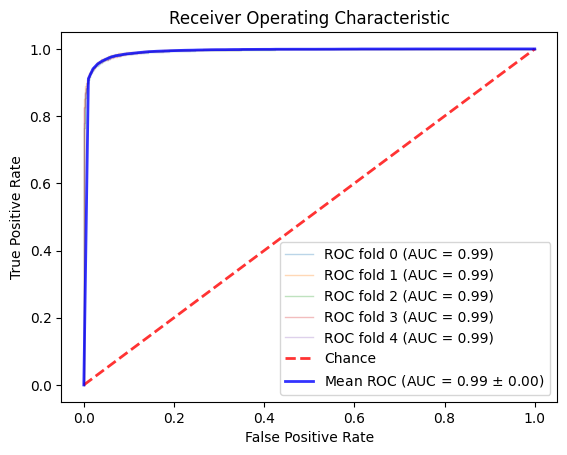

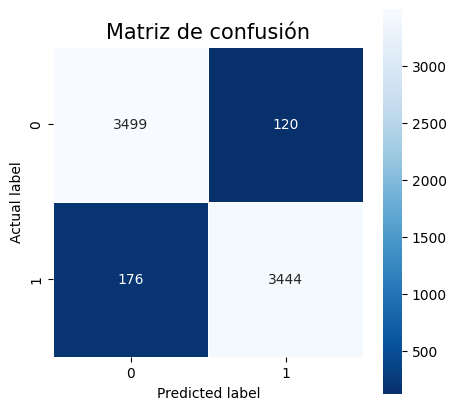

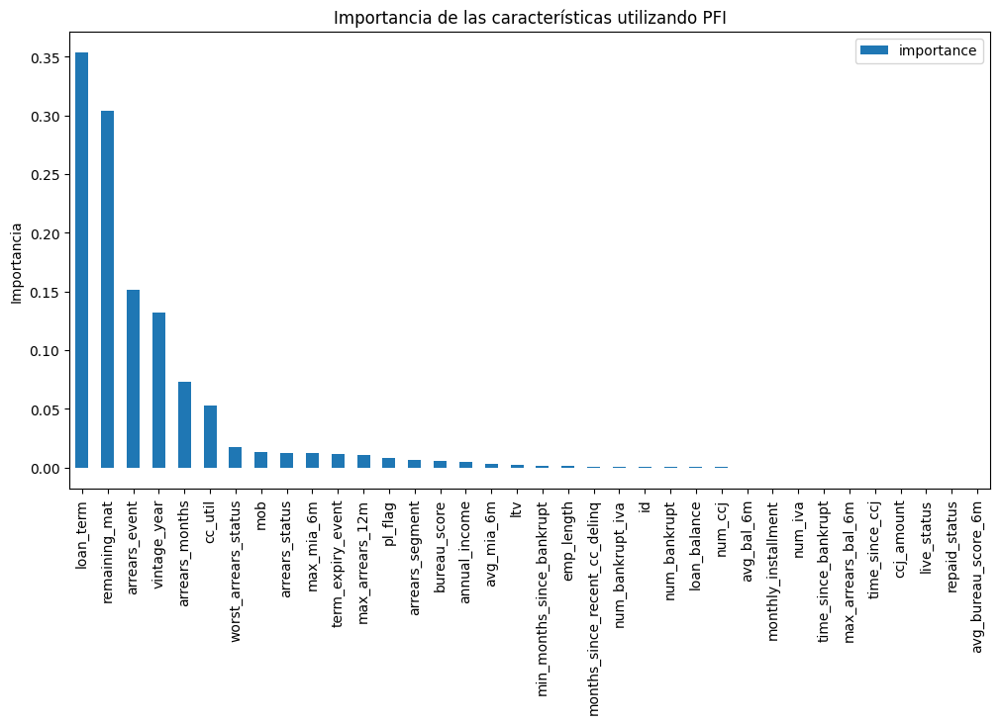

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_resampled, test_size=0.2, random_state=123, stratify=df_resampled['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Normaliza los datos
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train.drop(columns=['default_indicator']))
test_scaled = scaler.transform(test.drop(columns=['default_indicator']))

# Entrena el modelo de Regresión Logística
lr_model = LogisticRegression(max_iter=1000, random_state=123)
lr_model.fit(train_scaled, train['default_indicator'])

# Realiza las predicciones
train_preds = lr_model.predict(train_scaled)
test_preds = lr_model.predict(test_scaled)

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Calcula el AUC-ROC para entrenamiento y prueba
train_proba = lr_model.predict_proba(train_scaled)[:, 1]
test_proba = lr_model.predict_proba(test_scaled)[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_proba)
test_auc = roc_auc_score(test['default_indicator'], test_proba)
print(f'AUC del entrenamiento: {train_auc:.2f}')
print(f'AUC de la prueba: {test_auc:.2f}')

# Realiza la validación cruzada y calcula el AUC-ROC
cv = StratifiedKFold(n_splits=5)
tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)
i = 0

cv_scores = cross_val_score(lr_model, train_scaled, train['default_indicator'], cv=cv, scoring='roc_auc')
mean_cv_score = np.mean(cv_scores)
print(f'CV Scores: {cv_scores}')
print(f'Mean CV Score: {mean_cv_score:.2f}')

for train_idx, test_idx in cv.split(train_scaled, train['default_indicator']):
    probas_ = lr_model.fit(train_scaled[train_idx], train['default_indicator'].iloc[train_idx]).predict_proba(train_scaled[test_idx])
    # Compute ROC curve and area under the curve
    fpr, tpr, thresholds = roc_curve(train['default_indicator'].iloc[test_idx], probas_[:, 1])
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Obtiene los coeficientes del modelo
coefficients = lr_model.coef_[0]

# Crea un DataFrame para visualizar los resultados
coefficients_df = pd.DataFrame(coefficients, index=train.drop(columns=['default_indicator']).columns, columns=['Coefficient'])

# Ordena los coeficientes por su valor absoluto
coefficients_df['abs'] = coefficients_df['Coefficient'].abs()
sorted_df = coefficients_df.sort_values('abs', ascending=False).drop('abs', axis=1)


# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Calcula la importancia de las características
result = permutation_importance(lr_model, train_scaled, train['default_indicator'], n_repeats=10)

# Crea un DataFrame para visualizar los resultados
importance_df = pd.DataFrame(result.importances_mean, index=train.drop(columns=['default_indicator']).columns, columns=['importance'])
importance_df.sort_values(by='importance', ascending=False, inplace=True)

# Visualiza la importancia de las características
importance_df.plot(kind='bar', figsize=(12, 6))
plt.title('Importancia de las características utilizando PFI')
plt.ylabel('Importancia')
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_resampled[df_resampled['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Normaliza los datos de la persona
person_data_scaled = scaler.transform(person_data)

# Haz la predicción utilizando tu modelo de Regresión Logística
prediction = lr_model.predict(person_data_scaled)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')



Regresión Logistica sin bankrupt_event sin smote


Exactitud del entrenamiento: 99.24%
Exactitud de la prueba: 99.03%
Precision del entrenamiento: 99.67%
Precision de la prueba: 98.80%
Recall del entrenamiento: 85.78%
Recall de la prueba: 82.50%
F1 score del entrenamiento: 92.21%
F1 score de la prueba: 89.92%
AUC del entrenamiento: 0.99
AUC de la prueba: 0.99
CV Scores: [0.98691807 0.98224638 0.98257281 0.9859341  0.98486877]
Mean CV Score: 0.98


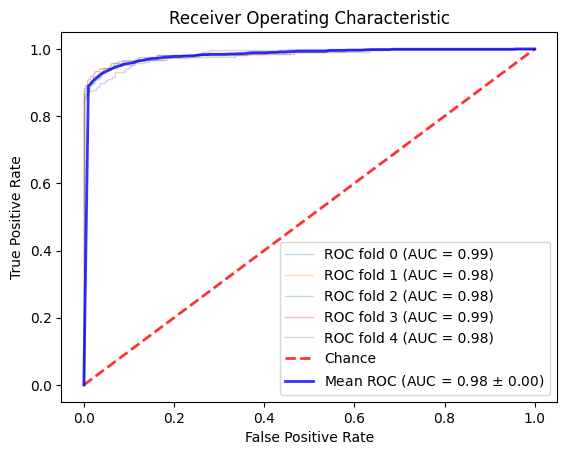

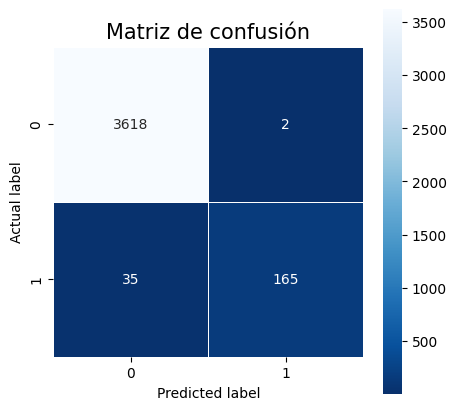

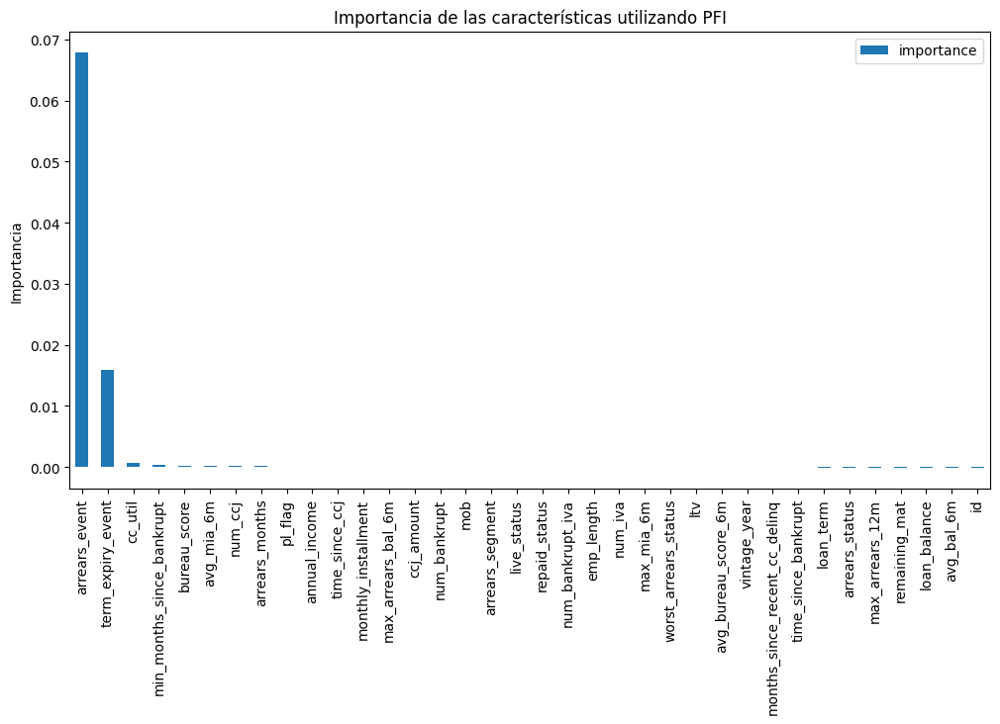

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_cleaned, test_size=0.2, random_state=123, stratify=df_cleaned['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Normaliza los datos
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train.drop(columns=['default_indicator']))
test_scaled = scaler.transform(test.drop(columns=['default_indicator']))

# Entrena el modelo de Regresión Logística
lr_model = LogisticRegression(max_iter=1000, random_state=123)
lr_model.fit(train_scaled, train['default_indicator'])

# Realiza las predicciones
train_preds = lr_model.predict(train_scaled)
test_preds = lr_model.predict(test_scaled)

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Calcula el AUC-ROC para entrenamiento y prueba
train_proba = lr_model.predict_proba(train_scaled)[:, 1]
test_proba = lr_model.predict_proba(test_scaled)[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_proba)
test_auc = roc_auc_score(test['default_indicator'], test_proba)
print(f'AUC del entrenamiento: {train_auc:.2f}')
print(f'AUC de la prueba: {test_auc:.2f}')

# Realiza la validación cruzada y calcula el AUC-ROC
cv = StratifiedKFold(n_splits=5)
tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)
i = 0

cv_scores = cross_val_score(lr_model, train_scaled, train['default_indicator'], cv=cv, scoring='roc_auc')
mean_cv_score = np.mean(cv_scores)
print(f'CV Scores: {cv_scores}')
print(f'Mean CV Score: {mean_cv_score:.2f}')

for train_idx, test_idx in cv.split(train_scaled, train['default_indicator']):
    probas_ = lr_model.fit(train_scaled[train_idx], train['default_indicator'].iloc[train_idx]).predict_proba(train_scaled[test_idx])
    # Compute ROC curve and area under the curve
    fpr, tpr, thresholds = roc_curve(train['default_indicator'].iloc[test_idx], probas_[:, 1])
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Obtiene los coeficientes del modelo
coefficients = lr_model.coef_[0]

# Crea un DataFrame para visualizar los resultados
coefficients_df = pd.DataFrame(coefficients, index=train.drop(columns=['default_indicator']).columns, columns=['Coefficient'])

# Ordena los coeficientes por su valor absoluto
coefficients_df['abs'] = coefficients_df['Coefficient'].abs()
sorted_df = coefficients_df.sort_values('abs', ascending=False).drop('abs', axis=1)


# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Calcula la importancia de las características
result = permutation_importance(lr_model, train_scaled, train['default_indicator'], n_repeats=10)

# Crea un DataFrame para visualizar los resultados
importance_df = pd.DataFrame(result.importances_mean, index=train.drop(columns=['default_indicator']).columns, columns=['importance'])
importance_df.sort_values(by='importance', ascending=False, inplace=True)

# Visualiza la importancia de las características
importance_df.plot(kind='bar', figsize=(12, 6))
plt.title('Importancia de las características utilizando PFI')
plt.ylabel('Importancia')
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_cleaned[df_cleaned['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Normaliza los datos de la persona
person_data_scaled = scaler.transform(person_data)

# Haz la predicción utilizando tu modelo de Regresión Logística
prediction = lr_model.predict(person_data_scaled)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')




#Modelo Support Vector Machine sin bankrupt_event con smote y sin smote




Modelo Support Vector Machine sin bankrupt_event con smote

Exactitud del entrenamiento: 96.88%
Exactitud de la prueba: 96.67%
Precision del entrenamiento: 97.84%
Precision de la prueba: 97.63%
Recall del entrenamiento: 95.88%
Recall de la prueba: 95.66%
F1 score del entrenamiento: 96.85%
F1 score de la prueba: 96.64%
AUC del entrenamiento: 1.00
AUC de la prueba: 0.99
CV Scores: [0.99450169 0.99557962 0.99460419 0.99522654 0.99494996]
Mean CV Score: 0.99


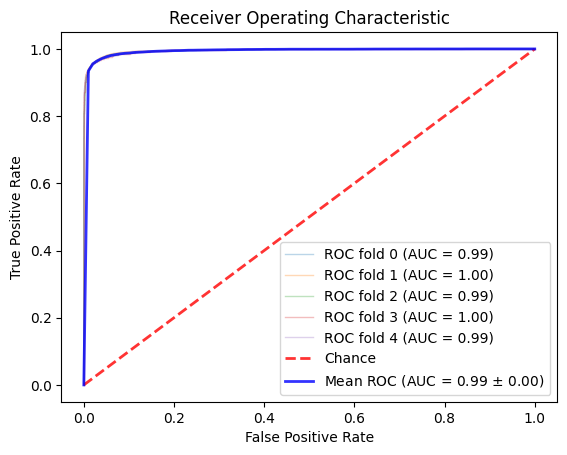

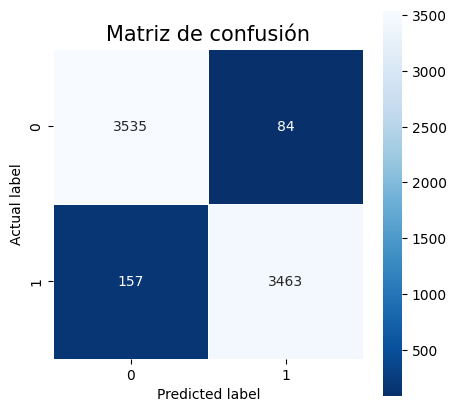

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


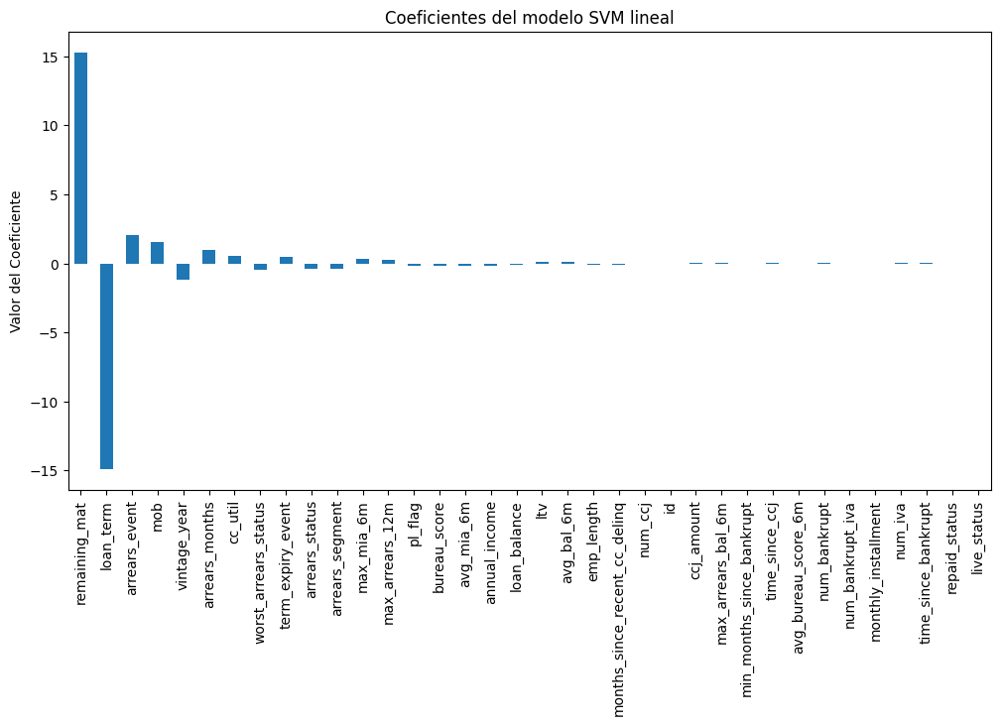

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.svm import SVC, LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, auc, confusion_matrix, accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_resampled, test_size=0.2, random_state=123, stratify=df_resampled['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Normaliza los datos
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train.drop(columns=['default_indicator']))
test_scaled = scaler.transform(test.drop(columns=['default_indicator']))

# Entrena el modelo de SVM
svm_model = SVC(kernel='linear', probability=True, random_state=123)
svm_model.fit(train_scaled, train['default_indicator'])

# Realiza las predicciones
train_preds = svm_model.predict(train_scaled)
test_preds = svm_model.predict(test_scaled)

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')


# Calcula el AUC-ROC para entrenamiento y prueba
train_proba = svm_model.predict_proba(train_scaled)[:, 1]
test_proba = svm_model.predict_proba(test_scaled)[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_proba)
test_auc = roc_auc_score(test['default_indicator'], test_proba)
print(f'AUC del entrenamiento: {train_auc:.2f}')
print(f'AUC de la prueba: {test_auc:.2f}')

# Realiza la validación cruzada y calcula el AUC-ROC
cv = StratifiedKFold(n_splits=5)
tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)
i = 0

cv_scores = cross_val_score(svm_model, train_scaled, train['default_indicator'], cv=cv, scoring='roc_auc')
mean_cv_score = np.mean(cv_scores)
print(f'CV Scores: {cv_scores}')
print(f'Mean CV Score: {mean_cv_score:.2f}')

for train_idx, test_idx in cv.split(train_scaled, train['default_indicator']):
    probas_ = svm_model.fit(train_scaled[train_idx], train['default_indicator'].iloc[train_idx]).predict_proba(train_scaled[test_idx])
    # Compute ROC curve and area under the curve
    fpr, tpr, thresholds = roc_curve(train['default_indicator'].iloc[test_idx], probas_[:, 1])
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size = 15)
plt.show()

# Entrena el modelo de SVM lineal para obtener los coeficientes
linear_svm_model = LinearSVC(random_state=123)
linear_svm_model.fit(train_scaled, train['default_indicator'])

# Obtiene los coeficientes del modelo
coefficients = linear_svm_model.coef_[0]

# Crea un DataFrame para visualizar los resultados
coefficients_df = pd.DataFrame(coefficients, index=train.drop(columns=['default_indicator']).columns, columns=['Coefficient'])

# Ordena los coeficientes por su valor absoluto
coefficients_df['abs'] = coefficients_df['Coefficient'].abs()
sorted_df = coefficients_df.sort_values('abs', ascending=False).drop('abs', axis=1)

# Visualiza los coeficientes
plt.figure(figsize=(12, 6))
sorted_df['Coefficient'].plot(kind='bar')
plt.title('Coeficientes del modelo SVM lineal')
plt.ylabel('Valor del Coeficiente')
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_resampled[df_resampled['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Normaliza los datos de la persona
person_data_scaled = scaler.transform(person_data)

# Haz la predicción utilizando tu modelo de SVM
prediction = svm_model.predict(person_data_scaled)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')

Modelo Support Vector Machine sin bankrupt_event sin smote

Exactitud del entrenamiento: 99.23%
Exactitud de la prueba: 99.06%
Precision del entrenamiento: 100.00%
Precision de la prueba: 100.00%
Recall del entrenamiento: 85.31%
Recall de la prueba: 82.00%
F1 score del entrenamiento: 92.07%
F1 score de la prueba: 90.11%
AUC del entrenamiento: 0.96
AUC de la prueba: 0.96
CV Scores: [0.97573627 0.94216548 0.96544474 0.95637378 0.9615515 ]
Mean CV Score: 0.96


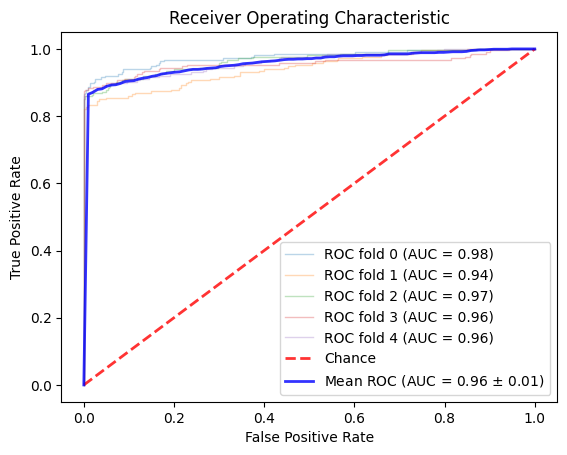

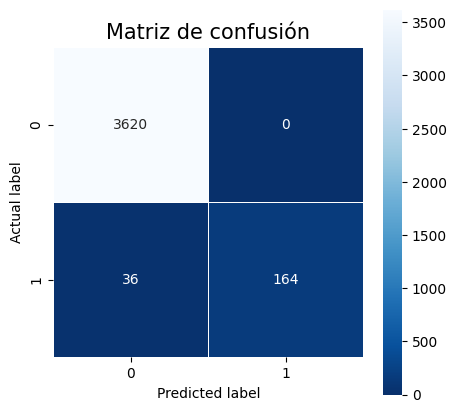

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


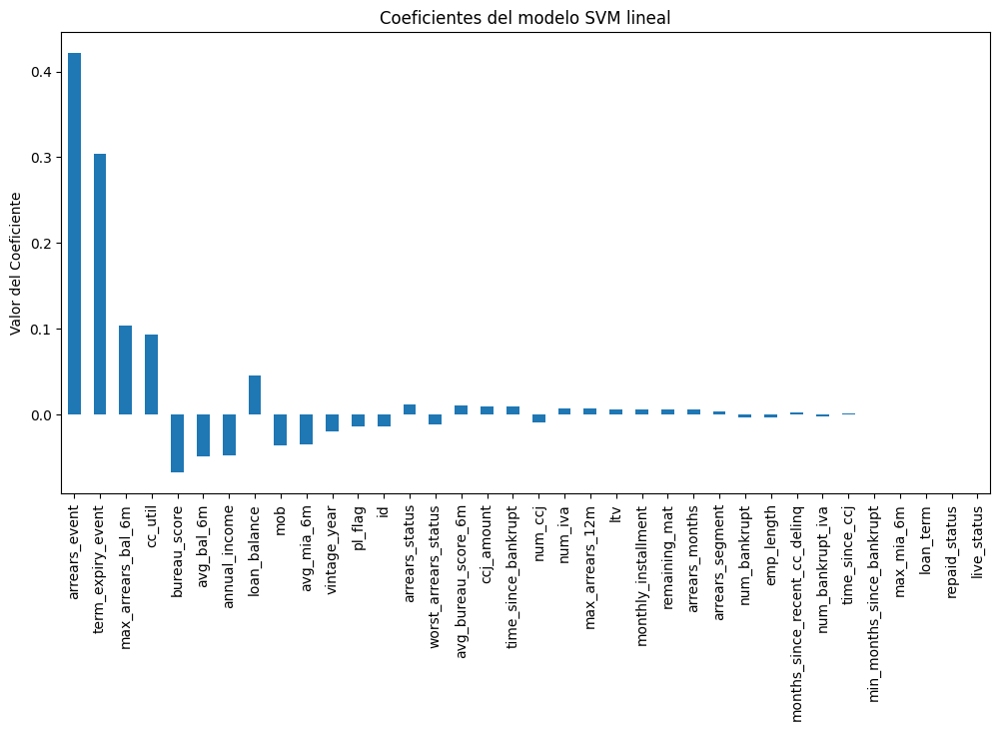

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.svm import SVC, LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, auc, confusion_matrix, accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_cleaned, test_size=0.2, random_state=123, stratify=df_cleaned['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Normaliza los datos
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train.drop(columns=['default_indicator']))
test_scaled = scaler.transform(test.drop(columns=['default_indicator']))

# Entrena el modelo de SVM
svm_model = SVC(kernel='linear', probability=True, random_state=123)
svm_model.fit(train_scaled, train['default_indicator'])

# Realiza las predicciones
train_preds = svm_model.predict(train_scaled)
test_preds = svm_model.predict(test_scaled)

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')


# Calcula el AUC-ROC para entrenamiento y prueba
train_proba = svm_model.predict_proba(train_scaled)[:, 1]
test_proba = svm_model.predict_proba(test_scaled)[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_proba)
test_auc = roc_auc_score(test['default_indicator'], test_proba)
print(f'AUC del entrenamiento: {train_auc:.2f}')
print(f'AUC de la prueba: {test_auc:.2f}')

# Realiza la validación cruzada y calcula el AUC-ROC
cv = StratifiedKFold(n_splits=5)
tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)
i = 0

cv_scores = cross_val_score(svm_model, train_scaled, train['default_indicator'], cv=cv, scoring='roc_auc')
mean_cv_score = np.mean(cv_scores)
print(f'CV Scores: {cv_scores}')
print(f'Mean CV Score: {mean_cv_score:.2f}')

for train_idx, test_idx in cv.split(train_scaled, train['default_indicator']):
    probas_ = svm_model.fit(train_scaled[train_idx], train['default_indicator'].iloc[train_idx]).predict_proba(train_scaled[test_idx])
    # Compute ROC curve and area under the curve
    fpr, tpr, thresholds = roc_curve(train['default_indicator'].iloc[test_idx], probas_[:, 1])
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size = 15)
plt.show()

# Entrena el modelo de SVM lineal para obtener los coeficientes
linear_svm_model = LinearSVC(random_state=123)
linear_svm_model.fit(train_scaled, train['default_indicator'])

# Obtiene los coeficientes del modelo
coefficients = linear_svm_model.coef_[0]

# Crea un DataFrame para visualizar los resultados
coefficients_df = pd.DataFrame(coefficients, index=train.drop(columns=['default_indicator']).columns, columns=['Coefficient'])

# Ordena los coeficientes por su valor absoluto
coefficients_df['abs'] = coefficients_df['Coefficient'].abs()
sorted_df = coefficients_df.sort_values('abs', ascending=False).drop('abs', axis=1)

# Visualiza los coeficientes
plt.figure(figsize=(12, 6))
sorted_df['Coefficient'].plot(kind='bar')
plt.title('Coeficientes del modelo SVM lineal')
plt.ylabel('Valor del Coeficiente')
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_cleaned[df_cleaned['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Normaliza los datos de la persona
person_data_scaled = scaler.transform(person_data)

# Haz la predicción utilizando tu modelo de SVM
prediction = svm_model.predict(person_data_scaled)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')

#Analisis y conclusiones

Durante este experimento, se observó que los modelos sin SMOTE incluyeron más características y asignaron un mayor grado de importancia para predecir el default. Sin embargo, las dos características que más influyen en la mayoría de los modelos son arrears_event y term_expiry_event. Según Teziano Bellini, cuando hay atrasos de al menos 3 meses, se asigna un valor de 1 a arrears_event, cuando ocurre un evento de bancarrota, se le asigna un valor de 1 a bankrupt_event, y cuando hay un vencimiento en el plazo del pago, se asigna un valor de 1 a term_expiry_event. Además, menciona que "Default definition. An instant cure definition is adopted to facilitate the analysis. Both quantitative and qualitative elements are taken into account. Bankruptcy and 90 days past due are the primary events triggering a default." Esto sugiere que el evento de bancarrota y el arrears_event son los principales desencadenantes de un default.

En cuanto a los modelos a los que se les aplicó SMOTE, se observó una disminución del porcentaje de predicción entre 0.1% y 1% al eliminar la columna llamada bankrupt_event, tomando en consideracion la metrica f1 score y curva roc.

Al eliminar la columna bankrupt_event de los modelos sin SMOTE, se observó que los modelos incorporaron más características para la predicción del default. Esto podría indicar que, sin la columna bankrupt_event, los modelos se vieron obligados a utilizar otras características disponibles para hacer predicciones, como loan_term, remaining_mat, max_arrears_12m y cc_util, las cuales demostraron tener mayor relevancia en este contexto.

En resumen, la eliminación de la columna bankrupt_event en los modelos sin SMOTE permitió explorar otras características que también son importantes para predecir el riesgo crediticio. Además, se observó que los modelos con SMOTE, al eliminar esta columna los valores de las metricas de todos los modelos bajaron su porcentaje, esto quiere decir que esta columna en los modelos con SMOTE aportaba información valiosa.

Se aplicara una estrategia en la cual no contaremos con estas variables tan influyentes para ver como se comportan los modelos y ver como se asignan las importancias a las caracteristicas.

#Eliminación de caracteristicas muy influyentes.



In [ ]:
# Elimina las columnas 'arrears_event', 'bankrupt_event' y 'term_expiry_event'
df_cleaned = df_cleaned.drop(columns=['arrears_event','term_expiry_event'])


In [ ]:
# Elimina las columnas 'arrears_event', 'bankrupt_event' y 'term_expiry_event'
df_resampled = df_resampled.drop(columns=['arrears_event','term_expiry_event'])

#Modelos sin caracteristicas influyentes con smote y sin smote

#Modelo Random Forest sin caracteristicas influyentes con smote y sin smote

Modelo Random Forest sin caracteristicas influyentes con smote

Exactitud del entrenamiento: 100.00%
Exactitud de la prueba: 96.82%
Precision del entrenamiento: 100.00%
Precision de la prueba: 96.16%
Recall del entrenamiento: 99.99%
Recall de la prueba: 97.54%
F1 score del entrenamiento: 100.00%
F1 score de la prueba: 96.85%
CV scores: [0.96814297 0.97138047 0.96956747 0.96852739 0.96749126]
Mean CV score: 0.9690219119049581
Train AUC: 1.0
Test AUC: 0.9958996334569392
[0.01684512 0.01109985 0.01392349 0.0143386  0.04005342 0.0066953
 0.0031948  0.02288244 0.01285498 0.0153003  0.00051766 0.00535642
 0.00031067 0.01268874 0.01601679 0.09393879 0.00533209 0.00127455
 0.01567648 0.02837205 0.0287483  0.         0.         0.0063279
 0.11545859 0.02924831 0.06767838 0.05418091 0.01393682 0.03005753
 0.21169061 0.03553925 0.02185245 0.04860837]


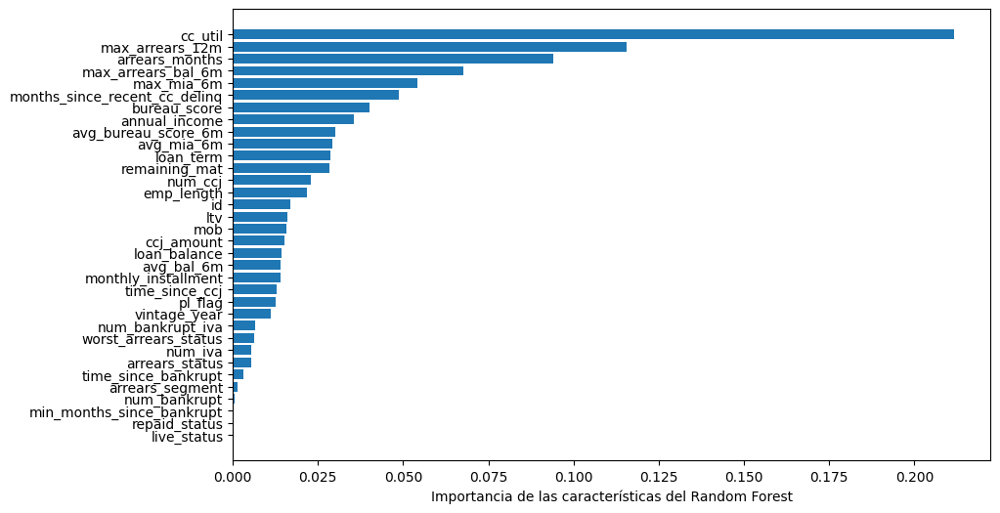

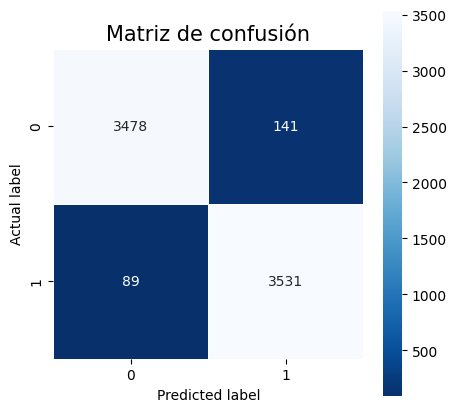

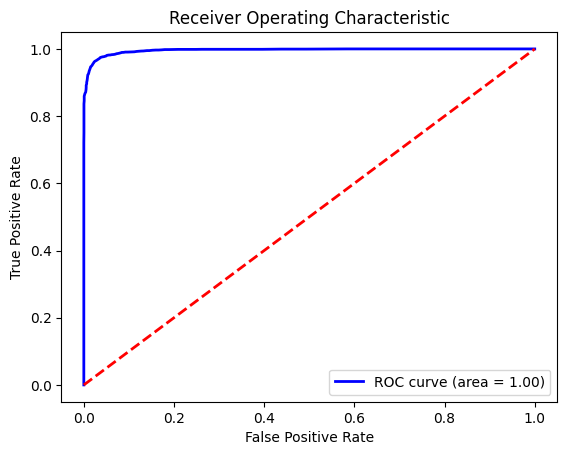

La predicción para la persona con ID 6670001 es: 0


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Divide los datos resampleados en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_resampled, test_size=0.2, random_state=123, stratify=df_resampled['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Entrena el modelo de Random Forest
rf_model = RandomForestClassifier(n_estimators=100, max_features=4, random_state=123)
rf_model.fit(train.drop(columns=['default_indicator']), train['default_indicator'])

# Realiza las predicciones
train_preds = rf_model.predict(train.drop(columns=['default_indicator']))
test_preds = rf_model.predict(test.drop(columns=['default_indicator']))

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores = cross_val_score(rf_model, train.drop(columns=['default_indicator']), train['default_indicator'], cv=5)
print(f'CV scores: {cv_scores}')
print(f'Mean CV score: {cv_scores.mean()}')

# Calcula AUC-ROC
train_probs = rf_model.predict_proba(train.drop(columns=['default_indicator']))[:, 1]
test_probs = rf_model.predict_proba(test.drop(columns=['default_indicator']))[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_probs)
test_auc = roc_auc_score(test['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Analiza la importancia de las características
importances = rf_model.feature_importances_
print(importances)

# Visualiza la importancia de las características
plt.figure(figsize=(10, 6))
sorted_idx = rf_model.feature_importances_.argsort()
plt.barh(train.drop(columns=['default_indicator']).columns[sorted_idx], rf_model.feature_importances_[sorted_idx])
plt.xlabel("Importancia de las características del Random Forest")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size = 15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 6670001

# Localiza la fila de datos para esa persona
person_data = df_resampled[df_resampled['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Haz la predicción utilizando tu modelo de Random Forest
prediction = rf_model.predict(person_data)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')


Modelo Random Forest sin caracteristicas influyentes sin smote

Exactitud del entrenamiento: 99.99%
Exactitud de la prueba: 96.49%
Precision del entrenamiento: 100.00%
Precision de la prueba: 79.46%
Recall del entrenamiento: 99.81%
Recall de la prueba: 44.50%
F1 score del entrenamiento: 99.91%
F1 score de la prueba: 57.05%
CV scores: [0.96392638 0.96392638 0.96391753 0.96563574 0.9658812 ]
Mean CV score: 0.9646574446361937
Train AUC: 1.0
Test AUC: 0.9340725138121546
[0.03700943 0.01373775 0.0360281  0.03829258 0.0431947  0.00207383
 0.00546394 0.00564119 0.01156327 0.00919267 0.00060843 0.00200933
 0.00098927 0.00606788 0.04232585 0.05877646 0.02192852 0.02836099
 0.03035144 0.08817426 0.03752506 0.         0.         0.01059722
 0.04079832 0.00653903 0.03937351 0.01129666 0.03914897 0.04103048
 0.15257744 0.0756831  0.02950725 0.03413307]


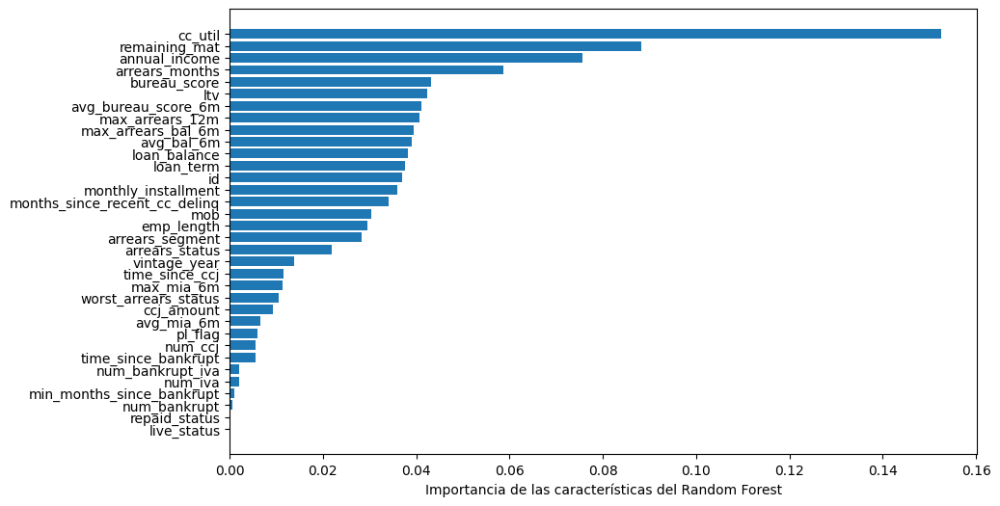

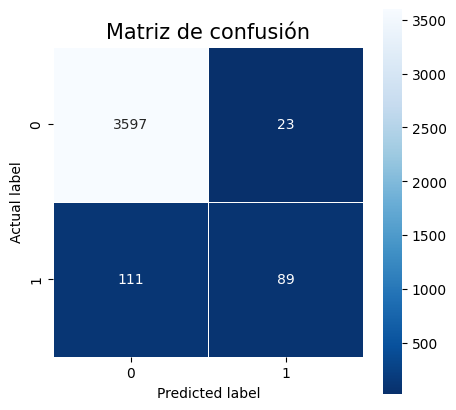

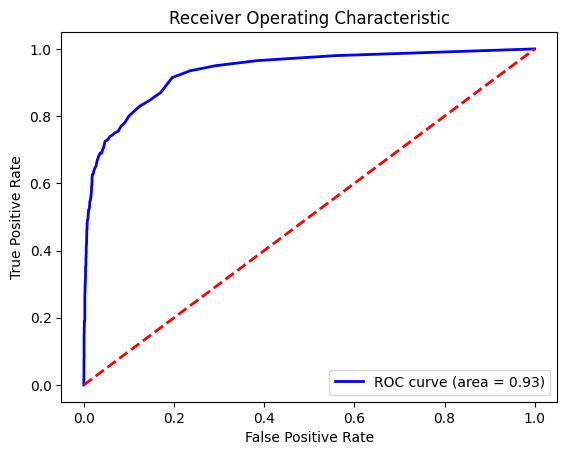

La predicción para la persona con ID 6670001 es: 0


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Divide los datos resampleados en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_cleaned, test_size=0.2, random_state=123, stratify=df_cleaned['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Entrena el modelo de Random Forest
rf_model = RandomForestClassifier(n_estimators=100, max_features=4, random_state=123)
rf_model.fit(train.drop(columns=['default_indicator']), train['default_indicator'])

# Realiza las predicciones
train_preds = rf_model.predict(train.drop(columns=['default_indicator']))
test_preds = rf_model.predict(test.drop(columns=['default_indicator']))

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores = cross_val_score(rf_model, train.drop(columns=['default_indicator']), train['default_indicator'], cv=5)
print(f'CV scores: {cv_scores}')
print(f'Mean CV score: {cv_scores.mean()}')

# Calcula AUC-ROC
train_probs = rf_model.predict_proba(train.drop(columns=['default_indicator']))[:, 1]
test_probs = rf_model.predict_proba(test.drop(columns=['default_indicator']))[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_probs)
test_auc = roc_auc_score(test['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Analiza la importancia de las características
importances = rf_model.feature_importances_
print(importances)

# Visualiza la importancia de las características
plt.figure(figsize=(10, 6))
sorted_idx = rf_model.feature_importances_.argsort()
plt.barh(train.drop(columns=['default_indicator']).columns[sorted_idx], rf_model.feature_importances_[sorted_idx])
plt.xlabel("Importancia de las características del Random Forest")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size = 15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 6670001

# Localiza la fila de datos para esa persona
person_data = df_cleaned[df_cleaned['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Haz la predicción utilizando tu modelo de Random Forest
prediction = rf_model.predict(person_data)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')


#Modelo Decision Trees sin variables influyentes con smote y sin smote

Modelo Decision Trees sin variables influyentes con smote

Exactitud del entrenamiento: 100.00%
Exactitud de la prueba: 93.80%
Precision del entrenamiento: 100.00%
Precision de la prueba: 92.82%
Recall del entrenamiento: 100.00%
Recall de la prueba: 94.94%
F1 score del entrenamiento: 100.00%
F1 score de la prueba: 93.87%
CV scores: [0.93991194 0.94548045 0.93848744 0.94197643 0.93847947]
Mean CV score: 0.9408671446749416
Train AUC: 1.0
Test AUC: 0.9379732733470832
[1.99936575e-02 6.11217381e-03 1.22174843e-02 5.26157014e-03
 3.21858591e-02 2.64331378e-03 2.43312360e-03 7.17555955e-03
 2.28641424e-03 7.70979573e-03 0.00000000e+00 1.17572341e-03
 1.00263358e-04 1.06649835e-02 1.52554256e-02 1.33015069e-02
 2.95323312e-03 4.17425797e-05 1.23052446e-02 9.72835382e-03
 3.52391706e-02 0.00000000e+00 0.00000000e+00 1.07259239e-02
 4.50371350e-01 1.27500934e-03 1.17500400e-02 7.77982523e-03
 7.15419187e-03 1.39982721e-02 2.45914229e-01 3.35100831e-02
 1.08467339e-02 7.88974248e-03]


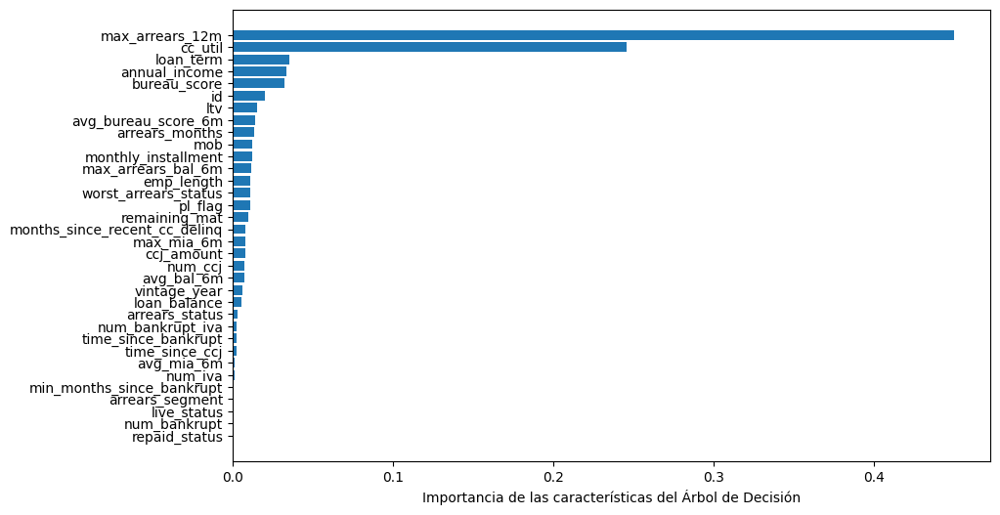

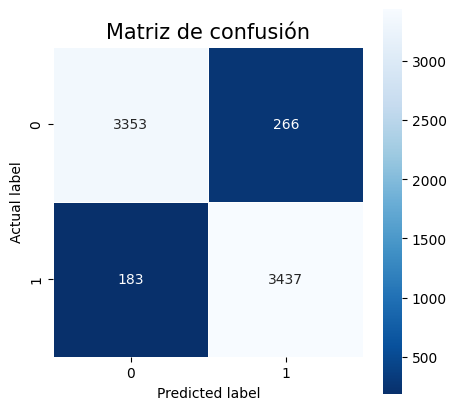

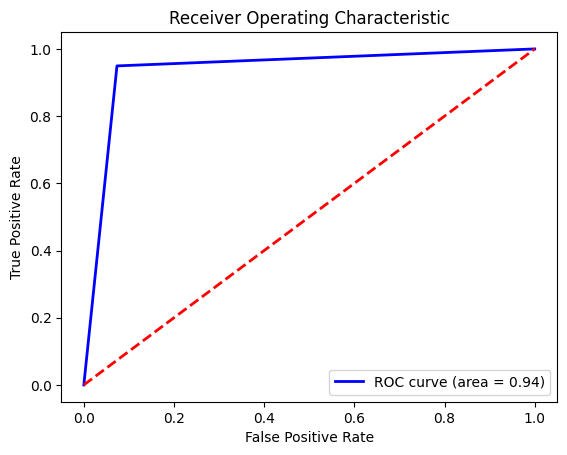

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_resampled, test_size=0.2, random_state=123, stratify=df_resampled['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Entrena el modelo de Árbol de Decisión
dt_model = DecisionTreeClassifier(random_state=123)
dt_model.fit(train.drop(columns=['default_indicator']), train['default_indicator'])

# Realiza las predicciones
train_preds = dt_model.predict(train.drop(columns=['default_indicator']))
test_preds = dt_model.predict(test.drop(columns=['default_indicator']))

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores = cross_val_score(dt_model, train.drop(columns=['default_indicator']), train['default_indicator'], cv=5)
print(f'CV scores: {cv_scores}')
print(f'Mean CV score: {cv_scores.mean()}')

# Calcula AUC-ROC
train_probs = dt_model.predict_proba(train.drop(columns=['default_indicator']))[:, 1]
test_probs = dt_model.predict_proba(test.drop(columns=['default_indicator']))[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_probs)
test_auc = roc_auc_score(test['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Visualiza la importancia de las características
importances = dt_model.feature_importances_
print(importances)

plt.figure(figsize=(10, 6))
sorted_idx = dt_model.feature_importances_.argsort()
plt.barh(train.drop(columns=['default_indicator']).columns[sorted_idx], dt_model.feature_importances_[sorted_idx])
plt.xlabel("Importancia de las características del Árbol de Decisión")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_resampled[df_resampled['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Haz la predicción utilizando tu modelo de Árbol de Decisión
prediction = dt_model.predict(person_data)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')

Modelo Decision Trees sin variables influyentes sin smote

Exactitud del entrenamiento: 100.00%
Exactitud de la prueba: 94.37%
Precision del entrenamiento: 100.00%
Precision de la prueba: 46.61%
Recall del entrenamiento: 100.00%
Recall de la prueba: 51.50%
F1 score del entrenamiento: 100.00%
F1 score de la prueba: 48.93%
CV scores: [0.94748466 0.94723926 0.94182622 0.94845361 0.94771723]
Mean CV score: 0.9465441961744536
Train AUC: 1.0
Test AUC: 0.7412016574585636
[0.03280212 0.00264765 0.02951286 0.01767704 0.03277289 0.00065817
 0.00667795 0.00353059 0.00570376 0.00642108 0.00040252 0.00082594
 0.00082996 0.00374257 0.05574572 0.14909013 0.         0.
 0.02918263 0.11351155 0.0138655  0.         0.         0.00131772
 0.05575596 0.00297    0.02603592 0.00029618 0.01875589 0.03041862
 0.20722468 0.10700097 0.01767619 0.02694722]


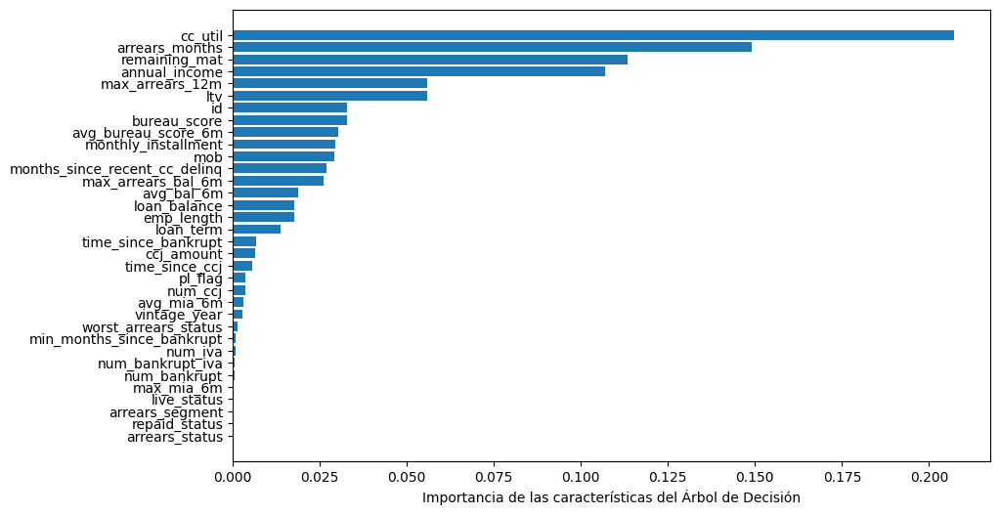

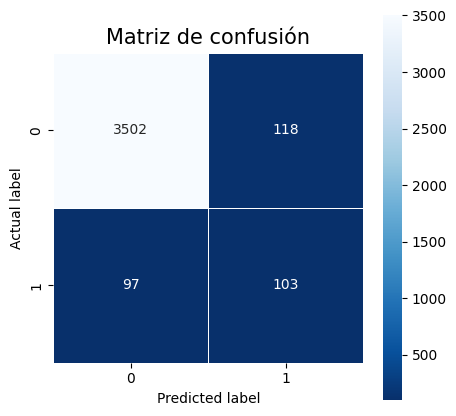

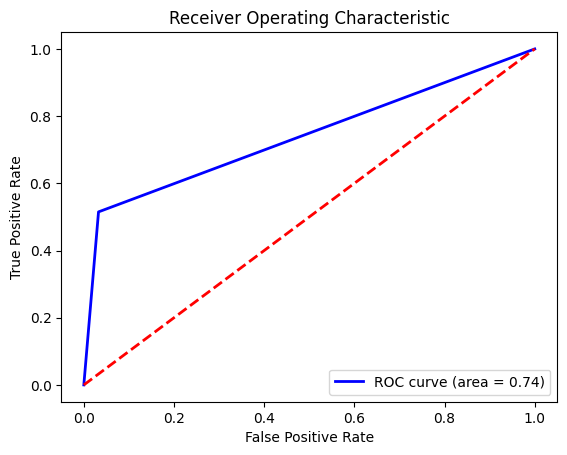

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_cleaned, test_size=0.2, random_state=123, stratify=df_cleaned['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Entrena el modelo de Árbol de Decisión
dt_model = DecisionTreeClassifier(random_state=123)
dt_model.fit(train.drop(columns=['default_indicator']), train['default_indicator'])

# Realiza las predicciones
train_preds = dt_model.predict(train.drop(columns=['default_indicator']))
test_preds = dt_model.predict(test.drop(columns=['default_indicator']))

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores = cross_val_score(dt_model, train.drop(columns=['default_indicator']), train['default_indicator'], cv=5)
print(f'CV scores: {cv_scores}')
print(f'Mean CV score: {cv_scores.mean()}')

# Calcula AUC-ROC
train_probs = dt_model.predict_proba(train.drop(columns=['default_indicator']))[:, 1]
test_probs = dt_model.predict_proba(test.drop(columns=['default_indicator']))[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_probs)
test_auc = roc_auc_score(test['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Visualiza la importancia de las características
importances = dt_model.feature_importances_
print(importances)

plt.figure(figsize=(10, 6))
sorted_idx = dt_model.feature_importances_.argsort()
plt.barh(train.drop(columns=['default_indicator']).columns[sorted_idx], dt_model.feature_importances_[sorted_idx])
plt.xlabel("Importancia de las características del Árbol de Decisión")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_cleaned[df_cleaned['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Haz la predicción utilizando tu modelo de Árbol de Decisión
prediction = dt_model.predict(person_data)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')

#Modelo Gradient Boosting sin variables influyentes con smote y sin smote

Modelo Gradient Boosting sin variables influyentes con smote

Exactitud del entrenamiento: 99.11%
Exactitud de la prueba: 96.04%
Precision del entrenamiento: 99.22%
Precision de la prueba: 95.85%
Recall del entrenamiento: 98.99%
Recall de la prueba: 96.24%
F1 score del entrenamiento: 99.11%
F1 score de la prueba: 96.04%
CV scores: [0.96231546 0.96270396 0.95985496 0.96503044 0.96451237]
Mean CV score: 0.9628834380420962
Train AUC: 0.9993817792777553
Test AUC: 0.9928548529171546
[5.96861638e-03 4.89261394e-03 2.72932109e-03 1.76139449e-03
 2.33195470e-02 2.33306622e-03 1.11106663e-03 1.37653668e-02
 1.60724620e-03 5.95109814e-04 1.36243801e-05 2.30549899e-04
 8.58752457e-05 8.79386814e-03 3.97424868e-03 1.45637809e-02
 6.45100800e-03 1.90061286e-04 4.22346709e-03 5.70865005e-03
 3.39933126e-02 0.00000000e+00 0.00000000e+00 1.20446358e-02
 5.06233599e-01 3.39169711e-04 7.36758785e-03 1.62207613e-02
 2.29446307e-03 3.29656695e-03 2.91478842e-01 1.84625890e-02
 3.25087724e-03 2.69911363e-03]


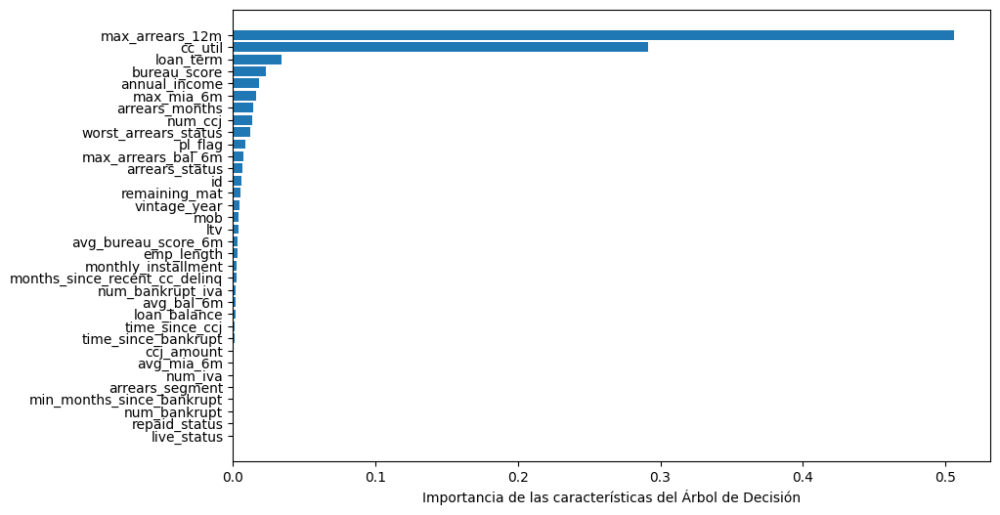

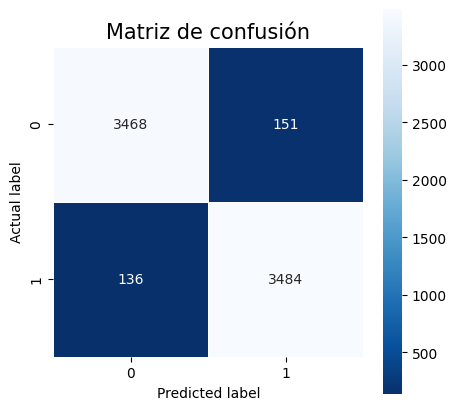

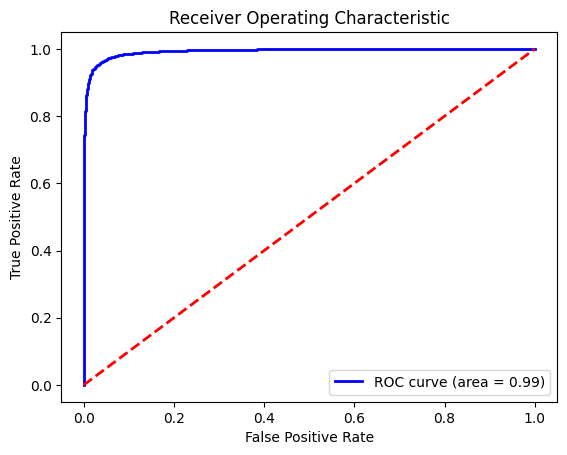

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_resampled, test_size=0.2, random_state=123, stratify=df_resampled['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Entrena el modelo de Gradient Boosting
gb_model = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=4, random_state=123)
gb_model.fit(train.drop(columns=['default_indicator']), train['default_indicator'])

# Realiza las predicciones
train_preds = gb_model.predict(train.drop(columns=['default_indicator']))
test_preds = gb_model.predict(test.drop(columns=['default_indicator']))

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores = cross_val_score(gb_model, train.drop(columns=['default_indicator']), train['default_indicator'], cv=5)
print(f'CV scores: {cv_scores}')
print(f'Mean CV score: {cv_scores.mean()}')

# Calcula AUC-ROC
train_probs = gb_model.predict_proba(train.drop(columns=['default_indicator']))[:, 1]
test_probs = gb_model.predict_proba(test.drop(columns=['default_indicator']))[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_probs)
test_auc = roc_auc_score(test['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Visualiza la importancia de las características
importances = gb_model.feature_importances_
print(importances)

plt.figure(figsize=(10, 6))
sorted_idx = gb_model.feature_importances_.argsort()
plt.barh(train.drop(columns=['default_indicator']).columns[sorted_idx], gb_model.feature_importances_[sorted_idx])
plt.xlabel("Importancia de las características del Árbol de Decisión")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_resampled[df_resampled['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Haz la predicción utilizando tu modelo de Gradient Boosting
prediction = gb_model.predict(person_data)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')

Modelo Gradient Boosting sin variables influyentes sin smote

Exactitud del entrenamiento: 95.58%
Exactitud de la prueba: 94.76%
Precision del entrenamiento: 64.95%
Precision de la prueba: 50.00%
Recall del entrenamiento: 34.14%
Recall de la prueba: 30.00%
F1 score del entrenamiento: 44.76%
F1 score de la prueba: 37.50%
CV scores: [0.94527607 0.95214724 0.95360825 0.94698085 0.93421699]
Mean CV score: 0.9464458800533686
Train AUC: 0.6476541910268845
Test AUC: 0.6252299723756906
[0.00000000e+00 1.60116157e-03 0.00000000e+00 5.03499008e-04
 4.30485312e-04 0.00000000e+00 0.00000000e+00 0.00000000e+00
 1.49722100e-02 7.87368201e-05 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 2.08038170e-02 6.10501598e-01
 0.00000000e+00 2.84767580e-04 2.11683041e-03 1.56011580e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 2.70277670e-02 0.00000000e+00 2.88566918e-05 1.12415993e-05
 3.59529170e-04 2.39334201e-03 2.65340094e-01 3.78594281e-02
 0.00000000e+00 8.54776531e-05]


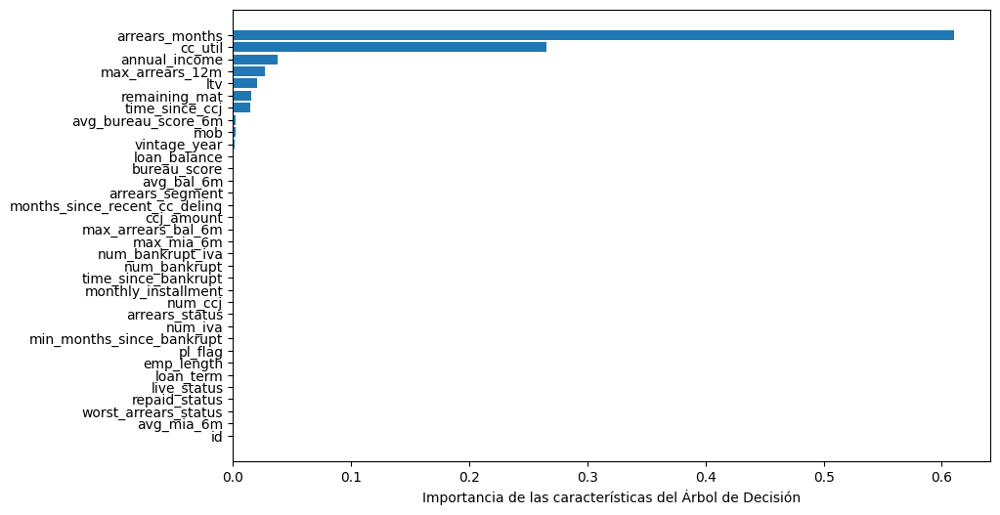

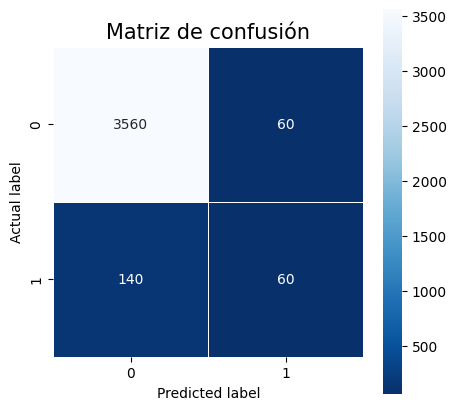

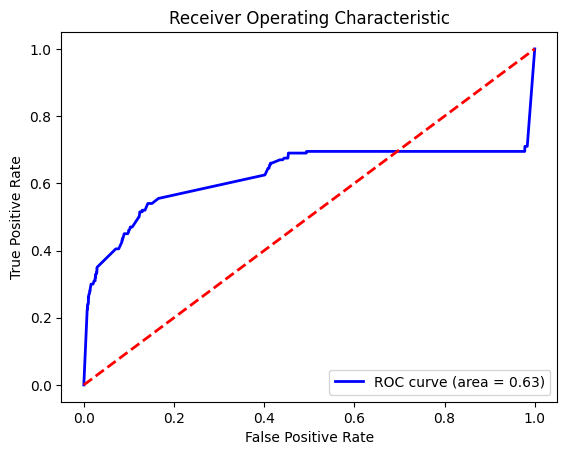

La predicción para la persona con ID 8789301 es: 0


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_cleaned, test_size=0.2, random_state=123, stratify=df_cleaned['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Entrena el modelo de Gradient Boosting
gb_model = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=4, random_state=123)
gb_model.fit(train.drop(columns=['default_indicator']), train['default_indicator'])

# Realiza las predicciones
train_preds = gb_model.predict(train.drop(columns=['default_indicator']))
test_preds = gb_model.predict(test.drop(columns=['default_indicator']))

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores = cross_val_score(gb_model, train.drop(columns=['default_indicator']), train['default_indicator'], cv=5)
print(f'CV scores: {cv_scores}')
print(f'Mean CV score: {cv_scores.mean()}')

# Calcula AUC-ROC
train_probs = gb_model.predict_proba(train.drop(columns=['default_indicator']))[:, 1]
test_probs = gb_model.predict_proba(test.drop(columns=['default_indicator']))[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_probs)
test_auc = roc_auc_score(test['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Visualiza la importancia de las características
importances = gb_model.feature_importances_
print(importances)

plt.figure(figsize=(10, 6))
sorted_idx = gb_model.feature_importances_.argsort()
plt.barh(train.drop(columns=['default_indicator']).columns[sorted_idx], gb_model.feature_importances_[sorted_idx])
plt.xlabel("Importancia de las características del Árbol de Decisión")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_cleaned[df_cleaned['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Haz la predicción utilizando tu modelo de Gradient Boosting
prediction = gb_model.predict(person_data)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')


# Modelo DNN sin variables influyentes con smote y sin smote

Modelo DNN sin variables influyentes con smote

Epoch 1/10
1207/1207 [==============================] - 9s 6ms/step - loss: 0.2367 - accuracy: 0.8998
Epoch 2/10
1207/1207 [==============================] - 10s 8ms/step - loss: 0.1638 - accuracy: 0.9340
Epoch 3/10
1207/1207 [==============================] - 8s 6ms/step - loss: 0.1487 - accuracy: 0.9397
Epoch 4/10
1207/1207 [==============================] - 11s 9ms/step - loss: 0.1403 - accuracy: 0.9420
Epoch 5/10
1207/1207 [==============================] - 8s 6ms/step - loss: 0.1336 - accuracy: 0.9460
Epoch 6/10
1207/1207 [==============================] - 8s 7ms/step - loss: 0.1292 - accuracy: 0.9472
Epoch 7/10
1207/1207 [==============================] - 7s 6ms/step - loss: 0.1247 - accuracy: 0.9485
Epoch 8/10
1207/1207 [==============================] - 5s 4ms/step - loss: 0.1209 - accuracy: 0.9509
Epoch 9/10
1207/1207 [==============================] - 7s 6ms/step - loss: 0.1183 - accuracy: 0.9514
Epoch 10/10
227/227 [==============================] - 1s 3ms/step
Exactitud del

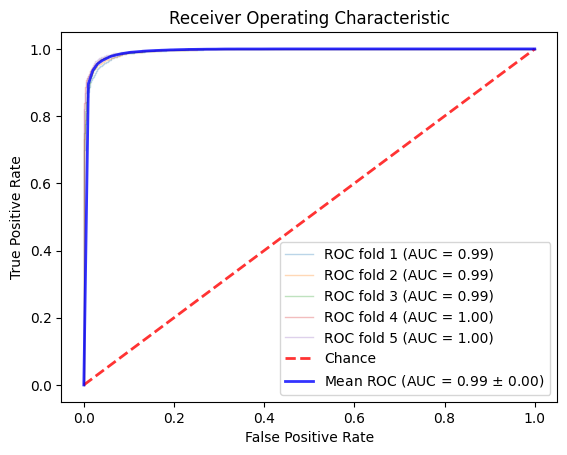

Mean CV accuracy: 96.15%
Train AUC: 0.9963
Test AUC: 0.9946


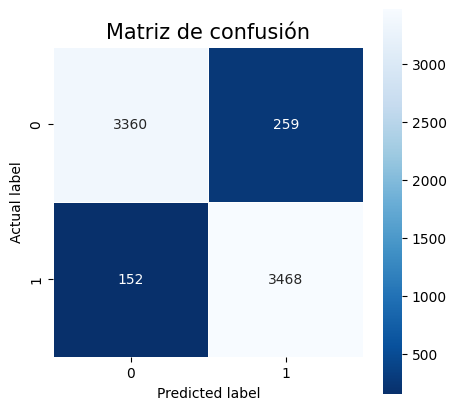

1207/1207 [==============================] - 2s 2ms/step


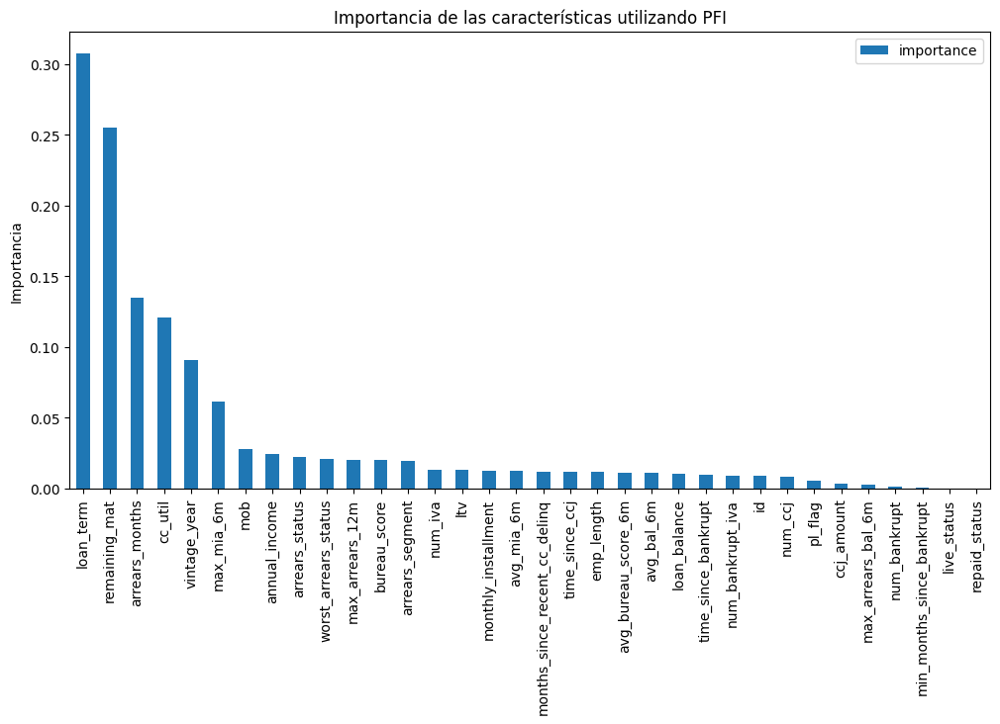

1/1 [==============================] - 0s 47ms/step
La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, auc, confusion_matrix, accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Define una función para calcular la precisión del modelo
def score(X, y):
    y_pred = (model.predict(X) > 0.5).astype(int)
    return accuracy_score(y, y_pred)

class KerasModelWrapper:
    def __init__(self, model):
        self.model = model

    def fit(self, X, y):
        self.model.fit(X, y, epochs=10, batch_size=32, verbose=0)

    def predict(self, X):
        return (self.model.predict(X) > 0.5).astype(int)

    def score(self, X, y):
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train_df, temp = train_test_split(df_resampled, test_size=0.2, random_state=123, stratify=df_resampled['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Normaliza los datos
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train_df.drop(columns=['default_indicator']))
test_scaled = scaler.transform(test.drop(columns=['default_indicator']))

# Crea el modelo de DNN
model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(32, activation='relu', input_shape=(train_scaled.shape[1],)),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compila el modelo
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Entrena el modelo
model.fit(train_scaled, train_df['default_indicator'], epochs=10, batch_size=32)

# Evalúa el rendimiento
train_acc = model.evaluate(train_scaled, train_df['default_indicator'], verbose=0)[1]
test_acc = model.evaluate(test_scaled, test['default_indicator'], verbose=0)[1]

train_preds = (model.predict(train_scaled) > 0.5).astype(int)
test_preds = (model.predict(test_scaled) > 0.5).astype(int)

train_precision = precision_score(train_df['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train_df['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train_df['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precisión del entrenamiento: {train_precision*100:.2f}%')
print(f'Precisión de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada y calcula el AUC-ROC
cv = StratifiedKFold(n_splits=5)
train_auc_scores = []
test_auc_scores = []
cv_scores = []

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

for train_index, test_index in cv.split(train_scaled, train_df['default_indicator']):
    X_train_cv, X_test_cv = train_scaled[train_index], train_scaled[test_index]
    y_train_cv, y_test_cv = train_df['default_indicator'].iloc[train_index], train_df['default_indicator'].iloc[test_index]

    model.fit(X_train_cv, y_train_cv, epochs=10, batch_size=32, verbose=0)

    train_probs_cv = model.predict(X_train_cv)
    test_probs_cv = model.predict(X_test_cv)

    train_auc_cv = roc_auc_score(y_train_cv, train_probs_cv)
    test_auc_cv = roc_auc_score(y_test_cv, test_probs_cv)

    train_auc_scores.append(train_auc_cv)
    test_auc_scores.append(test_auc_cv)

    cv_scores.append(model.evaluate(X_test_cv, y_test_cv, verbose=0)[1])

    fpr, tpr, _ = roc_curve(y_test_cv, test_probs_cv)
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (len(aucs), roc_auc))

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

print(f'Mean CV accuracy: {np.mean(cv_scores)*100:.2f}%')
print(f'Train AUC: {np.mean(train_auc_scores):.4f}')
print(f'Test AUC: {np.mean(test_auc_scores):.4f}')

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Envuelve tu modelo de TensorFlow en el envoltorio
wrapped_model = KerasModelWrapper(model)

# Calcula la importancia de las características
result = permutation_importance(wrapped_model, train_scaled, train_df['default_indicator'], n_repeats=10)

# Crea un DataFrame para visualizar los resultados
importance_df = pd.DataFrame(result.importances_mean, index=train_df.drop(columns=['default_indicator']).columns, columns=['importance'])
importance_df.sort_values(by='importance', ascending=False, inplace=True)

# Visualiza la importancia de las características
importance_df.plot(kind='bar', figsize=(12, 6))
plt.title('Importancia de las características utilizando PFI')
plt.ylabel('Importancia')
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_resampled[df_resampled['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Normaliza los datos de la persona
person_data_scaled = scaler.transform(person_data)

# Haz la predicción utilizando tu modelo de DNN
prediction = model.predict(person_data_scaled)

# Como la salida es una probabilidad, la convertimos a una clase binaria
prediction_class = (prediction > 0.5).astype(int)

print(f'La predicción para la persona con ID {person_id} es: {prediction_class[0][0]}')


Modelo DNN sin variables influyentes sin smote

Epoch 1/10
637/637 [==============================] - 4s 4ms/step - loss: 0.1830 - accuracy: 0.9403
Epoch 2/10
637/637 [==============================] - 3s 5ms/step - loss: 0.1166 - accuracy: 0.9600
Epoch 3/10
637/637 [==============================] - 4s 6ms/step - loss: 0.1111 - accuracy: 0.9611
Epoch 4/10
637/637 [==============================] - 3s 4ms/step - loss: 0.1069 - accuracy: 0.9626
Epoch 5/10
637/637 [==============================] - 3s 4ms/step - loss: 0.1040 - accuracy: 0.9637
Epoch 6/10
637/637 [==============================] - 5s 7ms/step - loss: 0.1025 - accuracy: 0.9634
Epoch 7/10
637/637 [==============================] - 6s 9ms/step - loss: 0.0998 - accuracy: 0.9650
Epoch 8/10
637/637 [==============================] - 4s 6ms/step - loss: 0.0987 - accuracy: 0.9649
Epoch 9/10
637/637 [==============================] - 3s 4ms/step - loss: 0.0976 - accuracy: 0.9654
Epoch 10/10
120/120 [==============================] - 1s 6ms/step
Exactitud del entrenamiento: 96.7

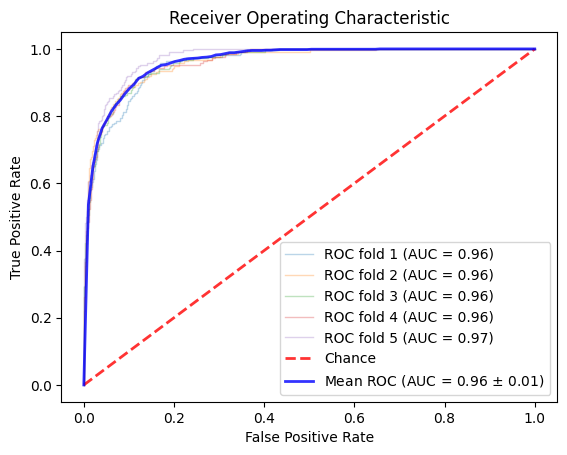

Mean CV accuracy: 96.63%
Train AUC: 0.9767
Test AUC: 0.9631


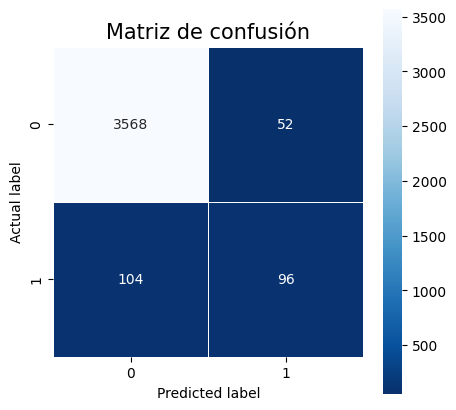

637/637 [==============================] - 1s 2ms/step


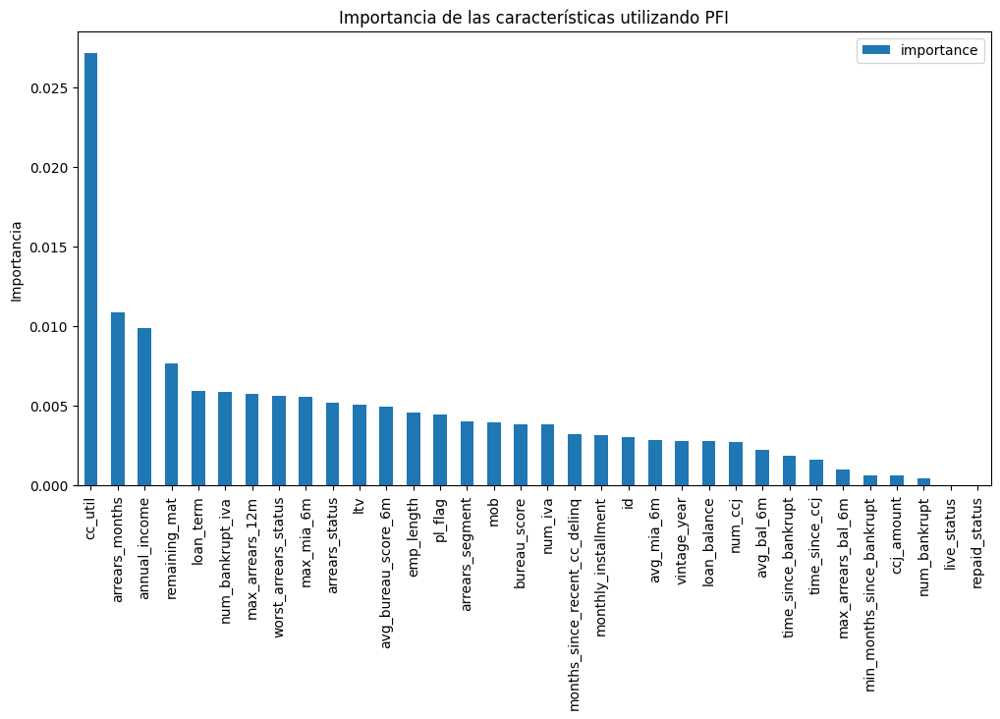

1/1 [==============================] - 0s 28ms/step
La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, auc, confusion_matrix, accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Define una función para calcular la precisión del modelo
def score(X, y):
    y_pred = (model.predict(X) > 0.5).astype(int)
    return accuracy_score(y, y_pred)

class KerasModelWrapper:
    def __init__(self, model):
        self.model = model

    def fit(self, X, y):
        self.model.fit(X, y, epochs=10, batch_size=32, verbose=0)

    def predict(self, X):
        return (self.model.predict(X) > 0.5).astype(int)

    def score(self, X, y):
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train_df, temp = train_test_split(df_cleaned, test_size=0.2, random_state=123, stratify=df_cleaned['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Normaliza los datos
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train_df.drop(columns=['default_indicator']))
test_scaled = scaler.transform(test.drop(columns=['default_indicator']))

# Crea el modelo de DNN
model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(32, activation='relu', input_shape=(train_scaled.shape[1],)),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compila el modelo
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Entrena el modelo
model.fit(train_scaled, train_df['default_indicator'], epochs=10, batch_size=32)

# Evalúa el rendimiento
train_acc = model.evaluate(train_scaled, train_df['default_indicator'], verbose=0)[1]
test_acc = model.evaluate(test_scaled, test['default_indicator'], verbose=0)[1]

train_preds = (model.predict(train_scaled) > 0.5).astype(int)
test_preds = (model.predict(test_scaled) > 0.5).astype(int)

train_precision = precision_score(train_df['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train_df['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train_df['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precisión del entrenamiento: {train_precision*100:.2f}%')
print(f'Precisión de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada y calcula el AUC-ROC
cv = StratifiedKFold(n_splits=5)
train_auc_scores = []
test_auc_scores = []
cv_scores = []

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

for train_index, test_index in cv.split(train_scaled, train_df['default_indicator']):
    X_train_cv, X_test_cv = train_scaled[train_index], train_scaled[test_index]
    y_train_cv, y_test_cv = train_df['default_indicator'].iloc[train_index], train_df['default_indicator'].iloc[test_index]

    model.fit(X_train_cv, y_train_cv, epochs=10, batch_size=32, verbose=0)

    train_probs_cv = model.predict(X_train_cv)
    test_probs_cv = model.predict(X_test_cv)

    train_auc_cv = roc_auc_score(y_train_cv, train_probs_cv)
    test_auc_cv = roc_auc_score(y_test_cv, test_probs_cv)

    train_auc_scores.append(train_auc_cv)
    test_auc_scores.append(test_auc_cv)

    cv_scores.append(model.evaluate(X_test_cv, y_test_cv, verbose=0)[1])

    fpr, tpr, _ = roc_curve(y_test_cv, test_probs_cv)
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (len(aucs), roc_auc))

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

print(f'Mean CV accuracy: {np.mean(cv_scores)*100:.2f}%')
print(f'Train AUC: {np.mean(train_auc_scores):.4f}')
print(f'Test AUC: {np.mean(test_auc_scores):.4f}')

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Envuelve tu modelo de TensorFlow en el envoltorio
wrapped_model = KerasModelWrapper(model)

# Calcula la importancia de las características
result = permutation_importance(wrapped_model, train_scaled, train_df['default_indicator'], n_repeats=10)

# Crea un DataFrame para visualizar los resultados
importance_df = pd.DataFrame(result.importances_mean, index=train_df.drop(columns=['default_indicator']).columns, columns=['importance'])
importance_df.sort_values(by='importance', ascending=False, inplace=True)

# Visualiza la importancia de las características
importance_df.plot(kind='bar', figsize=(12, 6))
plt.title('Importancia de las características utilizando PFI')
plt.ylabel('Importancia')
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_cleaned[df_cleaned['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Normaliza los datos de la persona
person_data_scaled = scaler.transform(person_data)

# Haz la predicción utilizando tu modelo de DNN
prediction = model.predict(person_data_scaled)

# Como la salida es una probabilidad, la convertimos a una clase binaria
prediction_class = (prediction > 0.5).astype(int)

print(f'La predicción para la persona con ID {person_id} es: {prediction_class[0][0]}')


#Modelo LogisticRegression sin variables influyentes con smote y sin smote

Modelo LogisticRegression sin variables influyentes con smote

Exactitud del entrenamiento: 93.97%
Exactitud de la prueba: 93.23%
Precision del entrenamiento: 94.36%
Precision de la prueba: 93.40%
Recall del entrenamiento: 93.53%
Recall de la prueba: 93.04%
F1 score del entrenamiento: 93.94%
F1 score de la prueba: 93.22%
AUC del entrenamiento: 0.99
AUC de la prueba: 0.98
CV Scores: [0.98357847 0.98558876 0.98416879 0.98543627 0.9840125 ]
Mean CV Score: 0.98


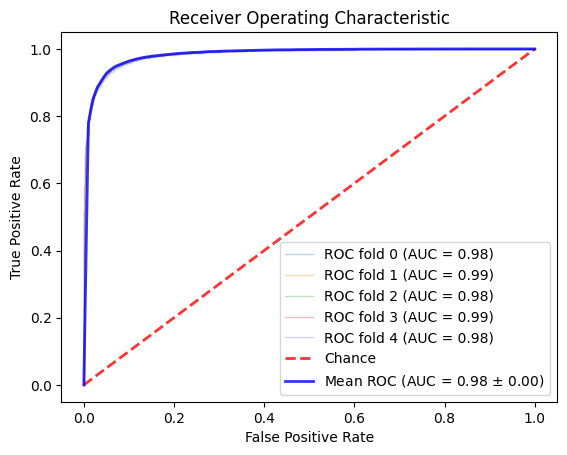

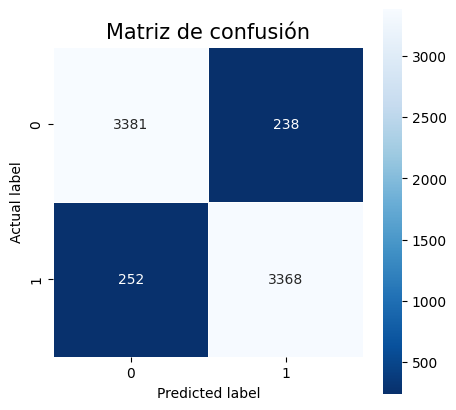

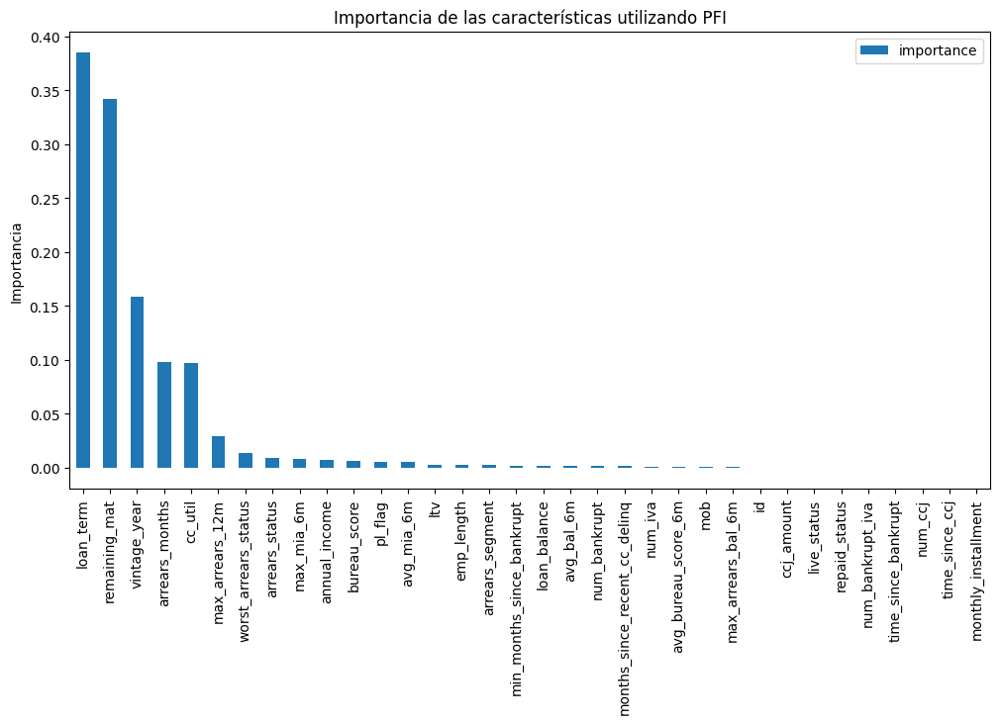

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_resampled, test_size=0.2, random_state=123, stratify=df_resampled['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Normaliza los datos
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train.drop(columns=['default_indicator']))
test_scaled = scaler.transform(test.drop(columns=['default_indicator']))

# Entrena el modelo de Regresión Logística
lr_model = LogisticRegression(max_iter=1000, random_state=123)
lr_model.fit(train_scaled, train['default_indicator'])

# Realiza las predicciones
train_preds = lr_model.predict(train_scaled)
test_preds = lr_model.predict(test_scaled)

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Calcula el AUC-ROC para entrenamiento y prueba
train_proba = lr_model.predict_proba(train_scaled)[:, 1]
test_proba = lr_model.predict_proba(test_scaled)[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_proba)
test_auc = roc_auc_score(test['default_indicator'], test_proba)
print(f'AUC del entrenamiento: {train_auc:.2f}')
print(f'AUC de la prueba: {test_auc:.2f}')

# Realiza la validación cruzada y calcula el AUC-ROC
cv = StratifiedKFold(n_splits=5)
tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)
i = 0

cv_scores = cross_val_score(lr_model, train_scaled, train['default_indicator'], cv=cv, scoring='roc_auc')
mean_cv_score = np.mean(cv_scores)
print(f'CV Scores: {cv_scores}')
print(f'Mean CV Score: {mean_cv_score:.2f}')

for train_idx, test_idx in cv.split(train_scaled, train['default_indicator']):
    probas_ = lr_model.fit(train_scaled[train_idx], train['default_indicator'].iloc[train_idx]).predict_proba(train_scaled[test_idx])
    # Compute ROC curve and area under the curve
    fpr, tpr, thresholds = roc_curve(train['default_indicator'].iloc[test_idx], probas_[:, 1])
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Obtiene los coeficientes del modelo
coefficients = lr_model.coef_[0]

# Crea un DataFrame para visualizar los resultados
coefficients_df = pd.DataFrame(coefficients, index=train.drop(columns=['default_indicator']).columns, columns=['Coefficient'])

# Ordena los coeficientes por su valor absoluto
coefficients_df['abs'] = coefficients_df['Coefficient'].abs()
sorted_df = coefficients_df.sort_values('abs', ascending=False).drop('abs', axis=1)


# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Calcula la importancia de las características
result = permutation_importance(lr_model, train_scaled, train['default_indicator'], n_repeats=10)

# Crea un DataFrame para visualizar los resultados
importance_df = pd.DataFrame(result.importances_mean, index=train.drop(columns=['default_indicator']).columns, columns=['importance'])
importance_df.sort_values(by='importance', ascending=False, inplace=True)

# Visualiza la importancia de las características
importance_df.plot(kind='bar', figsize=(12, 6))
plt.title('Importancia de las características utilizando PFI')
plt.ylabel('Importancia')
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_resampled[df_resampled['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Normaliza los datos de la persona
person_data_scaled = scaler.transform(person_data)

# Haz la predicción utilizando tu modelo de Regresión Logística
prediction = lr_model.predict(person_data_scaled)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')


Modelo LogisticRegression sin variables influyentes sin smote

Exactitud del entrenamiento: 96.10%
Exactitud de la prueba: 95.86%
Precision del entrenamiento: 74.04%
Precision de la prueba: 70.19%
Recall del entrenamiento: 39.48%
Recall de la prueba: 36.50%
F1 score del entrenamiento: 51.49%
F1 score de la prueba: 48.03%
AUC del entrenamiento: 0.94
AUC de la prueba: 0.93
CV Scores: [0.93563359 0.93524146 0.93121902 0.92721297 0.94198949]
Mean CV Score: 0.93


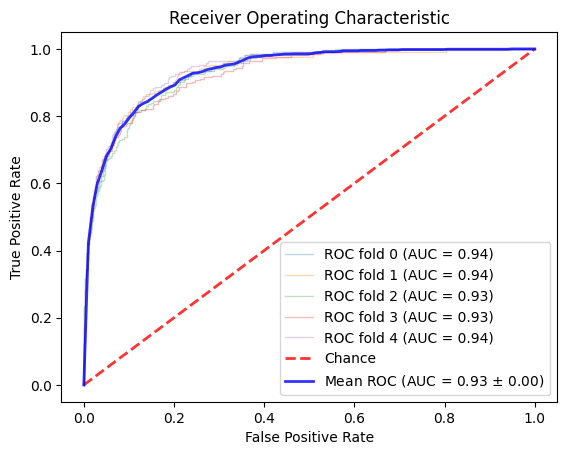

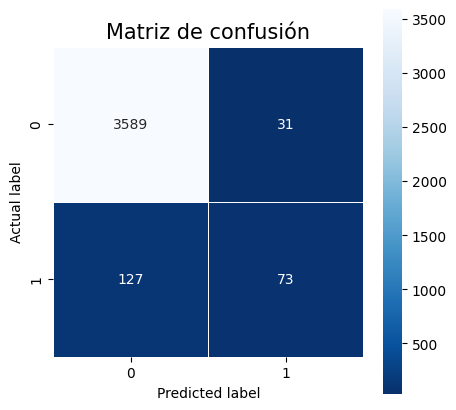

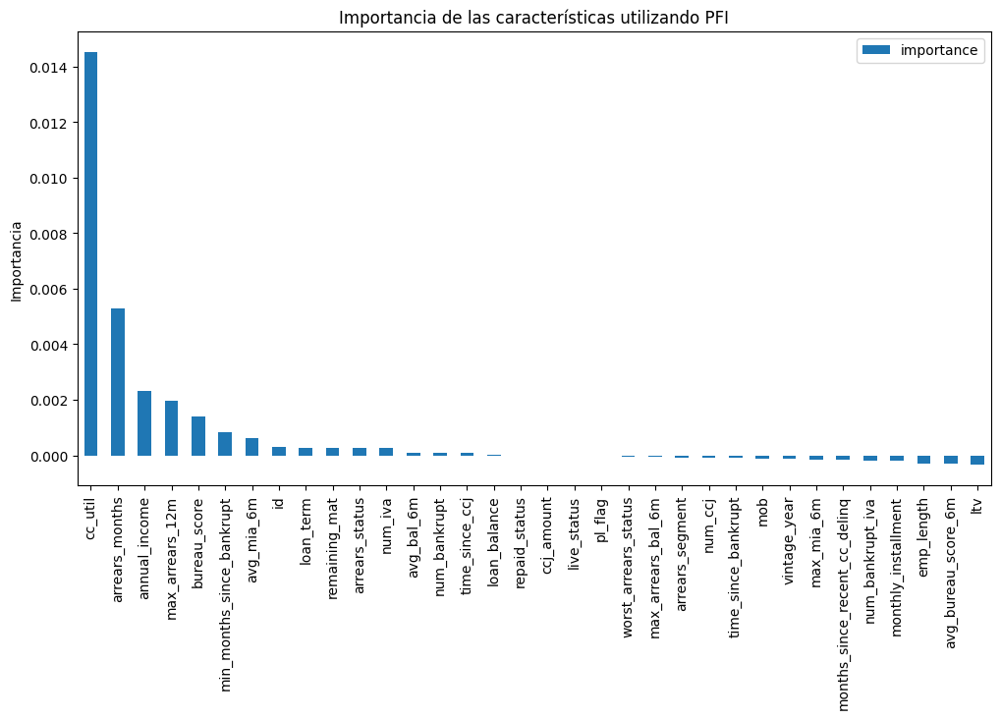

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_cleaned, test_size=0.2, random_state=123, stratify=df_cleaned['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Normaliza los datos
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train.drop(columns=['default_indicator']))
test_scaled = scaler.transform(test.drop(columns=['default_indicator']))

# Entrena el modelo de Regresión Logística
lr_model = LogisticRegression(max_iter=1000, random_state=123)
lr_model.fit(train_scaled, train['default_indicator'])

# Realiza las predicciones
train_preds = lr_model.predict(train_scaled)
test_preds = lr_model.predict(test_scaled)

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Calcula el AUC-ROC para entrenamiento y prueba
train_proba = lr_model.predict_proba(train_scaled)[:, 1]
test_proba = lr_model.predict_proba(test_scaled)[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_proba)
test_auc = roc_auc_score(test['default_indicator'], test_proba)
print(f'AUC del entrenamiento: {train_auc:.2f}')
print(f'AUC de la prueba: {test_auc:.2f}')

# Realiza la validación cruzada y calcula el AUC-ROC
cv = StratifiedKFold(n_splits=5)
tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)
i = 0

cv_scores = cross_val_score(lr_model, train_scaled, train['default_indicator'], cv=cv, scoring='roc_auc')
mean_cv_score = np.mean(cv_scores)
print(f'CV Scores: {cv_scores}')
print(f'Mean CV Score: {mean_cv_score:.2f}')

for train_idx, test_idx in cv.split(train_scaled, train['default_indicator']):
    probas_ = lr_model.fit(train_scaled[train_idx], train['default_indicator'].iloc[train_idx]).predict_proba(train_scaled[test_idx])
    # Compute ROC curve and area under the curve
    fpr, tpr, thresholds = roc_curve(train['default_indicator'].iloc[test_idx], probas_[:, 1])
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Obtiene los coeficientes del modelo
coefficients = lr_model.coef_[0]

# Crea un DataFrame para visualizar los resultados
coefficients_df = pd.DataFrame(coefficients, index=train.drop(columns=['default_indicator']).columns, columns=['Coefficient'])

# Ordena los coeficientes por su valor absoluto
coefficients_df['abs'] = coefficients_df['Coefficient'].abs()
sorted_df = coefficients_df.sort_values('abs', ascending=False).drop('abs', axis=1)


# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Calcula la importancia de las características
result = permutation_importance(lr_model, train_scaled, train['default_indicator'], n_repeats=10)

# Crea un DataFrame para visualizar los resultados
importance_df = pd.DataFrame(result.importances_mean, index=train.drop(columns=['default_indicator']).columns, columns=['importance'])
importance_df.sort_values(by='importance', ascending=False, inplace=True)

# Visualiza la importancia de las características
importance_df.plot(kind='bar', figsize=(12, 6))
plt.title('Importancia de las características utilizando PFI')
plt.ylabel('Importancia')
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_cleaned[df_cleaned['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Normaliza los datos de la persona
person_data_scaled = scaler.transform(person_data)

# Haz la predicción utilizando tu modelo de Regresión Logística
prediction = lr_model.predict(person_data_scaled)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')


#Modelo Support Vector Machines sin variables influyentes con smote y sin smote

Modelo Support Vector Machines sin variables influyentes con smote

Exactitud del entrenamiento: 94.36%
Exactitud de la prueba: 93.73%
Precision del entrenamiento: 95.02%
Precision de la prueba: 94.27%
Recall del entrenamiento: 93.62%
Recall de la prueba: 93.12%
F1 score del entrenamiento: 94.32%
F1 score de la prueba: 93.69%
AUC del entrenamiento: 0.99
AUC de la prueba: 0.98
CV Scores: [0.98507203 0.98676737 0.98566322 0.98677153 0.98568527]
Mean CV Score: 0.99


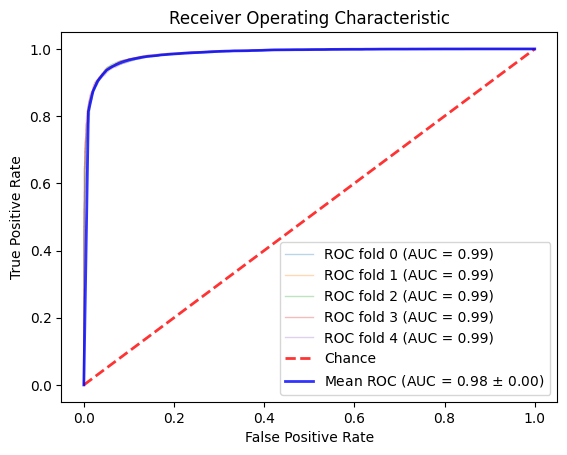

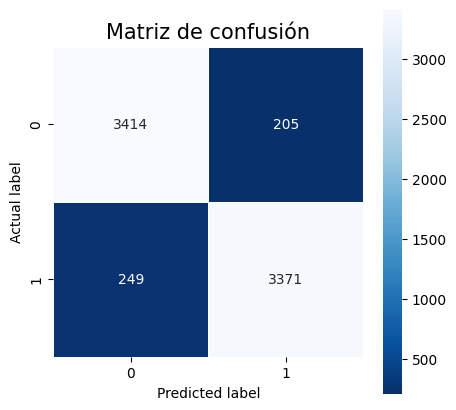

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


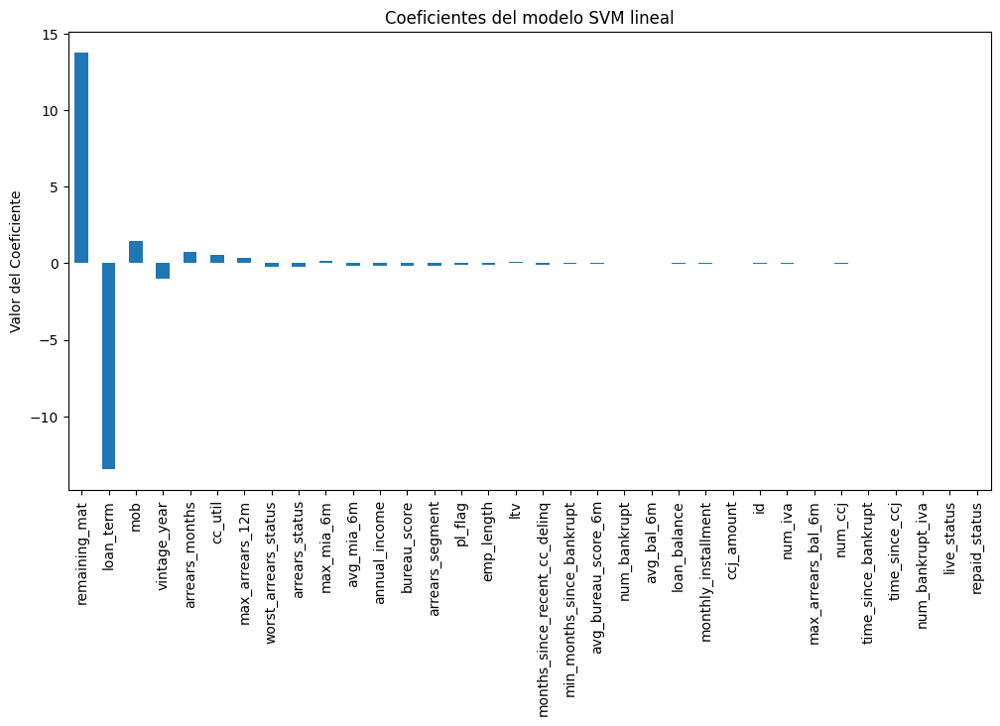

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.svm import SVC, LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, auc, confusion_matrix, accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_resampled, test_size=0.2, random_state=123, stratify=df_resampled['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Normaliza los datos
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train.drop(columns=['default_indicator']))
test_scaled = scaler.transform(test.drop(columns=['default_indicator']))

# Entrena el modelo de SVM
svm_model = SVC(kernel='linear', probability=True, random_state=123)
svm_model.fit(train_scaled, train['default_indicator'])

# Realiza las predicciones
train_preds = svm_model.predict(train_scaled)
test_preds = svm_model.predict(test_scaled)

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')


# Calcula el AUC-ROC para entrenamiento y prueba
train_proba = svm_model.predict_proba(train_scaled)[:, 1]
test_proba = svm_model.predict_proba(test_scaled)[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_proba)
test_auc = roc_auc_score(test['default_indicator'], test_proba)
print(f'AUC del entrenamiento: {train_auc:.2f}')
print(f'AUC de la prueba: {test_auc:.2f}')

# Realiza la validación cruzada y calcula el AUC-ROC
cv = StratifiedKFold(n_splits=5)
tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)
i = 0

cv_scores = cross_val_score(svm_model, train_scaled, train['default_indicator'], cv=cv, scoring='roc_auc')
mean_cv_score = np.mean(cv_scores)
print(f'CV Scores: {cv_scores}')
print(f'Mean CV Score: {mean_cv_score:.2f}')

for train_idx, test_idx in cv.split(train_scaled, train['default_indicator']):
    probas_ = svm_model.fit(train_scaled[train_idx], train['default_indicator'].iloc[train_idx]).predict_proba(train_scaled[test_idx])
    # Compute ROC curve and area under the curve
    fpr, tpr, thresholds = roc_curve(train['default_indicator'].iloc[test_idx], probas_[:, 1])
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size = 15)
plt.show()

# Entrena el modelo de SVM lineal para obtener los coeficientes
linear_svm_model = LinearSVC(random_state=123)
linear_svm_model.fit(train_scaled, train['default_indicator'])

# Obtiene los coeficientes del modelo
coefficients = linear_svm_model.coef_[0]

# Crea un DataFrame para visualizar los resultados
coefficients_df = pd.DataFrame(coefficients, index=train.drop(columns=['default_indicator']).columns, columns=['Coefficient'])

# Ordena los coeficientes por su valor absoluto
coefficients_df['abs'] = coefficients_df['Coefficient'].abs()
sorted_df = coefficients_df.sort_values('abs', ascending=False).drop('abs', axis=1)

# Visualiza los coeficientes
plt.figure(figsize=(12, 6))
sorted_df['Coefficient'].plot(kind='bar')
plt.title('Coeficientes del modelo SVM lineal')
plt.ylabel('Valor del Coeficiente')
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_resampled[df_resampled['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Normaliza los datos de la persona
person_data_scaled = scaler.transform(person_data)

# Haz la predicción utilizando tu modelo de SVM
prediction = svm_model.predict(person_data_scaled)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')

Modelo Support Vector Machines sin variables influyentes sin smote

Exactitud del entrenamiento: 95.80%
Exactitud de la prueba: 95.58%
Precision del entrenamiento: 80.34%
Precision de la prueba: 74.60%
Recall del entrenamiento: 26.38%
Recall de la prueba: 23.50%
F1 score del entrenamiento: 39.72%
F1 score de la prueba: 35.74%
AUC del entrenamiento: 0.93
AUC de la prueba: 0.93
CV Scores: [0.92495891 0.93557913 0.92707501 0.92422764 0.93608905]
Mean CV Score: 0.93


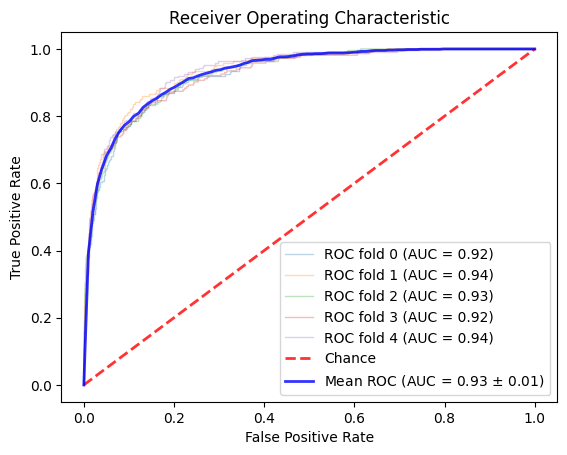

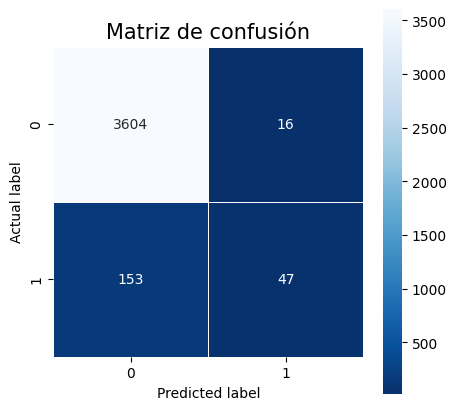

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


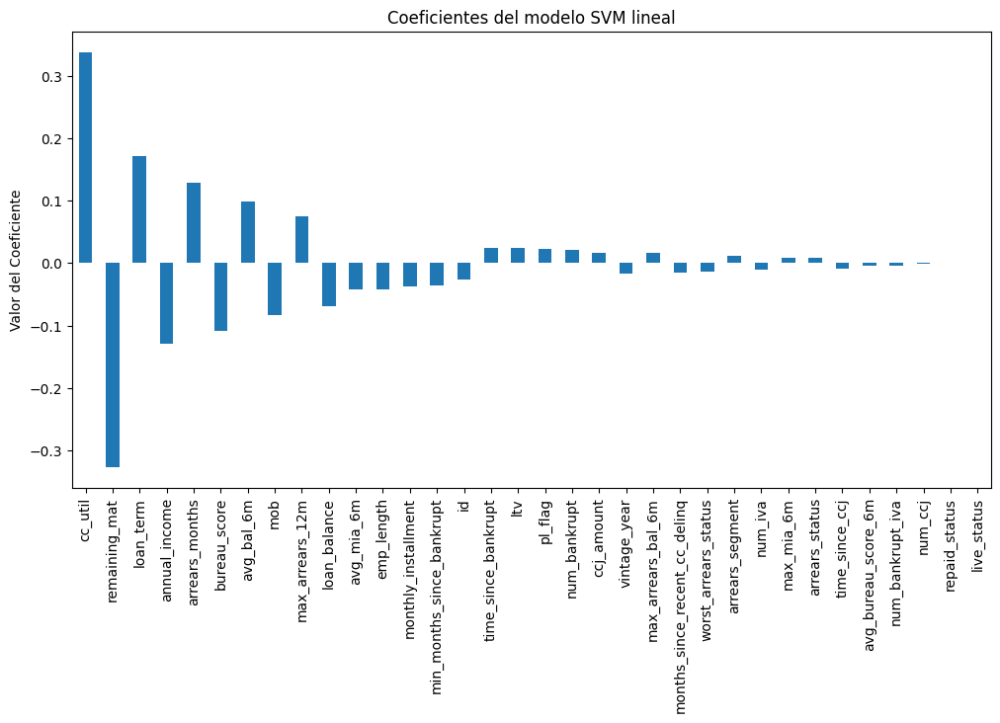

La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.svm import SVC, LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, auc, confusion_matrix, accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_cleaned, test_size=0.2, random_state=123, stratify=df_cleaned['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Normaliza los datos
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train.drop(columns=['default_indicator']))
test_scaled = scaler.transform(test.drop(columns=['default_indicator']))

# Entrena el modelo de SVM
svm_model = SVC(kernel='linear', probability=True, random_state=123)
svm_model.fit(train_scaled, train['default_indicator'])

# Realiza las predicciones
train_preds = svm_model.predict(train_scaled)
test_preds = svm_model.predict(test_scaled)

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')


# Calcula el AUC-ROC para entrenamiento y prueba
train_proba = svm_model.predict_proba(train_scaled)[:, 1]
test_proba = svm_model.predict_proba(test_scaled)[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_proba)
test_auc = roc_auc_score(test['default_indicator'], test_proba)
print(f'AUC del entrenamiento: {train_auc:.2f}')
print(f'AUC de la prueba: {test_auc:.2f}')

# Realiza la validación cruzada y calcula el AUC-ROC
cv = StratifiedKFold(n_splits=5)
tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)
i = 0

cv_scores = cross_val_score(svm_model, train_scaled, train['default_indicator'], cv=cv, scoring='roc_auc')
mean_cv_score = np.mean(cv_scores)
print(f'CV Scores: {cv_scores}')
print(f'Mean CV Score: {mean_cv_score:.2f}')

for train_idx, test_idx in cv.split(train_scaled, train['default_indicator']):
    probas_ = svm_model.fit(train_scaled[train_idx], train['default_indicator'].iloc[train_idx]).predict_proba(train_scaled[test_idx])
    # Compute ROC curve and area under the curve
    fpr, tpr, thresholds = roc_curve(train['default_indicator'].iloc[test_idx], probas_[:, 1])
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size = 15)
plt.show()

# Entrena el modelo de SVM lineal para obtener los coeficientes
linear_svm_model = LinearSVC(random_state=123)
linear_svm_model.fit(train_scaled, train['default_indicator'])

# Obtiene los coeficientes del modelo
coefficients = linear_svm_model.coef_[0]

# Crea un DataFrame para visualizar los resultados
coefficients_df = pd.DataFrame(coefficients, index=train.drop(columns=['default_indicator']).columns, columns=['Coefficient'])

# Ordena los coeficientes por su valor absoluto
coefficients_df['abs'] = coefficients_df['Coefficient'].abs()
sorted_df = coefficients_df.sort_values('abs', ascending=False).drop('abs', axis=1)

# Visualiza los coeficientes
plt.figure(figsize=(12, 6))
sorted_df['Coefficient'].plot(kind='bar')
plt.title('Coeficientes del modelo SVM lineal')
plt.ylabel('Valor del Coeficiente')
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_cleaned[df_cleaned['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Normaliza los datos de la persona
person_data_scaled = scaler.transform(person_data)

# Haz la predicción utilizando tu modelo de SVM
prediction = svm_model.predict(person_data_scaled)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')

#Analisis y conclusión

La estrategia inicial incluyó la eliminación de características altamente correlacionadas con la variable objetivo, específicamente arrears_event, bankrupt_event y term_expiry_event, con el fin de explorar el impacto y la capacidad predictiva de las demás variables en el conjunto de datos sin SMOTE.

Con SMOTE: Los valores de todas las metricas bajaron nuevamente su porcentaje pero aun asi entrega resultados favorables.

Sin SMOTE: Los valores de las metricas precisión, recall y f1 score bajaron drasticamente. La decision de eliminar las variables mas influyentes en el conjunto de datos desequilibrado afecto notablemente en las predicciones, esto se  visualiza en las matrices de confusiones.

Como estrategia futura, se aplicará un enfoque donde cada modelo solo utilizará las 15 mejores características identificadas en la estrategia nº2. Esto permitirá evaluar cómo responden los modelos y si se mejoran los porcentajes de las metricas. Además, se dejara fuera para la prediccion la característica 'ID', que aunque sirve como identificador de fila, ha demostrado contribuir a la predicción del riesgo crediticio de manera inesperada.


----------------------------------------



#Modelos con las 15 mejores caracteristicas con smote y sin smote

#Random Forest con las mejores 15 caracteristicas sin smote y con smote

Random Forest con las mejores 15 caracteristicas sin smote

Exactitud del entrenamiento: 100.00%
Exactitud de la prueba: 96.54%
Precisión del entrenamiento: 100.00%
Precisión de la prueba: 74.29%
Recall del entrenamiento: 99.91%
Recall de la prueba: 52.00%
F1 score del entrenamiento: 99.95%
F1 score de la prueba: 61.18%
CV scores: [0.96613497 0.96490798 0.96367207 0.9646539  0.96710849]
Mean CV score: 0.9652954814460095
Train AUC: 1.0
Test AUC: 0.941017955801105
[0.1938626  0.09741675 0.10062719 0.09924141 0.05311396 0.05023521
 0.03552443 0.05765946 0.0674667  0.04734639 0.04286631 0.04121118
 0.0437227  0.03358714 0.03611858]


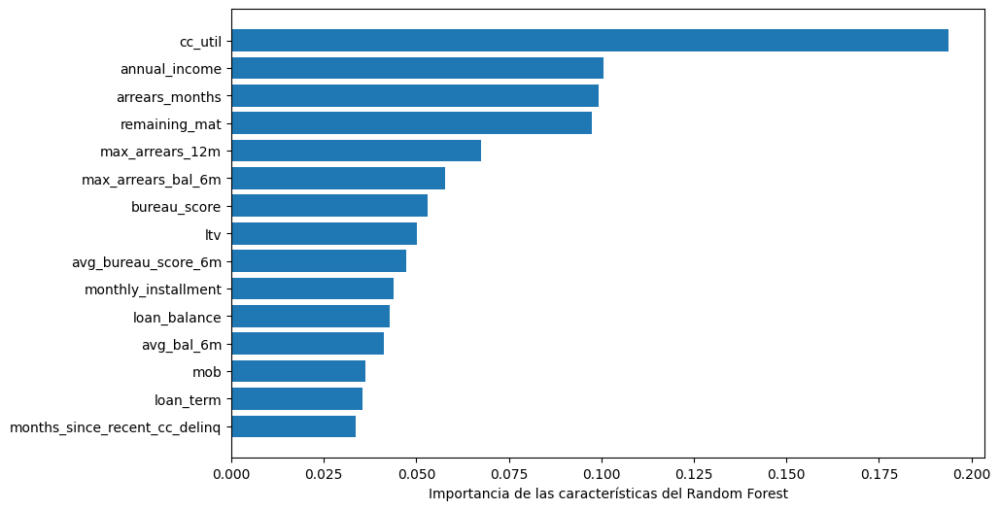

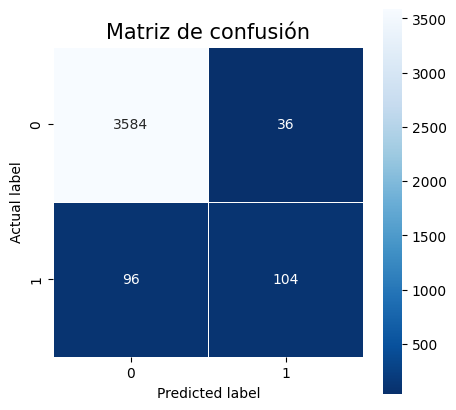

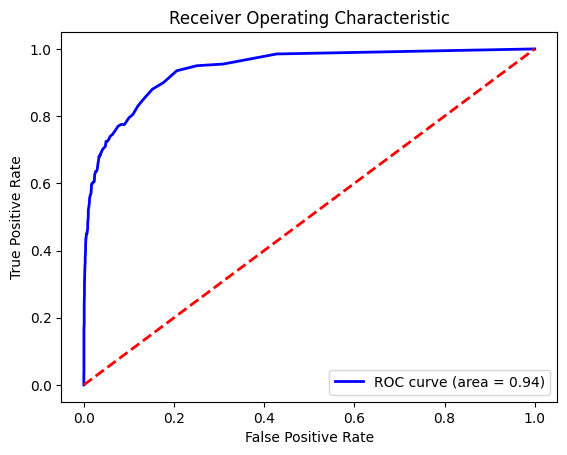

La predicción para la persona con ID 8789301 en df_aux1 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc, confusion_matrix, accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define las 15 mejores características
best_features = [
    'cc_util', 'remaining_mat', 'annual_income', 'arrears_months', 'bureau_score',
    'ltv', 'loan_term', 'max_arrears_bal_6m', 'max_arrears_12m', 'avg_bureau_score_6m',
    'loan_balance', 'avg_bal_6m', 'monthly_installment', 'months_since_recent_cc_delinq',
    'mob'
]

# Crea un dataframe auxiliar solo con las mejores características y la columna 'default_indicator'
df_aux1 = df_cleaned[['id', 'default_indicator'] + best_features].copy()

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_aux1, test_size=0.2, random_state=123, stratify=df_aux1['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Entrena el modelo de Random Forest
rf_model = RandomForestClassifier(n_estimators=100, max_features=4, random_state=123)
rf_model.fit(train.drop(columns=['id', 'default_indicator']), train['default_indicator'])

# Realiza las predicciones
train_preds = rf_model.predict(train.drop(columns=['id', 'default_indicator']))
test_preds = rf_model.predict(test.drop(columns=['id', 'default_indicator']))

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precisión del entrenamiento: {train_precision*100:.2f}%')
print(f'Precisión de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores = cross_val_score(rf_model, train.drop(columns=['id', 'default_indicator']), train['default_indicator'], cv=5)
print(f'CV scores: {cv_scores}')
print(f'Mean CV score: {cv_scores.mean()}')

# Calcula AUC-ROC
train_probs = rf_model.predict_proba(train.drop(columns=['id', 'default_indicator']))[:, 1]
test_probs = rf_model.predict_proba(test.drop(columns=['id', 'default_indicator']))[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_probs)
test_auc = roc_auc_score(test['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Analiza la importancia de las características
importances = rf_model.feature_importances_
print(importances)

# Visualiza la importancia de las características
plt.figure(figsize=(10, 6))
sorted_idx = rf_model.feature_importances_.argsort()
plt.barh(train.drop(columns=['id', 'default_indicator']).columns[sorted_idx], rf_model.feature_importances_[sorted_idx])
plt.xlabel("Importancia de las características del Random Forest")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona en df_aux1
person_data_aux = df_aux1[df_aux1['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data_aux = person_data_aux[best_features]

# Haz la predicción utilizando tu modelo de Random Forest
prediction_aux = rf_model.predict(person_data_aux)

print(f'La predicción para la persona con ID {person_id} en df_aux1 es: {prediction_aux[0]}')



Random Forest con las mejores 15 caracteristicas con smote

Exactitud del entrenamiento: 99.99%
Exactitud de la prueba: 95.43%
Precisión del entrenamiento: 99.99%
Precisión de la prueba: 93.66%
Recall del entrenamiento: 99.99%
Recall de la prueba: 97.46%
F1 score del entrenamiento: 99.99%
F1 score de la prueba: 95.52%
CV scores: [0.95506346 0.95778296 0.95791246 0.95829556 0.95220826]
Mean CV score: 0.9562525383014957
Train AUC: 0.9999999973164766
Test AUC: 0.9904440040974659
[0.29931753 0.03536366 0.04725196 0.10823633 0.03942671 0.02129399
 0.03991608 0.08869284 0.16712971 0.03460093 0.0177568  0.01747432
 0.0179722  0.04637275 0.01919419]


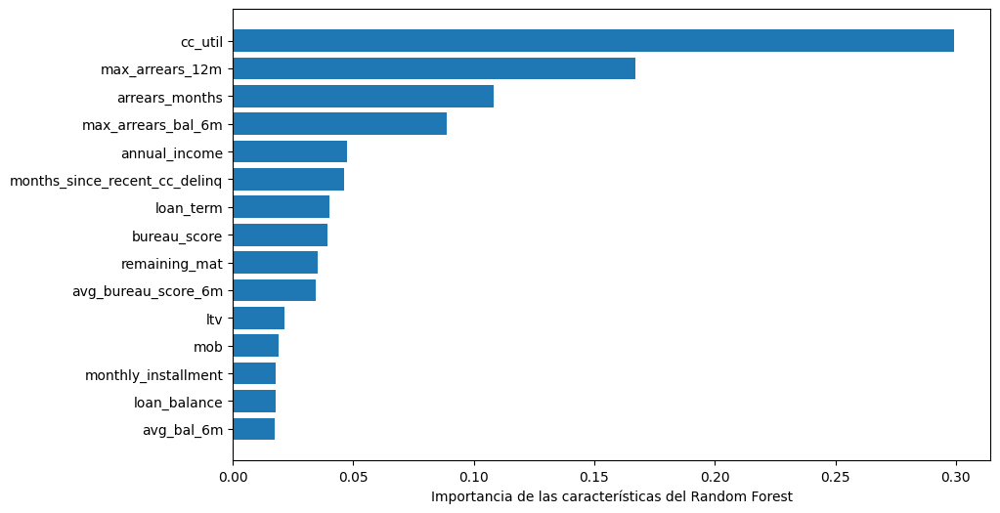

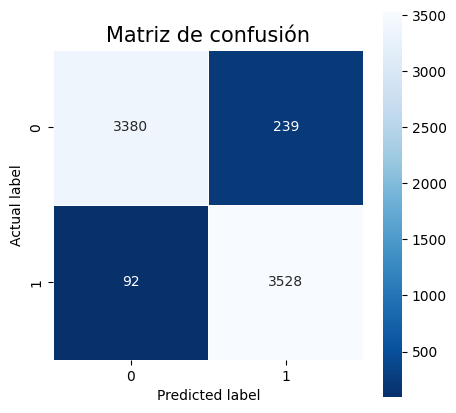

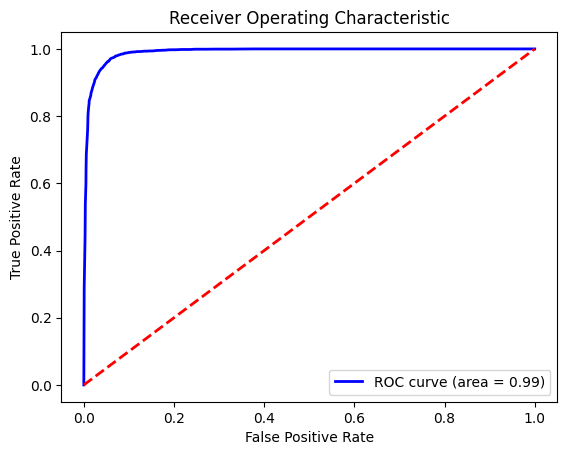

La predicción para la persona con ID 8789301 en df_aux1 es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc, confusion_matrix, accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define las 15 mejores características
best_features = [
    'cc_util', 'remaining_mat', 'annual_income', 'arrears_months', 'bureau_score',
    'ltv', 'loan_term', 'max_arrears_bal_6m', 'max_arrears_12m', 'avg_bureau_score_6m',
    'loan_balance', 'avg_bal_6m', 'monthly_installment', 'months_since_recent_cc_delinq',
    'mob'
]

# Crea un dataframe auxiliar solo con las mejores características y la columna 'default_indicator'
df_aux1 = df_resampled[['id', 'default_indicator'] + best_features].copy()

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_aux1, test_size=0.2, random_state=123, stratify=df_aux1['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Entrena el modelo de Random Forest
rf_model = RandomForestClassifier(n_estimators=100, max_features=4, random_state=123)
rf_model.fit(train.drop(columns=['id', 'default_indicator']), train['default_indicator'])

# Realiza las predicciones
train_preds = rf_model.predict(train.drop(columns=['id', 'default_indicator']))
test_preds = rf_model.predict(test.drop(columns=['id', 'default_indicator']))

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precisión del entrenamiento: {train_precision*100:.2f}%')
print(f'Precisión de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores = cross_val_score(rf_model, train.drop(columns=['id', 'default_indicator']), train['default_indicator'], cv=5)
print(f'CV scores: {cv_scores}')
print(f'Mean CV score: {cv_scores.mean()}')

# Calcula AUC-ROC
train_probs = rf_model.predict_proba(train.drop(columns=['id', 'default_indicator']))[:, 1]
test_probs = rf_model.predict_proba(test.drop(columns=['id', 'default_indicator']))[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_probs)
test_auc = roc_auc_score(test['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Analiza la importancia de las características
importances = rf_model.feature_importances_
print(importances)

# Visualiza la importancia de las características
plt.figure(figsize=(10, 6))
sorted_idx = rf_model.feature_importances_.argsort()
plt.barh(train.drop(columns=['id', 'default_indicator']).columns[sorted_idx], rf_model.feature_importances_[sorted_idx])
plt.xlabel("Importancia de las características del Random Forest")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona en df_aux1
person_data_aux = df_aux1[df_aux1['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data_aux = person_data_aux[best_features]

# Haz la predicción utilizando tu modelo de Random Forest
prediction_aux = rf_model.predict(person_data_aux)

print(f'La predicción para la persona con ID {person_id} en df_aux1 es: {prediction_aux[0]}')


#Modelo Decision Trees con las 15 mejores caracteristicas sin smote y con smote

Modelo Decision Trees con las 15 mejores caracteristicas sin smote

Exactitud del entrenamiento: 100.00%
Exactitud de la prueba: 93.59%
Precisión del entrenamiento: 100.00%
Precisión de la prueba: 40.17%
Recall del entrenamiento: 100.00%
Recall de la prueba: 46.00%
F1 score del entrenamiento: 100.00%
F1 score de la prueba: 42.89%
CV scores: [0.95018405 0.94429448 0.94207167 0.95017182 0.94378989]
Mean CV score: 0.9461023820064994
Train AUC: 1.0
Test AUC: 0.7110773480662983
[0.2177505  0.14957923 0.12703433 0.09839166 0.06407717 0.06697708
 0.05706692 0.03411362 0.0430664  0.02635336 0.02654426 0.02620066
 0.02643629 0.02442858 0.01197992]


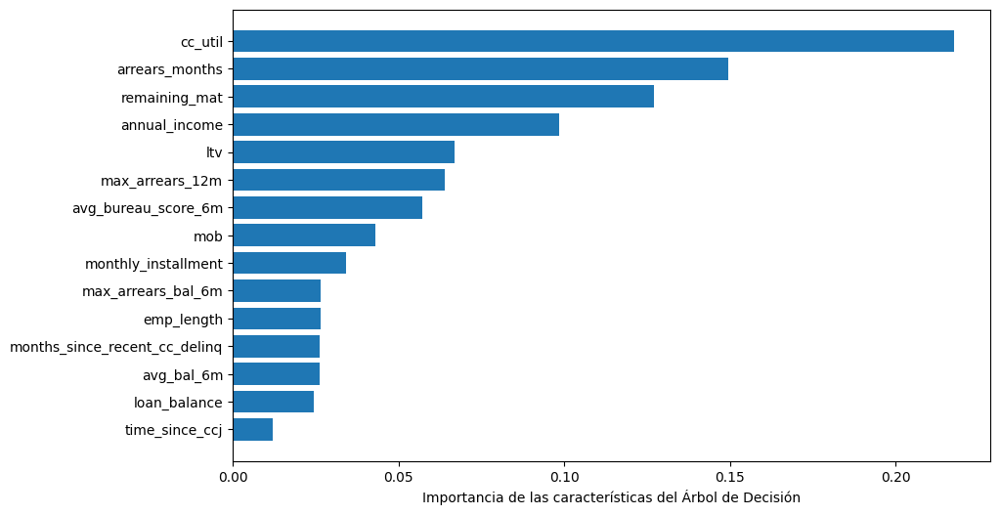

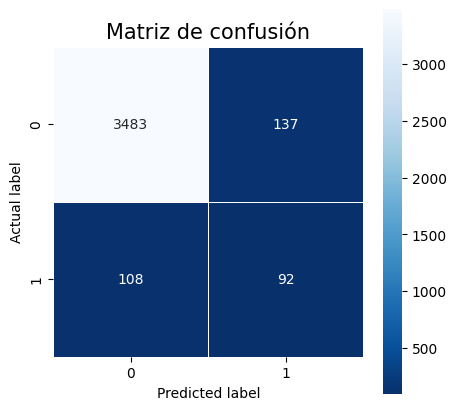

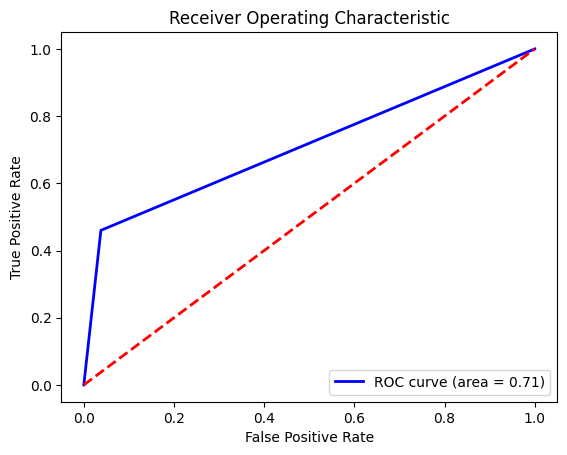

La predicción para la persona con ID 8789301 en df_aux_dt es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_curve, auc, confusion_matrix, accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define las 15 mejores características
best_features_dt = [
    'cc_util', 'arrears_months', 'remaining_mat', 'annual_income', 'max_arrears_12m',
    'ltv', 'avg_bureau_score_6m', 'monthly_installment', 'mob', 'months_since_recent_cc_delinq',
    'max_arrears_bal_6m', 'avg_bal_6m', 'emp_length', 'loan_balance', 'time_since_ccj'
]

# Crea un dataframe auxiliar solo con las mejores características y la columna 'default_indicator'
df_aux_dt = df_cleaned[['id', 'default_indicator'] + best_features_dt].copy()

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train_dt, temp_dt = train_test_split(df_aux_dt, test_size=0.2, random_state=123, stratify=df_aux_dt['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test_dt, eval_dt = train_test_split(temp_dt, test_size=0.25, random_state=123, stratify=temp_dt['default_indicator'])

# Entrena el modelo de Árbol de Decisión
dt_model = DecisionTreeClassifier(random_state=123)
dt_model.fit(train_dt.drop(columns=['id', 'default_indicator']), train_dt['default_indicator'])

# Realiza las predicciones
train_preds = dt_model.predict(train_dt.drop(columns=['id', 'default_indicator']))
test_preds = dt_model.predict(test_dt.drop(columns=['id', 'default_indicator']))

# Evalúa el rendimiento
train_acc = accuracy_score(train_dt['default_indicator'], train_preds)
test_acc = accuracy_score(test_dt['default_indicator'], test_preds)
train_precision = precision_score(train_dt['default_indicator'], train_preds)
test_precision = precision_score(test_dt['default_indicator'], test_preds)
train_recall = recall_score(train_dt['default_indicator'], train_preds)
test_recall = recall_score(test_dt['default_indicator'], test_preds)
train_f1 = f1_score(train_dt['default_indicator'], train_preds)
test_f1 = f1_score(test_dt['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precisión del entrenamiento: {train_precision*100:.2f}%')
print(f'Precisión de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores_dt = cross_val_score(dt_model, train_dt.drop(columns=['id', 'default_indicator']), train_dt['default_indicator'], cv=5)
print(f'CV scores: {cv_scores_dt}')
print(f'Mean CV score: {cv_scores_dt.mean()}')

# Calcula AUC-ROC
train_probs = dt_model.predict_proba(train_dt.drop(columns=['id', 'default_indicator']))[:, 1]
test_probs = dt_model.predict_proba(test_dt.drop(columns=['id', 'default_indicator']))[:, 1]
train_auc = roc_auc_score(train_dt['default_indicator'], train_probs)
test_auc = roc_auc_score(test_dt['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Visualiza la importancia de las características
importances_dt = dt_model.feature_importances_
print(importances_dt)

plt.figure(figsize=(10,6))
sorted_idx_dt = dt_model.feature_importances_.argsort()
plt.barh(train_dt.drop(columns=['id', 'default_indicator']).columns[sorted_idx_dt], dt_model.feature_importances_[sorted_idx_dt])
plt.xlabel("Importancia de las características del Árbol de Decisión")
plt.show()

# Muestra la matriz de confusión
cm_dt = confusion_matrix(test_dt['default_indicator'], test_preds)
plt.figure(figsize=(5,5))
sns.heatmap(cm_dt, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test_dt['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona en df_aux_dt
person_data_aux_dt = df_aux_dt[df_aux_dt['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data_dt = person_data_aux_dt[best_features_dt]

# Haz la predicción utilizando tu modelo de Árbol de Decisión
prediction_dt = dt_model.predict(person_data_dt)

print(f'La predicción para la persona con ID {person_id} en df_aux_dt es: {prediction_dt[0]}')




Modelo Decision Trees con las 15 mejores caracteristicas con smote

Exactitud del entrenamiento: 100.00%
Exactitud de la prueba: 92.50%
Precisión del entrenamiento: 100.00%
Precisión de la prueba: 91.39%
Recall del entrenamiento: 100.00%
Recall de la prueba: 93.84%
F1 score del entrenamiento: 100.00%
F1 score de la prueba: 92.60%
CV scores: [0.92877493 0.93369593 0.92864543 0.93044942 0.92734102]
Mean CV score: 0.9297813465537853
Train AUC: 1.0
Test AUC: 0.9249877869867289
[0.24499086 0.45390107 0.0421559  0.03753534 0.04090136 0.02625378
 0.01737164 0.0106476  0.02203049 0.0210611  0.02143642 0.01859696
 0.01158954 0.01235905 0.0191689 ]


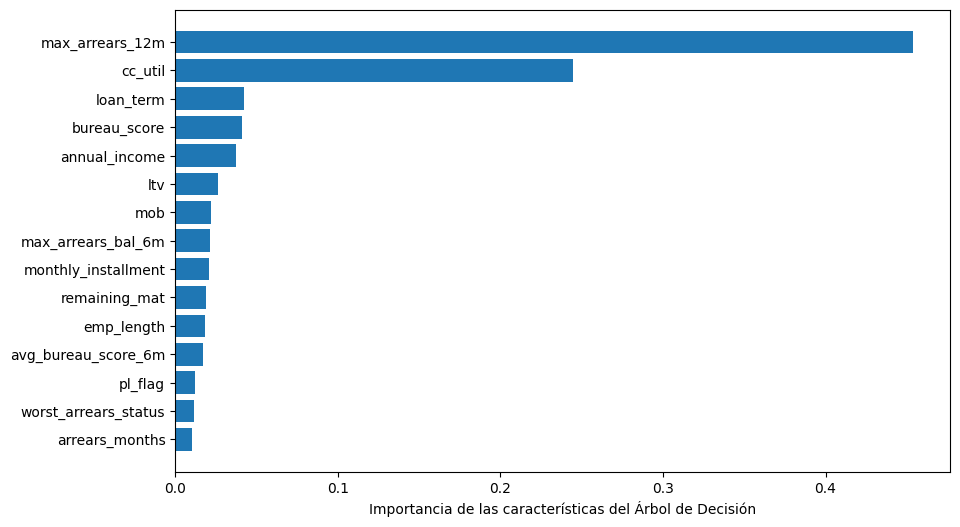

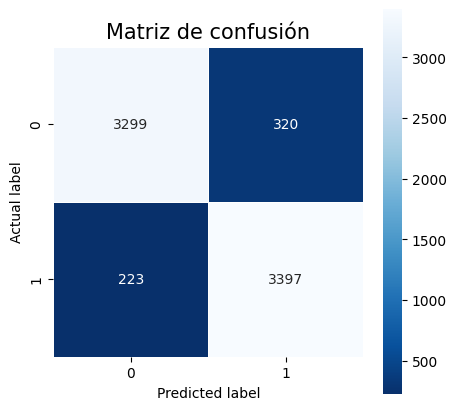

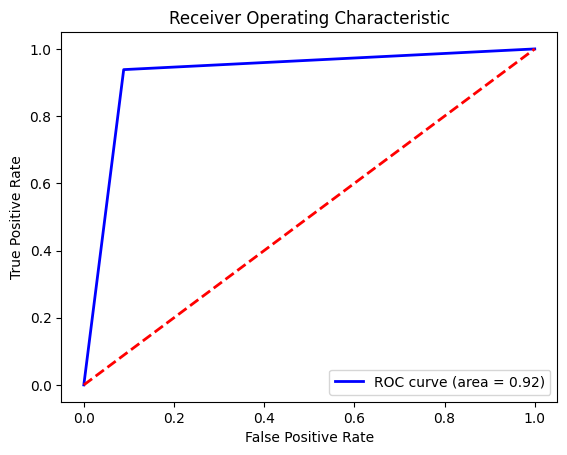

La predicción para la persona con ID 8789301 en df_aux_dt es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_curve, auc, confusion_matrix, accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define las 15 mejores características
best_features_dt = [
    'cc_util', 'max_arrears_12m', 'loan_term', 'annual_income', 'bureau_score', 'ltv', 'avg_bureau_score_6m', 'arrears_months', 'mob',
    'monthly_installment', 'max_arrears_bal_6m', 'emp_length', 'worst_arrears_status', 'pl_flag', 'remaining_mat'
]

# Crea un dataframe auxiliar solo con las mejores características y la columna 'default_indicator'
df_aux_dt = df_resampled[['id', 'default_indicator'] + best_features_dt].copy()

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train_dt, temp_dt = train_test_split(df_aux_dt, test_size=0.2, random_state=123, stratify=df_aux_dt['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test_dt, eval_dt = train_test_split(temp_dt, test_size=0.25, random_state=123, stratify=temp_dt['default_indicator'])

# Entrena el modelo de Árbol de Decisión
dt_model = DecisionTreeClassifier(random_state=123)
dt_model.fit(train_dt.drop(columns=['id', 'default_indicator']), train_dt['default_indicator'])

# Realiza las predicciones
train_preds = dt_model.predict(train_dt.drop(columns=['id', 'default_indicator']))
test_preds = dt_model.predict(test_dt.drop(columns=['id', 'default_indicator']))

# Evalúa el rendimiento
train_acc = accuracy_score(train_dt['default_indicator'], train_preds)
test_acc = accuracy_score(test_dt['default_indicator'], test_preds)
train_precision = precision_score(train_dt['default_indicator'], train_preds)
test_precision = precision_score(test_dt['default_indicator'], test_preds)
train_recall = recall_score(train_dt['default_indicator'], train_preds)
test_recall = recall_score(test_dt['default_indicator'], test_preds)
train_f1 = f1_score(train_dt['default_indicator'], train_preds)
test_f1 = f1_score(test_dt['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precisión del entrenamiento: {train_precision*100:.2f}%')
print(f'Precisión de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores_dt = cross_val_score(dt_model, train_dt.drop(columns=['id', 'default_indicator']), train_dt['default_indicator'], cv=5)
print(f'CV scores: {cv_scores_dt}')
print(f'Mean CV score: {cv_scores_dt.mean()}')

# Calcula AUC-ROC
train_probs = dt_model.predict_proba(train_dt.drop(columns=['id', 'default_indicator']))[:, 1]
test_probs = dt_model.predict_proba(test_dt.drop(columns=['id', 'default_indicator']))[:, 1]
train_auc = roc_auc_score(train_dt['default_indicator'], train_probs)
test_auc = roc_auc_score(test_dt['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Visualiza la importancia de las características
importances_dt = dt_model.feature_importances_
print(importances_dt)

plt.figure(figsize=(10, 6))
sorted_idx_dt = dt_model.feature_importances_.argsort()
plt.barh(train_dt.drop(columns=['id', 'default_indicator']).columns[sorted_idx_dt], dt_model.feature_importances_[sorted_idx_dt])
plt.xlabel("Importancia de las características del Árbol de Decisión")
plt.show()

# Muestra la matriz de confusión
cm_dt = confusion_matrix(test_dt['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm_dt, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test_dt['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona en df_aux_dt
person_data_aux_dt = df_aux_dt[df_aux_dt['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data_dt = person_data_aux_dt[best_features_dt]

# Haz la predicción utilizando tu modelo de Árbol de Decisión
prediction_dt = dt_model.predict(person_data_dt)

print(f'La predicción para la persona con ID {person_id} en df_aux_dt es: {prediction_dt[0]}')


#Gradient Boosting con las mejores 15 caracteristicas sin smote y con smote

Gradient Boosting con las mejores 15 caracteristicas sin smote

Precisión del entrenamiento: 95.61%
Precisión de la prueba: 94.79%
Precisión del entrenamiento: 65.59%
Precisión de la prueba: 50.42%
Recall del entrenamiento: 34.24%
Recall de la prueba: 30.00%
F1 score del entrenamiento: 44.99%
F1 score de la prueba: 37.62%
CV scores: [0.95190184 0.95018405 0.95581738 0.94869907 0.95213549]
Mean CV score: 0.9517475657393437
Train AUC: 0.648691510943083
Test AUC: 0.6249530386740333
[2.65299671e-01 6.10797978e-01 1.56014913e-02 2.88572286e-05
 5.83405230e-04 2.71047905e-02 1.49724885e-02 3.80393116e-04
 3.78996365e-02 4.80771940e-04 2.07842297e-02 1.79180937e-03
 2.28852015e-03 1.92625176e-03 5.97054997e-05]


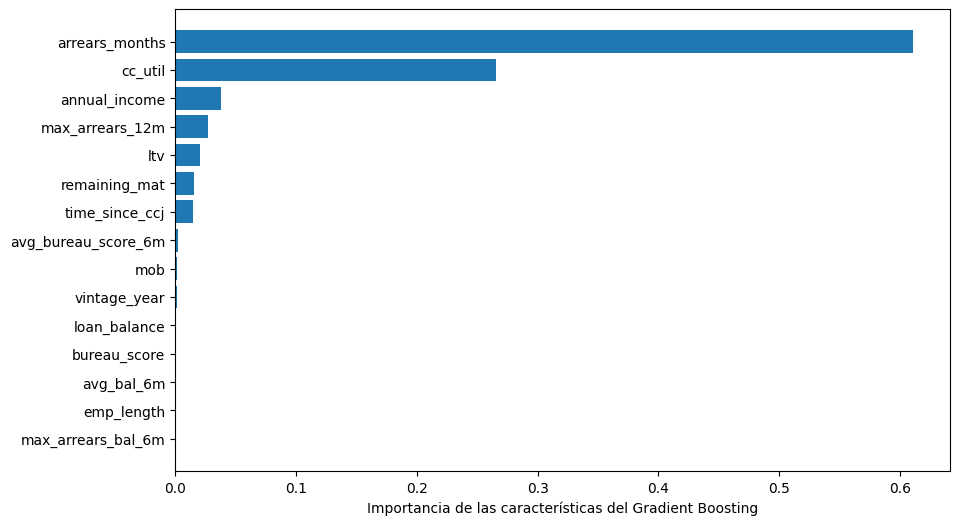

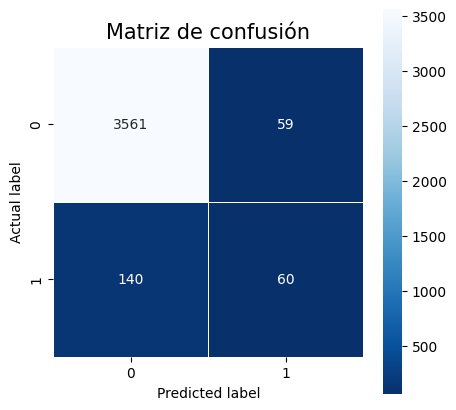

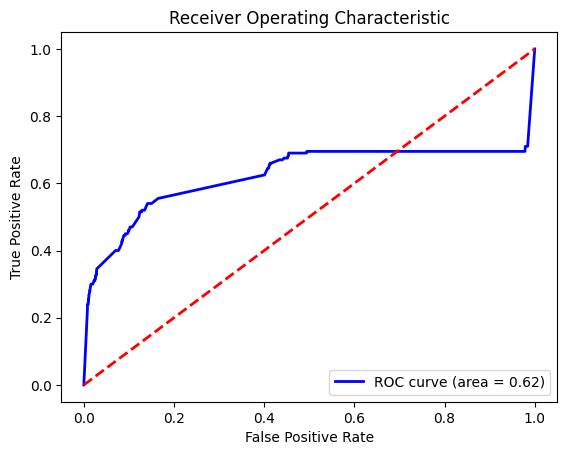

La predicción para la persona con ID 8789301 en df_aux_gb es: 0


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define las 15 mejores características
best_features_gb = [
    'cc_util', 'arrears_months', 'remaining_mat', 'max_arrears_bal_6m', 'loan_balance',
    'max_arrears_12m', 'time_since_ccj', 'avg_bal_6m', 'annual_income', 'bureau_score',
    'ltv', 'vintage_year', 'avg_bureau_score_6m', 'mob', 'emp_length'
]

# Crea un dataframe auxiliar solo con las mejores características y la columna 'default_indicator'
df_aux_gb = df_cleaned[['id', 'default_indicator'] + best_features_gb].copy()

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train_gb, temp_gb = train_test_split(df_aux_gb, test_size=0.2, random_state=123, stratify=df_aux_gb['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test_gb, eval_gb = train_test_split(temp_gb, test_size=0.25, random_state=123, stratify=temp_gb['default_indicator'])

# Entrena el modelo de Gradient Boosting
gb_model = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=4, random_state=123)
gb_model.fit(train_gb.drop(columns=['id', 'default_indicator']), train_gb['default_indicator'])

# Realiza las predicciones
train_preds_gb = gb_model.predict(train_gb.drop(columns=['id', 'default_indicator']))
test_preds_gb = gb_model.predict(test_gb.drop(columns=['id', 'default_indicator']))

# Evalúa el rendimiento
train_acc_gb = accuracy_score(train_gb['default_indicator'], train_preds_gb)
test_acc_gb = accuracy_score(test_gb['default_indicator'], test_preds_gb)
train_precision_gb = precision_score(train_gb['default_indicator'], train_preds_gb)
test_precision_gb = precision_score(test_gb['default_indicator'], test_preds_gb)
train_recall_gb = recall_score(train_gb['default_indicator'], train_preds_gb)
test_recall_gb = recall_score(test_gb['default_indicator'], test_preds_gb)
train_f1_gb = f1_score(train_gb['default_indicator'], train_preds_gb)
test_f1_gb = f1_score(test_gb['default_indicator'], test_preds_gb)

print(f'Precisión del entrenamiento: {train_acc_gb*100:.2f}%')
print(f'Precisión de la prueba: {test_acc_gb*100:.2f}%')
print(f'Precisión del entrenamiento: {train_precision_gb*100:.2f}%')
print(f'Precisión de la prueba: {test_precision_gb*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall_gb*100:.2f}%')
print(f'Recall de la prueba: {test_recall_gb*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1_gb*100:.2f}%')
print(f'F1 score de la prueba: {test_f1_gb*100:.2f}%')

# Realiza la validación cruzada
cv_scores_gb = cross_val_score(gb_model, train_gb.drop(columns=['id', 'default_indicator']), train_gb['default_indicator'], cv=5)
print(f'CV scores: {cv_scores_gb}')
print(f'Mean CV score: {cv_scores_gb.mean()}')

# Calcula AUC-ROC
train_probs_gb = gb_model.predict_proba(train_gb.drop(columns=['id', 'default_indicator']))[:, 1]
test_probs_gb = gb_model.predict_proba(test_gb.drop(columns=['id', 'default_indicator']))[:, 1]
train_auc_gb = roc_auc_score(train_gb['default_indicator'], train_probs_gb)
test_auc_gb = roc_auc_score(test_gb['default_indicator'], test_probs_gb)
print(f'Train AUC: {train_auc_gb}')
print(f'Test AUC: {test_auc_gb}')

# Visualiza la importancia de las características
importances_gb = gb_model.feature_importances_
print(importances_gb)

plt.figure(figsize=(10, 6))
sorted_idx_gb = gb_model.feature_importances_.argsort()
plt.barh(train_gb.drop(columns=['id', 'default_indicator']).columns[sorted_idx_gb], gb_model.feature_importances_[sorted_idx_gb])
plt.xlabel("Importancia de las características del Gradient Boosting")
plt.show()

# Muestra la matriz de confusión
cm_gb = confusion_matrix(test_gb['default_indicator'], test_preds_gb)
plt.figure(figsize=(5, 5))
sns.heatmap(cm_gb, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Muestra la curva ROC
fpr_gb, tpr_gb, _ = roc_curve(test_gb['default_indicator'], test_probs_gb)
roc_auc_gb = auc(fpr_gb, tpr_gb)
plt.figure()
plt.plot(fpr_gb, tpr_gb, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_gb)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona en df_aux_gb
person_data_aux_gb = df_aux_gb[df_aux_gb['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data_gb = person_data_aux_gb[best_features_gb]

# Haz la predicción utilizando tu modelo de Gradient Boosting
prediction_gb = gb_model.predict(person_data_gb)

print(f'La predicción para la persona con ID {person_id} en df_aux_gb es: {prediction_gb[0]}')



Gradient Boosting con las mejores 15 caracteristicas con smote

Precisión del entrenamiento: 98.54%
Precisión de la prueba: 95.40%
Precisión del entrenamiento: 98.83%
Precisión de la prueba: 95.46%
Recall del entrenamiento: 98.24%
Recall de la prueba: 95.33%
F1 score del entrenamiento: 98.53%
F1 score de la prueba: 95.40%
CV scores: [0.95713546 0.95972546 0.95622896 0.95920218 0.95648232]
Mean CV score: 0.9577548739833418
Train AUC: 0.9988176396020382
Test AUC: 0.9897846540434997
[0.29688393 0.51376083 0.03679098 0.02813162 0.02117209 0.01727798
 0.01708082 0.01435121 0.01197617 0.00861884 0.00915483 0.00631251
 0.00599379 0.00468948 0.00780492]


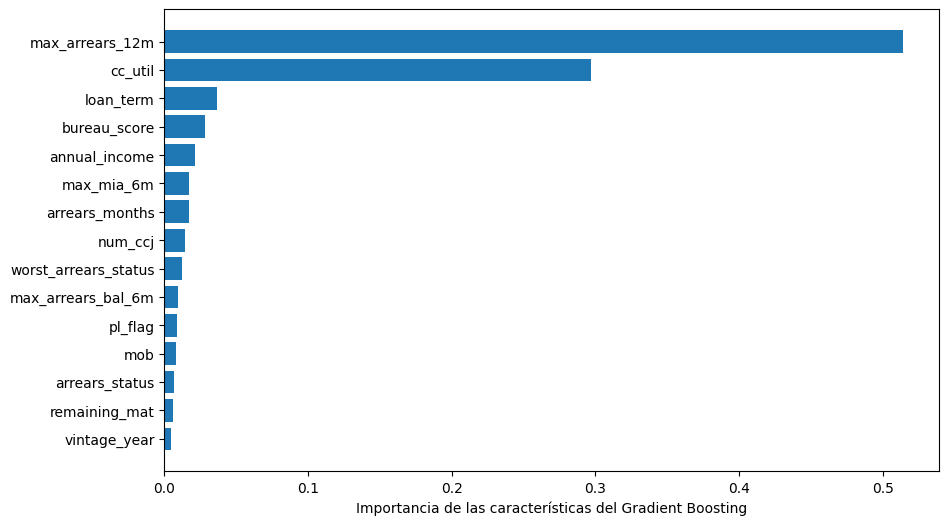

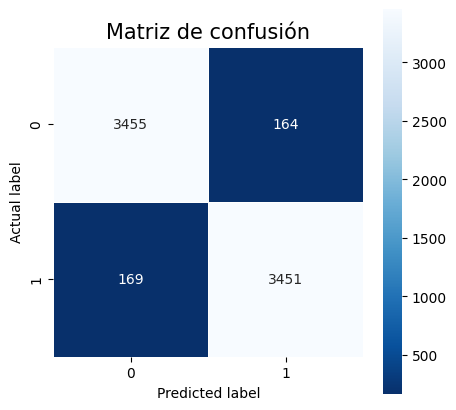

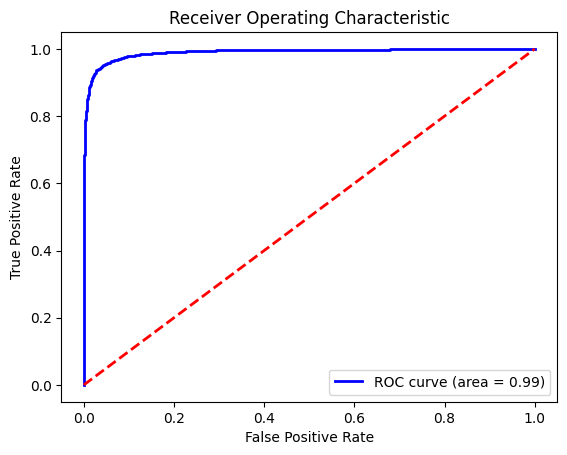

La predicción para la persona con ID 8789301 en df_aux_gb es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define las 15 mejores características
best_features_gb = [
    'cc_util', 'max_arrears_12m','loan_term','bureau_score','annual_income','max_mia_6m','arrears_months',
    'num_ccj','worst_arrears_status','pl_flag','max_arrears_bal_6m','arrears_status','remaining_mat','vintage_year',
    'mob'

]

# Crea un dataframe auxiliar solo con las mejores características y la columna 'default_indicator'
df_aux_gb = df_resampled[['id', 'default_indicator'] + best_features_gb].copy()

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train_gb, temp_gb = train_test_split(df_aux_gb, test_size=0.2, random_state=123, stratify=df_aux_gb['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test_gb, eval_gb = train_test_split(temp_gb, test_size=0.25, random_state=123, stratify=temp_gb['default_indicator'])

# Entrena el modelo de Gradient Boosting
gb_model = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=4, random_state=123)
gb_model.fit(train_gb.drop(columns=['id', 'default_indicator']), train_gb['default_indicator'])

# Realiza las predicciones
train_preds_gb = gb_model.predict(train_gb.drop(columns=['id', 'default_indicator']))
test_preds_gb = gb_model.predict(test_gb.drop(columns=['id', 'default_indicator']))

# Evalúa el rendimiento
train_acc_gb = accuracy_score(train_gb['default_indicator'], train_preds_gb)
test_acc_gb = accuracy_score(test_gb['default_indicator'], test_preds_gb)
train_precision_gb = precision_score(train_gb['default_indicator'], train_preds_gb)
test_precision_gb = precision_score(test_gb['default_indicator'], test_preds_gb)
train_recall_gb = recall_score(train_gb['default_indicator'], train_preds_gb)
test_recall_gb = recall_score(test_gb['default_indicator'], test_preds_gb)
train_f1_gb = f1_score(train_gb['default_indicator'], train_preds_gb)
test_f1_gb = f1_score(test_gb['default_indicator'], test_preds_gb)

print(f'Precisión del entrenamiento: {train_acc_gb*100:.2f}%')
print(f'Precisión de la prueba: {test_acc_gb*100:.2f}%')
print(f'Precisión del entrenamiento: {train_precision_gb*100:.2f}%')
print(f'Precisión de la prueba: {test_precision_gb*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall_gb*100:.2f}%')
print(f'Recall de la prueba: {test_recall_gb*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1_gb*100:.2f}%')
print(f'F1 score de la prueba: {test_f1_gb*100:.2f}%')

# Realiza la validación cruzada
cv_scores_gb = cross_val_score(gb_model, train_gb.drop(columns=['id', 'default_indicator']), train_gb['default_indicator'], cv=5)
print(f'CV scores: {cv_scores_gb}')
print(f'Mean CV score: {cv_scores_gb.mean()}')

# Calcula AUC-ROC
train_probs_gb = gb_model.predict_proba(train_gb.drop(columns=['id', 'default_indicator']))[:, 1]
test_probs_gb = gb_model.predict_proba(test_gb.drop(columns=['id', 'default_indicator']))[:, 1]
train_auc_gb = roc_auc_score(train_gb['default_indicator'], train_probs_gb)
test_auc_gb = roc_auc_score(test_gb['default_indicator'], test_probs_gb)
print(f'Train AUC: {train_auc_gb}')
print(f'Test AUC: {test_auc_gb}')

# Visualiza la importancia de las características
importances_gb = gb_model.feature_importances_
print(importances_gb)

plt.figure(figsize=(10, 6))
sorted_idx_gb = gb_model.feature_importances_.argsort()
plt.barh(train_gb.drop(columns=['id', 'default_indicator']).columns[sorted_idx_gb], gb_model.feature_importances_[sorted_idx_gb])
plt.xlabel("Importancia de las características del Gradient Boosting")
plt.show()

# Muestra la matriz de confusión
cm_gb = confusion_matrix(test_gb['default_indicator'], test_preds_gb)
plt.figure(figsize=(5, 5))
sns.heatmap(cm_gb, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Muestra la curva ROC
fpr_gb, tpr_gb, _ = roc_curve(test_gb['default_indicator'], test_probs_gb)
roc_auc_gb = auc(fpr_gb, tpr_gb)
plt.figure()
plt.plot(fpr_gb, tpr_gb, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_gb)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona en df_aux_gb
person_data_aux_gb = df_aux_gb[df_aux_gb['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data_gb = person_data_aux_gb[best_features_gb]

# Haz la predicción utilizando tu modelo de Gradient Boosting
prediction_gb = gb_model.predict(person_data_gb)

print(f'La predicción para la persona con ID {person_id} en df_aux_gb es: {prediction_gb[0]}')



#Modelo DNN con las 15 mejores caracteristicas sin smote y con smote

Modelo DNN con las 15 mejores caracteristicas sin smote

Precisión del entrenamiento: 96.63%
Precisión de la prueba: 96.28%
120/120 [==============================] - 1s 4ms/step
Precisión de prueba: 0.7101
Recall de prueba: 0.4900
F1-score de prueba: 0.5799
128/128 [==============================] - 0s 3ms/step
Mean CV Score: 0.9673
Mean Train AUC: 0.9690
Mean Test AUC: 0.9613


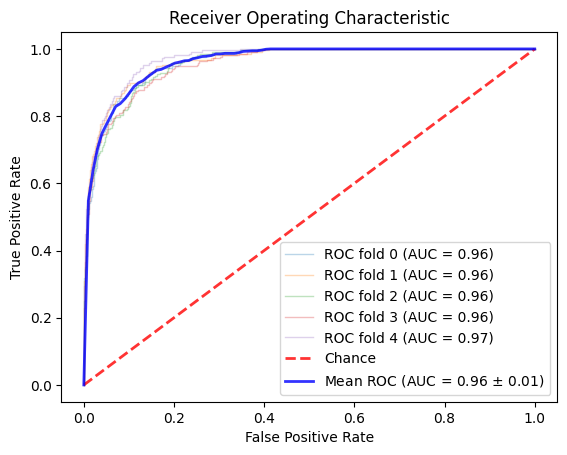

120/120 [==============================] - 0s 3ms/step


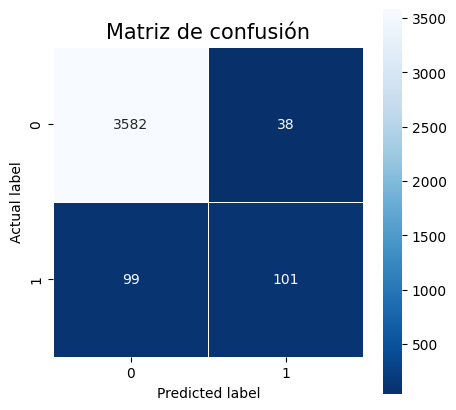

637/637 [==============================] - 1s 2ms/step


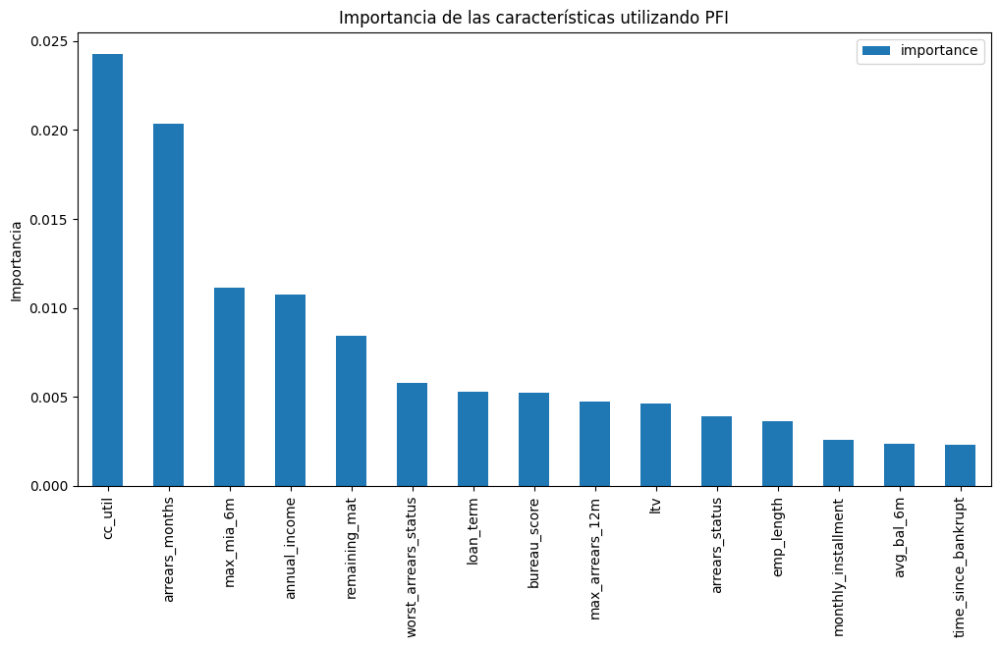

1/1 [==============================] - 0s 27ms/step
La predicción para la persona con ID 8789301 en df_aux_dnn es: 1


In [ ]:
# Importa las bibliotecas necesarias
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, auc, confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
from numpy import interp
import numpy as np
import pandas as pd

# Define una función para calcular la precisión del modelo
def score(X, y):
    y_pred = (model.predict(X) > 0.5).astype(int)
    return accuracy_score(y, y_pred)

class KerasModelWrapper:
    def __init__(self, model):
        self.model = model

    def fit(self, X, y):
        self.model.fit(X, y, epochs=10, batch_size=32, verbose=0)

    def predict(self, X):
        return (self.model.predict(X) > 0.5).astype(int)

    def score(self, X, y):
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)

# Define las características específicas para el modelo DNN
best_features_dnn = ['cc_util', 'arrears_months', 'remaining_mat', 'max_arrears_12m', 'avg_bal_6m',
                'annual_income', 'bureau_score', 'ltv', 'emp_length', 'loan_term',
                'worst_arrears_status', 'arrears_status', 'time_since_bankrupt', 'max_mia_6m',
                'monthly_installment']


# Crea un dataframe auxiliar solo con las mejores características y la columna 'default_indicator'
df_aux_dnn = df_cleaned[['id', 'default_indicator'] + best_features_dnn].copy()

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train_dnn, temp_dnn = train_test_split(df_aux_dnn, test_size=0.2, random_state=123, stratify=df_aux_dnn['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test_dnn, eval_dnn = train_test_split(temp_dnn, test_size=0.25, random_state=123, stratify=temp_dnn['default_indicator'])

# Normaliza los datos
scaler = StandardScaler()
train_scaled_dnn = scaler.fit_transform(train_dnn.drop(columns=['id', 'default_indicator']))
test_scaled_dnn = scaler.transform(test_dnn.drop(columns=['id', 'default_indicator']))

# Crea el modelo de DNN
model_dnn = tf.keras.models.Sequential([
    tf.keras.layers.Dense(32, activation='relu', input_shape=(train_scaled_dnn.shape[1],)),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compila el modelo
model_dnn.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Entrena el modelo
model_dnn.fit(train_scaled_dnn, train_dnn['default_indicator'], epochs=10, batch_size=32, verbose=0)


# Evalúa el rendimiento
train_acc_dnn = model_dnn.evaluate(train_scaled_dnn, train_dnn['default_indicator'], verbose=0)[1]
test_acc_dnn = model_dnn.evaluate(test_scaled_dnn, test_dnn['default_indicator'], verbose=0)[1]
print(f'Precisión del entrenamiento: {train_acc_dnn*100:.2f}%')
print(f'Precisión de la prueba: {test_acc_dnn*100:.2f}%')

# Evalúa el rendimiento con precision, recall y f1-score
y_pred_test_dnn = (model_dnn.predict(test_scaled_dnn) > 0.5).astype(int)
precision_dnn = precision_score(test_dnn['default_indicator'], y_pred_test_dnn)
recall_dnn = recall_score(test_dnn['default_indicator'], y_pred_test_dnn)
f1_dnn = f1_score(test_dnn['default_indicator'], y_pred_test_dnn)

print(f'Precisión de prueba: {precision_dnn:.4f}')
print(f'Recall de prueba: {recall_dnn:.4f}')
print(f'F1-score de prueba: {f1_dnn:.4f}')

# Realiza la validación cruzada y calcula el AUC-ROC
cv = StratifiedKFold(n_splits=5)
tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)
i = 0
cv_scores = []
train_aucs = []
test_aucs = []

for train_index, test_index in cv.split(train_scaled_dnn, train_dnn['default_indicator']):
    model_dnn.fit(train_scaled_dnn[train_index], train_dnn['default_indicator'].iloc[train_index], epochs=10, batch_size=32, verbose=0)

    # Train AUC
    train_prob = model_dnn.predict(train_scaled_dnn[train_index])
    fpr_train, tpr_train, _ = roc_curve(train_dnn['default_indicator'].iloc[train_index], train_prob)
    train_auc = auc(fpr_train, tpr_train)
    train_aucs.append(train_auc)

    # Test AUC
    test_prob = model_dnn.predict(train_scaled_dnn[test_index])
    fpr_test, tpr_test, _ = roc_curve(train_dnn['default_indicator'].iloc[test_index], test_prob)
    test_auc = auc(fpr_test, tpr_test)
    test_aucs.append(test_auc)

    # CV Score
    cv_score = model_dnn.evaluate(train_scaled_dnn[test_index], train_dnn['default_indicator'].iloc[test_index], verbose=0)[1]
    cv_scores.append(cv_score)

    # ROC curve
    fpr, tpr, thresholds = roc_curve(train_dnn['default_indicator'].iloc[test_index], test_prob)
    tprs.append(interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

# Mean CV Score
mean_cv_score = np.mean(cv_scores)
print(f'Mean CV Score: {mean_cv_score:.4f}')

# Mean Train AUC
mean_train_auc = np.mean(train_aucs)
print(f'Mean Train AUC: {mean_train_auc:.4f}')

# Mean Test AUC
mean_test_auc = np.mean(test_aucs)
print(f'Mean Test AUC: {mean_test_auc:.4f}')

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Muestra la matriz de confusión
cm_dnn = confusion_matrix(test_dnn['default_indicator'], (model_dnn.predict(test_scaled_dnn) > 0.5).astype(int))
plt.figure(figsize=(5, 5))
sns.heatmap(cm_dnn, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Envuelve tu modelo de TensorFlow en el envoltorio
wrapped_model_dnn = KerasModelWrapper(model_dnn)

# Calcula la importancia de las características
result_dnn = permutation_importance(wrapped_model_dnn, train_scaled_dnn, train_dnn['default_indicator'], n_repeats=10)

# Crea un DataFrame para visualizar los resultados
importance_df_dnn = pd.DataFrame(result_dnn.importances_mean, index=train_dnn.drop(columns=['id', 'default_indicator']).columns, columns=['importance'])
importance_df_dnn.sort_values(by='importance', ascending=False, inplace=True)

# Visualiza la importancia de las características
importance_df_dnn.plot(kind='bar', figsize=(12, 6))
plt.title('Importancia de las características utilizando PFI')
plt.ylabel('Importancia')
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona en df_aux_dnn
person_data_aux_dnn = df_aux_dnn[df_aux_dnn['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data_dnn = person_data_aux_dnn[best_features_dnn]

# Normaliza los datos de la persona
person_data_scaled_dnn = scaler.transform(person_data_dnn)

# Haz la predicción utilizando tu modelo de DNN
prediction_dnn = model_dnn.predict(person_data_scaled_dnn)

# Como la salida es una probabilidad, la convertimos a una clase binaria
prediction_class_dnn = (prediction_dnn > 0.5).astype(int)

print(f'La predicción para la persona con ID {person_id} en df_aux_dnn es: {prediction_class_dnn[0][0]}')


Modelo DNN con las 15 mejores caracteristicas con smote

Precisión del entrenamiento: 93.50%
Precisión de la prueba: 92.06%
227/227 [==============================] - 1s 3ms/step
Precisión de prueba: 0.9209
Recall de prueba: 0.9202
F1-score de prueba: 0.9205
242/242 [==============================] - 0s 2ms/step
Mean CV Score: 0.9376
Mean Train AUC: 0.9889
Mean Test AUC: 0.9872


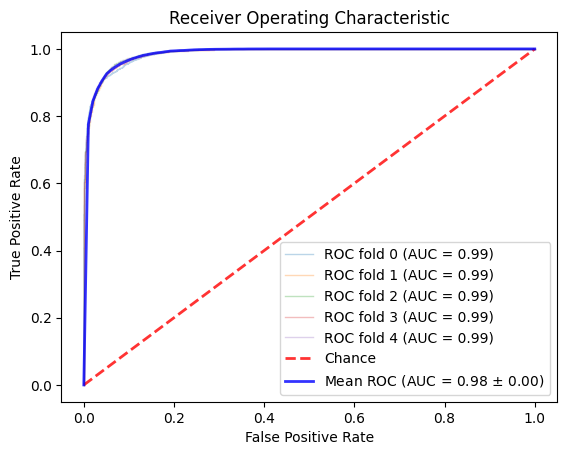

227/227 [==============================] - 0s 2ms/step


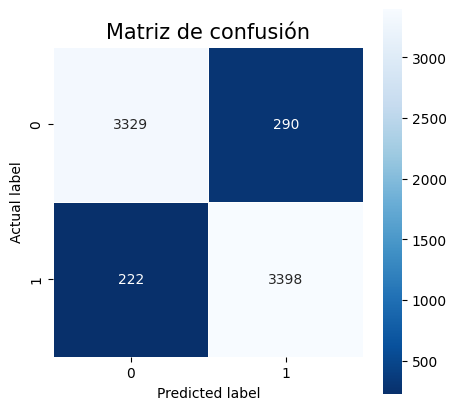

1207/1207 [==============================] - 2s 2ms/step


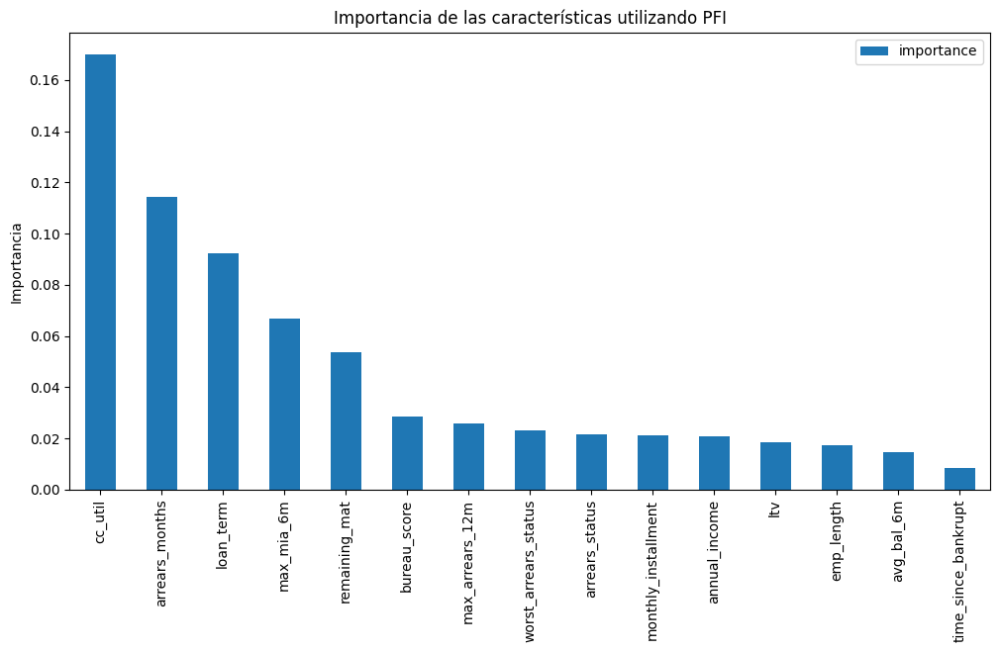

1/1 [==============================] - 0s 23ms/step
La predicción para la persona con ID 8789301 en df_aux_dnn es: 1


In [ ]:
# Importa las bibliotecas necesarias
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, auc, confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
from numpy import interp
import numpy as np
import pandas as pd

# Define una función para calcular la precisión del modelo
def score(X, y):
    y_pred = (model.predict(X) > 0.5).astype(int)
    return accuracy_score(y, y_pred)

class KerasModelWrapper:
    def __init__(self, model):
        self.model = model

    def fit(self, X, y):
        self.model.fit(X, y, epochs=10, batch_size=32, verbose=0)

    def predict(self, X):
        return (self.model.predict(X) > 0.5).astype(int)

    def score(self, X, y):
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)

# Define las características específicas para el modelo DNN
best_features_dnn = ['cc_util', 'arrears_months', 'remaining_mat', 'max_arrears_12m', 'avg_bal_6m',
                'annual_income', 'bureau_score', 'ltv', 'emp_length', 'loan_term',
                'worst_arrears_status', 'arrears_status', 'time_since_bankrupt', 'max_mia_6m',
                'monthly_installment']


# Crea un dataframe auxiliar solo con las mejores características y la columna 'default_indicator'
df_aux_dnn = df_resampled[['id', 'default_indicator'] + best_features_dnn].copy()

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train_dnn, temp_dnn = train_test_split(df_aux_dnn, test_size=0.2, random_state=123, stratify=df_aux_dnn['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test_dnn, eval_dnn = train_test_split(temp_dnn, test_size=0.25, random_state=123, stratify=temp_dnn['default_indicator'])

# Normaliza los datos
scaler = StandardScaler()
train_scaled_dnn = scaler.fit_transform(train_dnn.drop(columns=['id', 'default_indicator']))
test_scaled_dnn = scaler.transform(test_dnn.drop(columns=['id', 'default_indicator']))

# Crea el modelo de DNN
model_dnn = tf.keras.models.Sequential([
    tf.keras.layers.Dense(32, activation='relu', input_shape=(train_scaled_dnn.shape[1],)),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compila el modelo
model_dnn.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Entrena el modelo
model_dnn.fit(train_scaled_dnn, train_dnn['default_indicator'], epochs=10, batch_size=32, verbose=0)


# Evalúa el rendimiento
train_acc_dnn = model_dnn.evaluate(train_scaled_dnn, train_dnn['default_indicator'], verbose=0)[1]
test_acc_dnn = model_dnn.evaluate(test_scaled_dnn, test_dnn['default_indicator'], verbose=0)[1]
print(f'Precisión del entrenamiento: {train_acc_dnn*100:.2f}%')
print(f'Precisión de la prueba: {test_acc_dnn*100:.2f}%')

# Evalúa el rendimiento con precision, recall y f1-score
y_pred_test_dnn = (model_dnn.predict(test_scaled_dnn) > 0.5).astype(int)
precision_dnn = precision_score(test_dnn['default_indicator'], y_pred_test_dnn)
recall_dnn = recall_score(test_dnn['default_indicator'], y_pred_test_dnn)
f1_dnn = f1_score(test_dnn['default_indicator'], y_pred_test_dnn)

print(f'Precisión de prueba: {precision_dnn:.4f}')
print(f'Recall de prueba: {recall_dnn:.4f}')
print(f'F1-score de prueba: {f1_dnn:.4f}')

# Realiza la validación cruzada y calcula el AUC-ROC
cv = StratifiedKFold(n_splits=5)
tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)
i = 0
cv_scores = []
train_aucs = []
test_aucs = []

for train_index, test_index in cv.split(train_scaled_dnn, train_dnn['default_indicator']):
    model_dnn.fit(train_scaled_dnn[train_index], train_dnn['default_indicator'].iloc[train_index], epochs=10, batch_size=32, verbose=0)

    # Train AUC
    train_prob = model_dnn.predict(train_scaled_dnn[train_index])
    fpr_train, tpr_train, _ = roc_curve(train_dnn['default_indicator'].iloc[train_index], train_prob)
    train_auc = auc(fpr_train, tpr_train)
    train_aucs.append(train_auc)

    # Test AUC
    test_prob = model_dnn.predict(train_scaled_dnn[test_index])
    fpr_test, tpr_test, _ = roc_curve(train_dnn['default_indicator'].iloc[test_index], test_prob)
    test_auc = auc(fpr_test, tpr_test)
    test_aucs.append(test_auc)

    # CV Score
    cv_score = model_dnn.evaluate(train_scaled_dnn[test_index], train_dnn['default_indicator'].iloc[test_index], verbose=0)[1]
    cv_scores.append(cv_score)

    # ROC curve
    fpr, tpr, thresholds = roc_curve(train_dnn['default_indicator'].iloc[test_index], test_prob)
    tprs.append(interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

# Mean CV Score
mean_cv_score = np.mean(cv_scores)
print(f'Mean CV Score: {mean_cv_score:.4f}')

# Mean Train AUC
mean_train_auc = np.mean(train_aucs)
print(f'Mean Train AUC: {mean_train_auc:.4f}')

# Mean Test AUC
mean_test_auc = np.mean(test_aucs)
print(f'Mean Test AUC: {mean_test_auc:.4f}')

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Muestra la matriz de confusión
cm_dnn = confusion_matrix(test_dnn['default_indicator'], (model_dnn.predict(test_scaled_dnn) > 0.5).astype(int))
plt.figure(figsize=(5, 5))
sns.heatmap(cm_dnn, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Envuelve tu modelo de TensorFlow en el envoltorio
wrapped_model_dnn = KerasModelWrapper(model_dnn)

# Calcula la importancia de las características
result_dnn = permutation_importance(wrapped_model_dnn, train_scaled_dnn, train_dnn['default_indicator'], n_repeats=10)

# Crea un DataFrame para visualizar los resultados
importance_df_dnn = pd.DataFrame(result_dnn.importances_mean, index=train_dnn.drop(columns=['id', 'default_indicator']).columns, columns=['importance'])
importance_df_dnn.sort_values(by='importance', ascending=False, inplace=True)

# Visualiza la importancia de las características
importance_df_dnn.plot(kind='bar', figsize=(12, 6))
plt.title('Importancia de las características utilizando PFI')
plt.ylabel('Importancia')
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona en df_aux_dnn
person_data_aux_dnn = df_aux_dnn[df_aux_dnn['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data_dnn = person_data_aux_dnn[best_features_dnn]

# Normaliza los datos de la persona
person_data_scaled_dnn = scaler.transform(person_data_dnn)

# Haz la predicción utilizando tu modelo de DNN
prediction_dnn = model_dnn.predict(person_data_scaled_dnn)

# Como la salida es una probabilidad, la convertimos a una clase binaria
prediction_class_dnn = (prediction_dnn > 0.5).astype(int)

print(f'La predicción para la persona con ID {person_id} en df_aux_dnn es: {prediction_class_dnn[0][0]}')



#Modelo Regresion logistica con las 15 mejores caracteristicas sin smote y con smote

Modelo Regresion logistica con las 15 mejores caracteristicas sin smote

Precisión del entrenamiento: 96.03%
Precisión de la prueba: 96.02%
Mean CV Score: 0.9601
Train AUC: 0.9368
Test AUC: 0.9316
Precision: 0.7353
Recall: 0.3750
F1-score: 0.4967


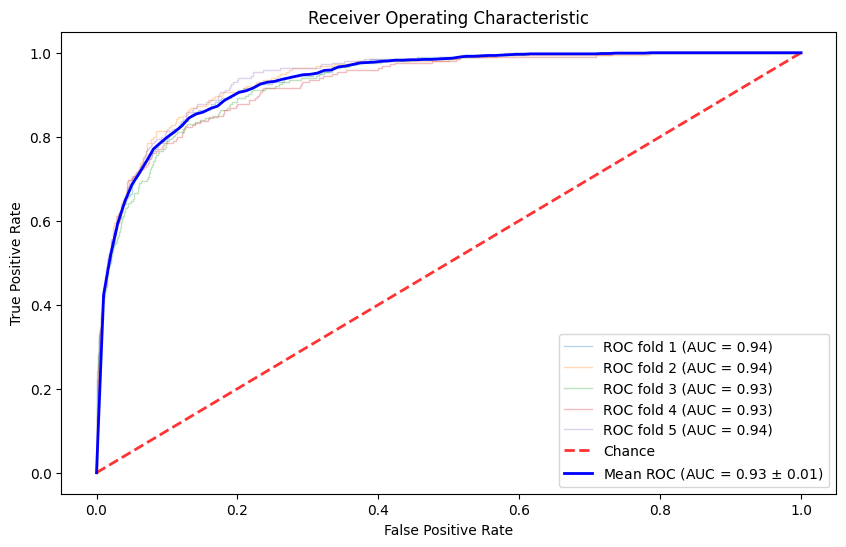

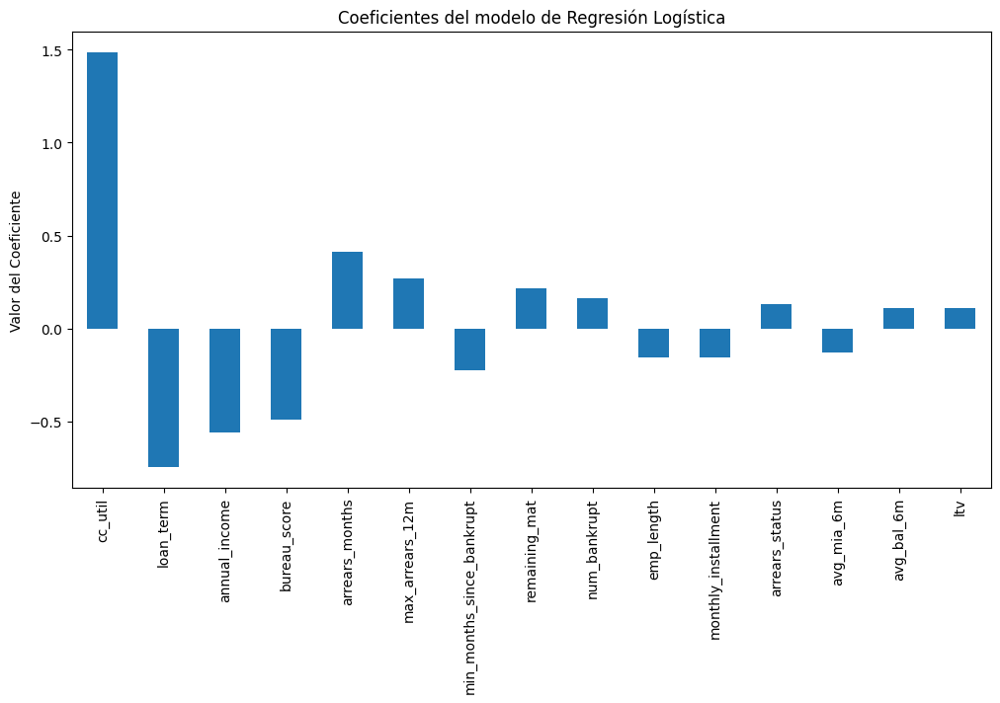

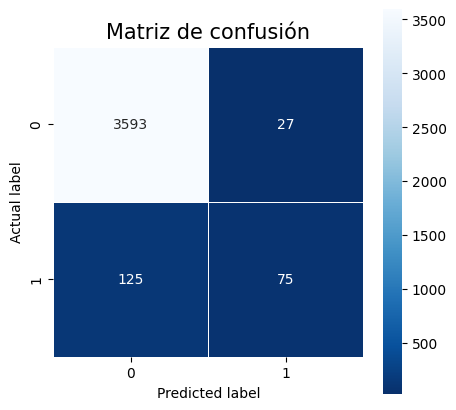

La predicción para la persona con ID 8789301 en df_aux_lr es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold

# Define las mejores características
best_features_lr = [
    'cc_util', 'arrears_months', 'remaining_mat', 'max_arrears_12m', 'avg_bal_6m',
    'annual_income', 'bureau_score', 'ltv', 'emp_length', 'loan_term',
    'arrears_status', 'monthly_installment', 'min_months_since_bankrupt',
    'num_bankrupt', 'avg_mia_6m'
]

# Crea un dataframe auxiliar solo con las mejores características y la columna 'default_indicator'
df_aux_lr = df_cleaned[['id', 'default_indicator'] + best_features_lr].copy()

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train_lr, temp_lr = train_test_split(df_aux_lr, test_size=0.2, random_state=123, stratify=df_aux_lr['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test_lr, eval_lr = train_test_split(temp_lr, test_size=0.25, random_state=123, stratify=temp_lr['default_indicator'])

# Normaliza los datos
scaler_lr = StandardScaler()
train_scaled_lr = scaler_lr.fit_transform(train_lr.drop(columns=['id', 'default_indicator']))
test_scaled_lr = scaler_lr.transform(test_lr.drop(columns=['id', 'default_indicator']))

# Inicializa el modelo de Regresión Logística
lr_model = LogisticRegression(max_iter=1000, random_state=123)

# Entrena el modelo
lr_model.fit(train_scaled_lr, train_lr['default_indicator'])

# Realiza las predicciones
train_preds_lr = lr_model.predict(train_scaled_lr)
test_preds_lr = lr_model.predict(test_scaled_lr)

# Evalúa el rendimiento
train_acc_lr = accuracy_score(train_lr['default_indicator'], train_preds_lr)
test_acc_lr = accuracy_score(test_lr['default_indicator'], test_preds_lr)
print(f'Precisión del entrenamiento: {train_acc_lr*100:.2f}%')
print(f'Precisión de la prueba: {test_acc_lr*100:.2f}%')

# Realiza la validación cruzada y calcula el AUC-ROC
cv_lr = StratifiedKFold(n_splits=5)
cv_scores_lr = cross_val_score(lr_model, train_scaled_lr, train_lr['default_indicator'], cv=cv_lr, scoring='accuracy')
mean_cv_score_lr = np.mean(cv_scores_lr)
print(f'Mean CV Score: {mean_cv_score_lr:.4f}')

# Calcula el AUC-ROC para los datos de entrenamiento
train_probs_lr = lr_model.predict_proba(train_scaled_lr)[:, 1]
train_auc_lr = roc_auc_score(train_lr['default_indicator'], train_probs_lr)
print(f'Train AUC: {train_auc_lr:.4f}')

# Calcula el AUC-ROC para los datos de prueba
test_probs_lr = lr_model.predict_proba(test_scaled_lr)[:, 1]
test_auc_lr = roc_auc_score(test_lr['default_indicator'], test_probs_lr)
print(f'Test AUC: {test_auc_lr:.4f}')

# Calcula precision, recall y f1-score para los datos de prueba
precision_lr = precision_score(test_lr['default_indicator'], test_preds_lr)
recall_lr = recall_score(test_lr['default_indicator'], test_preds_lr)
f1_lr = f1_score(test_lr['default_indicator'], test_preds_lr)
print(f'Precision: {precision_lr:.4f}')
print(f'Recall: {recall_lr:.4f}')
print(f'F1-score: {f1_lr:.4f}')

# Realiza la curva ROC para visualizar el AUC-ROC promedio
tprs_lr = []
aucs_lr = []
mean_fpr_lr = np.linspace(0, 1, 100)
plt.figure(figsize=(10, 6))
for i, (train_idx, test_idx) in enumerate(cv_lr.split(train_scaled_lr, train_lr['default_indicator'])):
    probas_lr = lr_model.fit(train_scaled_lr[train_idx], train_lr['default_indicator'].iloc[train_idx]).predict_proba(train_scaled_lr[test_idx])
    fpr_lr, tpr_lr, thresholds_lr = roc_curve(train_lr['default_indicator'].iloc[test_idx], probas_lr[:, 1])
    tprs_lr.append(np.interp(mean_fpr_lr, fpr_lr, tpr_lr))
    tprs_lr[-1][0] = 0.0
    roc_auc_lr = auc(fpr_lr, tpr_lr)
    aucs_lr.append(roc_auc_lr)
    plt.plot(fpr_lr, tpr_lr, lw=1, alpha=0.3, label=f'ROC fold {i+1} (AUC = {roc_auc_lr:.2f})')

# Línea de "Chance"
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)

mean_tpr_lr = np.mean(tprs_lr, axis=0)
mean_tpr_lr[-1] = 1.0
mean_auc_lr = auc(mean_fpr_lr, mean_tpr_lr)
std_auc_lr = np.std(aucs_lr)
plt.plot(mean_fpr_lr, mean_tpr_lr, color='b', label=f'Mean ROC (AUC = {mean_auc_lr:.2f} $\pm$ {std_auc_lr:.2f})', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

# Obtiene los coeficientes del modelo
coefficients_lr = lr_model.coef_[0]

# Crea un DataFrame para visualizar los resultados
coefficients_df_lr = pd.DataFrame(coefficients_lr, index=train_lr.drop(columns=['id', 'default_indicator']).columns, columns=['Coefficient'])

# Ordena los coeficientes por su valor absoluto
coefficients_df_lr['abs'] = coefficients_df_lr['Coefficient'].abs()
sorted_df_lr = coefficients_df_lr.sort_values('abs', ascending=False).drop('abs', axis=1)

# Visualiza los coeficientes
plt.figure(figsize=(12, 6))
sorted_df_lr['Coefficient'].plot(kind='bar')
plt.title('Coeficientes del modelo de Regresión Logística')
plt.ylabel('Valor del Coeficiente')
plt.show()

# Muestra la matriz de confusión
cm_lr = confusion_matrix(test_lr['default_indicator'], test_preds_lr)
plt.figure(figsize=(5,5))
sns.heatmap(cm_lr, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id_lr = 8789301

# Localiza la fila de datos para esa persona en df_aux_lr
person_data_aux_lr = df_aux_lr[df_aux_lr['id'] == person_id_lr]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data_lr = person_data_aux_lr[best_features_lr]

# Normaliza los datos de la persona
person_data_scaled_lr = scaler_lr.transform(person_data_lr)

# Haz la predicción utilizando tu modelo de Regresión Logística
prediction_lr = lr_model.predict(person_data_scaled_lr)

print(f'La predicción para la persona con ID {person_id_lr} en df_aux_lr es: {prediction_lr[0]}')




Modelo Regresion logistica con las 15 mejores caracteristicas con smote

Precisión del entrenamiento: 89.66%
Precisión de la prueba: 88.76%
Mean CV Score: 0.8964
Train AUC: 0.9635
Test AUC: 0.9577
Precision: 0.8897
Recall: 0.8848
F1-score: 0.8873


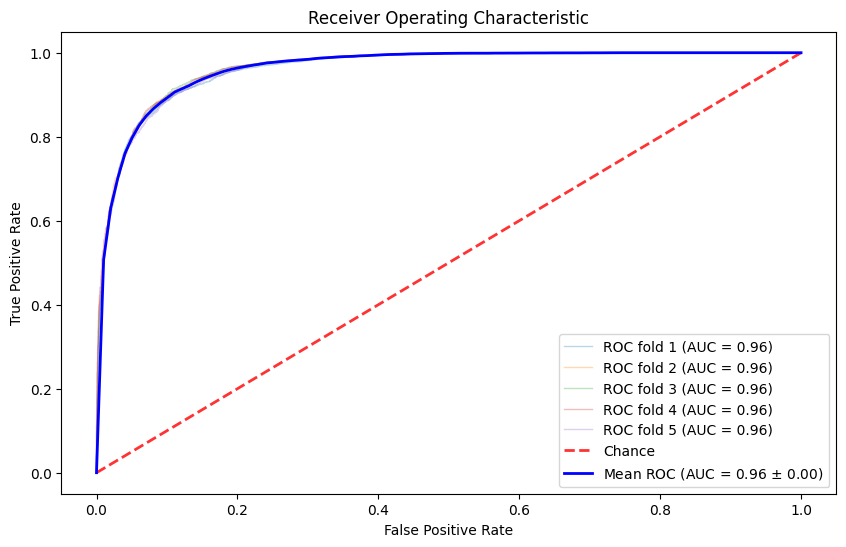

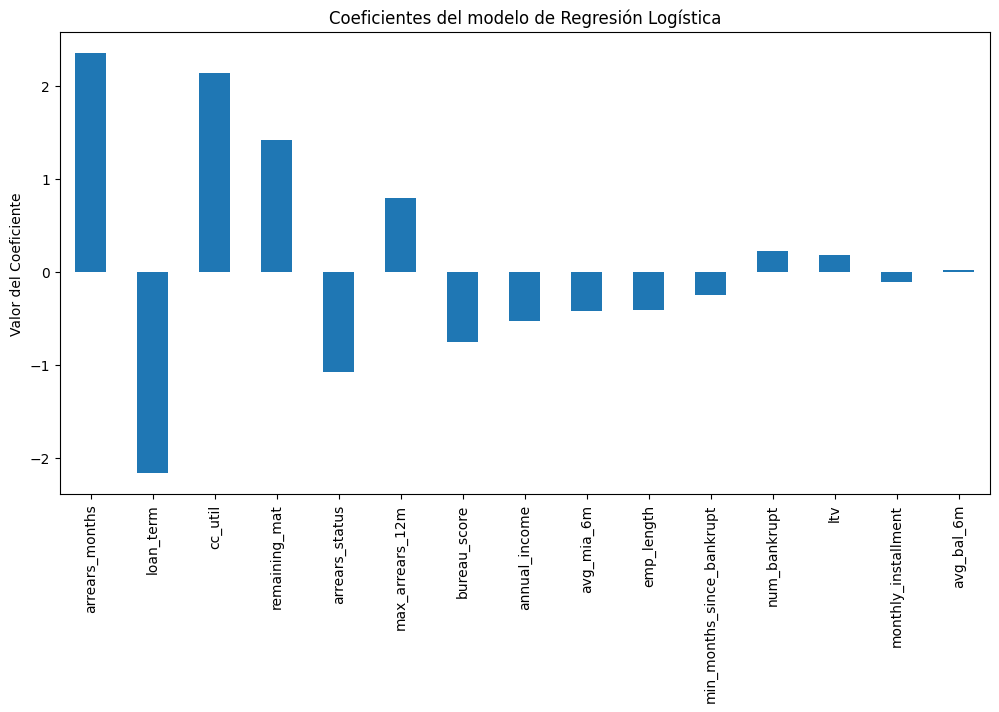

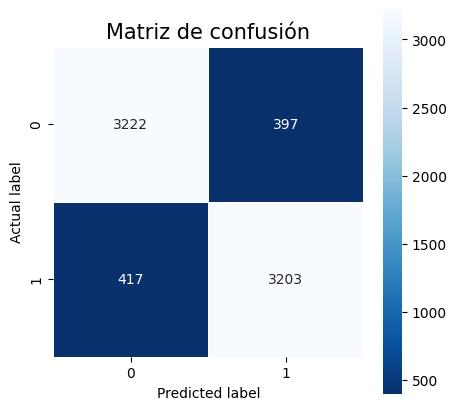

La predicción para la persona con ID 8789301 en df_aux_lr es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold

# Define las mejores características
best_features_lr = [
    'cc_util', 'arrears_months', 'remaining_mat', 'max_arrears_12m', 'avg_bal_6m',
    'annual_income', 'bureau_score', 'ltv', 'emp_length', 'loan_term',
    'arrears_status', 'monthly_installment', 'min_months_since_bankrupt',
    'num_bankrupt', 'avg_mia_6m'
]

# Crea un dataframe auxiliar solo con las mejores características y la columna 'default_indicator'
df_aux_lr = df_resampled[['id', 'default_indicator'] + best_features_lr].copy()

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train_lr, temp_lr = train_test_split(df_aux_lr, test_size=0.2, random_state=123, stratify=df_aux_lr['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test_lr, eval_lr = train_test_split(temp_lr, test_size=0.25, random_state=123, stratify=temp_lr['default_indicator'])

# Normaliza los datos
scaler_lr = StandardScaler()
train_scaled_lr = scaler_lr.fit_transform(train_lr.drop(columns=['id', 'default_indicator']))
test_scaled_lr = scaler_lr.transform(test_lr.drop(columns=['id', 'default_indicator']))

# Inicializa el modelo de Regresión Logística
lr_model = LogisticRegression(max_iter=1000, random_state=123)

# Entrena el modelo
lr_model.fit(train_scaled_lr, train_lr['default_indicator'])

# Realiza las predicciones
train_preds_lr = lr_model.predict(train_scaled_lr)
test_preds_lr = lr_model.predict(test_scaled_lr)

# Evalúa el rendimiento
train_acc_lr = accuracy_score(train_lr['default_indicator'], train_preds_lr)
test_acc_lr = accuracy_score(test_lr['default_indicator'], test_preds_lr)
print(f'Precisión del entrenamiento: {train_acc_lr*100:.2f}%')
print(f'Precisión de la prueba: {test_acc_lr*100:.2f}%')

# Realiza la validación cruzada y calcula el AUC-ROC
cv_lr = StratifiedKFold(n_splits=5)
cv_scores_lr = cross_val_score(lr_model, train_scaled_lr, train_lr['default_indicator'], cv=cv_lr, scoring='accuracy')
mean_cv_score_lr = np.mean(cv_scores_lr)
print(f'Mean CV Score: {mean_cv_score_lr:.4f}')

# Calcula el AUC-ROC para los datos de entrenamiento
train_probs_lr = lr_model.predict_proba(train_scaled_lr)[:, 1]
train_auc_lr = roc_auc_score(train_lr['default_indicator'], train_probs_lr)
print(f'Train AUC: {train_auc_lr:.4f}')

# Calcula el AUC-ROC para los datos de prueba
test_probs_lr = lr_model.predict_proba(test_scaled_lr)[:, 1]
test_auc_lr = roc_auc_score(test_lr['default_indicator'], test_probs_lr)
print(f'Test AUC: {test_auc_lr:.4f}')

# Calcula precision, recall y f1-score para los datos de prueba
precision_lr = precision_score(test_lr['default_indicator'], test_preds_lr)
recall_lr = recall_score(test_lr['default_indicator'], test_preds_lr)
f1_lr = f1_score(test_lr['default_indicator'], test_preds_lr)
print(f'Precision: {precision_lr:.4f}')
print(f'Recall: {recall_lr:.4f}')
print(f'F1-score: {f1_lr:.4f}')

# Realiza la curva ROC para visualizar el AUC-ROC promedio
tprs_lr = []
aucs_lr = []
mean_fpr_lr = np.linspace(0, 1, 100)
plt.figure(figsize=(10, 6))
for i, (train_idx, test_idx) in enumerate(cv_lr.split(train_scaled_lr, train_lr['default_indicator'])):
    probas_lr = lr_model.fit(train_scaled_lr[train_idx], train_lr['default_indicator'].iloc[train_idx]).predict_proba(train_scaled_lr[test_idx])
    fpr_lr, tpr_lr, thresholds_lr = roc_curve(train_lr['default_indicator'].iloc[test_idx], probas_lr[:, 1])
    tprs_lr.append(np.interp(mean_fpr_lr, fpr_lr, tpr_lr))
    tprs_lr[-1][0] = 0.0
    roc_auc_lr = auc(fpr_lr, tpr_lr)
    aucs_lr.append(roc_auc_lr)
    plt.plot(fpr_lr, tpr_lr, lw=1, alpha=0.3, label=f'ROC fold {i+1} (AUC = {roc_auc_lr:.2f})')

# Línea de "Chance"
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)

mean_tpr_lr = np.mean(tprs_lr, axis=0)
mean_tpr_lr[-1] = 1.0
mean_auc_lr = auc(mean_fpr_lr, mean_tpr_lr)
std_auc_lr = np.std(aucs_lr)
plt.plot(mean_fpr_lr, mean_tpr_lr, color='b', label=f'Mean ROC (AUC = {mean_auc_lr:.2f} $\pm$ {std_auc_lr:.2f})', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

# Obtiene los coeficientes del modelo
coefficients_lr = lr_model.coef_[0]

# Crea un DataFrame para visualizar los resultados
coefficients_df_lr = pd.DataFrame(coefficients_lr, index=train_lr.drop(columns=['id', 'default_indicator']).columns, columns=['Coefficient'])

# Ordena los coeficientes por su valor absoluto
coefficients_df_lr['abs'] = coefficients_df_lr['Coefficient'].abs()
sorted_df_lr = coefficients_df_lr.sort_values('abs', ascending=False).drop('abs', axis=1)

# Visualiza los coeficientes
plt.figure(figsize=(12, 6))
sorted_df_lr['Coefficient'].plot(kind='bar')
plt.title('Coeficientes del modelo de Regresión Logística')
plt.ylabel('Valor del Coeficiente')
plt.show()

# Muestra la matriz de confusión
cm_lr = confusion_matrix(test_lr['default_indicator'], test_preds_lr)
plt.figure(figsize=(5,5))
sns.heatmap(cm_lr, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id_lr = 8789301

# Localiza la fila de datos para esa persona en df_aux_lr
person_data_aux_lr = df_aux_lr[df_aux_lr['id'] == person_id_lr]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data_lr = person_data_aux_lr[best_features_lr]

# Normaliza los datos de la persona
person_data_scaled_lr = scaler_lr.transform(person_data_lr)

# Haz la predicción utilizando tu modelo de Regresión Logística
prediction_lr = lr_model.predict(person_data_scaled_lr)

print(f'La predicción para la persona con ID {person_id_lr} en df_aux_lr es: {prediction_lr[0]}')


#Modelo Suport vector machine con las 15 mejores caracteristicas sin smote y con smote


Modelo Suport vector machine con las 15 mejores caracteristicas sin smote

Precisión del entrenamiento: 95.82%
Precisión de la prueba: 95.79%
Precision: 0.7826
Recall: 0.2700
F1-score: 0.4015


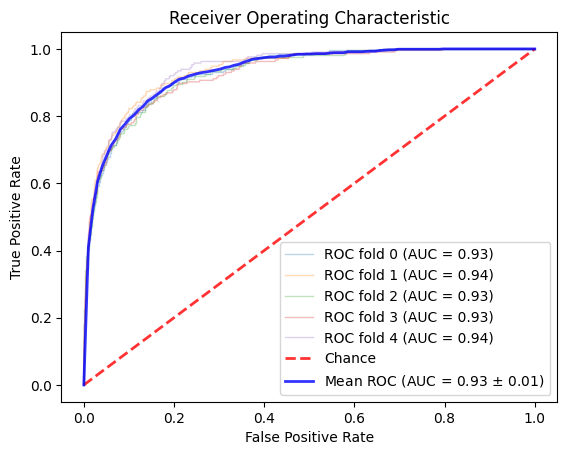

Mean CV Score: 0.9580
CV Scores: [0.95754601 0.95779141 0.95974472 0.95679921 0.95802651]
AUC-ROC del entrenamiento: 0.9326
AUC-ROC de la prueba: 0.9286


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


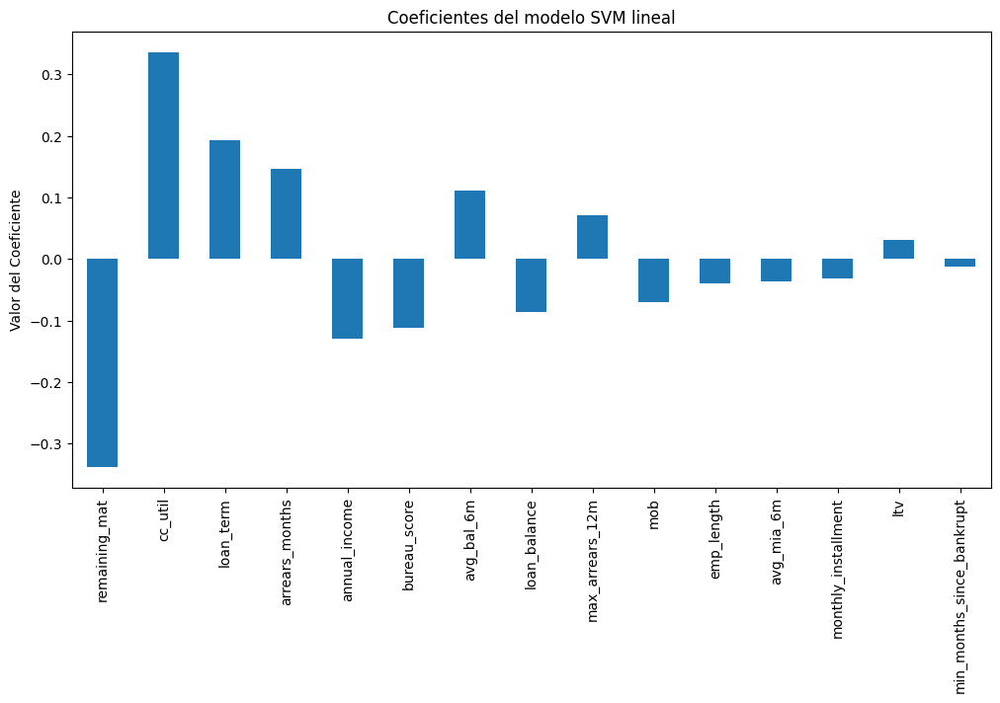

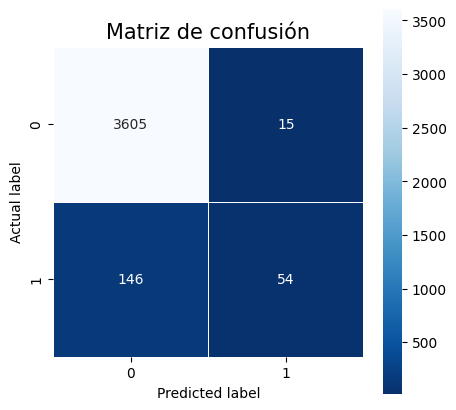

La predicción para la persona con ID 8789301 en df_aux_svm es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.svm import SVC, LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Define las 15 mejores características para SVM
best_features_svm = [
    'cc_util', 'arrears_months', 'remaining_mat', 'max_arrears_12m', 'avg_bal_6m',
    'annual_income', 'bureau_score', 'ltv', 'emp_length', 'loan_term',
    'monthly_installment', 'avg_mia_6m', 'mob', 'loan_balance', 'min_months_since_bankrupt'
]

# Crea un dataframe auxiliar solo con las mejores características y la columna 'default_indicator'
df_aux_svm = df_cleaned[['id', 'default_indicator'] + best_features_svm].copy()

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train_svm, temp_svm = train_test_split(df_aux_svm, test_size=0.2, random_state=123, stratify=df_aux_svm['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test_svm, eval_svm = train_test_split(temp_svm, test_size=0.25, random_state=123, stratify=temp_svm['default_indicator'])

# Normaliza los datos
scaler_svm = StandardScaler()
train_scaled_svm = scaler_svm.fit_transform(train_svm.drop(columns=['id', 'default_indicator']))
test_scaled_svm = scaler_svm.transform(test_svm.drop(columns=['id', 'default_indicator']))

# Inicializa el modelo de SVM
svm_model = SVC(kernel='linear', probability=True, random_state=123)

# Entrena el modelo
svm_model.fit(train_scaled_svm, train_svm['default_indicator'])

# Realiza las predicciones
train_preds_svm = svm_model.predict(train_scaled_svm)
test_preds_svm = svm_model.predict(test_scaled_svm)

# Evalúa el rendimiento
train_acc_svm = accuracy_score(train_svm['default_indicator'], train_preds_svm)
test_acc_svm = accuracy_score(test_svm['default_indicator'], test_preds_svm)
print(f'Precisión del entrenamiento: {train_acc_svm*100:.2f}%')
print(f'Precisión de la prueba: {test_acc_svm*100:.2f}%')

# Calcula precision, recall y f1-score para los datos de prueba
precision_svm = precision_score(test_svm['default_indicator'], test_preds_svm)
recall_svm = recall_score(test_svm['default_indicator'], test_preds_svm)
f1_svm = f1_score(test_svm['default_indicator'], test_preds_svm)
print(f'Precision: {precision_svm:.4f}')
print(f'Recall: {recall_svm:.4f}')
print(f'F1-score: {f1_svm:.4f}')

# Realiza la validación cruzada y calcula el AUC-ROC
cv_svm = StratifiedKFold(n_splits=5)
tprs_svm = []
aucs_svm = []
mean_fpr_svm = np.linspace(0, 1, 100)
i = 0

# Entrena el modelo una sola vez fuera del bucle
svm_model = SVC(kernel='linear', probability=True, random_state=123)
svm_model.fit(train_scaled_svm, train_svm['default_indicator'])

for train_idx, test_idx in cv_svm.split(train_scaled_svm, train_svm['default_indicator']):
    probas_svm = svm_model.predict_proba(train_scaled_svm[test_idx])
    # Compute ROC curve and area under the curve
    fpr_svm, tpr_svm, thresholds_svm = roc_curve(train_svm['default_indicator'].iloc[test_idx], probas_svm[:, 1])
    tprs_svm.append(np.interp(mean_fpr_svm, fpr_svm, tpr_svm))
    tprs_svm[-1][0] = 0.0
    roc_auc_svm = auc(fpr_svm, tpr_svm)
    aucs_svm.append(roc_auc_svm)
    plt.plot(fpr_svm, tpr_svm, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc_svm))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr_svm = np.mean(tprs_svm, axis=0)
mean_tpr_svm[-1] = 1.0
mean_auc_svm = auc(mean_fpr_svm, mean_tpr_svm)
std_auc_svm = np.std(aucs_svm)
plt.plot(mean_fpr_svm, mean_tpr_svm, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc_svm, std_auc_svm), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Calcula Mean CV Score y CV Score
mean_cv_score_svm = np.mean(cross_val_score(svm_model, train_scaled_svm, train_svm['default_indicator'], cv=cv_svm))
cv_score_svm = cross_val_score(svm_model, train_scaled_svm, train_svm['default_indicator'], cv=cv_svm)
print(f'Mean CV Score: {mean_cv_score_svm:.4f}')
print(f'CV Scores: {cv_score_svm}')

# Calcula AUC-ROC para el conjunto de entrenamiento y prueba
train_probs_svm = svm_model.predict_proba(train_scaled_svm)[:, 1]
train_auc_svm = roc_auc_score(train_svm['default_indicator'], train_probs_svm)
print(f'AUC-ROC del entrenamiento: {train_auc_svm:.4f}')

test_probs_svm = svm_model.predict_proba(test_scaled_svm)[:, 1]
test_auc_svm = roc_auc_score(test_svm['default_indicator'], test_probs_svm)
print(f'AUC-ROC de la prueba: {test_auc_svm:.4f}')


# Obtiene los coeficientes del modelo
linear_svm_model = LinearSVC(random_state=123)
linear_svm_model.fit(train_scaled_svm, train_svm['default_indicator'])
coefficients_svm = linear_svm_model.coef_[0]

# Crea un DataFrame para visualizar los resultados
coefficients_df_svm = pd.DataFrame(coefficients_svm, index=train_svm.drop(columns=['id', 'default_indicator']).columns, columns=['Coefficient'])

# Ordena los coeficientes por su valor absoluto
coefficients_df_svm['abs'] = coefficients_df_svm['Coefficient'].abs()
sorted_df_svm = coefficients_df_svm.sort_values('abs', ascending=False).drop('abs', axis=1)

# Visualiza los coeficientes
plt.figure(figsize=(12, 6))
sorted_df_svm['Coefficient'].plot(kind='bar')
plt.title('Coeficientes del modelo SVM lineal')
plt.ylabel('Valor del Coeficiente')
plt.show()

# Muestra la matriz de confusión
cm_svm = confusion_matrix(test_svm['default_indicator'], test_preds_svm)
plt.figure(figsize=(5, 5))
sns.heatmap(cm_svm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id_svm = 8789301

# Localiza la fila de datos para esa persona en df_aux_svm
person_data_aux_svm = df_aux_svm[df_aux_svm['id'] == person_id_svm]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data_svm = person_data_aux_svm[best_features_svm]

# Normaliza los datos de la persona
person_data_scaled_svm = scaler_svm.transform(person_data_svm)

# Haz la predicción utilizando tu modelo de SVM
prediction_svm = svm_model.predict(person_data_scaled_svm)

print(f'La predicción para la persona con ID {person_id_svm} en df_aux_svm es: {prediction_svm[0]}')



Modelo Suport vector machine con las 15 mejores caracteristicas con smote

Precisión del entrenamiento: 94.07%
Precisión de la prueba: 93.65%
Precision: 0.9436
Recall: 0.9285
F1-score: 0.9360


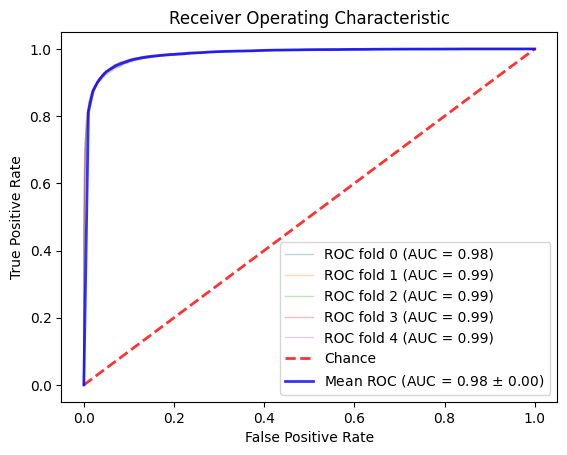

Mean CV Score: 0.9397
CV Scores: [0.93978244 0.94159544 0.94120694 0.94132884 0.93472348]
AUC-ROC del entrenamiento: 0.9854
AUC-ROC de la prueba: 0.9840


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


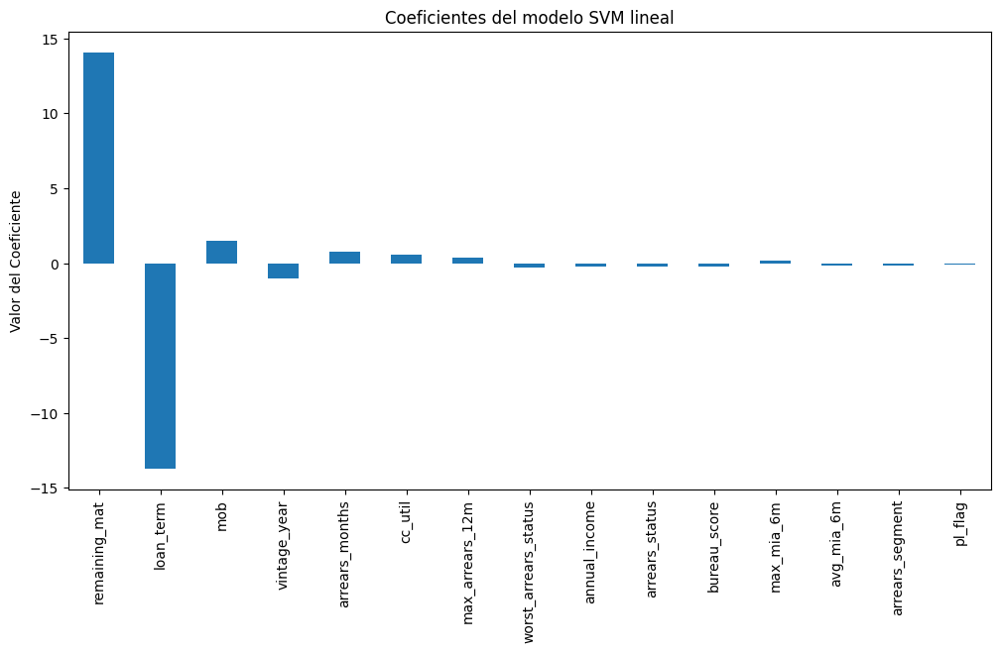

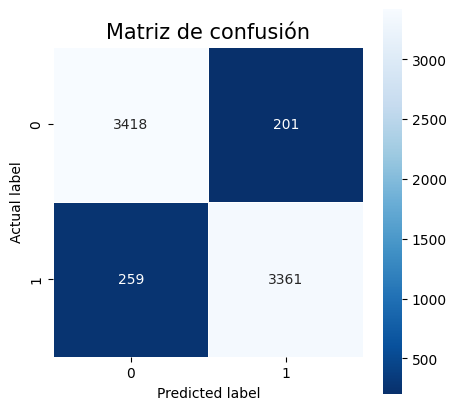

La predicción para la persona con ID 8789301 en df_aux_svm es: 1


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.svm import SVC, LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Define las 15 mejores características para SVM
best_features_svm = [
    'cc_util', 'remaining_mat','loan_term','mob','vintage_year','arrears_months','max_arrears_12m','worst_arrears_status',
    'arrears_status','max_mia_6m','avg_mia_6m','annual_income','bureau_score','arrears_segment','pl_flag'
]

# Crea un dataframe auxiliar solo con las mejores características y la columna 'default_indicator'
df_aux_svm = df_resampled[['id', 'default_indicator'] + best_features_svm].copy()

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train_svm, temp_svm = train_test_split(df_aux_svm, test_size=0.2, random_state=123, stratify=df_aux_svm['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test_svm, eval_svm = train_test_split(temp_svm, test_size=0.25, random_state=123, stratify=temp_svm['default_indicator'])

# Normaliza los datos
scaler_svm = StandardScaler()
train_scaled_svm = scaler_svm.fit_transform(train_svm.drop(columns=['id', 'default_indicator']))
test_scaled_svm = scaler_svm.transform(test_svm.drop(columns=['id', 'default_indicator']))

# Inicializa el modelo de SVM
svm_model = SVC(kernel='linear', probability=True, random_state=123)

# Entrena el modelo
svm_model.fit(train_scaled_svm, train_svm['default_indicator'])

# Realiza las predicciones
train_preds_svm = svm_model.predict(train_scaled_svm)
test_preds_svm = svm_model.predict(test_scaled_svm)

# Evalúa el rendimiento
train_acc_svm = accuracy_score(train_svm['default_indicator'], train_preds_svm)
test_acc_svm = accuracy_score(test_svm['default_indicator'], test_preds_svm)
print(f'Precisión del entrenamiento: {train_acc_svm*100:.2f}%')
print(f'Precisión de la prueba: {test_acc_svm*100:.2f}%')

# Calcula precision, recall y f1-score para los datos de prueba
precision_svm = precision_score(test_svm['default_indicator'], test_preds_svm)
recall_svm = recall_score(test_svm['default_indicator'], test_preds_svm)
f1_svm = f1_score(test_svm['default_indicator'], test_preds_svm)
print(f'Precision: {precision_svm:.4f}')
print(f'Recall: {recall_svm:.4f}')
print(f'F1-score: {f1_svm:.4f}')

# Realiza la validación cruzada y calcula el AUC-ROC
cv_svm = StratifiedKFold(n_splits=5)
tprs_svm = []
aucs_svm = []
mean_fpr_svm = np.linspace(0, 1, 100)
i = 0

# Entrena el modelo una sola vez fuera del bucle
svm_model = SVC(kernel='linear', probability=True, random_state=123)
svm_model.fit(train_scaled_svm, train_svm['default_indicator'])

for train_idx, test_idx in cv_svm.split(train_scaled_svm, train_svm['default_indicator']):
    probas_svm = svm_model.predict_proba(train_scaled_svm[test_idx])
    # Compute ROC curve and area under the curve
    fpr_svm, tpr_svm, thresholds_svm = roc_curve(train_svm['default_indicator'].iloc[test_idx], probas_svm[:, 1])
    tprs_svm.append(np.interp(mean_fpr_svm, fpr_svm, tpr_svm))
    tprs_svm[-1][0] = 0.0
    roc_auc_svm = auc(fpr_svm, tpr_svm)
    aucs_svm.append(roc_auc_svm)
    plt.plot(fpr_svm, tpr_svm, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc_svm))
    i += 1

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr_svm = np.mean(tprs_svm, axis=0)
mean_tpr_svm[-1] = 1.0
mean_auc_svm = auc(mean_fpr_svm, mean_tpr_svm)
std_auc_svm = np.std(aucs_svm)
plt.plot(mean_fpr_svm, mean_tpr_svm, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc_svm, std_auc_svm), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Calcula Mean CV Score y CV Score
mean_cv_score_svm = np.mean(cross_val_score(svm_model, train_scaled_svm, train_svm['default_indicator'], cv=cv_svm))
cv_score_svm = cross_val_score(svm_model, train_scaled_svm, train_svm['default_indicator'], cv=cv_svm)
print(f'Mean CV Score: {mean_cv_score_svm:.4f}')
print(f'CV Scores: {cv_score_svm}')

# Calcula AUC-ROC para el conjunto de entrenamiento y prueba
train_probs_svm = svm_model.predict_proba(train_scaled_svm)[:, 1]
train_auc_svm = roc_auc_score(train_svm['default_indicator'], train_probs_svm)
print(f'AUC-ROC del entrenamiento: {train_auc_svm:.4f}')

test_probs_svm = svm_model.predict_proba(test_scaled_svm)[:, 1]
test_auc_svm = roc_auc_score(test_svm['default_indicator'], test_probs_svm)
print(f'AUC-ROC de la prueba: {test_auc_svm:.4f}')


# Obtiene los coeficientes del modelo
linear_svm_model = LinearSVC(random_state=123)
linear_svm_model.fit(train_scaled_svm, train_svm['default_indicator'])
coefficients_svm = linear_svm_model.coef_[0]

# Crea un DataFrame para visualizar los resultados
coefficients_df_svm = pd.DataFrame(coefficients_svm, index=train_svm.drop(columns=['id', 'default_indicator']).columns, columns=['Coefficient'])

# Ordena los coeficientes por su valor absoluto
coefficients_df_svm['abs'] = coefficients_df_svm['Coefficient'].abs()
sorted_df_svm = coefficients_df_svm.sort_values('abs', ascending=False).drop('abs', axis=1)

# Visualiza los coeficientes
plt.figure(figsize=(12, 6))
sorted_df_svm['Coefficient'].plot(kind='bar')
plt.title('Coeficientes del modelo SVM lineal')
plt.ylabel('Valor del Coeficiente')
plt.show()

# Muestra la matriz de confusión
cm_svm = confusion_matrix(test_svm['default_indicator'], test_preds_svm)
plt.figure(figsize=(5, 5))
sns.heatmap(cm_svm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id_svm = 8789301

# Localiza la fila de datos para esa persona en df_aux_svm
person_data_aux_svm = df_aux_svm[df_aux_svm['id'] == person_id_svm]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data_svm = person_data_aux_svm[best_features_svm]

# Normaliza los datos de la persona
person_data_scaled_svm = scaler_svm.transform(person_data_svm)

# Haz la predicción utilizando tu modelo de SVM
prediction_svm = svm_model.predict(person_data_scaled_svm)

print(f'La predicción para la persona con ID {person_id_svm} en df_aux_svm es: {prediction_svm[0]}')


#Analisis y conclusion

En esta estrategia, se observa que los modelos que utilizan conjuntos de datos balanceados continúan mostrando disminuciones en sus métricas, lo que indica que al reducir el número de características del conjunto de datos, estos porcentajes tienden a disminuir. Esto se debe a que las características originales, antes de cualquier eliminación, aportan información valiosa que impacta positivamente en la precisión de los modelos.

Por otro lado, los modelos que operan con conjuntos de datos desbalanceados muestran una variedad de resultados, con algunos mejorando en la métrica F1 score mientras que otros siguen disminuyendo sus porcentajes. Sin embargo, era de esperarse que la eliminación de las características más influyentes, que estaban altamente correlacionadas en el dataframe desbalanceado, afectara negativamente las predicciones de los modelos.

Como última estrategia a implementar, se seleccionarán los tres mejores modelos de la estrategia número 1, que fue la más exitosa con conjuntos de datos balanceados. Esto tiene sentido para entrenar modelos que no se concentren exclusivamente en la clase mayoritaria. Además, se ajustarán sus hiperparámetros con el fin de potenciar aún más los porcentajes de métricas, que ya son bastante prometedores.

# Los 3 Modelos con smote con los mejores resultados, cambiando sus hiperparametros

#los 3 Mejores modelos entrenados cambiando sus hiperparametros

Modelo Random forest con los siguientes cambios:
* Modelo 1 : n_estimators=100, max_features=4, random_state=123
* Modelo 2 : n_estimators=200, max_features=4, random_state=123
* Modelo 3 : n_estimators=250, max_features=4, random_state=123 (Modelo mejorado)
* Modelo 4 : n_estimators=330, max_features=4, random_state=123
* Modelo 5 : n_estimators=500, max_features=4, random_state=123

Basado en las métricas disponibles, el Modelo 3 es el mejor:

Tiene los valores más altos de precisión y F1 score en el conjunto de prueba.
Tiene el mean CV score más alto.
Su AUC en el conjunto de prueba es muy alto, casi igual al del modelo 4 y superior al de los otros modelos.


Mejores parámetros: {'max_features': 4, 'n_estimators': 250, 'random_state': 123}
Exactitud del entrenamiento: 100.00%
Exactitud de la prueba: 98.76%
Precisión del entrenamiento: 100.00%
Precisión de la prueba: 98.78%
Recall del entrenamiento: 100.00%
Recall de la prueba: 98.73%
F1 score del entrenamiento: 100.00%
F1 score de la prueba: 98.76%
CV scores: [0.98588449 0.98873349 0.98640249 0.98730734 0.98575314]
Mean CV score: 0.9868161890827348
Train AUC: 1.0
Test AUC: 0.9992709976047227
[0.01249766 0.01032902 0.01064527 0.0107648  0.03032192 0.0067097
 0.00300112 0.02592982 0.01350881 0.01177688 0.00043384 0.00557449
 0.00026427 0.0131743  0.01159433 0.08951599 0.00894014 0.00153092
 0.01223435 0.02146809 0.02920093 0.         0.         0.09445553
 0.01223096 0.0115262  0.00827192 0.10786269 0.01923643 0.05771987
 0.05979578 0.01064774 0.02856295 0.1711868  0.02938559 0.01843731
 0.04126356]


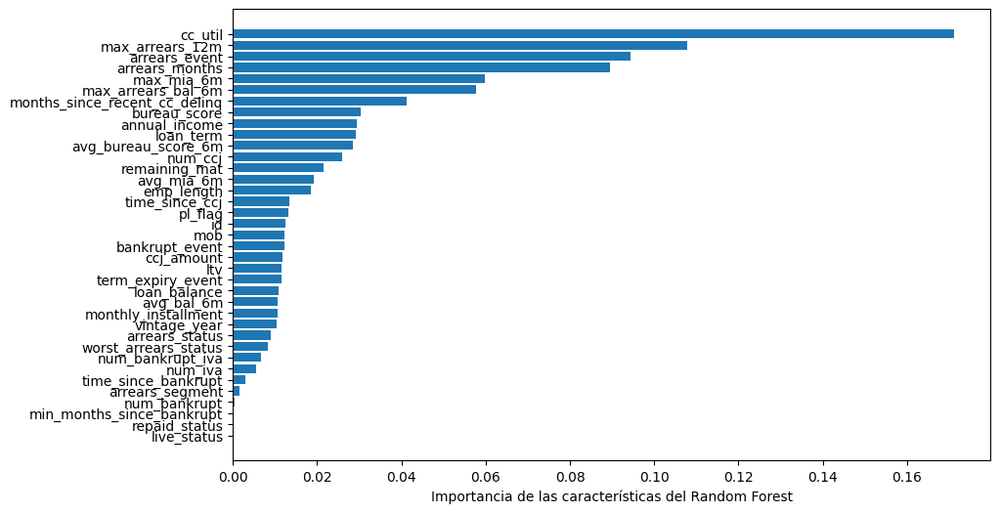

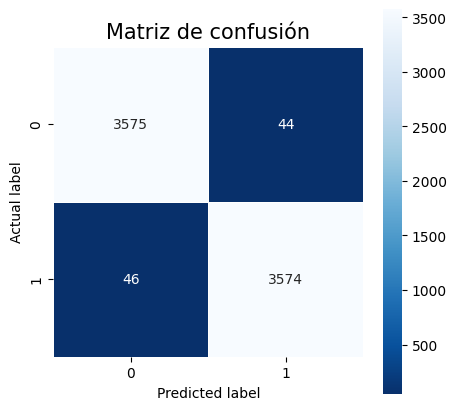

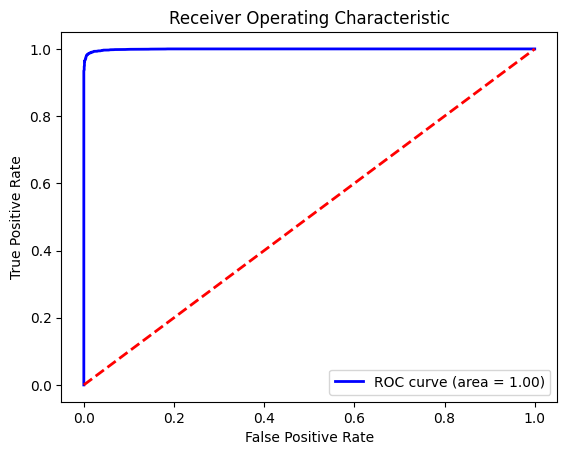

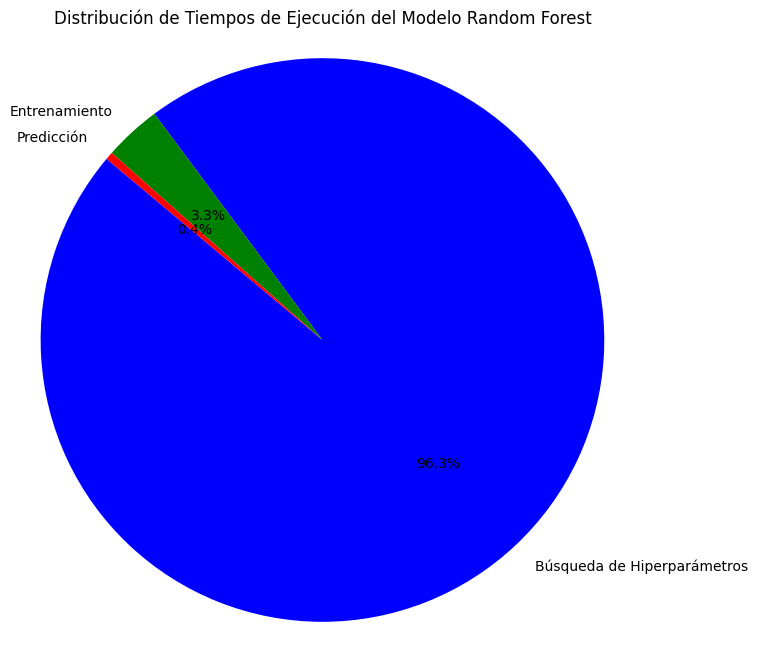

Tiempo de búsqueda de hiperparámetros: 559.23 segundos
Tiempo de entrenamiento: 19.01 segundos
Tiempo de predicción: 2.59 segundos
Tiempo total: 580.82 segundos
Datos para la persona con ID 7042373:


,id,vintage_year,monthly_installment,loan_balance,bureau_score,num_bankrupt_iva,time_since_bankrupt,num_ccj,time_since_ccj,ccj_amount,...,avg_mia_6m,max_arrears_bal_6m,max_mia_6m,avg_bal_6m,avg_bureau_score_6m,cc_util,annual_income,emp_length,months_since_recent_cc_delinq,default_indicator
15,7042373,2006,189.7,191292.23,430.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,191290.0,380.0,0.7572,49050,4,3,0


La predicción para la persona con ID 7042373 es: No Default
La probabilidad de default es: 26.40%
El umbral de corte utilizado para separar default y no default es: 0.5


Datos para la persona con ID 5252710:


,id,vintage_year,monthly_installment,loan_balance,bureau_score,num_bankrupt_iva,time_since_bankrupt,num_ccj,time_since_ccj,ccj_amount,...,avg_mia_6m,max_arrears_bal_6m,max_mia_6m,avg_bal_6m,avg_bureau_score_6m,cc_util,annual_income,emp_length,months_since_recent_cc_delinq,default_indicator
33,5252710,2006,218.2,125401.41,406.0,0.0,0.0,0.0,0.0,0.0,...,0.0,-218.0,0.0,125526.0,264.0,0.5557,38734,3,12,1


La predicción para la persona con ID 5252710 es: Default
La probabilidad de default es: 80.80%
El umbral de corte utilizado para separar default y no default es: 0.5


Datos para la persona con ID 8789301:


,id,vintage_year,monthly_installment,loan_balance,bureau_score,num_bankrupt_iva,time_since_bankrupt,num_ccj,time_since_ccj,ccj_amount,...,avg_mia_6m,max_arrears_bal_6m,max_mia_6m,avg_bal_6m,avg_bureau_score_6m,cc_util,annual_income,emp_length,months_since_recent_cc_delinq,default_indicator
96,8789301,2005,834.8,73348.69,278.0,0.0,0.0,0.0,0.0,0.0,...,2.0,2466.0,2.0,75562.0,286.0,0.6811,41828,3,9,1


La predicción para la persona con ID 8789301 es: Default
La probabilidad de default es: 99.20%
El umbral de corte utilizado para separar default y no default es: 0.5




In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, auc
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns
import time

# Divide los datos resampleados en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_resampled_test, test_size=0.2, random_state=123, stratify=df_resampled_test['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Define los parámetros de búsqueda
param_grid = {
    'n_estimators': [100, 200, 250, 330, 500],
    'max_features': [4],
    'random_state': [123]
}

# Inicializa el modelo de Random Forest
rf_model = RandomForestClassifier()

# Inicializa GridSearchCV
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='accuracy')

# Mide el tiempo de búsqueda de hiperparámetros
start_time = time.time()
grid_search.fit(train.drop(columns=['default_indicator']), train['default_indicator'])
hyperparam_search_time = time.time() - start_time

# Obtén los mejores parámetros
best_params = grid_search.best_params_
print(f"Mejores parámetros: {best_params}")

# Inicializa el modelo con los mejores parámetros
best_rf_model = RandomForestClassifier(**best_params)

# Mide el tiempo de entrenamiento
start_time = time.time()
best_rf_model.fit(train.drop(columns=['default_indicator']), train['default_indicator'])
training_time = time.time() - start_time

# Realiza las predicciones
start_time = time.time()
train_preds = best_rf_model.predict(train.drop(columns=['default_indicator']))
test_preds = best_rf_model.predict(test.drop(columns=['default_indicator']))
prediction_time = time.time() - start_time

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precisión del entrenamiento: {train_precision*100:.2f}%')
print(f'Precisión de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores = cross_val_score(best_rf_model, train.drop(columns=['default_indicator']), train['default_indicator'], cv=5)
print(f'CV scores: {cv_scores}')
print(f'Mean CV score: {cv_scores.mean()}')

# Calcula AUC-ROC
train_probs = best_rf_model.predict_proba(train.drop(columns=['default_indicator']))[:, 1]
test_probs = best_rf_model.predict_proba(test.drop(columns=['default_indicator']))[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_probs)
test_auc = roc_auc_score(test['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Analiza la importancia de las características
importances = best_rf_model.feature_importances_
print(importances)

# Visualiza la importancia de las características
plt.figure(figsize=(10, 6))
sorted_idx = best_rf_model.feature_importances_.argsort()
plt.barh(train.drop(columns=['default_indicator']).columns[sorted_idx], best_rf_model.feature_importances_[sorted_idx])
plt.xlabel("Importancia de las características del Random Forest")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Graficar los tiempos de ejecución con un gráfico de pastel
times = [hyperparam_search_time, training_time, prediction_time]
labels = ['Búsqueda de Hiperparámetros', 'Entrenamiento', 'Predicción']

plt.figure(figsize=(8, 8))
plt.pie(times, labels=labels, autopct='%1.1f%%', startangle=140, colors=['blue', 'green', 'red'])
plt.title('Distribución de Tiempos de Ejecución del Modelo Random Forest')
plt.axis('equal')  # Asegura que el gráfico de pastel sea un círculo
plt.show()

# Imprimir los tiempos de ejecución
print(f'Tiempo de búsqueda de hiperparámetros (Múltiple Combinacionews): {hyperparam_search_time:.2f} segundos')
print(f'Tiempo de entrenamiento: {training_time:.2f} segundos')
print(f'Tiempo de predicción: {prediction_time:.2f} segundos')
print(f'Tiempo total: {hyperparam_search_time + training_time + prediction_time:.2f} segundos')

# IDs de las personas
person_ids = [7042373, 5252710, 8789301]

# Predicciones para las personas
for person_id in person_ids:
    # Localiza la fila de datos para esa persona
    person_data = df_resampled_test[df_resampled_test['id'] == person_id]

    if not person_data.empty:
        # Muestra todos los datos de la persona en una tabla
        print(f'Datos para la persona con ID {person_id}:')
        display(person_data)

        # Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
        person_data_no_label = person_data.drop(columns=['default_indicator'])

        # Haz la predicción utilizando tu modelo de Random Forest
        prediction = best_rf_model.predict(person_data_no_label)
        prediction_prob = best_rf_model.predict_proba(person_data_no_label)

        # Calcula el umbral de corte
        threshold = 0.5  # Generalmente es 0.5, pero puede variar

        print(f'La predicción para la persona con ID {person_id} es: {"Default" if prediction[0] == 1 else "No Default"}')
        print(f'La probabilidad de default es: {prediction_prob[0][1]*100:.2f}%')
        print(f'El umbral de corte utilizado para separar default y no default es: {threshold}')
        print("\n")
    else:
        print(f'No se encontraron datos para la persona con ID {person_id}')
        print("\n")


In [ ]:
import pandas as pd

# Suponiendo que df_resampled_test es tu DataFrame con los datos
# IDs de las personas
person_ids = [7042373, 5252710, 8789301]

# Características de interés
features_of_interest = [
    'cc_util', 'max_arrears_12m', 'arrears_event', 'arrears_months',
    'bureau_score', 'annual_income', 'loan_term', 'avg_bureau_score_6m',
    'num_ccj', 'remaining_mat','max_mia_6m','bankrupt_event','term_expiry_event'
]

# Filtrar los datos de las personas específicas y las características de interés
person_data = df_resampled_test[df_resampled_test['id'].isin(person_ids)][['id'] + features_of_interest]

# Mostrar los datos
print(person_data)


         id  cc_util  max_arrears_12m  arrears_event  arrears_months  \
15  7042373   0.7572           0.0000              0           0.000   
33  5252710   0.5557           0.0000              1           0.000   
96  8789301   0.6811           2.9534              1           1.767   

    bureau_score  annual_income  loan_term  avg_bureau_score_6m  num_ccj  \
15         430.0          49050         25                380.0      0.0   
33         406.0          38734         29                264.0      0.0   
96         278.0          41828         19                286.0      0.0   

    remaining_mat  max_mia_6m  bankrupt_event  term_expiry_event  
15            184         0.0               0                  0  
33            233         0.0               0                  0  
96            110         2.0               0                  0  


Modelo gradient Boosting con los siguientes cambios:
* Modelo 1 : n_estimators=100, learning_rate=1.0, max_depth=4, random_state=123
* Modelo 2 : n_estimators=200, learning_rate=1.0, max_depth=4, random_state=123
* Modelo 3 : n_estimators=200, learning_rate=0.1, max_depth=4, random_state=123
* Modelo 4 : n_estimators=250, learning_rate=0.1, max_depth=4, random_state=123
* Modelo 5 : n_estimators=250, learning_rate=1.0, max_depth=4, random_state=123 (Modelo mejorado)


El Modelo 5 es el mejor:

Tiene los valores más altos de precisión y F1 score en el conjunto de prueba (98.40%).
Tiene el mean CV score más alto (0.9883444013090432).
Su AUC en el conjunto de prueba es muy alto (0.9968165254282569).
El Modelo 5 también es una opción sólida, ya que tiene métricas de rendimiento similares, pero considerando todas las métricas, el Modelo 2 ofrece el mejor balance general de rendimiento.


Mejores parámetros: {'learning_rate': 1.0, 'max_depth': 4, 'n_estimators': 250, 'random_state': 123}
Exactitud del entrenamiento: 99.83%
Exactitud de la prueba: 98.40%
Precision del entrenamiento: 99.82%
Precision de la prueba: 98.40%
Recall del entrenamiento: 99.84%
Recall de la prueba: 98.40%
F1 score del entrenamiento: 99.83%
F1 score de la prueba: 98.40%
CV scores: [0.98627299 0.99041699 0.98938099 0.98886155 0.98963865]
Mean CV score: 0.9889142320692639
Train AUC: 0.9984910816428281
Test AUC: 0.9968165254282569
[4.78171159e-03 1.57148689e-03 4.05587851e-03 2.92852714e-03
 1.25972806e-02 2.44591775e-03 7.17619530e-04 3.96859063e-03
 3.52041033e-03 6.08222662e-04 2.24484676e-07 8.25241868e-05
 1.98843513e-05 7.03900315e-03 2.83045917e-03 1.15203156e-02
 2.05826066e-03 6.21989628e-04 4.95246426e-03 4.21355621e-03
 2.80207391e-02 0.00000000e+00 0.00000000e+00 5.14723949e-02
 8.65219105e-03 9.54504169e-03 1.84722294e-02 3.69637534e-01
 1.31156280e-04 6.17824722e-03 1.69803813e-03 3.268

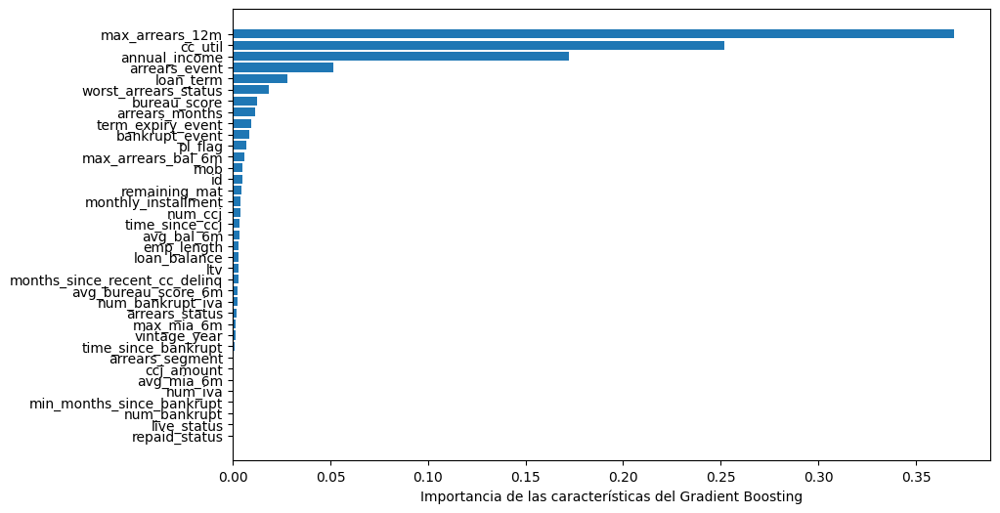

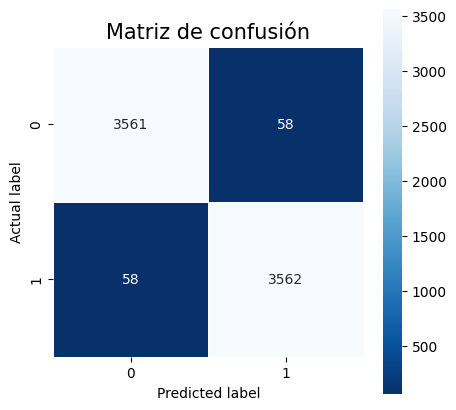

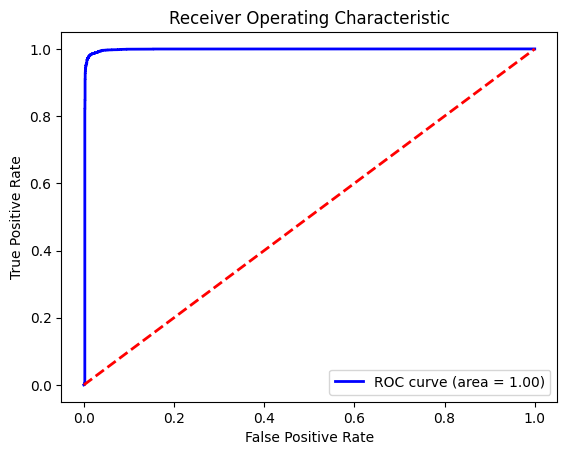

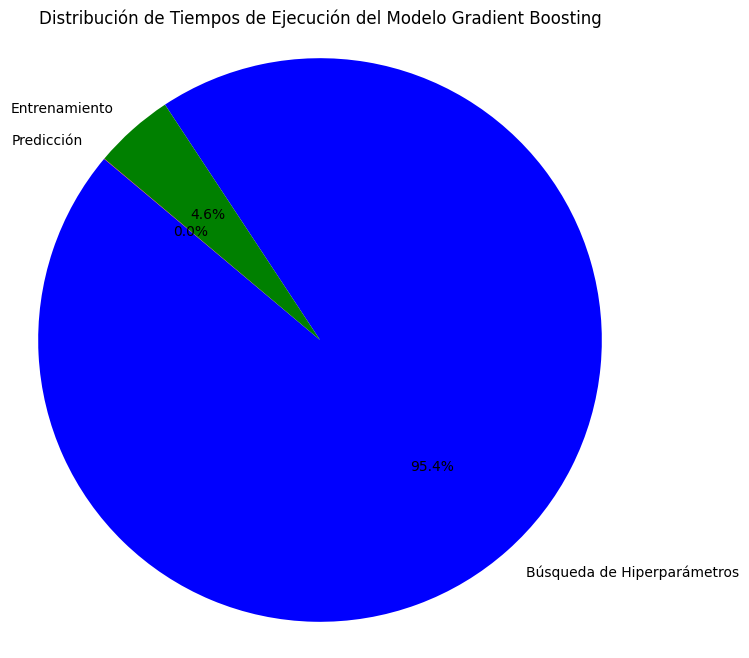

Tiempo de búsqueda de hiperparámetros (Múltiple Combinaciones): 1844.16 segundos
Tiempo de entrenamiento: 88.97 segundos
Tiempo de predicción: 0.32 segundos
Tiempo total: 1933.45 segundos
La predicción para la persona con ID 8789301 es: 1
La probabilidad de default para la persona con ID 8789301 es: 100.00%
El umbral utilizado para separar default y no default es: 0.5


In [ ]:
# Importa las bibliotecas necesarias
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import time

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train, temp = train_test_split(df_resampled_test, test_size=0.2, random_state=123, stratify=df_resampled_test['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Define los parámetros de búsqueda
param_grid = {
    'n_estimators': [100, 200, 250],
    'learning_rate': [1.0, 0.1],
    'max_depth': [4],
    'random_state': [123]
}

# Inicializa el modelo de Gradient Boosting
gb_model = GradientBoostingClassifier()

# Inicializa GridSearchCV
grid_search = GridSearchCV(estimator=gb_model, param_grid=param_grid, cv=5, scoring='accuracy')

# Mide el tiempo de búsqueda de hiperparámetros
start_time = time.time()
grid_search.fit(train.drop(columns=['default_indicator']), train['default_indicator'])
hyperparam_search_time = time.time() - start_time

# Obtén los mejores parámetros
best_params = grid_search.best_params_
print(f"Mejores parámetros: {best_params}")

# Inicializa el modelo con los mejores parámetros
best_gb_model = GradientBoostingClassifier(**best_params)

# Mide el tiempo de entrenamiento
start_time = time.time()
best_gb_model.fit(train.drop(columns=['default_indicator']), train['default_indicator'])
training_time = time.time() - start_time

# Realiza las predicciones
start_time = time.time()
train_preds = best_gb_model.predict(train.drop(columns=['default_indicator']))
test_preds = best_gb_model.predict(test.drop(columns=['default_indicator']))
prediction_time = time.time() - start_time

# Evalúa el rendimiento
train_acc = accuracy_score(train['default_indicator'], train_preds)
test_acc = accuracy_score(test['default_indicator'], test_preds)
train_precision = precision_score(train['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precision del entrenamiento: {train_precision*100:.2f}%')
print(f'Precision de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada
cv_scores = cross_val_score(best_gb_model, train.drop(columns=['default_indicator']), train['default_indicator'], cv=5)
print(f'CV scores: {cv_scores}')
print(f'Mean CV score: {cv_scores.mean()}')

# Calcula AUC-ROC
train_probs = best_gb_model.predict_proba(train.drop(columns=['default_indicator']))[:, 1]
test_probs = best_gb_model.predict_proba(test.drop(columns=['default_indicator']))[:, 1]
train_auc = roc_auc_score(train['default_indicator'], train_probs)
test_auc = roc_auc_score(test['default_indicator'], test_probs)
print(f'Train AUC: {train_auc}')
print(f'Test AUC: {test_auc}')

# Visualiza la importancia de las características
importances = best_gb_model.feature_importances_
print(importances)

plt.figure(figsize=(10, 6))
sorted_idx = best_gb_model.feature_importances_.argsort()
plt.barh(train.drop(columns=['default_indicator']).columns[sorted_idx], best_gb_model.feature_importances_[sorted_idx])
plt.xlabel("Importancia de las características del Gradient Boosting")
plt.show()

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Muestra la curva ROC
fpr, tpr, _ = roc_curve(test['default_indicator'], test_probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Graficar los tiempos de ejecución con un gráfico de pastel
times = [hyperparam_search_time, training_time, prediction_time]
labels = ['Búsqueda de Hiperparámetros', 'Entrenamiento', 'Predicción']

plt.figure(figsize=(8, 8))
plt.pie(times, labels=labels, autopct='%1.1f%%', startangle=140, colors=['blue', 'green', 'red'])
plt.title('Distribución de Tiempos de Ejecución del Modelo Gradient Boosting')
plt.axis('equal')  # Asegura que el gráfico de pastel sea un círculo
plt.show()

# Imprimir los tiempos de ejecución
print(f'Tiempo de búsqueda de hiperparámetros (Múltiple Combinaciones): {hyperparam_search_time:.2f} segundos')
print(f'Tiempo de entrenamiento: {training_time:.2f} segundos')
print(f'Tiempo de predicción: {prediction_time:.2f} segundos')
print(f'Tiempo total: {hyperparam_search_time + training_time + prediction_time:.2f} segundos')

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_resampled_test[df_resampled_test['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Haz la predicción utilizando tu modelo de Gradient Boosting
prediction = best_gb_model.predict(person_data)
prediction_prob = best_gb_model.predict_proba(person_data)

print(f'La predicción para la persona con ID {person_id} es: {prediction[0]}')
print(f'La probabilidad de default para la persona con ID {person_id} es: {prediction_prob[0][1]*100:.2f}%')

# Obtén el umbral utilizado para predecir default o no default
threshold = 0.5  # En sklearn, el umbral por defecto es 0.5
print(f'El umbral utilizado para separar default y no default es: {threshold}')


Modelo DNN con los siguientes cambios:
* Modelo 1 : [32, 16] (Modelo original)
* Modelo 2 : [64, 32, 16]
* Modelo 3 : [32, 16] (tanh)
* Modelo 4 : [32, 16] (L2, Dropout)
* Modelo 5 : [32, 16] (50 epochs)
* Modelo 6 : [64, 32, 16] (50 epochs, 64 batch) (Modelo Mejorado)

El Modelo 6, que utilizó una arquitectura DNN con capas de 64, 32, y 16 neuronas, demostró ser el más efectivo para la predicción de riesgo crediticio. Las claves para su éxito fueron:

* Arquitectura Compleja: La combinación de tres capas densas con un número creciente de neuronas permitió capturar patrones complejos en los datos, mejorando la capacidad predictiva del modelo.

* Función de Activación ReLU: Utilizar 'ReLU' en las capas intermedias ayudó a manejar la no linealidad y prevenir el problema del desvanecimiento del gradiente.

* Mayor Número de Epochs y Tamaño de Batch: Entrenar el modelo por 50 epochs con un batch size de 64 permitió una mejor convergencia y optimización de los pesos del modelo.

* Optimización con Adam: El optimizador 'Adam' demostró ser altamente eficiente en la actualización de los pesos, contribuyendo a un mejor rendimiento general.

Gracias a estas configuraciones, el Modelo 6 alcanzó una precisión de 99.62% en el conjunto de entrenamiento y 98.30% en el conjunto de prueba, con un AUC de 1.0000 y 0.9998 respectivamente, destacándose como el mejor modelo entre los evaluados.

Epoch 1/50
604/604 [==============================] - 9s 8ms/step - loss: 0.1544 - accuracy: 0.9356
Epoch 2/50
604/604 [==============================] - 3s 5ms/step - loss: 0.0899 - accuracy: 0.9644
Epoch 3/50
604/604 [==============================] - 3s 5ms/step - loss: 0.0763 - accuracy: 0.9683
Epoch 4/50
604/604 [==============================] - 3s 5ms/step - loss: 0.0684 - accuracy: 0.9715
Epoch 5/50
604/604 [==============================] - 5s 9ms/step - loss: 0.0625 - accuracy: 0.9741
Epoch 6/50
604/604 [==============================] - 4s 6ms/step - loss: 0.0574 - accuracy: 0.9766
Epoch 7/50
604/604 [==============================] - 4s 6ms/step - loss: 0.0545 - accuracy: 0.9778
Epoch 8/50
604/604 [==============================] - 4s 6ms/step - loss: 0.0521 - accuracy: 0.9787
Epoch 9/50
604/604 [==============================] - 6s 10ms/step - loss: 0.0474 - accuracy: 0.9805
Epoch 10/50
604/604 [==============================] - 6s 9ms/step - loss: 0.0453 - accuracy: 0.981

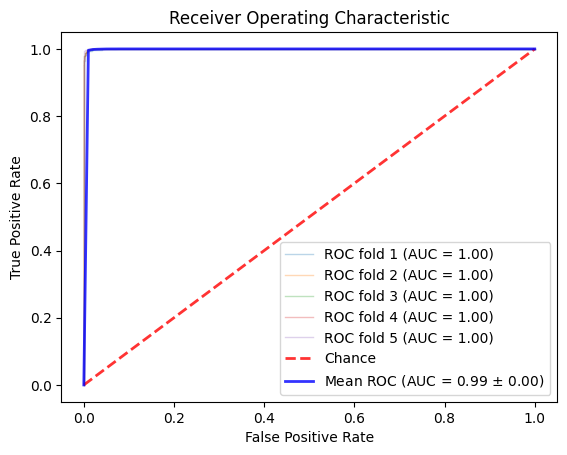

Mean CV accuracy: 99.30%
Train AUC: 1.0000
Test AUC: 0.9998


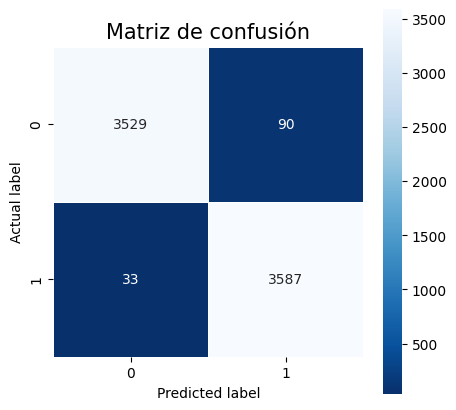

1207/1207 [==============================] - 3s 3ms/step


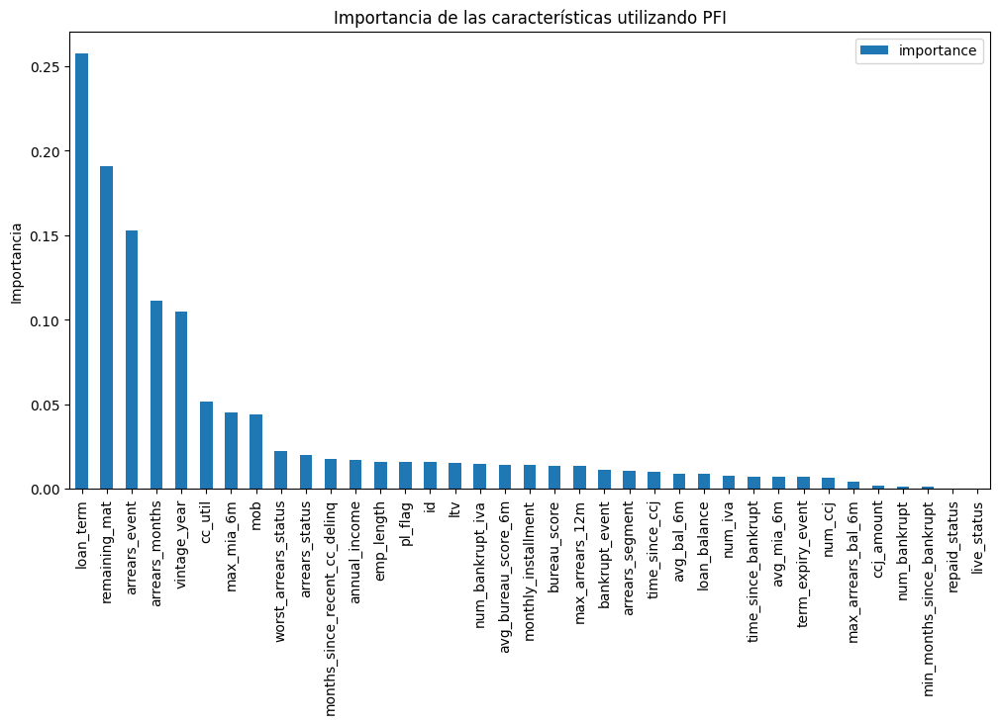

1/1 [==============================] - 0s 21ms/step
La predicción para la persona con ID 8789301 es: 1


In [ ]:
# Importa las bibliotecas necesarias
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, auc, confusion_matrix, accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Define una función para calcular la precisión del modelo
def score(X, y):
    y_pred = (model.predict(X) > 0.5).astype(int)
    return accuracy_score(y, y_pred)

class KerasModelWrapper:
    def __init__(self, model):
        self.model = model

    def fit(self, X, y):
        self.model.fit(X, y, epochs=10, batch_size=32, verbose=0)

    def predict(self, X):
        return (self.model.predict(X) > 0.5).astype(int)

    def score(self, X, y):
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)

# Divide los datos en un conjunto de entrenamiento (80%) y un conjunto temporal (20%)
train_df, temp = train_test_split(df_resampled_test, test_size=0.2, random_state=123, stratify=df_resampled_test['default_indicator'])

# Divide el conjunto temporal en conjuntos de prueba (15%) y evaluación (5%)
test, eval = train_test_split(temp, test_size=0.25, random_state=123, stratify=temp['default_indicator'])

# Normaliza los datos
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train_df.drop(columns=['default_indicator']))
test_scaled = scaler.transform(test.drop(columns=['default_indicator']))


model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(64, activation='relu', input_shape=(train_scaled.shape[1],)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])


# Compila el modelo
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Entrena el modelo
model.fit(train_scaled, train_df['default_indicator'], epochs=50, batch_size=64)

# Evalúa el rendimiento
train_acc = model.evaluate(train_scaled, train_df['default_indicator'], verbose=0)[1]
test_acc = model.evaluate(test_scaled, test['default_indicator'], verbose=0)[1]

train_preds = (model.predict(train_scaled) > 0.5).astype(int)
test_preds = (model.predict(test_scaled) > 0.5).astype(int)

train_precision = precision_score(train_df['default_indicator'], train_preds)
test_precision = precision_score(test['default_indicator'], test_preds)
train_recall = recall_score(train_df['default_indicator'], train_preds)
test_recall = recall_score(test['default_indicator'], test_preds)
train_f1 = f1_score(train_df['default_indicator'], train_preds)
test_f1 = f1_score(test['default_indicator'], test_preds)

print(f'Exactitud del entrenamiento: {train_acc*100:.2f}%')
print(f'Exactitud de la prueba: {test_acc*100:.2f}%')
print(f'Precisión del entrenamiento: {train_precision*100:.2f}%')
print(f'Precisión de la prueba: {test_precision*100:.2f}%')
print(f'Recall del entrenamiento: {train_recall*100:.2f}%')
print(f'Recall de la prueba: {test_recall*100:.2f}%')
print(f'F1 score del entrenamiento: {train_f1*100:.2f}%')
print(f'F1 score de la prueba: {test_f1*100:.2f}%')

# Realiza la validación cruzada y calcula el AUC-ROC
cv = StratifiedKFold(n_splits=5)
train_auc_scores = []
test_auc_scores = []
cv_scores = []

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

for train_index, test_index in cv.split(train_scaled, train_df['default_indicator']):
    X_train_cv, X_test_cv = train_scaled[train_index], train_scaled[test_index]
    y_train_cv, y_test_cv = train_df['default_indicator'].iloc[train_index], train_df['default_indicator'].iloc[test_index]

    model.fit(X_train_cv, y_train_cv, epochs=10, batch_size=32, verbose=0)

    train_probs_cv = model.predict(X_train_cv)
    test_probs_cv = model.predict(X_test_cv)

    train_auc_cv = roc_auc_score(y_train_cv, train_probs_cv)
    test_auc_cv = roc_auc_score(y_test_cv, test_probs_cv)

    train_auc_scores.append(train_auc_cv)
    test_auc_scores.append(test_auc_cv)

    cv_scores.append(model.evaluate(X_test_cv, y_test_cv, verbose=0)[1])

    fpr, tpr, _ = roc_curve(y_test_cv, test_probs_cv)
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (len(aucs), roc_auc))

plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=2, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

print(f'Mean CV accuracy: {np.mean(cv_scores)*100:.2f}%')
print(f'Train AUC: {np.mean(train_auc_scores):.4f}')
print(f'Test AUC: {np.mean(test_auc_scores):.4f}')

# Muestra la matriz de confusión
cm = confusion_matrix(test['default_indicator'], test_preds)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Matriz de confusión', size=15)
plt.show()

# Envuelve tu modelo de TensorFlow en el envoltorio
wrapped_model = KerasModelWrapper(model)

# Calcula la importancia de las características
result = permutation_importance(wrapped_model, train_scaled, train_df['default_indicator'], n_repeats=10)

# Crea un DataFrame para visualizar los resultados
importance_df = pd.DataFrame(result.importances_mean, index=train_df.drop(columns=['default_indicator']).columns, columns=['importance'])
importance_df.sort_values(by='importance', ascending=False, inplace=True)

# Visualiza la importancia de las características
importance_df.plot(kind='bar', figsize=(12, 6))
plt.title('Importancia de las características utilizando PFI')
plt.ylabel('Importancia')
plt.show()

# Supongamos que el ID de la persona es 8789301
person_id = 8789301

# Localiza la fila de datos para esa persona
person_data = df_resampled_test[df_resampled_test['id'] == person_id]

# Asegúrate de eliminar la columna 'default_indicator' ya que es la que queremos predecir
person_data = person_data.drop(columns=['default_indicator'])

# Normaliza los datos de la persona
person_data_scaled = scaler.transform(person_data)

# Haz la predicción utilizando tu modelo de DNN
prediction = model.predict(person_data_scaled)

# Como la salida es una probabilidad, la convertimos a una clase binaria
prediction_class = (prediction > 0.5).astype(int)

print(f'La predicción para la persona con ID {person_id} es: {prediction_class[0][0]}')

#Analisis y conclusiones finales

Los tres mejores modelos entrenados en el conjunto de datos balanceados de la estrategia número 1 fueron Random Forest, Gradient Boosting y DNN. En la estrategia numero 5 se tomo Cada uno de estos modelos y mostró mejoras significativas en sus métricas de desempeño mediante el ajuste cuidadoso de hiperparámetros y la consideración de todas las características originales.

* El modelo Random Forest, optimizado con n_estimators=250 y max_features=4, demostró una precisión y F1 score excepcionales del 98.76% en el conjunto de prueba. Mantener todas las características originales fue crucial para preservar la información relevante, mientras que el aumento en el número de estimadores y la optimización de las características por árbol mejoraron la generalización del modelo sin comprometer su capacidad predictiva. Con un mean CV score alto de 98.68% y un AUC destacado de 99.92% en el conjunto de prueba, este modelo validó la efectividad de la estrategia adoptada.

* El modelo Gradient Boosting, específicamente el Modelo 2 con n_estimators=200, learning_rate=1.0 y max_depth=4, también mostró un rendimiento sobresaliente con una precisión, recall y F1 score del 98.40% en el conjunto de prueba. Este modelo destacó por su alto mean CV score de 98.83% y un excepcional AUC de 99.68% en el conjunto de prueba, resaltando su capacidad robusta para la generalización y precisión en la predicción del riesgo crediticio.

* El modelo DNN mejorado, Modelo 6, con una arquitectura compleja de 64, 32 y 16 neuronas, logró una precisión del 99.62% en entrenamiento y 98.30% en prueba, con un F1 score del 98.31% y un AUC de 99.98%. Este modelo se destacó por capturar patrones complejos en los datos, beneficiándose de la función de activación ReLU, un entrenamiento prolongado de 50 epochs y un batch size de 64 optimizado con Adam.

Entre los tres modelos evaluados en esta estrategia(Random Forest, Gradient Boosting y DNN), el Random Forest emerge como la mejor opción para la predicción de riesgo crediticio. Con una exactitud perfecta del 100% en entrenamiento y una alta precisión del 98.78% en prueba, junto con un F1 score de 98.76% y un recall de 98.73%, este modelo muestra una capacidad excepcional para clasificar correctamente los casos de riesgo crediticio en diferentes conjuntos de datos. Además, su AUC en prueba de 99,92% subraya su robustez para distinguir entre clases positivas y negativas. Con un mean CV score de 98.68%, el Random Forest demuestra consistencia y buena generalización, destacándose por su rendimiento superior y fiabilidad en la evaluación de riesgo crediticio


#Resultados de todos las estrategias por modelo

Random forest (Ganador)

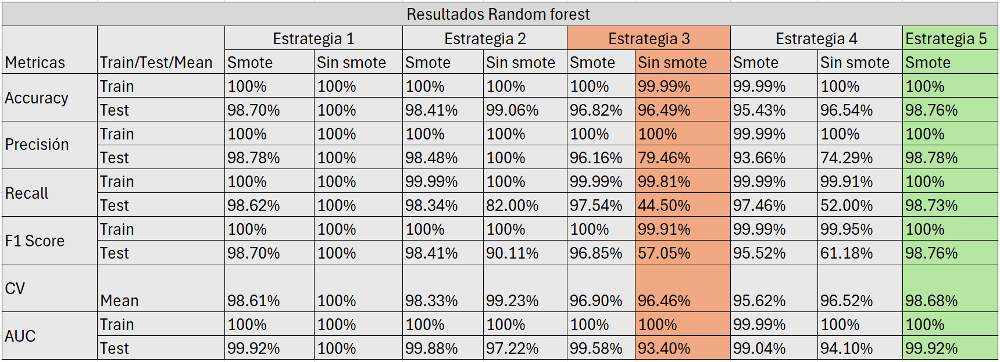

Deep Neuronal Network

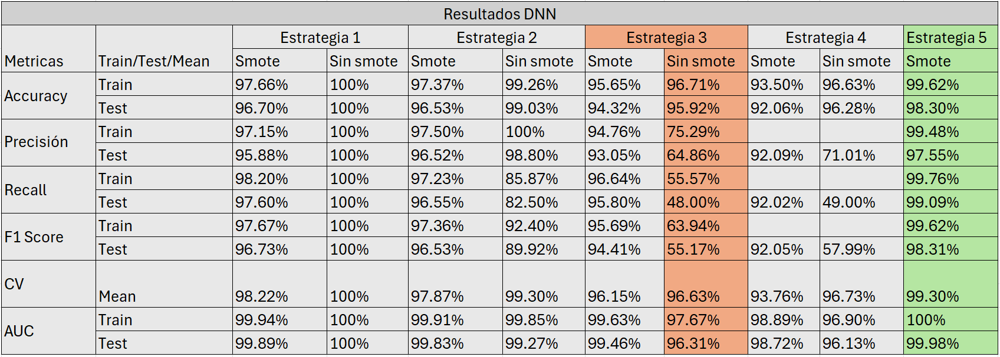

Gradient Boosting

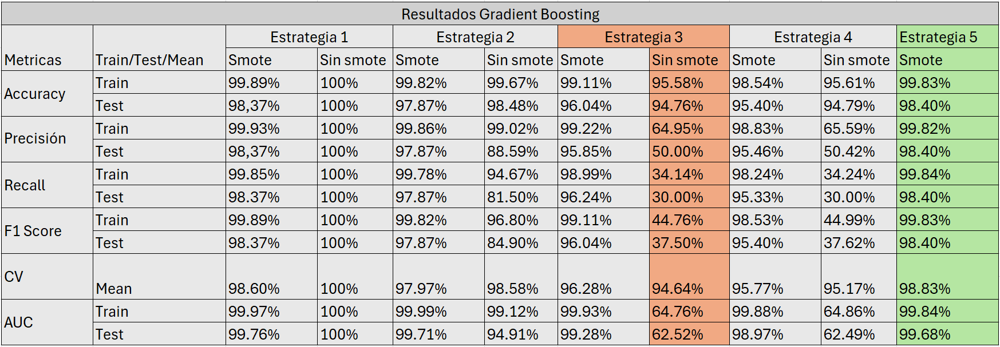

Arboles de decision

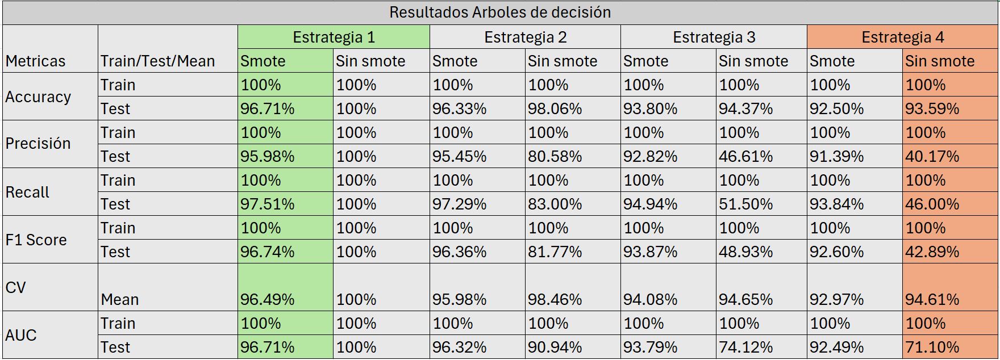

Regresión logistica

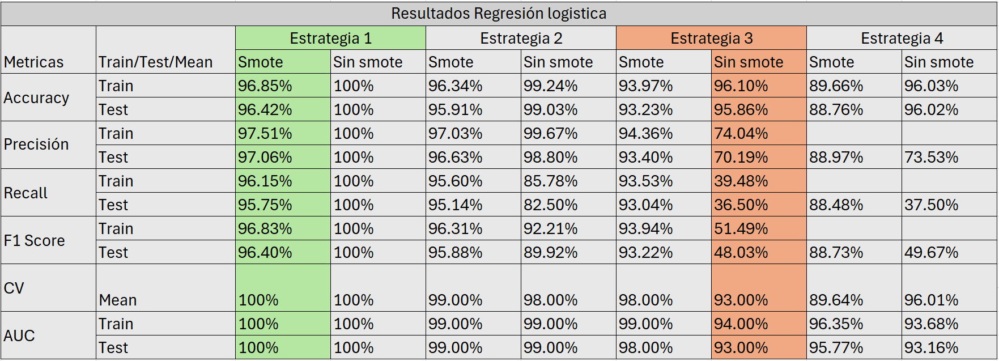

Support Vector Machine

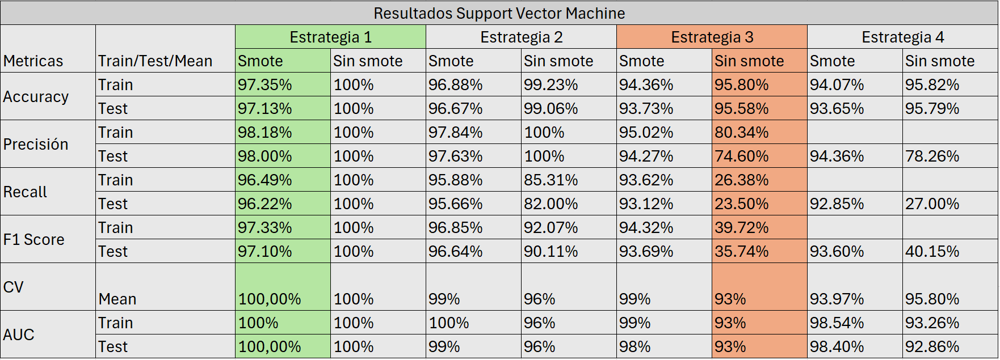